In [31]:
import sys
import os
from IPython.display import Image
import json
import cv2 as cv
from collections import defaultdict
import pickle
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import xml.dom.minidom as minidom
import xml.etree.cElementTree as cet
import xml.etree.ElementTree as et
%matplotlib inline

['/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/OCR/445-frames-our-scenario/Cruzamento1/2015-03-27-16-00-01/frame026755.txt', '/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/OCR/445-frames-our-scenario/Cruzamento1/2015-03-27-16-00-01/frame000160.txt', '/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/OCR/445-frames-our-scenario/Cruzamento1/2015-03-27-16-00-01/frame023695.txt', '/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/OCR/445-frames-our-scenario/Cruzamento1/2015-03-27-16-00-01/frame002160.txt', '/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/OCR/445-frames-our-scenario/Cruzamento1/2015-03-27-16-00-01/frame001815.txt', '/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/OCR/445-frames-our-scenario/Cruzamento1/2015-03-27-16-00-01/frame001790.txt', '/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/OCR/445-frames-our-scenario/Cruzamento1/2015-03-27-16-00-01/frame029045.txt', '/hom

In [34]:
def parse_data_point(datum):
    fields = datum.split(" ")
    path = fields[1].replace("/home/rayson/Desktop/Icaro/","")
    camera,setno,classes,nameplate,frame_no = path.split("/")
    return camera,setno,nameplate,frame_no
dataset_contents=open("dataset_info.txt","r").readlines()
print(len(dataset_contents))
frame_contents=defaultdict(list)
folder_pathinfo_dict = defaultdict(set)
for datum in dataset_contents[1:]:
    camera,setno,nameplate,frame_no=parse_data_point(datum)
    folder_pathinfo_dict[nameplate].add(setno)
    frame_contents[(nameplate,camera)].append(frame_no)
print("Number of numplates:",len(folder_pathinfo_dict.keys()))
print(frame_contents[('aaa-7756','Camera2')])
print(folder_pathinfo_dict)



26170
Number of numplates: 1718
['31481.png', '31482.png', '31483.png', '31484.png', '31485.png', '31486.png', '31487.png', '31488.png', '31489.png', '31490.png']
defaultdict(<class 'set'>, {'aaa-7756': {'Set01'}, 'aaw-1333': {'Set05', 'Set01'}, 'abu-2595': {'Set01'}, 'abx-9898': {'Set01'}, 'aca-3377': {'Set01'}, 'acs-9007': {'Set01'}, 'ada-6622': {'Set01'}, 'add-3999': {'Set01'}, 'adq-9259': {'Set01'}, 'adz-7773': {'Set01'}, 'aeq-4747': {'Set01'}, 'aex-8880': {'Set01'}, 'afi-0484': {'Set01'}, 'afx-0082': {'Set01'}, 'age-2705': {'Set01'}, 'age-8131': {'Set01'}, 'agk-3636': {'Set01'}, 'agv-9919': {'Set01'}, 'ahc-9556': {'Set01'}, 'aib-4993': {'Set01'}, 'aiz-6766': {'Set01'}, 'aja-5941': {'Set01'}, 'aja-6446': {'Set01'}, 'ajd-4721': {'Set01'}, 'ajh-2781': {'Set01'}, 'ajr-5223': {'Set01'}, 'aju-4377': {'Set01'}, 'ajy-0700': {'Set01'}, 'ajz-5011': {'Set01'}, 'ajz-9711': {'Set01'}, 'ake-4178': {'Set01'}, 'ake-9113': {'Set01'}, 'akn-0076': {'Set01'}, 'akz-5316': {'Set01'}, 'alf-7073': {'Set0

Set01
./Camera1/Set01/classes_carros/aaa-7756/
28896.png
(530, 433)
(256, 256)


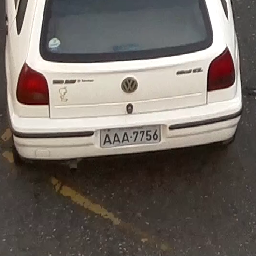

In [35]:
nameplate ='aaa-7756'
camera = 'Camera1'
classes = 'classes_carros'
setno = list(folder_pathinfo_dict[nameplate]).pop()
print(setno)
frameno=frame_contents[(nameplate,'Camera1')]
image_name = frameno[0]
image_folder = "./"+camera+"/"+setno+"/"+classes+"/"+nameplate+"/"
print(image_folder)
print(image_name)
def get_image(image_folder,image_name):
    filename=image_folder+image_name
    img = Image(filename=filename)
    return img
def get_pil_image(image_folder,image_name):
    from PIL import Image
    filename=image_folder+image_name
    img = Image.open(filename)    # Open image as PIL image object
    return img
def get_cv_image(image_folder,image_name):
    filename=image_folder+image_name
    img = cv.imread(filename=filename)
    return img
img = get_pil_image(image_folder,image_name)
img
print(img.size)
rsize = img.resize((256,256)) # Use PIL to resize
print(rsize.size)
rsize
# img = get_image(image_folder,image_name)
# img
# image = get_cv_image(image_folder,image_name)
# print(image.shape)
# plt.imshow(image)
# # display that image
# plt.show()
# #print(image.shape)

In [80]:
def read_xml(xml_file):
    tree = et.parse(xml_file)
    root = tree.getroot()
    plates=[]
    path1 = xml_file.split("/")
    path1 = os.path.join(path1[0], path1[2], path1[3], 'classes')
    plate_contents={}
    for idoc in root:
        if idoc.tag == 'gtruth':
            root = cet.Element('GroundTruthRoot')
            doc = cet.SubElement(root, 'gtruth')
            
            for vehicle in idoc:
                
                if vehicle.tag == 'vehicle':
                    if vehicle.attrib.get("discard") == "True": # or vehicle.attrib.get("quality") == "False":
                        continue
                bounding_box = [region for region in vehicle][0]
                h=bounding_box.attrib.get('h')
                w=bounding_box.attrib.get('w')
                x=bounding_box.attrib.get('x')
                y=bounding_box.attrib.get('y')
                
                placa = vehicle.attrib.get('placa')
                if len(placa) > 0:
                    
                    frame = vehicle.attrib.get('iframe')
                    brand = vehicle.attrib.get('brand').lower()
                    color = vehicle.attrib.get('color').lower()
                    model = vehicle.attrib.get('model').lower()
                    year = vehicle.attrib.get('year')
                    plate_contents[placa] = ([h,w,x,y],{'brand':brand, 'color':color, 'model':model})
#                     plates.append((placa,[h,w,x,y],{'brand':brand, 'color':color, 'model':model, 'year':year}))
                    
    return plate_contents

In [81]:
plates = read_xml("./xmls/Camera1/Set01/vehicles.xml")

In [282]:
def construct_csv_data(filename,label = 'brand'):
    import csv
    cameras = ['Camera1','Camera2']
    sets = ['Set01','Set02','Set03','Set04','Set05']
    plate_info = {'Camera1' :{}, 'Camera2' :{}}
    
    fields =['id','label']
    rows = []
    for camera in cameras:
        for set_no in sets:
            xml_file = "./xmls/"+camera+"/"+set_no+"/vehicles.xml"
            plate_info[camera].update(read_xml(xml_file))

    for key in frame_contents.keys():
        nameplate,camera = key
        frames = frame_contents[key]
        if len(frames) > 0:
            setno = list(folder_pathinfo_dict[nameplate]).pop()
            if nameplate in plate_info[camera].keys():
                bb_info,attributes = plate_info[camera][nameplate]
                class_label = None
                if label == 'bounding_box':
                    class_label = bb_info
                else:
                    class_label = attributes[label]
                for frame in frames:
                    path = camera+"/"+setno+"/"+"classes_carros/"+nameplate+"/"+frame
                    if os.path.exists(path):
                        row = [path,class_label]
                        rows.append(row)
    print(rows)
    with open(filename, 'w') as csvfile: 
        csvwriter = csv.writer(csvfile) 
        csvwriter.writerow(fields) 
        csvwriter.writerows(rows)
# construct_csv_data("colour.csv",'color')        
# construct_csv_data("bounding_boxes.csv",'bounding_box')

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [283]:
construct_csv_data("brand.csv",'brand')

[['Camera1/Set01/classes_carros/aaa-7756/28896.png', 'volkswagen'], ['Camera1/Set01/classes_carros/aaa-7756/28897.png', 'volkswagen'], ['Camera1/Set01/classes_carros/aaa-7756/28898.png', 'volkswagen'], ['Camera1/Set01/classes_carros/aaa-7756/28899.png', 'volkswagen'], ['Camera1/Set01/classes_carros/aaa-7756/28900.png', 'volkswagen'], ['Camera1/Set01/classes_carros/aaa-7756/28901.png', 'volkswagen'], ['Camera1/Set01/classes_carros/aaa-7756/28902.png', 'volkswagen'], ['Camera1/Set01/classes_carros/aaa-7756/28903.png', 'volkswagen'], ['Camera1/Set01/classes_carros/aaa-7756/28904.png', 'volkswagen'], ['Camera1/Set01/classes_carros/aaa-7756/28905.png', 'volkswagen'], ['Camera1/Set01/classes_carros/aaw-1333/24159.png', 'volkswagen'], ['Camera1/Set01/classes_carros/aaw-1333/24160.png', 'volkswagen'], ['Camera1/Set01/classes_carros/aaw-1333/24161.png', 'volkswagen'], ['Camera1/Set01/classes_carros/aaw-1333/24162.png', 'volkswagen'], ['Camera1/Set01/classes_carros/aaw-1333/24163.png', 'volkswag

In [231]:
import pandas as pd 
dataset = pd.read_csv('./bounding_boxes.csv')
dataset.head()

,id,label
0,Camera1/Set01/classes_carros/aaa-7756/28896.png,"['48', '130', '412', '848']"
1,Camera1/Set01/classes_carros/aaa-7756/28897.png,"['48', '130', '412', '848']"
2,Camera1/Set01/classes_carros/aaa-7756/28898.png,"['48', '130', '412', '848']"
3,Camera1/Set01/classes_carros/aaa-7756/28899.png,"['48', '130', '412', '848']"
4,Camera1/Set01/classes_carros/aaa-7756/28900.png,"['48', '130', '412', '848']"


Camera1/Set01/classes_carros/age-8131/15932.png [40, 126, 1600, 984]
Given image 521 297
434.16666666666663 270.6
width factor 3.685220729366603
height factor 3.6363636363636362
Given x,y 1600 984
Scaled 5896 3578
208 173


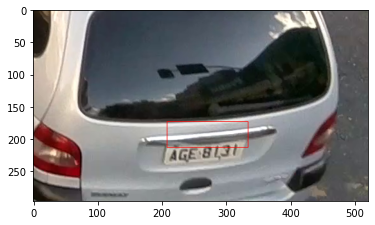

In [15]:
def write_matplotlib_image(out_image_folder,image_name,img):
    outfile = out_image_folder+image_name
    cv.imwrite(outfile, img)
#     out_img = get_image(out_image_folder,image_name)
    out_img = mpimg.imread(out_image_folder+image_name)
    return out_img

def overlay_image_with_bb(img,bb_info):
    overlayed_img = img.copy()
    
    h,w,x,y = bb_info
    height,width,channels=img.shape
    print("Given image",width,height)
    WIDTH=1920
    HEIGHT=1080 
    height_factor=HEIGHT/height
    width_factor=WIDTH/width
    print(x/width_factor,y/height_factor)
    print("width factor",width_factor)
    print("height factor",height_factor)
    print("Given x,y",x,y)
    x = int(x*width_factor)
    y = int(y*height_factor)
    print("Scaled",x,y)
    x=int(width/2.5)
    y=int(height/2.5)+55
#     x=int(x*0.5)
#     y=int(y*0.25)
    print(x,y)
    cv.rectangle(overlayed_img, (x, y), (x + w, y + h), (0, 0, 255), 1)
    return overlayed_img

import pandas as pd 
dataset = pd.read_csv('./bounding_boxes.csv')
dataset.head()
idx=150
image_name = dataset['id'].iloc[idx]
bb = dataset['label'].iloc[idx]
bb=bb.replace("[","").replace("]","").replace("'","").replace(" ","")
bb_info = list(map(int,bb.split(",")))
print(image_name,bb_info)
image_folder="./"
img = cv.imread(image_folder+image_name)
image = overlay_image_with_bb(img,bb_info)
mimage=write_matplotlib_image("./sample/","test.png",image)
plt.imshow(mimage)

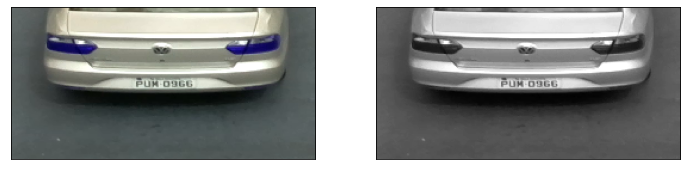

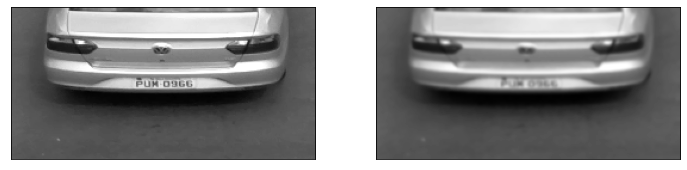

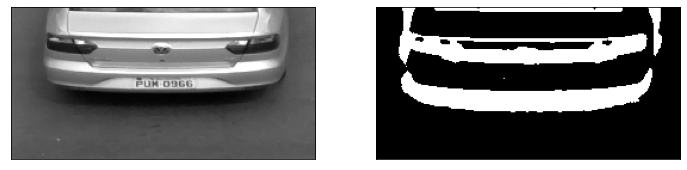

In [79]:
img = cv.imread(image_folder+image_name)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
plot_images(img,gray)
(thresh, im_bw) = cv.threshold(gray, 128, 255, cv.THRESH_BINARY)
# plot_images(gray,im_bw)
blurred = cv.GaussianBlur(gray, (5, 5), 0)
plot_images(gray,blurred)
thresh = cv.adaptiveThreshold(blurred, 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY_INV, 45, 15)
plot_images(gray,thresh)

In [234]:
def plot_images(img1, img2, title1="", title2=""):
    fig = plt.figure(figsize=[12,12])
    ax1 = fig.add_subplot(121)
    ax1.imshow(img1, cmap="gray")
    ax1.set(xticks=[], yticks=[], title=title1)

    ax2 = fig.add_subplot(122)
    ax2.imshow(img2, cmap="gray")
    ax2.set(xticks=[], yticks=[], title=title2)
img = cv.imread(image_folder+image_name)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
plot_images(img,gray)
blur = cv.bilateralFilter(gray, 11,90, 90)
plot_images(gray, blur)
edges = cv.Canny(blur, 30, 200)
plot_images(blur, edges)
img_contours,contours,hierarchy = cv.findContours(edges.copy(), cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
img_copy = img.copy()
cv.drawContours(img_copy,contours, -1, (255,0,255),2)
plot_images(img, img_copy)
plate = None
for c in contours:
    perimeter = cv.arcLength(c, True)
    print(perimeter)
    edges_count = cv.approxPolyDP(c, 0.02 * perimeter, True)
    if len(edges_count) == 4:
        x,y,w,h = cv.boundingRect(c)
        plate = img[y:y+h, x:x+w]
        plot_images(plate,plate)
# cv.drawContours(img_copy, cnts, -1, (255,0,255),2)


error: OpenCV(3.4.2) /tmp/build/80754af9/opencv-suite_1535558553474/work/modules/imgproc/src/color.hpp:253: error: (-215:Assertion failed) VScn::contains(scn) && VDcn::contains(dcn) && VDepth::contains(depth) in function 'CvtHelper'


/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/OCR/445-frames-our-scenario/Cruzamento2/2015-03-27-16-00-01/frame001960.jpg [496, 867, 156, 50]
1920 1080
1.7777777777777777
0.5625
881 487
540 910


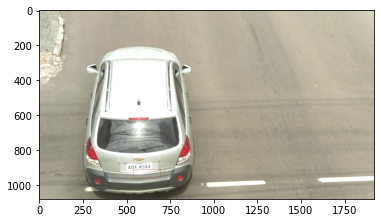

In [33]:

import glob
camera1_path = "/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/OCR/445-frames-our-scenario/Cruzamento1/2015-03-27-16-00-01"
camera2_path = "/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/OCR/445-frames-our-scenario/Cruzamento2/2015-03-27-16-00-01"

file_list1 = set([frame[:-4] for frame in os.listdir(camera1_path)])
file_list2 = set([frame[:-4] for frame in os.listdir(camera2_path)])

def overlay_with_bb(img,bb_info):
    overlayed_img = img.copy()
    
    x,y,w,h = bb_info
    width,height,channels=img.shape
    print(height,width)
    WIDTH=1920
    HEIGHT=1080 
    height_factor=1.0*height/HEIGHT
    width_factor=1.0*width/WIDTH
    print(height_factor)
    print(width_factor)
    
    x = int(x*height_factor)
    y = int(y*width_factor)
    print(x,y)
    x=int(width/2)
    y=int(height/2)-50
#     x=int(x*0.5)
#     y=int(y*0.25)
    print(x,y)
    cv.rectangle(overlayed_img, (x, y), (x + w, y + h), (0, 0, 255), 1)
    return overlayed_img


def get_bb_info(filename):
    nameplate_contents = open(filename,'r').readlines()[4]
#     print(nameplate_contents)
    bb_info = nameplate_contents.split(":")[1].strip("\n").split(" ")[1:]
    bb_info = list(map(int,bb_info))
#     print(bb_info)
    return bb_info

frame_info_1 = {}
frame_info_2 = {}
for frame in file_list1:
    frame_path = camera1_path+"/"+frame+".jpg"
    bb_info = get_bb_info(camera1_path+"/"+frame+".txt")
    frame_info_1[frame]=(frame_path,bb_info)

for frame in file_list2:
    frame_path = camera2_path+"/"+frame+".jpg"
    bb_info = get_bb_info(camera2_path+"/"+frame+".txt")
    frame_pathinfo_2[frame]=(frame_path,bb_info)

image_name,bb_info = frame_info_1['frame029175']
    
    
print(image_name,bb_info)
img = cv.imread(image_name)
image = overlay_with_bb(img,bb_info)
mimage=write_matplotlib_image("./sample/","test.jpg",image)
plt.imshow(mimage)    
    

(294, 538, 3)
x,y,w,h 195 194 148 50
(148, 50)
Nameplate Size 50 148
Image size 128 256
2.0 8.0
74.0 18.5
(128, 256, 3)
x,y,w,h 104 85 64 20


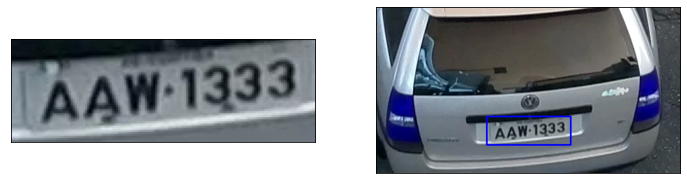

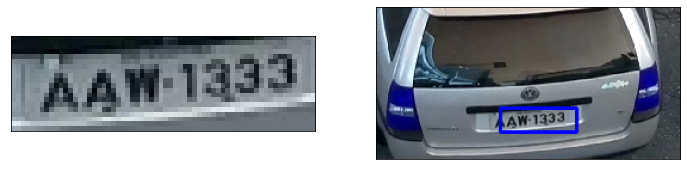

In [221]:
def get_nameplate(nameplate,car):
    method = cv.TM_SQDIFF_NORMED

    # Read the images from the file
    small_image = cv.imread(nameplate)
    large_image = cv.imread(car)
#     resized_large = cv.resize(large_image, (64, 64), 0, 0, interpolation = cv.INTER_NEAREST)
    result = cv.matchTemplate(small_image, large_image, method)
    print(large_image.shape)
#     print(resized_large.shape)
    # We want the minimum squared difference
    mn,_,mnLoc,_ = cv.minMaxLoc(result)

    # Draw the rectangle:
    # Extract the coordinates of our best match
    MPx,MPy = mnLoc

    # Step 2: Get the size of the template. This is the same size as the match.
    trows,tcols = small_image.shape[:2]
    print("x,y,w,h",MPx,MPy,tcols,trows)
    # Step 3: Draw the rectangle on large_image
    cv.rectangle(large_image, (MPx,MPy),(MPx+tcols,MPy+trows),(0,0,255),2)
    
    plot_images(small_image,large_image)
#     plot_images(resized_large,resized_large)
nameplate = "./Camera1/Set01/classes/aaw-1333/24159.png"
car = "./Camera1/Set01/classes_carros/aaw-1333/24159.png"
get_nameplate(nameplate,car)
from PIL import Image 
import PIL 
pil_image = Image.open(car)
newsize = (256, 128)
pil_image = pil_image.resize(newsize)
pil_image.save("./sample/test.png")
pil_image_n = Image.open(nameplate)
print(pil_image_n.size)
h_n,w_n=pil_image_n.size
y_ = imageToPredict.shape[0]
x_ = imageToPredict.shape[1]
targetSize_x = 256
targetSize_y = 128
x_scale = targetSize_x / x_
y_scale = targetSize_y / y_

print("Nameplate Size",w_n,h_n)
h,w=pil_image.size
print("Image size",w,h)
target_h = 32
target_w = 64
scaling_factor_h = h/target_h
scaling_factor_w = w/target_w
print(scaling_factor_w,scaling_factor_h)
reduced_h = h_n/scaling_factor_h
reduced_w = h_n/scaling_factor_w
print(reduced_w,reduced_h)
# newsize = (256, 128)
newsize_n = (64,20)
pil_image = pil_image.resize(newsize)
pil_image_n = pil_image_n.resize(newsize_n)
pil_image.save("./sample/test.png")
pil_image_n.save("./sample/test_n.png")
get_nameplate("./sample/test_n.png","./sample/test.png")
# nameplate = "./Camera1/Set01/classes/aaw-1333/24168.png"
# car = "./Camera1/Set01/classes_carros/aaw-1333/24168.png"
# get_nameplate(nameplate,car)



(44, 146, 3)
(434, 536, 3)
[195, 195, 146, 44]
0.05970149253731343 0.07373271889400922
[12, 14, 8, 4]
[201, 190, 134, 54]


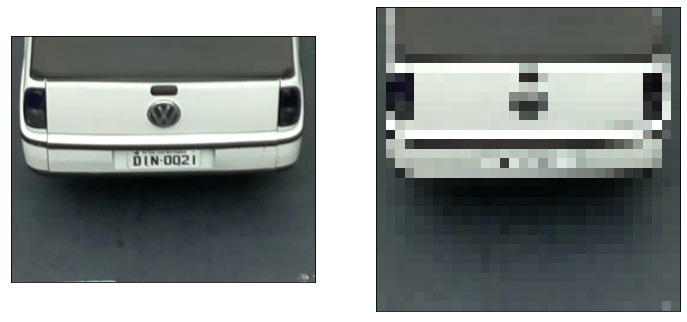

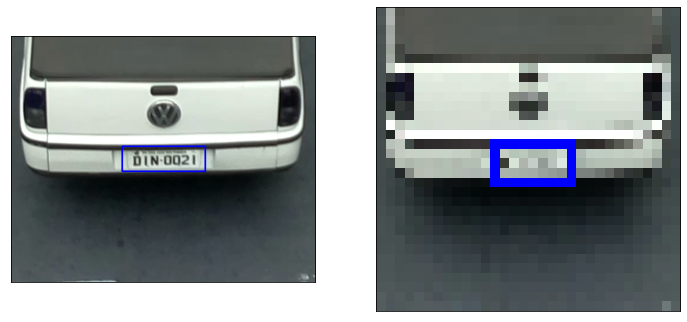

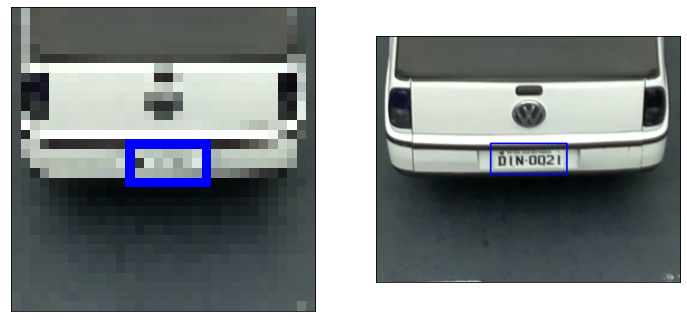

In [249]:
def scale_bb(bb,x_scale,y_scale):
    x,y,w,h = bb
    (origLeft, origTop, origRight, origBottom) = (x,y,x+w,y+h)
    xmin = int(np.round(origLeft * x_scale))
    ymin = int(np.round(origTop * y_scale))
    xmax = int(np.round(origRight * x_scale))
    ymax = int(np.round(origBottom * y_scale))
    return [xmin,ymin,xmax-xmin,ymax-ymin]
    
    
    
def get_nameplate(nameplate,car):
    method = cv.TM_SQDIFF_NORMED

    small_image = cv.imread(nameplate)
    large_image = cv.imread(car)

    result = cv.matchTemplate(small_image, large_image, method)
    print(large_image.shape)
#     print(resized_large.shape)
    # We want the minimum squared difference
    mn,_,mnLoc,_ = cv.minMaxLoc(result)

    # Draw the rectangle:
    # Extract the coordinates of our best match
    MPx,MPy = mnLoc

    # Step 2: Get the size of the template. This is the same size as the match.
    trows,tcols = small_image.shape[:2]
    print("x,y,w,h",MPx,MPy,tcols,trows)
    # Step 3: Draw the rectangle on large_image
    cv.rectangle(large_image, (MPx,MPy),(MPx+tcols,MPy+trows),(0,0,255),2)
    
    plot_images(small_image,large_image)
#     plot_images(resized_large,resized_large)
# nameplate = "./Camera1/Set01/classes/aaw-1333/24159.png"
# car = "./Camera1/Set01/classes_carros/aaw-1333/24159.png"
nameplate = "./Camera2/Set03/classes/din-0021/2788.png"
car = "./Camera2/Set03/classes_carros/din-0021/2788.png"
small_image = cv.imread(nameplate)
large_image = cv.imread(car)
large_image_copy = large_image.copy()
print(small_image.shape)
print(large_image.shape)
targetSize_x = 32
targetSize_y = 32
resized_img = cv.resize(large_image, (targetSize_x, targetSize_y));
plot_images(large_image,resized_img)
result = cv.matchTemplate(small_image, large_image, cv.TM_SQDIFF_NORMED)
_,_,coordinates,_ = cv.minMaxLoc(result)
x,y = coordinates
h,w = small_image.shape[:2]
print([x,y,w,h])
cv.rectangle(large_image, (x,y),(x+w,y+h),(0,0,255),2)
y_ = large_image.shape[0]
x_ = large_image.shape[1]
x_scale = targetSize_x / x_
y_scale = targetSize_y / y_
print(x_scale, y_scale)
(origLeft, origTop, origRight, origBottom) = (x,y,x+w,y+h)
xmin = int(np.round(origLeft * x_scale))
ymin = int(np.round(origTop * y_scale))
xmax = int(np.round(origRight * x_scale))
ymax = int(np.round(origBottom * y_scale))
(x_r,y_r,w_r,h_r) = (xmin,ymin,xmax-xmin,ymax-ymin)
cv.rectangle(resized_img, (x_r,y_r),(x_r+w_r,y_r+h_r),(0,0,255),1)
plot_images(large_image,resized_img)
bb=[x_r,y_r,w_r,h_r]
print(bb)
bb_scaled = scale_bb(bb,1/x_scale,1/y_scale)
print(bb_scaled)
x_s,y_s,w_s,h_s = bb_scaled
cv.rectangle(large_image_copy, (x_s,y_s),(x_s+w_s,y_s+h_s),(0,0,255),2)
plot_images(resized_img,large_image_copy)

In [152]:
from PIL import Image 
import PIL
import csv
def get_nameplate_bb(nameplate,car):
    method = cv.TM_SQDIFF_NORMED
#     print("Opening images",nameplate,car)
    # Read the images from the file
    small_image = cv.imread(nameplate)
    large_image = cv.imread(car)
#     print(small_image.shape,large_image.shape)
    result = cv.matchTemplate(small_image, large_image, method)

    # We want the minimum squared difference
    mn,_,mnLoc,_ = cv.minMaxLoc(result)

    # Draw the rectangle:
    # Extract the coordinates of our best match
    x,y = mnLoc

    # Step 2: Get the size of the template. This is the same size as the match.
    h,w = small_image.shape[:2]
    return [x,y,w,h]

new_car_shape = (256,128)
new_nameplate_shape = (64,20)
filename = "nameplate_bounding_box.csv"
rows = []
for key in frame_contents.keys():
    nameplate,camera = key
    frames = frame_contents[key]
    if len(frames) > 0:
        setno = list(folder_pathinfo_dict[nameplate]).pop()
        for frame in frames:
            car_path = camera+"/"+setno+"/"+"classes_carros/"+nameplate+"/"+frame
            nameplate_path = camera+"/"+setno+"/"+"classes/"+nameplate+"/"+frame
            resized_car_path = "ResizedNameplates/"+car_path
            resized_nameplate_path = "ResizedNameplates/"+nameplate_path
            if os.path.exists(car_path) and os.path.exists(nameplate_path):
                pil_car_image = Image.open(car_path)
                pil_nameplate_image = Image.open(nameplate_path)
                pil_car_image = pil_car_image.resize(new_car_shape)
                pil_nameplate_image = pil_nameplate_image.resize(new_nameplate_shape)
#                 print("Saving to",resized_car_path)
                pil_car_image.save(resized_car_path)
#                 print("Saving to",resized_nameplate_path)
                pil_nameplate_image.save(resized_nameplate_path)
                bb_info = get_nameplate_bb(resized_nameplate_path,resized_car_path)
                print(resized_car_path)
                print(bb_info)
                row = [resized_car_path,bb_info]
                print(row)
                rows.append(row)
            
with open(filename, 'w') as csvfile: 
    csvwriter = csv.writer(csvfile) 
    csvwriter.writerow(fields) 
    csvwriter.writerows(rows)


ResizedNameplates/Camera1/Set01/classes_carros/aaa-7756/28896.png
[96, 56, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aaa-7756/28896.png', [96, 56, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aaa-7756/28897.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aaa-7756/28897.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aaa-7756/28898.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aaa-7756/28898.png', [97, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aaa-7756/28899.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aaa-7756/28899.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aaa-7756/28900.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aaa-7756/28900.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aaa-7756/28901.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aaa-7756/2890

ResizedNameplates/Camera1/Set01/classes_carros/acs-9007/7873.png
[97, 70, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/acs-9007/7873.png', [97, 70, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/acs-9007/7874.png
[97, 61, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/acs-9007/7874.png', [97, 61, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/acs-9007/7875.png
[70, 31, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/acs-9007/7875.png', [70, 31, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/acs-9007/7876.png
[67, 31, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/acs-9007/7876.png', [67, 31, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/acs-9007/7877.png
[71, 32, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/acs-9007/7877.png', [71, 32, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/acs-9007/7878.png
[71, 32, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/acs-9007/7878.png', [71,

ResizedNameplates/Camera1/Set01/classes_carros/aeq-4747/19271.png
[101, 25, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aeq-4747/19271.png', [101, 25, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aeq-4747/19272.png
[106, 25, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aeq-4747/19272.png', [106, 25, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aeq-4747/19273.png
[113, 25, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aeq-4747/19273.png', [113, 25, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aeq-4747/19274.png
[100, 26, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aeq-4747/19274.png', [100, 26, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aeq-4747/19275.png
[107, 26, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aeq-4747/19275.png', [107, 26, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aeq-4747/19276.png
[115, 26, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ae

ResizedNameplates/Camera1/Set01/classes_carros/age-8131/15940.png
[123, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/age-8131/15940.png', [123, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/age-8131/15941.png
[122, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/age-8131/15941.png', [122, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/agk-3636/15624.png
[93, 74, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/agk-3636/15624.png', [93, 74, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/agk-3636/15625.png
[94, 62, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/agk-3636/15625.png', [94, 62, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/agk-3636/15626.png
[166, 11, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/agk-3636/15626.png', [166, 11, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/agk-3636/15627.png
[163, 14, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/agk-36

ResizedNameplates/Camera1/Set01/classes_carros/aja-5941/8705.png
[80, 2, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aja-5941/8705.png', [80, 2, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aja-5941/8706.png
[86, 4, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aja-5941/8706.png', [86, 4, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aja-5941/8707.png
[99, 5, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aja-5941/8707.png', [99, 5, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aja-5941/8708.png
[99, 7, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aja-5941/8708.png', [99, 7, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aja-5941/8709.png
[113, 8, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aja-5941/8709.png', [113, 8, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aja-5941/8710.png
[107, 10, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aja-5941/8710.png', [107, 10, 6

ResizedNameplates/Camera1/Set01/classes_carros/aju-4377/10386.png
[0, 108, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aju-4377/10386.png', [0, 108, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aju-4377/10387.png
[186, 82, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aju-4377/10387.png', [186, 82, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aju-4377/10388.png
[192, 85, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aju-4377/10388.png', [192, 85, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aju-4377/10389.png
[192, 59, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aju-4377/10389.png', [192, 59, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aju-4377/10390.png
[192, 69, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aju-4377/10390.png', [192, 69, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aju-4377/10391.png
[1, 98, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aju-43

ResizedNameplates/Camera1/Set01/classes_carros/ake-9113/3544.png
[93, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ake-9113/3544.png', [93, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ake-9113/3545.png
[93, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ake-9113/3545.png', [93, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ake-9113/3546.png
[92, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ake-9113/3546.png', [92, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ake-9113/3547.png
[91, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ake-9113/3547.png', [91, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ake-9113/3548.png
[91, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ake-9113/3548.png', [91, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ake-9113/3549.png
[92, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ake-9113/3549.png', [92,

ResizedNameplates/Camera1/Set01/classes_carros/alj-8237/19583.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/alj-8237/19583.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/alk-7227/27459.png
[96, 67, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/alk-7227/27459.png', [96, 67, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/alk-7227/27460.png
[96, 56, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/alk-7227/27460.png', [96, 56, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/alk-7227/27461.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/alk-7227/27461.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/alk-7227/27462.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/alk-7227/27462.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/alk-7227/27463.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/alk-7227/2746

ResizedNameplates/Camera1/Set01/classes_carros/amt-6430/26703.png
[118, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/amt-6430/26703.png', [118, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/amt-6430/26704.png
[109, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/amt-6430/26704.png', [109, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/amt-6430/26705.png
[105, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/amt-6430/26705.png', [105, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/amt-6430/26706.png
[101, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/amt-6430/26706.png', [101, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/amt-6430/26707.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/amt-6430/26707.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/amt-6430/26708.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/amt-6

ResizedNameplates/Camera1/Set01/classes_carros/anw-0503/13584.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/anw-0503/13584.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aoa-2661/8414.png
[95, 67, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aoa-2661/8414.png', [95, 67, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aoa-2661/8415.png
[192, 108, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aoa-2661/8415.png', [192, 108, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aoa-2661/8416.png
[192, 108, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aoa-2661/8416.png', [192, 108, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aoa-2661/8417.png
[191, 107, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aoa-2661/8417.png', [191, 107, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aoa-2661/8418.png
[176, 107, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aoa-2661

ResizedNameplates/Camera1/Set01/classes_carros/aou-8701/15854.png
[101, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aou-8701/15854.png', [101, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aou-8701/15855.png
[102, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aou-8701/15855.png', [102, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aou-8701/15856.png
[102, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aou-8701/15856.png', [102, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aou-8701/15857.png
[102, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aou-8701/15857.png', [102, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aou-8701/15858.png
[101, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aou-8701/15858.png', [101, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aou-8701/15859.png
[102, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ao

ResizedNameplates/Camera1/Set01/classes_carros/apr-5793/16918.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/apr-5793/16918.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/apr-5793/16919.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/apr-5793/16919.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/apv-2379/2943.png
[93, 47, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/apv-2379/2943.png', [93, 47, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/apv-2379/2944.png
[105, 39, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/apv-2379/2944.png', [105, 39, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/apv-2379/2945.png
[116, 35, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/apv-2379/2945.png', [116, 35, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/apv-2379/2946.png
[105, 36, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/apv-2379/2946.p

ResizedNameplates/Camera1/Set01/classes_carros/aqd-9058/16520.png
[85, 14, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aqd-9058/16520.png', [85, 14, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aqd-9058/16521.png
[74, 18, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aqd-9058/16521.png', [74, 18, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aqd-9058/16522.png
[75, 12, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aqd-9058/16522.png', [75, 12, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aqd-9058/16523.png
[191, 71, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aqd-9058/16523.png', [191, 71, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aqd-9058/16524.png
[191, 70, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aqd-9058/16524.png', [191, 70, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aqd-9058/16525.png
[188, 70, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aqd-9058

ResizedNameplates/Camera1/Set01/classes_carros/aqm-2596/11677.png
[124, 30, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aqm-2596/11677.png', [124, 30, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aqm-2596/11678.png
[121, 31, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aqm-2596/11678.png', [121, 31, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aqo-9117/18428.png
[96, 71, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aqo-9117/18428.png', [96, 71, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aqo-9117/18429.png
[122, 6, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aqo-9117/18429.png', [122, 6, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aqo-9117/18430.png
[125, 4, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aqo-9117/18430.png', [125, 4, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aqo-9117/18431.png
[123, 5, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aqo-9117/

ResizedNameplates/Camera1/Set01/classes_carros/aqw-3871/5566.png
[104, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aqw-3871/5566.png', [104, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aqw-3871/5567.png
[104, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aqw-3871/5567.png', [104, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aqw-3871/5568.png
[103, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aqw-3871/5568.png', [103, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aqw-3871/5569.png
[104, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aqw-3871/5569.png', [104, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aqw-3871/5570.png
[104, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aqw-3871/5570.png', [104, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aqw-3871/5571.png
[104, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aqw-3871/5571

ResizedNameplates/Camera1/Set01/classes_carros/arh-2037/801.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/arh-2037/801.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/arh-2037/802.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/arh-2037/802.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/arh-2037/803.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/arh-2037/803.png', [97, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/arh-2037/804.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/arh-2037/804.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/arj-1497/5691.png
[97, 67, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/arj-1497/5691.png', [97, 67, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/arj-1497/5692.png
[96, 59, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/arj-1497/5692.png', [96, 59, 64,

ResizedNameplates/Camera1/Set01/classes_carros/asd-8431/21190.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/asd-8431/21190.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/asd-8431/21191.png
[95, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/asd-8431/21191.png', [95, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/asd-8431/21192.png
[94, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/asd-8431/21192.png', [94, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/asd-8431/21193.png
[95, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/asd-8431/21193.png', [95, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/asd-8431/21194.png
[95, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/asd-8431/21194.png', [95, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/asd-8431/21195.png
[95, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/asd-8431/2119

ResizedNameplates/Camera1/Set01/classes_carros/asm-7213/13665.png
[94, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/asm-7213/13665.png', [94, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/asm-7213/13666.png
[95, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/asm-7213/13666.png', [95, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/asm-7213/13667.png
[94, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/asm-7213/13667.png', [94, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aso-4043/8474.png
[104, 63, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aso-4043/8474.png', [104, 63, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aso-4043/8475.png
[104, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aso-4043/8475.png', [104, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aso-4043/8476.png
[105, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aso-4043/8476

ResizedNameplates/Camera1/Set01/classes_carros/asz-5718/8604.png
[89, 5, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/asz-5718/8604.png', [89, 5, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/asz-5718/8605.png
[54, 7, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/asz-5718/8605.png', [54, 7, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/asz-5718/8606.png
[82, 7, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/asz-5718/8606.png', [82, 7, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/asz-5718/8607.png
[111, 7, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/asz-5718/8607.png', [111, 7, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/asz-5718/8608.png
[57, 9, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/asz-5718/8608.png', [57, 9, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/asz-5718/8609.png
[91, 9, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/asz-5718/8609.png', [91, 9, 64, 2

ResizedNameplates/Camera1/Set01/classes_carros/atd-9302/34236.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/atd-9302/34236.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/atd-9302/34237.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/atd-9302/34237.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/atd-9302/34238.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/atd-9302/34238.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/atd-9302/34239.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/atd-9302/34239.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/atd-9302/34240.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/atd-9302/34240.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ath-0921/751.png
[105, 80, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ath-0921/751.p

ResizedNameplates/Camera1/Set01/classes_carros/ato-1660/21023.png
[120, 18, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ato-1660/21023.png', [120, 18, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ato-1660/21024.png
[119, 19, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ato-1660/21024.png', [119, 19, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ato-1660/21025.png
[118, 19, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ato-1660/21025.png', [118, 19, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ato-1660/21026.png
[117, 20, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ato-1660/21026.png', [117, 20, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/att-6526/100.png
[94, 56, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/att-6526/100.png', [94, 56, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/att-6526/101.png
[90, 56, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/att-6526/10

ResizedNameplates/Camera1/Set01/classes_carros/atw-5217/13814.png
[96, 72, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/atw-5217/13814.png', [96, 72, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/atw-5217/13815.png
[96, 60, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/atw-5217/13815.png', [96, 60, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/atw-5217/13816.png
[166, 4, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/atw-5217/13816.png', [166, 4, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/atw-5217/13817.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/atw-5217/13817.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/atw-5217/13818.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/atw-5217/13818.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/atw-5217/13819.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/atw-5217/1381

ResizedNameplates/Camera1/Set01/classes_carros/atz-2376/26990.png
[98, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/atz-2376/26990.png', [98, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/atz-2376/26991.png
[98, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/atz-2376/26991.png', [98, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/atz-2376/26992.png
[97, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/atz-2376/26992.png', [97, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/atz-2376/26993.png
[97, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/atz-2376/26993.png', [97, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/atz-5311/20919.png
[104, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/atz-5311/20919.png', [104, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/atz-5311/20920.png
[105, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/atz-5311/2

ResizedNameplates/Camera1/Set01/classes_carros/aue-7343/8066.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aue-7343/8066.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aue-7343/8067.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aue-7343/8067.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aue-7343/8068.png
[93, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aue-7343/8068.png', [93, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aue-7343/8069.png
[93, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aue-7343/8069.png', [93, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aue-7343/8070.png
[92, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aue-7343/8070.png', [92, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aue-7343/8071.png
[92, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aue-7343/8071.png', [92,

ResizedNameplates/Camera1/Set01/classes_carros/auh-5983/24496.png
[128, 15, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/auh-5983/24496.png', [128, 15, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/auh-5983/24497.png
[126, 16, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/auh-5983/24497.png', [126, 16, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/auh-5983/24498.png
[124, 16, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/auh-5983/24498.png', [124, 16, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/auh-5983/24499.png
[100, 15, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/auh-5983/24499.png', [100, 15, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/auh-5983/24500.png
[100, 16, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/auh-5983/24500.png', [100, 16, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aui-2112/34625.png
[105, 58, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/au

ResizedNameplates/Camera1/Set01/classes_carros/auk-4508/13419.png
[184, 59, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/auk-4508/13419.png', [184, 59, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/auk-4508/13420.png
[161, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/auk-4508/13420.png', [161, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/auk-4508/13421.png
[143, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/auk-4508/13421.png', [143, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/auk-4508/13422.png
[128, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/auk-4508/13422.png', [128, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/auk-4508/13423.png
[116, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/auk-4508/13423.png', [116, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/auk-4508/13424.png
[108, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/au

ResizedNameplates/Camera1/Set01/classes_carros/aup-3768/18740.png
[184, 14, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aup-3768/18740.png', [184, 14, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aup-3768/18741.png
[182, 16, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aup-3768/18741.png', [182, 16, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aup-3768/18742.png
[174, 23, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aup-3768/18742.png', [174, 23, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aup-6455/3451.png
[96, 72, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aup-6455/3451.png', [96, 72, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aup-6455/3452.png
[96, 60, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aup-6455/3452.png', [96, 60, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/aup-6455/3453.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/aup-6455/345

ResizedNameplates/Camera1/Set01/classes_carros/auy-0793/16747.png
[97, 51, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/auy-0793/16747.png', [97, 51, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/auy-0793/16748.png
[97, 51, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/auy-0793/16748.png', [97, 51, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/auy-3629/5614.png
[103, 70, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/auy-3629/5614.png', [103, 70, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/auy-3629/5615.png
[97, 63, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/auy-3629/5615.png', [97, 63, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/auy-3629/5616.png
[97, 58, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/auy-3629/5616.png', [97, 58, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/auy-3629/5617.png
[60, 57, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/auy-3629/5617.png'

ResizedNameplates/Camera1/Set01/classes_carros/avc-6459/5631.png
[99, 56, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avc-6459/5631.png', [99, 56, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avc-6459/5632.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avc-6459/5632.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avc-6459/5633.png
[94, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avc-6459/5633.png', [94, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avc-6459/5634.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avc-6459/5634.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avc-6459/5635.png
[94, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avc-6459/5635.png', [94, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avc-6459/5636.png
[94, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avc-6459/5636.png', [94,

ResizedNameplates/Camera1/Set01/classes_carros/avg-6609/18758.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avg-6609/18758.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avg-6609/18759.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avg-6609/18759.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avg-6609/18760.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avg-6609/18760.png', [97, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avk-7082/34162.png
[104, 75, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avk-7082/34162.png', [104, 75, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avk-7082/34163.png
[104, 68, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avk-7082/34163.png', [104, 68, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avk-7082/34164.png
[106, 62, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avk-7082

ResizedNameplates/Camera1/Set01/classes_carros/avp-3641/11209.png
[58, 5, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avp-3641/11209.png', [58, 5, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avp-3641/11210.png
[61, 7, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avp-3641/11210.png', [61, 7, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avp-3641/11211.png
[62, 9, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avp-3641/11211.png', [62, 9, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avp-3641/11212.png
[63, 11, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avp-3641/11212.png', [63, 11, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avp-3641/11213.png
[63, 12, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avp-3641/11213.png', [63, 12, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avp-3641/11214.png
[65, 13, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avp-3641/11214.png'

ResizedNameplates/Camera1/Set01/classes_carros/avt-8796/29815.png
[161, 18, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avt-8796/29815.png', [161, 18, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avt-8796/29816.png
[168, 18, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avt-8796/29816.png', [168, 18, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avu-0493/6150.png
[96, 81, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avu-0493/6150.png', [96, 81, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avu-0493/6151.png
[96, 66, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avu-0493/6151.png', [96, 66, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avu-0493/6152.png
[64, 2, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avu-0493/6152.png', [64, 2, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avu-0493/6153.png
[61, 3, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avu-0493/6153.png',

ResizedNameplates/Camera1/Set01/classes_carros/avy-7819/16816.png
[99, 62, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avy-7819/16816.png', [99, 62, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avy-7819/16817.png
[107, 61, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avy-7819/16817.png', [107, 61, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avy-7819/16818.png
[99, 61, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avy-7819/16818.png', [99, 61, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avy-7819/16819.png
[99, 61, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avy-7819/16819.png', [99, 61, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avy-7819/16820.png
[96, 56, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avy-7819/16820.png', [96, 56, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/avy-7819/16821.png
[97, 56, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/avy-7819/16

ResizedNameplates/Camera1/Set01/classes_carros/awd-4758/5990.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awd-4758/5990.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awd-4758/5991.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awd-4758/5991.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awg-7209/16480.png
[95, 64, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awg-7209/16480.png', [95, 64, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awg-7209/16481.png
[95, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awg-7209/16481.png', [95, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awg-7209/16482.png
[95, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awg-7209/16482.png', [95, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awg-7209/16483.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awg-7209/16483.pn

ResizedNameplates/Camera1/Set01/classes_carros/awn-2563/699.png
[126, 40, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awn-2563/699.png', [126, 40, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awn-2563/700.png
[102, 41, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awn-2563/700.png', [102, 41, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awn-2563/701.png
[117, 41, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awn-2563/701.png', [117, 41, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awn-2563/702.png
[118, 41, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awn-2563/702.png', [118, 41, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awn-2563/703.png
[90, 42, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awn-2563/703.png', [90, 42, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awn-2563/704.png
[91, 42, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awn-2563/704.png', [91, 42,

ResizedNameplates/Camera1/Set01/classes_carros/awq-4353/29225.png
[99, 26, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awq-4353/29225.png', [99, 26, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awq-4353/29226.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awq-4353/29226.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awq-4353/29227.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awq-4353/29227.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awq-4353/29228.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awq-4353/29228.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awr-1588/21826.png
[119, 50, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awr-1588/21826.png', [119, 50, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awr-1588/21827.png
[114, 40, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awr-1588/2

ResizedNameplates/Camera1/Set01/classes_carros/awt-5409/27223.png
[96, 73, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awt-5409/27223.png', [96, 73, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awt-5409/27224.png
[118, 42, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awt-5409/27224.png', [118, 42, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awt-5409/27225.png
[119, 37, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awt-5409/27225.png', [119, 37, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awt-5409/27226.png
[107, 38, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awt-5409/27226.png', [107, 38, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awt-5409/27227.png
[115, 38, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awt-5409/27227.png', [115, 38, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/awt-5409/27228.png
[120, 38, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/awt-

ResizedNameplates/Camera1/Set01/classes_carros/axc-1020/32778.png
[155, 80, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axc-1020/32778.png', [155, 80, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axc-1020/32779.png
[133, 72, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axc-1020/32779.png', [133, 72, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axc-1020/32780.png
[117, 65, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axc-1020/32780.png', [117, 65, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axc-1020/32781.png
[110, 59, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axc-1020/32781.png', [110, 59, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axc-1020/32782.png
[123, 29, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axc-1020/32782.png', [123, 29, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axc-1020/32783.png
[102, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ax

ResizedNameplates/Camera1/Set01/classes_carros/axg-7934/26421.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axg-7934/26421.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axg-7934/26422.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axg-7934/26422.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axg-7934/26423.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axg-7934/26423.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axg-7934/26424.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axg-7934/26424.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axh-7320/21692.png
[130, 63, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axh-7320/21692.png', [130, 63, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axh-7320/21693.png
[110, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axh-7320/2

ResizedNameplates/Camera1/Set01/classes_carros/axm-1615/26327.png
[99, 60, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axm-1615/26327.png', [99, 60, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axm-1615/26328.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axm-1615/26328.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axm-1615/26329.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axm-1615/26329.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axm-1615/26330.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axm-1615/26330.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axm-1615/26331.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axm-1615/26331.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axm-1615/26332.png
[95, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axm-1615/2633

ResizedNameplates/Camera1/Set01/classes_carros/axp-6595/6302.png
[96, 81, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axp-6595/6302.png', [96, 81, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axp-6595/6303.png
[95, 64, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axp-6595/6303.png', [95, 64, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axp-6595/6304.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axp-6595/6304.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axp-6595/6305.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axp-6595/6305.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axp-6595/6306.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axp-6595/6306.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axp-6595/6307.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axp-6595/6307.png', [95,

ResizedNameplates/Camera1/Set01/classes_carros/axr-5192/3647.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axr-5192/3647.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axr-5192/3648.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axr-5192/3648.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axr-5192/3649.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axr-5192/3649.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axr-5192/3650.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axr-5192/3650.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axr-5192/3651.png
[96, 51, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axr-5192/3651.png', [96, 51, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axr-5192/3652.png
[96, 51, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axr-5192/3652.png', [96,

ResizedNameplates/Camera1/Set01/classes_carros/axu-2907/26192.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axu-2907/26192.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axu-3221/20987.png
[96, 73, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axu-3221/20987.png', [96, 73, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axu-3221/20988.png
[97, 63, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axu-3221/20988.png', [97, 63, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axu-3221/20989.png
[96, 56, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axu-3221/20989.png', [96, 56, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axu-3221/20990.png
[137, 1, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axu-3221/20990.png', [137, 1, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axu-3221/20991.png
[138, 1, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axu-3221/2099

ResizedNameplates/Camera1/Set01/classes_carros/axz-1734/267.png
[94, 56, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axz-1734/267.png', [94, 56, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axz-1734/268.png
[94, 56, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axz-1734/268.png', [94, 56, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axz-1734/269.png
[94, 56, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axz-1734/269.png', [94, 56, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axz-1734/270.png
[94, 56, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axz-1734/270.png', [94, 56, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axz-1734/271.png
[94, 56, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axz-1734/271.png', [94, 56, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/axz-1734/272.png
[94, 56, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/axz-1734/272.png', [94, 56, 64, 20]

ResizedNameplates/Camera1/Set01/classes_carros/ayc-7312/13472.png
[103, 59, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayc-7312/13472.png', [103, 59, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayc-7312/13473.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayc-7312/13473.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayc-7312/13474.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayc-7312/13474.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayc-7312/13475.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayc-7312/13475.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayc-7312/13476.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayc-7312/13476.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayc-7312/13477.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayc-7312/13

ResizedNameplates/Camera1/Set01/classes_carros/ayg-3842/10357.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayg-3842/10357.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayg-3842/10358.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayg-3842/10358.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayg-3842/10359.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayg-3842/10359.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayg-6155/34480.png
[96, 74, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayg-6155/34480.png', [96, 74, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayg-6155/34481.png
[96, 66, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayg-6155/34481.png', [96, 66, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayg-6155/34482.png
[96, 60, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayg-6155/3448

ResizedNameplates/Camera1/Set01/classes_carros/ayj-5561/24266.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayj-5561/24266.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayj-5561/24267.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayj-5561/24267.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayj-5561/24268.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayj-5561/24268.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayj-5561/24269.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayj-5561/24269.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayj-5561/24270.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayj-5561/24270.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayj-5561/24271.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayj-5561/2427

ResizedNameplates/Camera1/Set01/classes_carros/ayq-5349/15594.png
[180, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayq-5349/15594.png', [180, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayq-5349/15595.png
[179, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayq-5349/15595.png', [179, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayr-5217/3169.png
[101, 70, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayr-5217/3169.png', [101, 70, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayr-5217/3170.png
[96, 59, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayr-5217/3170.png', [96, 59, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayr-5217/3171.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayr-5217/3171.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayr-5217/3172.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayr-5217/3172.

ResizedNameplates/Camera1/Set01/classes_carros/ays-6350/18526.png
[89, 56, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ays-6350/18526.png', [89, 56, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayt-5314/3112.png
[95, 77, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayt-5314/3112.png', [95, 77, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayt-5314/3113.png
[94, 61, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayt-5314/3113.png', [94, 61, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayt-5314/3114.png
[86, 56, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayt-5314/3114.png', [86, 56, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayt-5314/3115.png
[86, 56, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayt-5314/3115.png', [86, 56, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayt-5314/3116.png
[106, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayt-5314/3116.png', [

ResizedNameplates/Camera1/Set01/classes_carros/ayw-5070/10300.png
[103, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayw-5070/10300.png', [103, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayw-5070/10301.png
[103, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayw-5070/10301.png', [103, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayw-5070/10302.png
[103, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayw-5070/10302.png', [103, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayw-5070/10303.png
[86, 0, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayw-5070/10303.png', [86, 0, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayw-5070/10304.png
[86, 1, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayw-5070/10304.png', [86, 1, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ayw-7840/24107.png
[93, 87, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ayw-7840/24

ResizedNameplates/Camera1/Set01/classes_carros/azi-9960/21511.png
[94, 72, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/azi-9960/21511.png', [94, 72, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/azi-9960/21512.png
[95, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/azi-9960/21512.png', [95, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/azi-9960/21513.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/azi-9960/21513.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/azi-9960/21514.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/azi-9960/21514.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/azi-9960/21515.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/azi-9960/21515.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/azi-9960/21516.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/azi-9960/2151

ResizedNameplates/Camera1/Set01/classes_carros/azk-8961/13494.png
[105, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/azk-8961/13494.png', [105, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/azk-8961/13495.png
[105, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/azk-8961/13495.png', [105, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/azl-2910/3514.png
[96, 74, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/azl-2910/3514.png', [96, 74, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/azl-2910/3515.png
[96, 63, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/azl-2910/3515.png', [96, 63, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/azl-2910/3516.png
[98, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/azl-2910/3516.png', [98, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/azl-2910/3517.png
[98, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/azl-2910/3517.pn

ResizedNameplates/Camera1/Set01/classes_carros/bbs-0703/16769.png
[93, 61, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/bbs-0703/16769.png', [93, 61, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/bbs-0703/16770.png
[94, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/bbs-0703/16770.png', [94, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/bbs-0703/16771.png
[92, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/bbs-0703/16771.png', [92, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/bbs-0703/16772.png
[93, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/bbs-0703/16772.png', [93, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/bbs-0703/16773.png
[88, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/bbs-0703/16773.png', [88, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/bbs-0703/16774.png
[88, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/bbs-0703/1677

ResizedNameplates/Camera1/Set01/classes_carros/bdo-0025/34816.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/bdo-0025/34816.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/bdo-0025/34817.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/bdo-0025/34817.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/bdo-0025/34818.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/bdo-0025/34818.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/bdy-1002/32697.png
[94, 79, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/bdy-1002/32697.png', [94, 79, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/bdy-1002/32698.png
[91, 64, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/bdy-1002/32698.png', [91, 64, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/bdy-1002/32699.png
[149, 19, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/bdy-1002/326

ResizedNameplates/Camera1/Set01/classes_carros/bez-3920/694.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/bez-3920/694.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/bml-8374/2494.png
[97, 72, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/bml-8374/2494.png', [97, 72, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/bml-8374/2495.png
[96, 66, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/bml-8374/2495.png', [96, 66, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/bml-8374/2496.png
[96, 60, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/bml-8374/2496.png', [96, 60, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/bml-8374/2497.png
[97, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/bml-8374/2497.png', [97, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/bml-8374/2498.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/bml-8374/2498.png', [97, 5

ResizedNameplates/Camera1/Set01/classes_carros/dna-7984/21522.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/dna-7984/21522.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/dna-7984/21523.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/dna-7984/21523.png', [97, 54, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/dna-7984/21524.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/dna-7984/21524.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/dna-7984/21525.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/dna-7984/21525.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/dna-7984/21526.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/dna-7984/21526.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/dna-7984/21527.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/dna-7984/2152

ResizedNameplates/Camera1/Set01/classes_carros/eiq-0537/6204.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/eiq-0537/6204.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/eiq-0537/6205.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/eiq-0537/6205.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/eis-2271/18640.png
[95, 71, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/eis-2271/18640.png', [95, 71, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/eis-2271/18641.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/eis-2271/18641.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/eis-2271/18642.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/eis-2271/18642.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/eis-2271/18643.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/eis-2271/18643.pn

ResizedNameplates/Camera1/Set01/classes_carros/fda-6093/2699.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/fda-6093/2699.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/fda-6093/2700.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/fda-6093/2700.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/fda-6093/2701.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/fda-6093/2701.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/fda-6093/2702.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/fda-6093/2702.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/fda-6093/2703.png
[94, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/fda-6093/2703.png', [94, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/fdh-4716/15979.png
[95, 64, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/fdh-4716/15979.png', [9

ResizedNameplates/Camera1/Set01/classes_carros/hbs-8751/16091.png
[95, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/hbs-8751/16091.png', [95, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/hbs-8751/16092.png
[95, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/hbs-8751/16092.png', [95, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/hdk-6625/24862.png
[89, 36, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/hdk-6625/24862.png', [89, 36, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/hdk-6625/24863.png
[97, 36, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/hdk-6625/24863.png', [97, 36, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/hdk-6625/24864.png
[106, 36, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/hdk-6625/24864.png', [106, 36, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/hdk-6625/24865.png
[96, 37, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/hdk-6625/24

ResizedNameplates/Camera1/Set01/classes_carros/ina-3242/24080.png
[192, 104, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ina-3242/24080.png', [192, 104, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ina-3242/24081.png
[151, 105, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ina-3242/24081.png', [151, 105, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ina-3242/24082.png
[192, 107, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ina-3242/24082.png', [192, 107, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ina-3242/24083.png
[192, 57, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ina-3242/24083.png', [192, 57, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ina-3242/24084.png
[192, 58, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/ina-3242/24084.png', [192, 58, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/ina-3242/24085.png
[183, 69, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_car

ResizedNameplates/Camera1/Set01/classes_carros/mbw-8032/19028.png
[96, 63, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/mbw-8032/19028.png', [96, 63, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/mbw-8032/19029.png
[129, 5, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/mbw-8032/19029.png', [129, 5, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/mbw-8032/19030.png
[120, 6, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/mbw-8032/19030.png', [120, 6, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/mbw-8032/19031.png
[132, 6, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/mbw-8032/19031.png', [132, 6, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/mbw-8032/19032.png
[183, 102, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/mbw-8032/19032.png', [183, 102, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/mbw-8032/19033.png
[192, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/mbw-8032

ResizedNameplates/Camera1/Set01/classes_carros/mhv-3549/18385.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/mhv-3549/18385.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/min-0510/21453.png
[96, 78, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/min-0510/21453.png', [96, 78, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/min-0510/21454.png
[96, 60, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/min-0510/21454.png', [96, 60, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/min-0510/21455.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/min-0510/21455.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/min-0510/21456.png
[96, 51, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/min-0510/21456.png', [96, 51, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/min-0510/21457.png
[96, 51, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/min-0510/2145

ResizedNameplates/Camera1/Set01/classes_carros/nfy-8264/24027.png
[66, 41, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/nfy-8264/24027.png', [66, 41, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/njz-3326/10700.png
[96, 80, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/njz-3326/10700.png', [96, 80, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/njz-3326/10701.png
[96, 65, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/njz-3326/10701.png', [96, 65, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/njz-3326/10702.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/njz-3326/10702.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/njz-3326/10703.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/njz-3326/10703.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set01/classes_carros/njz-3326/10704.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set01/classes_carros/njz-3326/1070

ResizedNameplates/Camera1/Set02/classes_carros/aat-9096/5611.png
[110, 61, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aat-9096/5611.png', [110, 61, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aat-9096/5612.png
[102, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aat-9096/5612.png', [102, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aat-9096/5613.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aat-9096/5613.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aat-9096/5614.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aat-9096/5614.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aat-9096/5615.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aat-9096/5615.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aat-9096/5616.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aat-9096/5616.png', 

ResizedNameplates/Camera1/Set02/classes_carros/ads-0268/18741.png
[93, 57, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ads-0268/18741.png', [93, 57, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ads-0268/18742.png
[93, 57, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ads-0268/18742.png', [93, 57, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ads-0268/18743.png
[94, 57, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ads-0268/18743.png', [94, 57, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ads-0268/18744.png
[94, 57, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ads-0268/18744.png', [94, 57, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ady-2222/19455.png
[104, 81, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ady-2222/19455.png', [104, 81, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ady-2222/19456.png
[97, 67, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ady-2222/19

ResizedNameplates/Camera1/Set02/classes_carros/afr-7172/27033.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/afr-7172/27033.png', [94, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/afu-3525/502.png
[95, 77, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/afu-3525/502.png', [95, 77, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/afu-3525/503.png
[96, 60, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/afu-3525/503.png', [96, 60, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/afu-3525/504.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/afu-3525/504.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/afu-3525/505.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/afu-3525/505.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/afu-3525/506.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/afu-3525/506.png', [96, 53, 64,

ResizedNameplates/Camera1/Set02/classes_carros/agu-9992/13863.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/agu-9992/13863.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/agu-9992/13864.png
[92, 51, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/agu-9992/13864.png', [92, 51, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/agu-9992/13865.png
[92, 51, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/agu-9992/13865.png', [92, 51, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/agu-9992/13866.png
[92, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/agu-9992/13866.png', [92, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/agu-9992/13867.png
[91, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/agu-9992/13867.png', [91, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/agu-9992/13868.png
[94, 51, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/agu-9992/1386

ResizedNameplates/Camera1/Set02/classes_carros/ajh-0477/34193.png
[105, 8, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ajh-0477/34193.png', [105, 8, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ajh-0477/34194.png
[102, 8, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ajh-0477/34194.png', [102, 8, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ajx-6947/16565.png
[96, 76, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ajx-6947/16565.png', [96, 76, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ajx-6947/16566.png
[96, 64, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ajx-6947/16566.png', [96, 64, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ajx-6947/16567.png
[96, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ajx-6947/16567.png', [96, 56, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ajx-6947/16568.png
[96, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ajx-6947/1656

ResizedNameplates/Camera1/Set02/classes_carros/aku-5843/29679.png
[43, 83, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aku-5843/29679.png', [43, 83, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aku-5843/29680.png
[55, 72, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aku-5843/29680.png', [55, 72, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aku-5843/29681.png
[188, 101, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aku-5843/29681.png', [188, 101, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aku-5843/29682.png
[192, 98, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aku-5843/29682.png', [192, 98, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aku-5843/29683.png
[191, 95, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aku-5843/29683.png', [191, 95, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aku-5843/29684.png
[189, 96, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aku-

ResizedNameplates/Camera1/Set02/classes_carros/alk-5567/18710.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/alk-5567/18710.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/alk-5567/18711.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/alk-5567/18711.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/amb-5427/16484.png
[96, 73, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/amb-5427/16484.png', [96, 73, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/amb-5427/16485.png
[95, 61, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/amb-5427/16485.png', [95, 61, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/amb-5427/16486.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/amb-5427/16486.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/amb-5427/16487.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/amb-5427/1648

ResizedNameplates/Camera1/Set02/classes_carros/anj-5989/14342.png
[94, 85, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/anj-5989/14342.png', [94, 85, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/anj-5989/14343.png
[94, 72, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/anj-5989/14343.png', [94, 72, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/anj-5989/14344.png
[94, 62, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/anj-5989/14344.png', [94, 62, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/anj-5989/14345.png
[94, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/anj-5989/14345.png', [94, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/anj-5989/14346.png
[95, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/anj-5989/14346.png', [95, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/anj-5989/14347.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/anj-5989/1434

ResizedNameplates/Camera1/Set02/classes_carros/anz-3810/8169.png
[85, 28, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/anz-3810/8169.png', [85, 28, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/anz-3810/8170.png
[85, 29, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/anz-3810/8170.png', [85, 29, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/anz-3810/8171.png
[85, 30, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/anz-3810/8171.png', [85, 30, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/anz-3810/8172.png
[85, 30, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/anz-3810/8172.png', [85, 30, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/anz-7865/29317.png
[97, 68, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/anz-7865/29317.png', [97, 68, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/anz-7865/29318.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/anz-7865/29318.png', 

ResizedNameplates/Camera1/Set02/classes_carros/aoa-1762/3074.png
[101, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aoa-1762/3074.png', [101, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aoa-8433/13862.png
[95, 72, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aoa-8433/13862.png', [95, 72, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aoa-8433/13863.png
[95, 63, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aoa-8433/13863.png', [95, 63, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aoa-8433/13864.png
[96, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aoa-8433/13864.png', [96, 56, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aoa-8433/13865.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aoa-8433/13865.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aoa-8433/13866.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aoa-8433/1386

ResizedNameplates/Camera1/Set02/classes_carros/aoi-6362/19297.png
[91, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aoi-6362/19297.png', [91, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aoi-6362/19298.png
[92, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aoi-6362/19298.png', [92, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aoi-6362/19299.png
[92, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aoi-6362/19299.png', [92, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aoi-6362/19300.png
[92, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aoi-6362/19300.png', [92, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aoi-6362/19301.png
[92, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aoi-6362/19301.png', [92, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aoi-6362/19302.png
[92, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aoi-6362/1930

ResizedNameplates/Camera1/Set02/classes_carros/apr-1592/22083.png
[147, 68, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/apr-1592/22083.png', [147, 68, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/apr-1592/22084.png
[146, 62, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/apr-1592/22084.png', [146, 62, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/apr-1592/22085.png
[189, 57, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/apr-1592/22085.png', [189, 57, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/apr-1592/22086.png
[13, 108, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/apr-1592/22086.png', [13, 108, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/apr-1592/22087.png
[138, 108, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/apr-1592/22087.png', [138, 108, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/apr-1592/22088.png
[169, 108, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros

ResizedNameplates/Camera1/Set02/classes_carros/aqp-4406/8629.png
[110, 39, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aqp-4406/8629.png', [110, 39, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aqq-1201/13714.png
[95, 73, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aqq-1201/13714.png', [95, 73, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aqq-1201/13715.png
[94, 59, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aqq-1201/13715.png', [94, 59, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aqq-1201/13716.png
[94, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aqq-1201/13716.png', [94, 56, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aqq-1201/13717.png
[97, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aqq-1201/13717.png', [97, 56, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aqq-1201/13718.png
[97, 57, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aqq-1201/1371

ResizedNameplates/Camera1/Set02/classes_carros/ard-9614/24499.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ard-9614/24499.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ard-9614/24500.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ard-9614/24500.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ard-9614/24501.png
[100, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ard-9614/24501.png', [100, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ard-9614/24502.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ard-9614/24502.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/are-6644/31692.png
[121, 69, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/are-6644/31692.png', [121, 69, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/are-6644/31693.png
[111, 57, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/are-6644

ResizedNameplates/Camera1/Set02/classes_carros/ari-5784/11483.png
[94, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ari-5784/11483.png', [94, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ark-2504/22314.png
[104, 77, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ark-2504/22314.png', [104, 77, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ark-2504/22315.png
[97, 64, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ark-2504/22315.png', [97, 64, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ark-2504/22316.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ark-2504/22316.png', [97, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ark-2504/22317.png
[98, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ark-2504/22317.png', [98, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ark-2504/22318.png
[98, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ark-2504/22

ResizedNameplates/Camera1/Set02/classes_carros/ars-5402/29813.png
[34, 90, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ars-5402/29813.png', [34, 90, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ars-5402/29814.png
[17, 78, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ars-5402/29814.png', [17, 78, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ars-5402/29815.png
[25, 83, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ars-5402/29815.png', [25, 83, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ars-5402/29816.png
[36, 85, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ars-5402/29816.png', [36, 85, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ars-5402/29817.png
[18, 78, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ars-5402/29817.png', [18, 78, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ars-5402/29818.png
[34, 88, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ars-5402/2981

ResizedNameplates/Camera1/Set02/classes_carros/ase-2138/34616.png
[133, 0, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ase-2138/34616.png', [133, 0, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ase-2138/34617.png
[122, 0, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ase-2138/34617.png', [122, 0, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ase-2138/34618.png
[119, 0, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ase-2138/34618.png', [119, 0, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ase-2138/34619.png
[111, 0, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ase-2138/34619.png', [111, 0, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ase-2138/34620.png
[107, 1, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ase-2138/34620.png', [107, 1, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ase-2138/34621.png
[106, 2, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ase-2138/3462

ResizedNameplates/Camera1/Set02/classes_carros/ask-8693/32486.png
[94, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ask-8693/32486.png', [94, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ask-8693/32487.png
[94, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ask-8693/32487.png', [94, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ask-8693/32488.png
[94, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ask-8693/32488.png', [94, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/asm-8535/30027.png
[124, 72, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/asm-8535/30027.png', [124, 72, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/asm-8535/30028.png
[114, 61, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/asm-8535/30028.png', [114, 61, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/asm-8535/30029.png
[105, 55, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/asm-8535

ResizedNameplates/Camera1/Set02/classes_carros/asv-4532/34451.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/asv-4532/34451.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/asv-4532/34452.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/asv-4532/34452.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/asv-4532/34453.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/asv-4532/34453.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/asv-4532/34454.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/asv-4532/34454.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/asv-4532/34455.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/asv-4532/34455.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/asv-4532/34456.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/asv-4532/3445

ResizedNameplates/Camera1/Set02/classes_carros/atb-9882/13394.png
[55, 51, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/atb-9882/13394.png', [55, 51, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/atb-9882/13395.png
[56, 50, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/atb-9882/13395.png', [56, 50, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/atb-9882/13396.png
[56, 51, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/atb-9882/13396.png', [56, 51, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ate-3369/31804.png
[92, 67, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ate-3369/31804.png', [92, 67, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ate-3369/31805.png
[93, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ate-3369/31805.png', [93, 56, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ate-3369/31806.png
[35, 3, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ate-3369/31806

ResizedNameplates/Camera1/Set02/classes_carros/atw-2730/11003.png
[10, 35, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/atw-2730/11003.png', [10, 35, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/atw-2730/11004.png
[86, 68, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/atw-2730/11004.png', [86, 68, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/atw-2730/11005.png
[87, 59, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/atw-2730/11005.png', [87, 59, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/atw-2730/11006.png
[28, 1, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/atw-2730/11006.png', [28, 1, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/atw-2730/11007.png
[30, 0, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/atw-2730/11007.png', [30, 0, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/atw-2730/11008.png
[32, 0, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/atw-2730/11008.png

ResizedNameplates/Camera1/Set02/classes_carros/aue-6873/7905.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aue-6873/7905.png', [94, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aue-6873/7906.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aue-6873/7906.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aue-6873/7907.png
[92, 22, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aue-6873/7907.png', [92, 22, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aue-6873/7908.png
[94, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aue-6873/7908.png', [94, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/auf-1535/24458.png
[192, 8, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/auf-1535/24458.png', [192, 8, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/auf-1535/24459.png
[152, 0, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/auf-1535/24459.png', 

ResizedNameplates/Camera1/Set02/classes_carros/auj-1763/11695.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/auj-1763/11695.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aul-7908/16367.png
[59, 43, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aul-7908/16367.png', [59, 43, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aul-7908/16368.png
[92, 66, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aul-7908/16368.png', [92, 66, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aul-7908/16369.png
[61, 29, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aul-7908/16369.png', [61, 29, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aul-7908/16370.png
[65, 27, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aul-7908/16370.png', [65, 27, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aul-7908/16371.png
[68, 28, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aul-7908/1637

ResizedNameplates/Camera1/Set02/classes_carros/auw-4859/8447.png
[94, 81, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/auw-4859/8447.png', [94, 81, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/auw-4859/8448.png
[94, 65, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/auw-4859/8448.png', [94, 65, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/auw-4859/8449.png
[36, 4, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/auw-4859/8449.png', [36, 4, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/auw-4859/8450.png
[42, 6, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/auw-4859/8450.png', [42, 6, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/auw-4859/8451.png
[45, 8, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/auw-4859/8451.png', [45, 8, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/auw-4859/8452.png
[94, 51, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/auw-4859/8452.png', [94, 51, 6

ResizedNameplates/Camera1/Set02/classes_carros/avd-1921/31941.png
[96, 51, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/avd-1921/31941.png', [96, 51, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/avd-1921/31942.png
[121, 30, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/avd-1921/31942.png', [121, 30, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/avd-1921/31943.png
[116, 30, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/avd-1921/31943.png', [116, 30, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/avd-1921/31944.png
[114, 31, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/avd-1921/31944.png', [114, 31, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/avd-1921/31945.png
[0, 106, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/avd-1921/31945.png', [0, 106, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/avd-1921/31946.png
[191, 106, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/avd-1

ResizedNameplates/Camera1/Set02/classes_carros/avv-2698/813.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/avv-2698/813.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/avw-3351/35142.png
[95, 81, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/avw-3351/35142.png', [95, 81, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/avw-3351/35143.png
[95, 63, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/avw-3351/35143.png', [95, 63, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/avw-3351/35144.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/avw-3351/35144.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/avw-3351/35145.png
[94, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/avw-3351/35145.png', [94, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/avw-3351/35146.png
[93, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/avw-3351/35146.pn

ResizedNameplates/Camera1/Set02/classes_carros/awc-3005/8261.png
[93, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awc-3005/8261.png', [93, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awc-3005/8262.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awc-3005/8262.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awc-3005/8263.png
[94, 55, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awc-3005/8263.png', [94, 55, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awc-3005/8264.png
[94, 55, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awc-3005/8264.png', [94, 55, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awc-3005/8265.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awc-3005/8265.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awc-3005/8266.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awc-3005/8266.png', [95,

ResizedNameplates/Camera1/Set02/classes_carros/awg-2240/34278.png
[94, 103, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awg-2240/34278.png', [94, 103, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awg-2240/34279.png
[79, 90, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awg-2240/34279.png', [79, 90, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awg-2240/34280.png
[151, 11, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awg-2240/34280.png', [151, 11, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awg-2240/34281.png
[179, 25, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awg-2240/34281.png', [179, 25, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awi-8981/32033.png
[93, 75, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awi-8981/32033.png', [93, 75, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awi-8981/32034.png
[94, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awi-898

ResizedNameplates/Camera1/Set02/classes_carros/awr-4485/11126.png
[100, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awr-4485/11126.png', [100, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awr-4485/11127.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awr-4485/11127.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awr-4485/11128.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awr-4485/11128.png', [97, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awr-4485/11129.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awr-4485/11129.png', [97, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awr-4485/11130.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awr-4485/11130.png', [97, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awr-4485/11131.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awr-4485/11

ResizedNameplates/Camera1/Set02/classes_carros/awu-3240/14041.png
[111, 32, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awu-3240/14041.png', [111, 32, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awu-3240/14042.png
[115, 32, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awu-3240/14042.png', [115, 32, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awu-3240/14043.png
[113, 33, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awu-3240/14043.png', [113, 33, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awv-3807/31638.png
[95, 86, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awv-3807/31638.png', [95, 86, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awv-3807/31639.png
[96, 73, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awv-3807/31639.png', [96, 73, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awv-3807/31640.png
[96, 63, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awv-380

ResizedNameplates/Camera1/Set02/classes_carros/awy-0472/29530.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awy-0472/29530.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awy-0472/29531.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awy-0472/29531.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awy-0472/29532.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awy-0472/29532.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awy-0472/29533.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awy-0472/29533.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/awy-0472/29534.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/awy-0472/29534.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axa-1305/2808.png
[155, 75, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axa-1305/2808

ResizedNameplates/Camera1/Set02/classes_carros/axb-9192/34961.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axb-9192/34961.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axc-4245/13783.png
[95, 77, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axc-4245/13783.png', [95, 77, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axc-4245/13784.png
[95, 61, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axc-4245/13784.png', [95, 61, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axc-4245/13785.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axc-4245/13785.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axc-4245/13786.png
[95, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axc-4245/13786.png', [95, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axc-4245/13787.png
[93, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axc-4245/1378

ResizedNameplates/Camera1/Set02/classes_carros/axm-6295/24199.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axm-6295/24199.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axm-6295/24200.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axm-6295/24200.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axo-2221/34997.png
[100, 88, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axo-2221/34997.png', [100, 88, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axo-2221/34998.png
[101, 71, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axo-2221/34998.png', [101, 71, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axo-2221/34999.png
[189, 0, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axo-2221/34999.png', [189, 0, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axo-2221/35000.png
[188, 0, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axo-2221/

ResizedNameplates/Camera1/Set02/classes_carros/axt-6376/13680.png
[156, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axt-6376/13680.png', [156, 56, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axt-6376/13681.png
[161, 57, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axt-6376/13681.png', [161, 57, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axt-6376/13682.png
[101, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axt-6376/13682.png', [101, 56, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axt-6376/13683.png
[101, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axt-6376/13683.png', [101, 56, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axt-6376/13684.png
[99, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axt-6376/13684.png', [99, 56, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axt-6376/13685.png
[153, 57, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axt-

ResizedNameplates/Camera1/Set02/classes_carros/axw-3665/2755.png
[95, 55, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axw-3665/2755.png', [95, 55, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axx-0691/24639.png
[94, 79, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axx-0691/24639.png', [94, 79, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axx-0691/24640.png
[94, 61, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axx-0691/24640.png', [94, 61, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axx-0691/24641.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axx-0691/24641.png', [94, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axx-0691/24642.png
[97, 55, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axx-0691/24642.png', [97, 55, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axx-0691/24643.png
[98, 55, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axx-0691/24643.

ResizedNameplates/Camera1/Set02/classes_carros/axz-5730/16848.png
[142, 108, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axz-5730/16848.png', [142, 108, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axz-5730/16849.png
[144, 107, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axz-5730/16849.png', [144, 107, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axz-5730/16850.png
[140, 106, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axz-5730/16850.png', [140, 106, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/axz-5730/16851.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/axz-5730/16851.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aya-6675/21735.png
[99, 69, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/aya-6675/21735.png', [99, 69, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/aya-6675/21736.png
[98, 58, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/a

ResizedNameplates/Camera1/Set02/classes_carros/ayg-5059/5498.png
[115, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayg-5059/5498.png', [115, 56, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayg-5059/5499.png
[109, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayg-5059/5499.png', [109, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayg-5059/5500.png
[104, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayg-5059/5500.png', [104, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayg-5059/5501.png
[101, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayg-5059/5501.png', [101, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayg-5059/5502.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayg-5059/5502.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayg-5059/5503.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayg-5059/5503.pn

ResizedNameplates/Camera1/Set02/classes_carros/ayl-6529/11186.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayl-6529/11186.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayl-7404/24420.png
[166, 5, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayl-7404/24420.png', [166, 5, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayl-7404/24421.png
[40, 107, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayl-7404/24421.png', [40, 107, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayl-7404/24422.png
[58, 108, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayl-7404/24422.png', [58, 108, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayl-7404/24423.png
[82, 105, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayl-7404/24423.png', [82, 105, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayl-7404/24424.png
[102, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayl-74

ResizedNameplates/Camera1/Set02/classes_carros/ayo-2049/34825.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayo-2049/34825.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayp-0334/34936.png
[95, 72, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayp-0334/34936.png', [95, 72, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayp-0334/34937.png
[95, 58, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayp-0334/34937.png', [95, 58, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayp-0334/34938.png
[95, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayp-0334/34938.png', [95, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayp-0334/34939.png
[95, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayp-0334/34939.png', [95, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayp-0334/34940.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayp-0334/3494

ResizedNameplates/Camera1/Set02/classes_carros/ayv-4334/16647.png
[90, 51, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayv-4334/16647.png', [90, 51, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayv-4334/16648.png
[90, 51, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayv-4334/16648.png', [90, 51, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayv-4334/16649.png
[173, 42, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayv-4334/16649.png', [173, 42, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayv-4334/16650.png
[185, 101, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayv-4334/16650.png', [185, 101, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayv-4334/16651.png
[167, 44, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayv-4334/16651.png', [167, 44, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ayv-4334/16652.png
[151, 45, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ayv-

ResizedNameplates/Camera1/Set02/classes_carros/azg-8722/24172.png
[107, 27, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/azg-8722/24172.png', [107, 27, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/azg-8722/24173.png
[111, 27, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/azg-8722/24173.png', [111, 27, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/azh-3381/29818.png
[96, 78, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/azh-3381/29818.png', [96, 78, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/azh-3381/29819.png
[96, 68, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/azh-3381/29819.png', [96, 68, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/azh-3381/29820.png
[130, 41, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/azh-3381/29820.png', [130, 41, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/azh-3381/29821.png
[120, 29, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/azh-33

ResizedNameplates/Camera1/Set02/classes_carros/baf-6789/16302.png
[96, 59, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/baf-6789/16302.png', [96, 59, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/baf-6789/16303.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/baf-6789/16303.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/baf-6789/16304.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/baf-6789/16304.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/baf-6789/16305.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/baf-6789/16305.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/baf-6789/16306.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/baf-6789/16306.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/baf-6789/16307.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/baf-6789/1630

ResizedNameplates/Camera1/Set02/classes_carros/bat-1501/14213.png
[163, 51, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/bat-1501/14213.png', [163, 51, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/bat-1501/14214.png
[161, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/bat-1501/14214.png', [161, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/bat-1501/14215.png
[160, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/bat-1501/14215.png', [160, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/bat-1501/14216.png
[158, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/bat-1501/14216.png', [158, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/bbz-0410/78.png
[101, 81, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/bbz-0410/78.png', [101, 81, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/bbz-0410/79.png
[96, 69, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/bbz-0410/79.

ResizedNameplates/Camera1/Set02/classes_carros/bdj-0811/11073.png
[93, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/bdj-0811/11073.png', [93, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/bdu-0028/5916.png
[96, 66, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/bdu-0028/5916.png', [96, 66, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/bdu-0028/5917.png
[96, 58, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/bdu-0028/5917.png', [96, 58, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/bdu-0028/5918.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/bdu-0028/5918.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/bdu-0028/5919.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/bdu-0028/5919.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/bdu-0028/5920.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/bdu-0028/5920.png', [9

ResizedNameplates/Camera1/Set02/classes_carros/btj-6635/35135.png
[95, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/btj-6635/35135.png', [95, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/btj-6635/35136.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/btj-6635/35136.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/btj-6635/35137.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/btj-6635/35137.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/btj-6635/35138.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/btj-6635/35138.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/btj-6635/35139.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/btj-6635/35139.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/btj-6635/35140.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/btj-6635/3514

ResizedNameplates/Camera1/Set02/classes_carros/dnu-9157/11433.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/dnu-9157/11433.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/dnu-9157/11434.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/dnu-9157/11434.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/dnu-9157/11435.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/dnu-9157/11435.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/dnu-9157/11436.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/dnu-9157/11436.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/dnu-9157/11437.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/dnu-9157/11437.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/dnu-9157/11438.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/dnu-9157/1143

ResizedNameplates/Camera1/Set02/classes_carros/eav-7344/28868.png
[95, 67, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/eav-7344/28868.png', [95, 67, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/eav-7344/28869.png
[95, 57, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/eav-7344/28869.png', [95, 57, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/eav-7344/28870.png
[97, 51, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/eav-7344/28870.png', [97, 51, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/eav-7344/28871.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/eav-7344/28871.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/eav-7344/28872.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/eav-7344/28872.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/eav-7344/28873.png
[97, 51, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/eav-7344/2887

ResizedNameplates/Camera1/Set02/classes_carros/egt-6563/27041.png
[93, 62, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/egt-6563/27041.png', [93, 62, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/egt-6563/27042.png
[92, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/egt-6563/27042.png', [92, 52, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/egt-6563/27043.png
[90, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/egt-6563/27043.png', [90, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/egt-6563/27044.png
[126, 108, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/egt-6563/27044.png', [126, 108, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/egt-6563/27045.png
[34, 97, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/egt-6563/27045.png', [34, 97, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/egt-6563/27046.png
[34, 95, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/egt-6563/

ResizedNameplates/Camera1/Set02/classes_carros/ert-1230/13590.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ert-1230/13590.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ert-1230/13591.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ert-1230/13591.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ert-1230/13592.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ert-1230/13592.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ert-1230/13593.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ert-1230/13593.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ert-1230/13594.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ert-1230/13594.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ert-1230/13595.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ert-1230/1359

ResizedNameplates/Camera1/Set02/classes_carros/fde-8265/5650.png
[158, 50, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/fde-8265/5650.png', [158, 50, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/hhr-4551/18613.png
[95, 87, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/hhr-4551/18613.png', [95, 87, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/hhr-4551/18614.png
[95, 71, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/hhr-4551/18614.png', [95, 71, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/hhr-4551/18615.png
[46, 35, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/hhr-4551/18615.png', [46, 35, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/hhr-4551/18616.png
[25, 32, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/hhr-4551/18616.png', [25, 32, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/hhr-4551/18617.png
[47, 32, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/hhr-4551/1861

ResizedNameplates/Camera1/Set02/classes_carros/ith-7323/5206.png
[102, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ith-7323/5206.png', [102, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ith-7323/5207.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ith-7323/5207.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/ith-7323/5208.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/ith-7323/5208.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/iwm-0090/21898.png
[95, 68, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/iwm-0090/21898.png', [95, 68, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/iwm-0090/21899.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/iwm-0090/21899.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/iwm-0090/21900.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/iwm-0090/21900.pn

ResizedNameplates/Camera1/Set02/classes_carros/kqf-2289/34461.png
[57, 108, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/kqf-2289/34461.png', [57, 108, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/kqf-2289/34462.png
[0, 106, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/kqf-2289/34462.png', [0, 106, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/kqf-2289/34463.png
[0, 83, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/kqf-2289/34463.png', [0, 83, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/kqf-2289/34464.png
[5, 96, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/kqf-2289/34464.png', [5, 96, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/kqf-2289/34465.png
[15, 107, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/kqf-2289/34465.png', [15, 107, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/kqu-9951/19359.png
[169, 79, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/kqu-9951/193

ResizedNameplates/Camera1/Set02/classes_carros/mft-1466/24240.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/mft-1466/24240.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/mhg-4317/28884.png
[176, 74, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/mhg-4317/28884.png', [176, 74, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/mhg-4317/28885.png
[160, 65, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/mhg-4317/28885.png', [160, 65, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/mhg-4317/28886.png
[143, 58, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/mhg-4317/28886.png', [143, 58, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/mhg-4317/28887.png
[114, 55, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/mhg-4317/28887.png', [114, 55, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/mhg-4317/28888.png
[112, 55, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/mhg-

ResizedNameplates/Camera1/Set02/classes_carros/mjv-1783/5267.png
[104, 40, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/mjv-1783/5267.png', [104, 40, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/mjv-1783/5268.png
[104, 40, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/mjv-1783/5268.png', [104, 40, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/mjv-1783/5269.png
[103, 40, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/mjv-1783/5269.png', [103, 40, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/mjv-1783/5270.png
[103, 40, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/mjv-1783/5270.png', [103, 40, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/mjv-1783/5271.png
[102, 41, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/mjv-1783/5271.png', [102, 41, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/mlr-5782/18927.png
[96, 70, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/mlr-5782/1892

ResizedNameplates/Camera1/Set02/classes_carros/pvd-0430/30072.png
[8, 101, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/pvd-0430/30072.png', [8, 101, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/qhd-4277/31518.png
[94, 82, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/qhd-4277/31518.png', [94, 82, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/qhd-4277/31519.png
[98, 71, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/qhd-4277/31519.png', [98, 71, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/qhd-4277/31520.png
[94, 63, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/qhd-4277/31520.png', [94, 63, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/qhd-4277/31521.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/qhd-4277/31521.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set02/classes_carros/qhd-4277/31522.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set02/classes_carros/qhd-4277/3152

ResizedNameplates/Camera1/Set03/classes_carros/abl-4427/24516.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/abl-4427/24516.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/abl-4427/24517.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/abl-4427/24517.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/abl-4427/24518.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/abl-4427/24518.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/abl-4427/24519.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/abl-4427/24519.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/abl-4427/24520.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/abl-4427/24520.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/abl-4427/24521.png
[89, 34, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/abl-4427/2452

ResizedNameplates/Camera1/Set03/classes_carros/afv-0704/29343.png
[189, 70, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/afv-0704/29343.png', [189, 70, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/afv-0704/29344.png
[69, 60, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/afv-0704/29344.png', [69, 60, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/afv-0704/29345.png
[184, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/afv-0704/29345.png', [184, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/afv-0704/29346.png
[167, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/afv-0704/29346.png', [167, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/afv-0704/29347.png
[148, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/afv-0704/29347.png', [148, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/afv-0704/29348.png
[128, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/afv-

ResizedNameplates/Camera1/Set03/classes_carros/aii-9292/27231.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aii-9292/27231.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aii-9292/27232.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aii-9292/27232.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aii-9292/27233.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aii-9292/27233.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aii-9292/27234.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aii-9292/27234.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aii-9292/27235.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aii-9292/27235.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aik-1728/13503.png
[95, 94, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aik-1728/1350

ResizedNameplates/Camera1/Set03/classes_carros/akj-0818/1053.png
[73, 57, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/akj-0818/1053.png', [73, 57, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/akj-0818/1054.png
[74, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/akj-0818/1054.png', [74, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/akj-0818/1055.png
[75, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/akj-0818/1055.png', [75, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/akj-0818/1056.png
[128, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/akj-0818/1056.png', [128, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/akj-0818/1057.png
[111, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/akj-0818/1057.png', [111, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/akj-0818/1058.png
[110, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/akj-0818/1058.png',

ResizedNameplates/Camera1/Set03/classes_carros/aks-9383/30205.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aks-9383/30205.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/alj-8226/35185.png
[114, 69, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/alj-8226/35185.png', [114, 69, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/alj-8226/35186.png
[104, 58, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/alj-8226/35186.png', [104, 58, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/alj-8226/35187.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/alj-8226/35187.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/alj-8226/35188.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/alj-8226/35188.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/alj-8226/35189.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/alj-8226/

ResizedNameplates/Camera1/Set03/classes_carros/alq-1925/32622.png
[83, 32, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/alq-1925/32622.png', [83, 32, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/als-4672/27200.png
[98, 77, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/als-4672/27200.png', [98, 77, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/als-4672/27201.png
[95, 65, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/als-4672/27201.png', [95, 65, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/als-4672/27202.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/als-4672/27202.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/als-4672/27203.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/als-4672/27203.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/als-4672/27204.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/als-4672/2720

ResizedNameplates/Camera1/Set03/classes_carros/ams-8592/19369.png
[142, 7, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ams-8592/19369.png', [142, 7, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ams-8592/19370.png
[143, 8, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ams-8592/19370.png', [143, 8, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ams-8592/19371.png
[134, 10, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ams-8592/19371.png', [134, 10, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ams-8592/19372.png
[131, 11, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ams-8592/19372.png', [131, 11, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ams-8592/19373.png
[130, 12, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ams-8592/19373.png', [130, 12, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ams-8592/19374.png
[126, 13, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ams-85

ResizedNameplates/Camera1/Set03/classes_carros/amz-2753/35030.png
[93, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/amz-2753/35030.png', [93, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/amz-2753/35031.png
[93, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/amz-2753/35031.png', [93, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/amz-2753/35032.png
[93, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/amz-2753/35032.png', [93, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/amz-2753/35033.png
[93, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/amz-2753/35033.png', [93, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/amz-2753/35034.png
[92, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/amz-2753/35034.png', [92, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/amz-2753/35035.png
[92, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/amz-2753/3503

ResizedNameplates/Camera1/Set03/classes_carros/anr-0186/34895.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/anr-0186/34895.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ans-9522/24351.png
[96, 77, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ans-9522/24351.png', [96, 77, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ans-9522/24352.png
[96, 62, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ans-9522/24352.png', [96, 62, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ans-9522/24353.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ans-9522/24353.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ans-9522/24354.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ans-9522/24354.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ans-9522/24355.png
[97, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ans-9522/2435

ResizedNameplates/Camera1/Set03/classes_carros/aob-1535/23938.png
[165, 33, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aob-1535/23938.png', [165, 33, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aob-1535/23939.png
[159, 32, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aob-1535/23939.png', [159, 32, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aob-1535/23940.png
[99, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aob-1535/23940.png', [99, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aob-1535/23941.png
[98, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aob-1535/23941.png', [98, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aob-1535/23942.png
[98, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aob-1535/23942.png', [98, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aob-1535/23943.png
[146, 33, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aob-1535

ResizedNameplates/Camera1/Set03/classes_carros/aom-5113/26611.png
[98, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aom-5113/26611.png', [98, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aom-5113/26612.png
[98, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aom-5113/26612.png', [98, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aom-5113/26613.png
[98, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aom-5113/26613.png', [98, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aom-5113/26614.png
[98, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aom-5113/26614.png', [98, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aoo-3043/32480.png
[100, 85, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aoo-3043/32480.png', [100, 85, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aoo-3043/32481.png
[100, 67, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aoo-3043/3

ResizedNameplates/Camera1/Set03/classes_carros/api-3192/3057.png
[94, 59, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/api-3192/3057.png', [94, 59, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/api-3192/3058.png
[93, 51, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/api-3192/3058.png', [93, 51, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/api-3192/3059.png
[93, 46, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/api-3192/3059.png', [93, 46, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/api-3192/3060.png
[93, 46, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/api-3192/3060.png', [93, 46, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/api-3192/3061.png
[93, 47, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/api-3192/3061.png', [93, 47, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/api-3192/3062.png
[114, 3, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/api-3192/3062.png', [114

ResizedNameplates/Camera1/Set03/classes_carros/apt-4534/19430.png
[109, 51, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/apt-4534/19430.png', [109, 51, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/apu-5438/35141.png
[95, 77, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/apu-5438/35141.png', [95, 77, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/apu-5438/35142.png
[77, 10, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/apu-5438/35142.png', [77, 10, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/apu-5438/35143.png
[78, 12, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/apu-5438/35143.png', [78, 12, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/apu-5438/35144.png
[81, 14, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/apu-5438/35144.png', [81, 14, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/apu-5438/35145.png
[82, 15, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/apu-5438/35

ResizedNameplates/Camera1/Set03/classes_carros/aqy-2334/5306.png
[94, 0, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aqy-2334/5306.png', [94, 0, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aqy-2334/5307.png
[77, 0, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aqy-2334/5307.png', [77, 0, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aqy-2334/5308.png
[77, 0, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aqy-2334/5308.png', [77, 0, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aqy-2334/5309.png
[80, 1, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aqy-2334/5309.png', [80, 1, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aqy-2334/5310.png
[104, 38, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aqy-2334/5310.png', [104, 38, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aqy-2334/5311.png
[105, 38, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aqy-2334/5311.png', [105, 38,

ResizedNameplates/Camera1/Set03/classes_carros/ari-6762/22210.png
[95, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ari-6762/22210.png', [95, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ari-6762/22211.png
[95, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ari-6762/22211.png', [95, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ari-6762/22212.png
[95, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ari-6762/22212.png', [95, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/arj-6096/14109.png
[94, 82, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/arj-6096/14109.png', [94, 82, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/arj-6096/14110.png
[132, 3, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/arj-6096/14110.png', [132, 3, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/arj-6096/14111.png
[131, 3, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/arj-6096/1411

ResizedNameplates/Camera1/Set03/classes_carros/arr-9281/6083.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/arr-9281/6083.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/arr-9281/6084.png
[36, 17, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/arr-9281/6084.png', [36, 17, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/arr-9281/6085.png
[39, 18, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/arr-9281/6085.png', [39, 18, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/arr-9281/6086.png
[40, 20, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/arr-9281/6086.png', [40, 20, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/arr-9281/6087.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/arr-9281/6087.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/arr-9281/6088.png
[42, 22, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/arr-9281/6088.png', [42,

ResizedNameplates/Camera1/Set03/classes_carros/arz-3086/24549.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/arz-3086/24549.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/arz-3086/24550.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/arz-3086/24550.png', [94, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/arz-3086/24551.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/arz-3086/24551.png', [94, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/asc-6217/521.png
[166, 81, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/asc-6217/521.png', [166, 81, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/asc-6217/522.png
[149, 68, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/asc-6217/522.png', [149, 68, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/asc-6217/523.png
[129, 60, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/asc-6217/523.png',

ResizedNameplates/Camera1/Set03/classes_carros/asn-6150/14207.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/asn-6150/14207.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/asn-6150/14208.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/asn-6150/14208.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/asn-6150/14209.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/asn-6150/14209.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/asn-6150/14210.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/asn-6150/14210.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/asn-6150/14211.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/asn-6150/14211.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/asn-6150/14212.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/asn-6150/1421

ResizedNameplates/Camera1/Set03/classes_carros/asw-5286/5445.png
[102, 76, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/asw-5286/5445.png', [102, 76, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/asw-5286/5446.png
[96, 66, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/asw-5286/5446.png', [96, 66, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/asw-5286/5447.png
[96, 58, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/asw-5286/5447.png', [96, 58, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/asw-5286/5448.png
[168, 89, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/asw-5286/5448.png', [168, 89, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/asw-5286/5449.png
[169, 90, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/asw-5286/5449.png', [169, 90, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/asw-5286/5450.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/asw-5286/5450.png'

ResizedNameplates/Camera1/Set03/classes_carros/atc-1182/7955.png
[94, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/atc-1182/7955.png', [94, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/atc-1182/7956.png
[94, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/atc-1182/7956.png', [94, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/atc-1182/7957.png
[94, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/atc-1182/7957.png', [94, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/atg-3785/27055.png
[98, 79, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/atg-3785/27055.png', [98, 79, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/atg-3785/27056.png
[100, 61, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/atg-3785/27056.png', [100, 61, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/atg-3785/27057.png
[101, 51, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/atg-3785/27057.p

ResizedNameplates/Camera1/Set03/classes_carros/att-4608/387.png
[102, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/att-4608/387.png', [102, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/att-4608/388.png
[102, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/att-4608/388.png', [102, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/att-4608/389.png
[102, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/att-4608/389.png', [102, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/att-4608/390.png
[101, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/att-4608/390.png', [101, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/att-4608/391.png
[102, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/att-4608/391.png', [102, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/att-4608/392.png
[102, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/att-4608/392.png', [102,

ResizedNameplates/Camera1/Set03/classes_carros/aua-6287/13280.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aua-6287/13280.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aua-6287/13281.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aua-6287/13281.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aua-7380/3374.png
[96, 78, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aua-7380/3374.png', [96, 78, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aua-7380/3375.png
[97, 68, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aua-7380/3375.png', [97, 68, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aua-7380/3376.png
[96, 61, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aua-7380/3376.png', [96, 61, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aua-7380/3377.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aua-7380/3377.png', 

ResizedNameplates/Camera1/Set03/classes_carros/auf-8339/26968.png
[45, 8, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/auf-8339/26968.png', [45, 8, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/auf-8339/26969.png
[46, 9, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/auf-8339/26969.png', [46, 9, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/auf-8339/26970.png
[47, 10, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/auf-8339/26970.png', [47, 10, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/auf-8339/26971.png
[48, 10, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/auf-8339/26971.png', [48, 10, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aug-0571/8131.png
[95, 84, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aug-0571/8131.png', [95, 84, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aug-0571/8132.png
[95, 61, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aug-0571/8132.png', 

ResizedNameplates/Camera1/Set03/classes_carros/aul-6038/29920.png
[96, 68, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aul-6038/29920.png', [96, 68, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aul-6038/29921.png
[96, 61, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aul-6038/29921.png', [96, 61, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aul-6038/29922.png
[96, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aul-6038/29922.png', [96, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aul-6038/29923.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aul-6038/29923.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aul-6038/29924.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aul-6038/29924.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aul-6038/29925.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aul-6038/2992

ResizedNameplates/Camera1/Set03/classes_carros/aup-9522/32482.png
[126, 40, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aup-9522/32482.png', [126, 40, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aup-9522/32483.png
[126, 40, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aup-9522/32483.png', [126, 40, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aus-1729/8664.png
[128, 77, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aus-1729/8664.png', [128, 77, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aus-1729/8665.png
[127, 59, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aus-1729/8665.png', [127, 59, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aus-1729/8666.png
[24, 57, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aus-1729/8666.png', [24, 57, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aus-1729/8667.png
[25, 57, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aus-1729/866

ResizedNameplates/Camera1/Set03/classes_carros/aux-2356/5505.png
[35, 30, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aux-2356/5505.png', [35, 30, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/aux-2356/5506.png
[38, 31, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/aux-2356/5506.png', [38, 31, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/auy-7615/13971.png
[96, 66, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/auy-7615/13971.png', [96, 66, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/auy-7615/13972.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/auy-7615/13972.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/auy-7615/13973.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/auy-7615/13973.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/auy-7615/13974.png
[98, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/auy-7615/13974.pn

ResizedNameplates/Camera1/Set03/classes_carros/avh-5173/21895.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/avh-5173/21895.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/avh-6842/565.png
[132, 68, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/avh-6842/565.png', [132, 68, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/avh-6842/566.png
[114, 60, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/avh-6842/566.png', [114, 60, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/avh-6842/567.png
[105, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/avh-6842/567.png', [105, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/avh-6842/568.png
[95, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/avh-6842/568.png', [95, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/avh-6842/569.png
[95, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/avh-6842/569.png', [95, 5

ResizedNameplates/Camera1/Set03/classes_carros/avt-9724/24420.png
[91, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/avt-9724/24420.png', [91, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/avt-9724/24421.png
[91, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/avt-9724/24421.png', [91, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/avt-9724/24422.png
[92, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/avt-9724/24422.png', [92, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/avt-9724/24423.png
[92, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/avt-9724/24423.png', [92, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/avt-9724/24424.png
[91, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/avt-9724/24424.png', [91, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/avu-2648/34760.png
[106, 74, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/avu-2648/347

ResizedNameplates/Camera1/Set03/classes_carros/awh-3435/32714.png
[175, 106, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awh-3435/32714.png', [175, 106, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/awh-3435/32715.png
[131, 0, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awh-3435/32715.png', [131, 0, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/awi-5582/3112.png
[96, 75, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awi-5582/3112.png', [96, 75, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/awi-5582/3113.png
[128, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awi-5582/3113.png', [128, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/awi-5582/3114.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awi-5582/3114.png', [94, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/awi-5582/3115.png
[93, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awi-5582/3115.

ResizedNameplates/Camera1/Set03/classes_carros/awm-5157/24484.png
[108, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awm-5157/24484.png', [108, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/awm-5157/24485.png
[108, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awm-5157/24485.png', [108, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/awm-5157/24486.png
[108, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awm-5157/24486.png', [108, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/awp-3264/29981.png
[95, 70, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awp-3264/29981.png', [95, 70, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/awp-3264/29982.png
[96, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awp-3264/29982.png', [96, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/awp-3264/29983.png
[95, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awp-326

ResizedNameplates/Camera1/Set03/classes_carros/awq-8231/16423.png
[44, 32, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awq-8231/16423.png', [44, 32, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/awq-8231/16424.png
[93, 57, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awq-8231/16424.png', [93, 57, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/awq-8231/16425.png
[93, 57, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awq-8231/16425.png', [93, 57, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/awq-8231/16426.png
[96, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awq-8231/16426.png', [96, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/awq-8231/16427.png
[96, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awq-8231/16427.png', [96, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/awq-8231/16428.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awq-8231/1642

ResizedNameplates/Camera1/Set03/classes_carros/awz-9793/21769.png
[93, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awz-9793/21769.png', [93, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/awz-9793/21770.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awz-9793/21770.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/awz-9793/21771.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/awz-9793/21771.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axa-6701/16105.png
[104, 80, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axa-6701/16105.png', [104, 80, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axa-6701/16106.png
[104, 60, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axa-6701/16106.png', [104, 60, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axa-6701/16107.png
[103, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axa-6701

ResizedNameplates/Camera1/Set03/classes_carros/axe-6250/21919.png
[96, 66, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axe-6250/21919.png', [96, 66, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axe-6250/21920.png
[96, 59, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axe-6250/21920.png', [96, 59, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axe-6250/21921.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axe-6250/21921.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axe-6250/21922.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axe-6250/21922.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axe-6250/21923.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axe-6250/21923.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axe-6250/21924.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axe-6250/2192

ResizedNameplates/Camera1/Set03/classes_carros/axk-2835/8157.png
[96, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axk-2835/8157.png', [96, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axk-2835/8158.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axk-2835/8158.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axl-3584/3516.png
[95, 81, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axl-3584/3516.png', [95, 81, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axl-3584/3517.png
[95, 67, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axl-3584/3517.png', [95, 67, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axl-3584/3518.png
[95, 57, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axl-3584/3518.png', [95, 57, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axl-3584/3519.png
[117, 50, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axl-3584/3519.png', [11

ResizedNameplates/Camera1/Set03/classes_carros/axp-4236/32330.png
[145, 0, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axp-4236/32330.png', [145, 0, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axp-4236/32331.png
[142, 1, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axp-4236/32331.png', [142, 1, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axp-4236/32332.png
[141, 2, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axp-4236/32332.png', [141, 2, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axp-4236/32333.png
[103, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axp-4236/32333.png', [103, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axp-4821/3227.png
[96, 75, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axp-4821/3227.png', [96, 75, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axp-4821/3228.png
[96, 60, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axp-4821/3228.

ResizedNameplates/Camera1/Set03/classes_carros/axt-4140/22258.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axt-4140/22258.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axt-4140/22259.png
[99, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axt-4140/22259.png', [99, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axt-4140/22260.png
[100, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axt-4140/22260.png', [100, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axt-4140/22261.png
[99, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axt-4140/22261.png', [99, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axt-4140/22262.png
[99, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axt-4140/22262.png', [99, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axt-4140/22263.png
[105, 51, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axt-4140/2

ResizedNameplates/Camera1/Set03/classes_carros/axv-5392/5365.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axv-5392/5365.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axv-5392/5366.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axv-5392/5366.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axv-5392/5367.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axv-5392/5367.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axw-5771/19312.png
[93, 73, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axw-5771/19312.png', [93, 73, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axw-5771/19313.png
[94, 61, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axw-5771/19313.png', [94, 61, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/axw-5771/19314.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/axw-5771/19314.png'

ResizedNameplates/Camera1/Set03/classes_carros/ayc-5356/32384.png
[95, 67, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayc-5356/32384.png', [95, 67, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayc-5356/32385.png
[94, 58, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayc-5356/32385.png', [94, 58, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayc-5356/32386.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayc-5356/32386.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayc-5356/32387.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayc-5356/32387.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayc-5356/32388.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayc-5356/32388.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayc-5356/32389.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayc-5356/3238

ResizedNameplates/Camera1/Set03/classes_carros/ayj-0158/19066.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayj-0158/19066.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayj-0158/19067.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayj-0158/19067.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayj-0158/19068.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayj-0158/19068.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayk-1903/27121.png
[93, 75, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayk-1903/27121.png', [93, 75, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayk-1903/27122.png
[93, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayk-1903/27122.png', [93, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayk-1903/27123.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayk-1903/2712

ResizedNameplates/Camera1/Set03/classes_carros/ayk-6945/3076.png
[101, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayk-6945/3076.png', [101, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayk-9079/10720.png
[191, 67, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayk-9079/10720.png', [191, 67, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayk-9079/10721.png
[173, 61, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayk-9079/10721.png', [173, 61, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayk-9079/10722.png
[158, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayk-9079/10722.png', [158, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayk-9079/10723.png
[147, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayk-9079/10723.png', [147, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayk-9079/10724.png
[138, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayk-

ResizedNameplates/Camera1/Set03/classes_carros/ayn-9273/19233.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayn-9273/19233.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayn-9273/19234.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayn-9273/19234.png', [94, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayn-9273/19235.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayn-9273/19235.png', [94, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayn-9273/19236.png
[93, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayn-9273/19236.png', [93, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayn-9273/19237.png
[93, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayn-9273/19237.png', [93, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayq-0018/21989.png
[96, 81, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayq-0018/2198

ResizedNameplates/Camera1/Set03/classes_carros/ayv-5843/13789.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayv-5843/13789.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayx-9658/13466.png
[97, 81, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayx-9658/13466.png', [97, 81, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayx-9658/13467.png
[97, 63, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayx-9658/13467.png', [97, 63, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayx-9658/13468.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayx-9658/13468.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayx-9658/13469.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayx-9658/13469.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ayx-9658/13470.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ayx-9658/1347

ResizedNameplates/Camera1/Set03/classes_carros/azf-8031/32660.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/azf-8031/32660.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/azf-8031/32661.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/azf-8031/32661.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/azf-8031/32662.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/azf-8031/32662.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/azf-8031/32663.png
[99, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/azf-8031/32663.png', [99, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/azf-8031/32664.png
[99, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/azf-8031/32664.png', [99, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/azf-8031/32665.png
[99, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/azf-8031/3266

ResizedNameplates/Camera1/Set03/classes_carros/azk-5843/26626.png
[177, 81, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/azk-5843/26626.png', [177, 81, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/azk-5843/26627.png
[189, 98, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/azk-5843/26627.png', [189, 98, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/azk-5843/26628.png
[11, 2, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/azk-5843/26628.png', [11, 2, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/azk-5843/26629.png
[101, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/azk-5843/26629.png', [101, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/azz-6864/30269.png
[95, 84, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/azz-6864/30269.png', [95, 84, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/azz-6864/30270.png
[96, 66, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/azz-6864/

ResizedNameplates/Camera1/Set03/classes_carros/bbg-1727/24154.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/bbg-1727/24154.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/bbg-1727/24155.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/bbg-1727/24155.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/bbg-1727/24156.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/bbg-1727/24156.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/bbg-1727/24157.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/bbg-1727/24157.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/bbg-1727/24158.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/bbg-1727/24158.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/bbm-0282/29621.png
[95, 84, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/bbm-0282/2962

ResizedNameplates/Camera1/Set03/classes_carros/bch-1817/9054.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/bch-1817/9054.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/bch-1817/9055.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/bch-1817/9055.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/bch-1817/9056.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/bch-1817/9056.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/bch-1817/9057.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/bch-1817/9057.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/bdr-2711/16564.png
[91, 75, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/bdr-2711/16564.png', [91, 75, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/bdr-2711/16565.png
[92, 61, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/bdr-2711/16565.png', 

ResizedNameplates/Camera1/Set03/classes_carros/bey-2709/2925.png
[105, 58, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/bey-2709/2925.png', [105, 58, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/bey-2709/2926.png
[99, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/bey-2709/2926.png', [99, 56, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/bey-2709/2927.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/bey-2709/2927.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/bey-2709/2928.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/bey-2709/2928.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/bey-2709/2929.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/bey-2709/2929.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/bey-2709/2930.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/bey-2709/2930.png', [9

ResizedNameplates/Camera1/Set03/classes_carros/din-0021/549.png
[23, 11, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/din-0021/549.png', [23, 11, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/dmr-1104/8757.png
[96, 66, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/dmr-1104/8757.png', [96, 66, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/dmr-1104/8758.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/dmr-1104/8758.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/dmr-1104/8759.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/dmr-1104/8759.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/dmr-1104/8760.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/dmr-1104/8760.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/dmr-1104/8761.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/dmr-1104/8761.png', [96, 5

ResizedNameplates/Camera1/Set03/classes_carros/eiq-8844/2837.png
[98, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/eiq-8844/2837.png', [98, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/eiq-8844/2838.png
[98, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/eiq-8844/2838.png', [98, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/eiq-8844/2839.png
[99, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/eiq-8844/2839.png', [99, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/eiq-8844/2840.png
[100, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/eiq-8844/2840.png', [100, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ekq-5424/16424.png
[95, 83, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ekq-5424/16424.png', [95, 83, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/ekq-5424/16425.png
[113, 60, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/ekq-5424/16425.png

ResizedNameplates/Camera1/Set03/classes_carros/flo-5416/26909.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/flo-5416/26909.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/gvv-3555/6016.png
[177, 85, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/gvv-3555/6016.png', [177, 85, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/gvv-3555/6017.png
[165, 72, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/gvv-3555/6017.png', [165, 72, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/gvv-3555/6018.png
[146, 50, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/gvv-3555/6018.png', [146, 50, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/gvv-3555/6019.png
[126, 44, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/gvv-3555/6019.png', [126, 44, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/gvv-3555/6020.png
[136, 42, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/gvv-3555/6020

ResizedNameplates/Camera1/Set03/classes_carros/jnw-6455/24804.png
[95, 62, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/jnw-6455/24804.png', [95, 62, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/jnw-6455/24805.png
[113, 18, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/jnw-6455/24805.png', [113, 18, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/jnw-6455/24806.png
[75, 2, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/jnw-6455/24806.png', [75, 2, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/jnw-6455/24807.png
[86, 4, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/jnw-6455/24807.png', [86, 4, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/jnw-6455/24808.png
[96, 6, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/jnw-6455/24808.png', [96, 6, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/jnw-6455/24809.png
[89, 8, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/jnw-6455/24809.png

ResizedNameplates/Camera1/Set03/classes_carros/maz-5230/8011.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/maz-5230/8011.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/maz-5230/8012.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/maz-5230/8012.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/maz-5230/8013.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/maz-5230/8013.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/maz-5230/8014.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/maz-5230/8014.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/maz-5230/8015.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/maz-5230/8015.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/mbm-7222/16168.png
[112, 70, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/mbm-7222/16168.png', [

ResizedNameplates/Camera1/Set03/classes_carros/mgj-3300/2982.png
[101, 68, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/mgj-3300/2982.png', [101, 68, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/mgj-3300/2983.png
[187, 2, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/mgj-3300/2983.png', [187, 2, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/mgj-3300/2984.png
[190, 0, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/mgj-3300/2984.png', [190, 0, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/mgj-3300/2985.png
[186, 0, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/mgj-3300/2985.png', [186, 0, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/mgj-3300/2986.png
[182, 0, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/mgj-3300/2986.png', [182, 0, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/mgj-3300/2987.png
[86, 56, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/mgj-3300/2987.png', [8

ResizedNameplates/Camera1/Set03/classes_carros/mkr-3112/3256.png
[105, 80, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/mkr-3112/3256.png', [105, 80, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/mkr-3112/3257.png
[104, 62, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/mkr-3112/3257.png', [104, 62, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/mkr-3112/3258.png
[103, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/mkr-3112/3258.png', [103, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/mkr-3112/3259.png
[104, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/mkr-3112/3259.png', [104, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/mkr-3112/3260.png
[104, 54, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/mkr-3112/3260.png', [104, 54, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/mkr-3112/3261.png
[104, 53, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/mkr-3112/3261

ResizedNameplates/Camera1/Set03/classes_carros/opy-7476/10813.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/opy-7476/10813.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/opy-7476/10814.png
[97, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/opy-7476/10814.png', [97, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/opy-7476/10815.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/opy-7476/10815.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/opy-7476/10816.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/opy-7476/10816.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/opy-7476/10817.png
[97, 55, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/opy-7476/10817.png', [97, 55, 64, 20]]
ResizedNameplates/Camera1/Set03/classes_carros/pue-4434/19445.png
[96, 77, 64, 20]
['ResizedNameplates/Camera1/Set03/classes_carros/pue-4434/1944

ResizedNameplates/Camera1/Set04/classes_carros/aax-2860/32625.png
[77, 2, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aax-2860/32625.png', [77, 2, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aax-2860/32626.png
[79, 0, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aax-2860/32626.png', [79, 0, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aax-2860/32627.png
[84, 1, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aax-2860/32627.png', [84, 1, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aax-2860/32628.png
[88, 2, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aax-2860/32628.png', [88, 2, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aax-2860/32629.png
[93, 3, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aax-2860/32629.png', [93, 3, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aax-2860/32630.png
[99, 4, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aax-2860/32630.png', [99

ResizedNameplates/Camera1/Set04/classes_carros/aeh-1968/16243.png
[100, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aeh-1968/16243.png', [100, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aeh-1968/16244.png
[100, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aeh-1968/16244.png', [100, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aeh-1968/16245.png
[100, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aeh-1968/16245.png', [100, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aeh-1968/16246.png
[100, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aeh-1968/16246.png', [100, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aes-7627/6434.png
[76, 21, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aes-7627/6434.png', [76, 21, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aes-7627/6435.png
[69, 19, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aes-7627

ResizedNameplates/Camera1/Set04/classes_carros/ahg-3700/24785.png
[192, 73, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ahg-3700/24785.png', [192, 73, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ahg-3700/24786.png
[192, 55, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ahg-3700/24786.png', [192, 55, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aic-3532/27014.png
[97, 76, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aic-3532/27014.png', [97, 76, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aic-3532/27015.png
[98, 60, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aic-3532/27015.png', [98, 60, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aic-3532/27016.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aic-3532/27016.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aic-3532/27017.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aic-3532/

ResizedNameplates/Camera1/Set04/classes_carros/akf-5103/21785.png
[174, 108, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/akf-5103/21785.png', [174, 108, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/akf-5103/21786.png
[192, 92, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/akf-5103/21786.png', [192, 92, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/akf-5103/21787.png
[192, 89, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/akf-5103/21787.png', [192, 89, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/akf-5103/21788.png
[191, 84, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/akf-5103/21788.png', [191, 84, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/akf-5103/21789.png
[185, 83, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/akf-5103/21789.png', [185, 83, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/akf-5103/21790.png
[178, 86, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/

ResizedNameplates/Camera1/Set04/classes_carros/ali-0499/35015.png
[86, 57, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ali-0499/35015.png', [86, 57, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ali-0499/35016.png
[88, 57, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ali-0499/35016.png', [88, 57, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/alx-0044/14017.png
[129, 76, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/alx-0044/14017.png', [129, 76, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/alx-0044/14018.png
[117, 61, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/alx-0044/14018.png', [117, 61, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/alx-0044/14019.png
[104, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/alx-0044/14019.png', [104, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/alx-0044/14020.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/alx-004

ResizedNameplates/Camera1/Set04/classes_carros/amz-0381/8851.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/amz-0381/8851.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/amz-0381/8852.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/amz-0381/8852.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/amz-0381/8853.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/amz-0381/8853.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/amz-0381/8854.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/amz-0381/8854.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/amz-0381/8855.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/amz-0381/8855.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/amz-0381/8856.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/amz-0381/8856.png', [96,

ResizedNameplates/Camera1/Set04/classes_carros/anr-5570/6012.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/anr-5570/6012.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/anr-5570/6013.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/anr-5570/6013.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/anr-5570/6014.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/anr-5570/6014.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/anr-5570/6015.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/anr-5570/6015.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ans-8806/3212.png
[103, 79, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ans-8806/3212.png', [103, 79, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ans-8806/3213.png
[96, 59, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ans-8806/3213.png', [9

ResizedNameplates/Camera1/Set04/classes_carros/aoi-6507/32859.png
[65, 13, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aoi-6507/32859.png', [65, 13, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aoi-6507/32860.png
[66, 13, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aoi-6507/32860.png', [66, 13, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aoi-6507/32861.png
[69, 14, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aoi-6507/32861.png', [69, 14, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aoi-6507/32862.png
[68, 15, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aoi-6507/32862.png', [68, 15, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aoi-6507/32863.png
[69, 15, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aoi-6507/32863.png', [69, 15, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aoi-6507/32864.png
[68, 17, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aoi-6507/3286

ResizedNameplates/Camera1/Set04/classes_carros/aom-7788/35264.png
[95, 57, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aom-7788/35264.png', [95, 57, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aom-7788/35265.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aom-7788/35265.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aom-8867/27531.png
[97, 72, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aom-8867/27531.png', [97, 72, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aom-8867/27532.png
[97, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aom-8867/27532.png', [97, 56, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aom-8867/27533.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aom-8867/27533.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aom-8867/27534.png
[98, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aom-8867/2753

ResizedNameplates/Camera1/Set04/classes_carros/apf-3694/31984.png
[111, 80, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/apf-3694/31984.png', [111, 80, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/apl-3500/32345.png
[95, 89, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/apl-3500/32345.png', [95, 89, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/apl-3500/32346.png
[98, 70, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/apl-3500/32346.png', [98, 70, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/apl-3500/32347.png
[97, 18, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/apl-3500/32347.png', [97, 18, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/apl-3500/32348.png
[101, 19, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/apl-3500/32348.png', [101, 19, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/apl-3500/32349.png
[94, 21, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/apl-3500/

ResizedNameplates/Camera1/Set04/classes_carros/apy-6924/5932.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/apy-6924/5932.png', [97, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/apy-6924/5933.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/apy-6924/5933.png', [97, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/apy-6924/5934.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/apy-6924/5934.png', [97, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/apy-6924/5935.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/apy-6924/5935.png', [97, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/apy-6924/5936.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/apy-6924/5936.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aqd-7144/35324.png
[97, 87, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aqd-7144/35324.png', [9

ResizedNameplates/Camera1/Set04/classes_carros/aqw-8429/11011.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aqw-8429/11011.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aqw-8429/11012.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aqw-8429/11012.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aqx-1913/24165.png
[96, 70, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aqx-1913/24165.png', [96, 70, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aqx-1913/24166.png
[96, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aqx-1913/24166.png', [96, 56, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aqx-1913/24167.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aqx-1913/24167.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aqx-1913/24168.png
[94, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aqx-1913/2416

ResizedNameplates/Camera1/Set04/classes_carros/arf-6022/23980.png
[95, 58, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/arf-6022/23980.png', [95, 58, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/arf-6022/23981.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/arf-6022/23981.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/arf-6022/23982.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/arf-6022/23982.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/arf-6022/23983.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/arf-6022/23983.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/arf-6022/23984.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/arf-6022/23984.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/arf-6022/23985.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/arf-6022/2398

ResizedNameplates/Camera1/Set04/classes_carros/arq-2662/22324.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/arq-2662/22324.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/arq-2662/22325.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/arq-2662/22325.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/arq-2662/22326.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/arq-2662/22326.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/arq-2662/22327.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/arq-2662/22327.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/arq-2662/22328.png
[98, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/arq-2662/22328.png', [98, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/arq-2662/22329.png
[99, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/arq-2662/2232

ResizedNameplates/Camera1/Set04/classes_carros/asf-3165/32686.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/asf-3165/32686.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/asf-3165/32687.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/asf-3165/32687.png', [94, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/asf-3165/32688.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/asf-3165/32688.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/asf-9304/32306.png
[97, 69, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/asf-9304/32306.png', [97, 69, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/asf-9304/32307.png
[97, 55, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/asf-9304/32307.png', [97, 55, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/asf-9304/32308.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/asf-9304/3230

ResizedNameplates/Camera1/Set04/classes_carros/aso-4778/5431.png
[96, 57, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aso-4778/5431.png', [96, 57, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aso-4778/5432.png
[96, 57, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aso-4778/5432.png', [96, 57, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aso-4778/5433.png
[96, 57, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aso-4778/5433.png', [96, 57, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aso-4778/5434.png
[96, 57, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aso-4778/5434.png', [96, 57, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aso-4778/5435.png
[96, 57, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aso-4778/5435.png', [96, 57, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aso-4778/5436.png
[96, 57, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aso-4778/5436.png', [96,

ResizedNameplates/Camera1/Set04/classes_carros/asz-5882/2631.png
[66, 55, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/asz-5882/2631.png', [66, 55, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/asz-5882/2632.png
[73, 55, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/asz-5882/2632.png', [73, 55, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/asz-5882/2633.png
[67, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/asz-5882/2633.png', [67, 56, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/asz-5882/2634.png
[71, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/asz-5882/2634.png', [71, 56, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/asz-5882/2635.png
[73, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/asz-5882/2635.png', [73, 56, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/asz-5882/2636.png
[121, 55, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/asz-5882/2636.png', [12

ResizedNameplates/Camera1/Set04/classes_carros/atk-5450/8491.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/atk-5450/8491.png', [97, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/atk-5450/8492.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/atk-5450/8492.png', [97, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/atk-5450/8493.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/atk-5450/8493.png', [97, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/atn-1659/8776.png
[96, 74, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/atn-1659/8776.png', [96, 74, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/atn-1659/8777.png
[96, 65, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/atn-1659/8777.png', [96, 65, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/atn-1659/8778.png
[96, 58, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/atn-1659/8778.png', [96,

ResizedNameplates/Camera1/Set04/classes_carros/ato-3326/24135.png
[90, 57, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ato-3326/24135.png', [90, 57, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ats-3859/11084.png
[97, 68, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ats-3859/11084.png', [97, 68, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ats-3859/11085.png
[95, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ats-3859/11085.png', [95, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ats-3859/11086.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ats-3859/11086.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ats-3859/11087.png
[90, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ats-3859/11087.png', [90, 56, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ats-3859/11088.png
[90, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ats-3859/1108

ResizedNameplates/Camera1/Set04/classes_carros/auf-8827/10980.png
[92, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/auf-8827/10980.png', [92, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/auf-8827/10981.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/auf-8827/10981.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/auf-8827/10982.png
[91, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/auf-8827/10982.png', [91, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/auf-8827/10983.png
[90, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/auf-8827/10983.png', [90, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/auf-8827/10984.png
[90, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/auf-8827/10984.png', [90, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aui-5309/13568.png
[96, 65, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aui-5309/1356

ResizedNameplates/Camera1/Set04/classes_carros/aup-0849/8932.png
[126, 27, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aup-0849/8932.png', [126, 27, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aup-0849/8933.png
[126, 27, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aup-0849/8933.png', [126, 27, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aup-0849/8934.png
[130, 27, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aup-0849/8934.png', [130, 27, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aup-0849/8935.png
[123, 28, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aup-0849/8935.png', [123, 28, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aup-0849/8936.png
[122, 29, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aup-0849/8936.png', [122, 29, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aup-0849/8937.png
[122, 29, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aup-0849/8937

ResizedNameplates/Camera1/Set04/classes_carros/aux-9851/3132.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aux-9851/3132.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/auy-0084/718.png
[103, 73, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/auy-0084/718.png', [103, 73, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/auy-0084/719.png
[102, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/auy-0084/719.png', [102, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/auy-0084/720.png
[103, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/auy-0084/720.png', [103, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/auy-0084/721.png
[104, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/auy-0084/721.png', [104, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/auy-0084/722.png
[103, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/auy-0084/722.png', [103,

ResizedNameplates/Camera1/Set04/classes_carros/avk-6686/6178.png
[95, 58, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/avk-6686/6178.png', [95, 58, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/avk-6686/6179.png
[95, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/avk-6686/6179.png', [95, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/avk-6686/6180.png
[94, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/avk-6686/6180.png', [94, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/avk-6686/6181.png
[94, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/avk-6686/6181.png', [94, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/avk-6686/6182.png
[94, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/avk-6686/6182.png', [94, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/avk-6686/6183.png
[94, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/avk-6686/6183.png', [94,

ResizedNameplates/Camera1/Set04/classes_carros/avq-1995/13713.png
[89, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/avq-1995/13713.png', [89, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/avq-1995/13714.png
[88, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/avq-1995/13714.png', [88, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/avq-1995/13715.png
[88, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/avq-1995/13715.png', [88, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/avt-8972/10645.png
[166, 71, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/avt-8972/10645.png', [166, 71, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/avt-8972/10646.png
[96, 73, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/avt-8972/10646.png', [96, 73, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/avt-8972/10647.png
[162, 55, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/avt-8972/1

ResizedNameplates/Camera1/Set04/classes_carros/avw-6796/21963.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/avw-6796/21963.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/avw-6796/21964.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/avw-6796/21964.png', [97, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/avw-6796/21965.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/avw-6796/21965.png', [97, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/avw-6796/21966.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/avw-6796/21966.png', [97, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/avw-6796/21967.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/avw-6796/21967.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/avw-6796/21968.png
[99, 24, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/avw-6796/2196

ResizedNameplates/Camera1/Set04/classes_carros/awb-8291/27214.png
[186, 75, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/awb-8291/27214.png', [186, 75, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/awb-8291/27215.png
[190, 72, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/awb-8291/27215.png', [190, 72, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/awc-3077/16255.png
[95, 75, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/awc-3077/16255.png', [95, 75, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/awc-3077/16256.png
[96, 61, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/awc-3077/16256.png', [96, 61, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/awc-3077/16257.png
[89, 14, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/awc-3077/16257.png', [89, 14, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/awc-3077/16258.png
[91, 16, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/awc-3077/

ResizedNameplates/Camera1/Set04/classes_carros/awi-2174/8722.png
[96, 51, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/awi-2174/8722.png', [96, 51, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/awi-2174/8723.png
[116, 50, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/awi-2174/8723.png', [116, 50, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/awi-2174/8724.png
[116, 50, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/awi-2174/8724.png', [116, 50, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/awi-2174/8725.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/awi-2174/8725.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/awi-2174/8726.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/awi-2174/8726.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/awi-2174/8727.png
[123, 50, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/awi-2174/8727.png',

ResizedNameplates/Camera1/Set04/classes_carros/awt-5154/29735.png
[96, 64, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/awt-5154/29735.png', [96, 64, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/awt-5154/29736.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/awt-5154/29736.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/awt-5154/29737.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/awt-5154/29737.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/awt-5154/29738.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/awt-5154/29738.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/awt-5154/29739.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/awt-5154/29739.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/awt-5154/29740.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/awt-5154/2974

ResizedNameplates/Camera1/Set04/classes_carros/axc-6077/27080.png
[98, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axc-6077/27080.png', [98, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axc-6077/27081.png
[102, 57, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axc-6077/27081.png', [102, 57, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axc-6077/27082.png
[101, 55, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axc-6077/27082.png', [101, 55, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axc-6077/27083.png
[101, 57, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axc-6077/27083.png', [101, 57, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axc-6077/27084.png
[103, 57, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axc-6077/27084.png', [103, 57, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axc-6452/27593.png
[96, 77, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axc-6

ResizedNameplates/Camera1/Set04/classes_carros/axi-0002/34969.png
[101, 69, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axi-0002/34969.png', [101, 69, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axi-0002/34970.png
[102, 61, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axi-0002/34970.png', [102, 61, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axi-0002/34971.png
[102, 55, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axi-0002/34971.png', [102, 55, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axi-0002/34972.png
[101, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axi-0002/34972.png', [101, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axi-0002/34973.png
[100, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axi-0002/34973.png', [100, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axi-0002/34974.png
[100, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ax

ResizedNameplates/Camera1/Set04/classes_carros/axp-6981/24589.png
[98, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axp-6981/24589.png', [98, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axp-6981/24590.png
[98, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axp-6981/24590.png', [98, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axr-5133/21891.png
[94, 77, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axr-5133/21891.png', [94, 77, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axr-5133/21892.png
[124, 2, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axr-5133/21892.png', [124, 2, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axr-5133/21893.png
[97, 1, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axr-5133/21893.png', [97, 1, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axr-5133/21894.png
[0, 3, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axr-5133/21894.pn

ResizedNameplates/Camera1/Set04/classes_carros/axy-7315/967.png
[98, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axy-7315/967.png', [98, 56, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axy-7315/968.png
[98, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axy-7315/968.png', [98, 56, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axy-7315/969.png
[97, 55, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axy-7315/969.png', [97, 55, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axz-3531/15849.png
[100, 14, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axz-3531/15849.png', [100, 14, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axz-3531/15850.png
[97, 8, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axz-3531/15850.png', [97, 8, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/axz-3531/15851.png
[97, 6, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/axz-3531/15851.png', [97, 

ResizedNameplates/Camera1/Set04/classes_carros/ayg-7883/5584.png
[94, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ayg-7883/5584.png', [94, 56, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ayg-7883/5585.png
[97, 55, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ayg-7883/5585.png', [97, 55, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ayg-7883/5586.png
[97, 55, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ayg-7883/5586.png', [97, 55, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ayg-7883/5587.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ayg-7883/5587.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ayg-7883/5588.png
[96, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ayg-7883/5588.png', [96, 56, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ayg-7883/5589.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ayg-7883/5589.png', [95,

ResizedNameplates/Camera1/Set04/classes_carros/ayk-3196/35107.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ayk-3196/35107.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ayk-3196/35108.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ayk-3196/35108.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ayk-3196/35109.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ayk-3196/35109.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ayk-3196/35110.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ayk-3196/35110.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aym-1459/3600.png
[96, 75, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aym-1459/3600.png', [96, 75, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aym-1459/3601.png
[97, 58, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aym-1459/3601.pn

ResizedNameplates/Camera1/Set04/classes_carros/ayy-7855/929.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ayy-7855/929.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ayy-7855/930.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ayy-7855/930.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ayy-7855/931.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ayy-7855/931.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ayy-7855/932.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ayy-7855/932.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ayy-7855/933.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ayy-7855/933.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ayy-7855/934.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ayy-7855/934.png', [95, 52, 64, 20]

ResizedNameplates/Camera1/Set04/classes_carros/aze-9076/15977.png
[98, 74, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aze-9076/15977.png', [98, 74, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aze-9076/15978.png
[97, 65, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aze-9076/15978.png', [97, 65, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aze-9076/15979.png
[96, 58, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aze-9076/15979.png', [96, 58, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aze-9076/15980.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aze-9076/15980.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aze-9076/15981.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aze-9076/15981.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/aze-9076/15982.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/aze-9076/1598

ResizedNameplates/Camera1/Set04/classes_carros/bak-1521/5864.png
[24, 43, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/bak-1521/5864.png', [24, 43, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/bak-1521/5865.png
[27, 42, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/bak-1521/5865.png', [27, 42, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/bak-1521/5866.png
[39, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/bak-1521/5866.png', [39, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/bak-1521/5867.png
[39, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/bak-1521/5867.png', [39, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/bak-1521/5868.png
[121, 27, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/bak-1521/5868.png', [121, 27, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/bak-1521/5869.png
[86, 29, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/bak-1521/5869.png', [8

ResizedNameplates/Camera1/Set04/classes_carros/bbb-5773/13278.png
[89, 54, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/bbb-5773/13278.png', [89, 54, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/bbe-9100/5321.png
[96, 79, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/bbe-9100/5321.png', [96, 79, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/bbe-9100/5322.png
[95, 70, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/bbe-9100/5322.png', [95, 70, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/bbe-9100/5323.png
[95, 62, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/bbe-9100/5323.png', [95, 62, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/bbe-9100/5324.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/bbe-9100/5324.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/bbe-9100/5325.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/bbe-9100/5325.png', [9

ResizedNameplates/Camera1/Set04/classes_carros/bdi-1820/8988.png
[121, 71, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/bdi-1820/8988.png', [121, 71, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/bdi-1820/8989.png
[109, 58, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/bdi-1820/8989.png', [109, 58, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/bdi-1820/8990.png
[101, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/bdi-1820/8990.png', [101, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/bdi-1820/8991.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/bdi-1820/8991.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/bdi-1820/8992.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/bdi-1820/8992.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/bdi-1820/8993.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/bdi-1820/8993.png'

ResizedNameplates/Camera1/Set04/classes_carros/crq-0032/35100.png
[147, 35, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/crq-0032/35100.png', [147, 35, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/crq-0032/35101.png
[149, 35, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/crq-0032/35101.png', [149, 35, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/crq-0032/35102.png
[138, 17, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/crq-0032/35102.png', [138, 17, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/crq-0032/35103.png
[143, 36, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/crq-0032/35103.png', [143, 36, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/crq-0032/35104.png
[135, 18, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/crq-0032/35104.png', [135, 18, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/cub-8450/27093.png
[95, 75, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/cub

ResizedNameplates/Camera1/Set04/classes_carros/duc-9755/35196.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/duc-9755/35196.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/duc-9755/35197.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/duc-9755/35197.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/duc-9755/35198.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/duc-9755/35198.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/duc-9755/35199.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/duc-9755/35199.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/duc-9755/35200.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/duc-9755/35200.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/duc-9755/35201.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/duc-9755/3520

ResizedNameplates/Camera1/Set04/classes_carros/fhu-5255/8996.png
[98, 85, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/fhu-5255/8996.png', [98, 85, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/fhu-5255/8997.png
[24, 53, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/fhu-5255/8997.png', [24, 53, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/fhu-5255/8998.png
[25, 49, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/fhu-5255/8998.png', [25, 49, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/fhu-5255/8999.png
[27, 44, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/fhu-5255/8999.png', [27, 44, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/fhu-5255/9000.png
[29, 44, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/fhu-5255/9000.png', [29, 44, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/fhu-5255/9001.png
[30, 43, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/fhu-5255/9001.png', [30,

ResizedNameplates/Camera1/Set04/classes_carros/ipo-7305/19076.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ipo-7305/19076.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ipo-7305/19077.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ipo-7305/19077.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ipo-7305/19078.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ipo-7305/19078.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/ipo-7305/19079.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/ipo-7305/19079.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/jjy-0639/489.png
[96, 88, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/jjy-0639/489.png', [96, 88, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/jjy-0639/490.png
[96, 67, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/jjy-0639/490.png', 

ResizedNameplates/Camera1/Set04/classes_carros/mau-9584/13620.png
[108, 33, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/mau-9584/13620.png', [108, 33, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/mau-9584/13621.png
[106, 33, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/mau-9584/13621.png', [106, 33, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/mau-9584/13622.png
[99, 34, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/mau-9584/13622.png', [99, 34, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/mau-9584/13623.png
[96, 35, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/mau-9584/13623.png', [96, 35, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/mau-9584/13624.png
[92, 36, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/mau-9584/13624.png', [92, 36, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/mau-9584/13625.png
[188, 97, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/mau-9584

ResizedNameplates/Camera1/Set04/classes_carros/mjm-2772/9041.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/mjm-2772/9041.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/mka-8202/3292.png
[97, 76, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/mka-8202/3292.png', [97, 76, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/mka-8202/3293.png
[133, 7, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/mka-8202/3293.png', [133, 7, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/mka-8202/3294.png
[136, 7, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/mka-8202/3294.png', [136, 7, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/mka-8202/3295.png
[133, 8, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/mka-8202/3295.png', [133, 8, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/mka-8202/3296.png
[100, 10, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/mka-8202/3296.png', [10

ResizedNameplates/Camera1/Set04/classes_carros/oxg-8937/17.png
[94, 3, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/oxg-8937/17.png', [94, 3, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/oxg-8937/18.png
[100, 5, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/oxg-8937/18.png', [100, 5, 64, 20]]
ResizedNameplates/Camera1/Set04/classes_carros/oxg-8937/19.png
[103, 7, 64, 20]
['ResizedNameplates/Camera1/Set04/classes_carros/oxg-8937/19.png', [103, 7, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aaq-6644/35167.png
[93, 79, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aaq-6644/35167.png', [93, 79, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aaq-6644/35168.png
[93, 62, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aaq-6644/35168.png', [93, 62, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aaq-6644/35169.png
[93, 55, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aaq-6644/35169.png', [93, 55, 64,

ResizedNameplates/Camera1/Set05/classes_carros/aed-6155/22422.png
[84, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aed-6155/22422.png', [84, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aed-6155/22423.png
[94, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aed-6155/22423.png', [94, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aed-6155/22424.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aed-6155/22424.png', [94, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aed-6155/22425.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aed-6155/22425.png', [94, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aed-6155/22426.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aed-6155/22426.png', [94, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aed-6155/22427.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aed-6155/2242

ResizedNameplates/Camera1/Set05/classes_carros/agj-4392/32796.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/agj-4392/32796.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/agj-4392/32797.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/agj-4392/32797.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/agj-4392/32798.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/agj-4392/32798.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/agj-4392/32799.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/agj-4392/32799.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/agk-4001/3605.png
[94, 74, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/agk-4001/3605.png', [94, 74, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/agk-4001/3606.png
[95, 61, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/agk-4001/3606.pn

ResizedNameplates/Camera1/Set05/classes_carros/aja-3546/8441.png
[94, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aja-3546/8441.png', [94, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aja-3546/8442.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aja-3546/8442.png', [94, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aja-3546/8443.png
[118, 8, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aja-3546/8443.png', [118, 8, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aja-3546/8444.png
[50, 8, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aja-3546/8444.png', [50, 8, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aja-3546/8445.png
[51, 9, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aja-3546/8445.png', [51, 9, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aja-3546/8446.png
[52, 11, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aja-3546/8446.png', [52, 11,

ResizedNameplates/Camera1/Set05/classes_carros/akg-5676/3567.png
[115, 12, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/akg-5676/3567.png', [115, 12, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/akg-5676/3568.png
[117, 13, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/akg-5676/3568.png', [117, 13, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/akk-2137/25014.png
[98, 79, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/akk-2137/25014.png', [98, 79, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/akk-2137/25015.png
[166, 60, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/akk-2137/25015.png', [166, 60, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/akk-2137/25016.png
[186, 50, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/akk-2137/25016.png', [186, 50, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/akk-2137/25017.png
[191, 51, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/akk-2137

ResizedNameplates/Camera1/Set05/classes_carros/alq-6032/32364.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/alq-6032/32364.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/alq-6032/32365.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/alq-6032/32365.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/alq-6032/32366.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/alq-6032/32366.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/alq-6032/32367.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/alq-6032/32367.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/alq-6032/32368.png
[97, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/alq-6032/32368.png', [97, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/alq-6032/32369.png
[98, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/alq-6032/3236

ResizedNameplates/Camera1/Set05/classes_carros/aml-0036/11361.png
[66, 24, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aml-0036/11361.png', [66, 24, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aml-0036/11362.png
[67, 25, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aml-0036/11362.png', [67, 25, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aml-0036/11363.png
[67, 25, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aml-0036/11363.png', [67, 25, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aml-5292/8206.png
[96, 64, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aml-5292/8206.png', [96, 64, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aml-5292/8207.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aml-5292/8207.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aml-5292/8208.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aml-5292/8208.png'

ResizedNameplates/Camera1/Set05/classes_carros/amu-3554/18953.png
[108, 66, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/amu-3554/18953.png', [108, 66, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/amu-3554/18954.png
[188, 107, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/amu-3554/18954.png', [188, 107, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/amu-3554/18955.png
[97, 56, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/amu-3554/18955.png', [97, 56, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/amu-3554/18956.png
[97, 56, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/amu-3554/18956.png', [97, 56, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/amu-3554/18957.png
[97, 56, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/amu-3554/18957.png', [97, 56, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/amu-3554/18958.png
[97, 56, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/amu-355

ResizedNameplates/Camera1/Set05/classes_carros/aon-8467/8299.png
[103, 41, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aon-8467/8299.png', [103, 41, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aon-8467/8300.png
[100, 42, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aon-8467/8300.png', [100, 42, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aoo-1903/24213.png
[106, 69, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aoo-1903/24213.png', [106, 69, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aoo-1903/24214.png
[163, 2, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aoo-1903/24214.png', [163, 2, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aoo-1903/24215.png
[161, 3, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aoo-1903/24215.png', [161, 3, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aoo-1903/24216.png
[159, 20, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aoo-1903/2

ResizedNameplates/Camera1/Set05/classes_carros/apw-3528/22420.png
[191, 77, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/apw-3528/22420.png', [191, 77, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/apw-3528/22421.png
[192, 89, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/apw-3528/22421.png', [192, 89, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/apw-3528/22422.png
[190, 94, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/apw-3528/22422.png', [190, 94, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/apw-6536/6119.png
[95, 70, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/apw-6536/6119.png', [95, 70, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/apw-6536/6120.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/apw-6536/6120.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/apw-6536/6121.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/apw-6536/612

ResizedNameplates/Camera1/Set05/classes_carros/aqr-0574/32841.png
[115, 63, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aqr-0574/32841.png', [115, 63, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aqr-0574/32842.png
[100, 55, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aqr-0574/32842.png', [100, 55, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aqr-0574/32843.png
[185, 24, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aqr-0574/32843.png', [185, 24, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aqr-0574/32844.png
[191, 23, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aqr-0574/32844.png', [191, 23, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aqr-0574/32845.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aqr-0574/32845.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aqr-0574/32846.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aqr-0

ResizedNameplates/Camera1/Set05/classes_carros/arp-9635/5392.png
[99, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/arp-9635/5392.png', [99, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/arq-1763/23999.png
[146, 29, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/arq-1763/23999.png', [146, 29, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/arq-1763/24000.png
[111, 70, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/arq-1763/24000.png', [111, 70, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/arq-1763/24001.png
[127, 25, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/arq-1763/24001.png', [127, 25, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/arq-1763/24002.png
[128, 23, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/arq-1763/24002.png', [128, 23, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/arq-1763/24003.png
[132, 22, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/arq-17

ResizedNameplates/Camera1/Set05/classes_carros/arv-9922/3227.png
[100, 51, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/arv-9922/3227.png', [100, 51, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/arv-9922/3228.png
[170, 107, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/arv-9922/3228.png', [170, 107, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/arv-9922/3229.png
[177, 107, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/arv-9922/3229.png', [177, 107, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/arv-9922/3230.png
[101, 51, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/arv-9922/3230.png', [101, 51, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/arv-9922/3231.png
[101, 51, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/arv-9922/3231.png', [101, 51, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/arw-7358/32258.png
[103, 76, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/arw-7358

ResizedNameplates/Camera1/Set05/classes_carros/arz-2587/32729.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/arz-2587/32729.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/arz-2587/32730.png
[95, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/arz-2587/32730.png', [95, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/arz-2587/32731.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/arz-2587/32731.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/arz-2587/32732.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/arz-2587/32732.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/arz-2587/32733.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/arz-2587/32733.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/arz-2587/32734.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/arz-2587/3273

ResizedNameplates/Camera1/Set05/classes_carros/asp-4234/8040.png
[106, 64, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/asp-4234/8040.png', [106, 64, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/asp-4234/8041.png
[105, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/asp-4234/8041.png', [105, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/asp-4234/8042.png
[106, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/asp-4234/8042.png', [106, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/asp-4234/8043.png
[106, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/asp-4234/8043.png', [106, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/asp-4234/8044.png
[107, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/asp-4234/8044.png', [107, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/asp-4234/8045.png
[107, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/asp-4234/8045

ResizedNameplates/Camera1/Set05/classes_carros/ast-2873/8506.png
[171, 59, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ast-2873/8506.png', [171, 59, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ast-2873/8507.png
[154, 59, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ast-2873/8507.png', [154, 59, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ast-2873/8508.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ast-2873/8508.png', [97, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ast-2873/8509.png
[94, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ast-2873/8509.png', [94, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ast-2873/8510.png
[94, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ast-2873/8510.png', [94, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ast-2873/8511.png
[97, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ast-2873/8511.png', 

ResizedNameplates/Camera1/Set05/classes_carros/asy-8412/2711.png
[135, 3, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/asy-8412/2711.png', [135, 3, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/asy-8412/2712.png
[134, 3, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/asy-8412/2712.png', [134, 3, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/asz-2631/19426.png
[94, 88, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/asz-2631/19426.png', [94, 88, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/asz-2631/19427.png
[94, 68, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/asz-2631/19427.png', [94, 68, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/asz-2631/19428.png
[33, 59, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/asz-2631/19428.png', [33, 59, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/asz-2631/19429.png
[35, 57, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/asz-2631/19429.pn

ResizedNameplates/Camera1/Set05/classes_carros/atg-0706/11473.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/atg-0706/11473.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/atg-0706/11474.png
[94, 56, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/atg-0706/11474.png', [94, 56, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/atg-0706/11475.png
[94, 56, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/atg-0706/11475.png', [94, 56, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/atg-0706/11476.png
[94, 56, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/atg-0706/11476.png', [94, 56, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/atg-0706/11477.png
[94, 56, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/atg-0706/11477.png', [94, 56, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/atg-0706/11478.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/atg-0706/1147

ResizedNameplates/Camera1/Set05/classes_carros/atn-5527/35093.png
[97, 67, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/atn-5527/35093.png', [97, 67, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/atn-5527/35094.png
[97, 55, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/atn-5527/35094.png', [97, 55, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/atn-5527/35095.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/atn-5527/35095.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/atn-5527/35096.png
[188, 69, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/atn-5527/35096.png', [188, 69, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/atn-5527/35097.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/atn-5527/35097.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/atn-5527/35098.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/atn-5527/35

ResizedNameplates/Camera1/Set05/classes_carros/atx-9637/27189.png
[94, 55, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/atx-9637/27189.png', [94, 55, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/atx-9637/27190.png
[94, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/atx-9637/27190.png', [94, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/atx-9637/27191.png
[94, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/atx-9637/27191.png', [94, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/atx-9637/27192.png
[95, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/atx-9637/27192.png', [95, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/atx-9637/27193.png
[94, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/atx-9637/27193.png', [94, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/atx-9637/27194.png
[94, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/atx-9637/2719

ResizedNameplates/Camera1/Set05/classes_carros/aue-6383/22129.png
[93, 33, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aue-6383/22129.png', [93, 33, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/auf-5452/6181.png
[173, 79, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/auf-5452/6181.png', [173, 79, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/auf-5452/6182.png
[124, 73, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/auf-5452/6182.png', [124, 73, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/auf-5452/6183.png
[113, 66, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/auf-5452/6183.png', [113, 66, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/auf-5452/6184.png
[105, 60, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/auf-5452/6184.png', [105, 60, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/auf-5452/6185.png
[39, 56, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/auf-5452/6185.

ResizedNameplates/Camera1/Set05/classes_carros/aum-9132/24866.png
[83, 20, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aum-9132/24866.png', [83, 20, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aum-9132/24867.png
[91, 55, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aum-9132/24867.png', [91, 55, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aun-6110/27260.png
[120, 68, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aun-6110/27260.png', [120, 68, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aun-6110/27261.png
[98, 61, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aun-6110/27261.png', [98, 61, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aun-6110/27262.png
[119, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aun-6110/27262.png', [119, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aun-6110/27263.png
[118, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aun-6110

ResizedNameplates/Camera1/Set05/classes_carros/aur-7456/29817.png
[96, 71, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aur-7456/29817.png', [96, 71, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aur-7456/29818.png
[96, 65, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aur-7456/29818.png', [96, 65, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aur-7456/29819.png
[96, 60, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aur-7456/29819.png', [96, 60, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aur-7456/29820.png
[96, 56, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aur-7456/29820.png', [96, 56, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aur-7456/29821.png
[96, 56, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aur-7456/29821.png', [96, 56, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aur-7456/29822.png
[96, 56, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aur-7456/2982

ResizedNameplates/Camera1/Set05/classes_carros/auw-0246/32432.png
[46, 33, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/auw-0246/32432.png', [46, 33, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/auw-0246/32433.png
[52, 33, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/auw-0246/32433.png', [52, 33, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/auw-0246/32434.png
[54, 34, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/auw-0246/32434.png', [54, 34, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/auw-0246/32435.png
[55, 34, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/auw-0246/32435.png', [55, 34, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/auw-0246/32436.png
[56, 34, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/auw-0246/32436.png', [56, 34, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/auw-0246/32437.png
[57, 34, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/auw-0246/3243

ResizedNameplates/Camera1/Set05/classes_carros/avh-8200/16917.png
[187, 4, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/avh-8200/16917.png', [187, 4, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/avh-8200/16918.png
[185, 4, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/avh-8200/16918.png', [185, 4, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/avh-8200/16919.png
[170, 5, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/avh-8200/16919.png', [170, 5, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/avh-8200/16920.png
[156, 6, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/avh-8200/16920.png', [156, 6, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/avh-8200/16921.png
[151, 6, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/avh-8200/16921.png', [151, 6, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/avh-8200/16922.png
[137, 7, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/avh-8200/1692

ResizedNameplates/Camera1/Set05/classes_carros/avn-4768/14087.png
[70, 41, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/avn-4768/14087.png', [70, 41, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/avn-4768/14088.png
[67, 41, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/avn-4768/14088.png', [67, 41, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/avn-4768/14089.png
[72, 41, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/avn-4768/14089.png', [72, 41, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/avn-4768/14090.png
[103, 28, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/avn-4768/14090.png', [103, 28, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/avn-4768/14091.png
[111, 28, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/avn-4768/14091.png', [111, 28, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/avn-4768/14092.png
[104, 28, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/avn-4768

ResizedNameplates/Camera1/Set05/classes_carros/avu-7254/27531.png
[105, 60, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/avu-7254/27531.png', [105, 60, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/avu-7254/27532.png
[104, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/avu-7254/27532.png', [104, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/avu-7254/27533.png
[104, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/avu-7254/27533.png', [104, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/avu-7254/27534.png
[105, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/avu-7254/27534.png', [105, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/avu-7254/27535.png
[106, 55, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/avu-7254/27535.png', [106, 55, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/avu-7254/27536.png
[106, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/av

ResizedNameplates/Camera1/Set05/classes_carros/awd-3007/34887.png
[95, 74, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/awd-3007/34887.png', [95, 74, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/awd-3007/34888.png
[95, 64, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/awd-3007/34888.png', [95, 64, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/awd-3007/34889.png
[95, 56, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/awd-3007/34889.png', [95, 56, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/awd-3007/34890.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/awd-3007/34890.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/awd-3007/34891.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/awd-3007/34891.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/awd-3007/34892.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/awd-3007/3489

ResizedNameplates/Camera1/Set05/classes_carros/awi-1890/19507.png
[95, 73, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/awi-1890/19507.png', [95, 73, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/awi-1890/19508.png
[78, 2, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/awi-1890/19508.png', [78, 2, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/awi-1890/19509.png
[62, 3, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/awi-1890/19509.png', [62, 3, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/awi-1890/19510.png
[95, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/awi-1890/19510.png', [95, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/awi-1890/19511.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/awi-1890/19511.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/awi-1890/19512.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/awi-1890/19512.pn

ResizedNameplates/Camera1/Set05/classes_carros/aws-9294/16843.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aws-9294/16843.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aws-9294/16844.png
[95, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aws-9294/16844.png', [95, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aws-9294/16845.png
[94, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aws-9294/16845.png', [94, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aws-9294/16846.png
[94, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aws-9294/16846.png', [94, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/awv-5010/22110.png
[94, 73, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/awv-5010/22110.png', [94, 73, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/awv-5010/22111.png
[94, 61, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/awv-5010/2211

ResizedNameplates/Camera1/Set05/classes_carros/axb-1198/25002.png
[90, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axb-1198/25002.png', [90, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axb-1198/25003.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axb-1198/25003.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axb-1198/25004.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axb-1198/25004.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axb-1198/25005.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axb-1198/25005.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axb-1198/25006.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axb-1198/25006.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axb-1198/25007.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axb-1198/2500

ResizedNameplates/Camera1/Set05/classes_carros/axg-4248/29925.png
[117, 71, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axg-4248/29925.png', [117, 71, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axg-4248/29926.png
[110, 62, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axg-4248/29926.png', [110, 62, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axg-4248/29927.png
[103, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axg-4248/29927.png', [103, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axg-4248/29928.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axg-4248/29928.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axg-4248/29929.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axg-4248/29929.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axg-4248/29930.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axg-424

ResizedNameplates/Camera1/Set05/classes_carros/axj-6801/24425.png
[33, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axj-6801/24425.png', [33, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axj-6801/24426.png
[40, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axj-6801/24426.png', [40, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axj-6801/24427.png
[43, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axj-6801/24427.png', [43, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axj-6801/24428.png
[39, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axj-6801/24428.png', [39, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axj-6801/24429.png
[40, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axj-6801/24429.png', [40, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axj-6801/24430.png
[41, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axj-6801/2443

ResizedNameplates/Camera1/Set05/classes_carros/axu-4921/19133.png
[182, 13, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axu-4921/19133.png', [182, 13, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axu-4921/19134.png
[179, 12, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axu-4921/19134.png', [179, 12, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axu-4921/19135.png
[176, 13, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axu-4921/19135.png', [176, 13, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axu-4921/19136.png
[174, 14, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axu-4921/19136.png', [174, 14, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axu-4921/19137.png
[171, 15, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axu-4921/19137.png', [171, 15, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axu-4921/19138.png
[169, 16, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ax

ResizedNameplates/Camera1/Set05/classes_carros/axx-6238/27690.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axx-6238/27690.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axx-6238/27691.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axx-6238/27691.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axx-6238/27692.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axx-6238/27692.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axx-6238/27693.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axx-6238/27693.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axx-6238/27694.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axx-6238/27694.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/axx-6238/27695.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axx-6238/2769

ResizedNameplates/Camera1/Set05/classes_carros/axz-9737/32517.png
[98, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/axz-9737/32517.png', [98, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayb-1663/5821.png
[97, 86, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayb-1663/5821.png', [97, 86, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayb-1663/5822.png
[98, 67, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayb-1663/5822.png', [98, 67, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayb-1663/5823.png
[98, 55, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayb-1663/5823.png', [98, 55, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayb-1663/5824.png
[98, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayb-1663/5824.png', [98, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayb-1663/5825.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayb-1663/5825.png', [9

ResizedNameplates/Camera1/Set05/classes_carros/ayf-8204/27673.png
[96, 59, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayf-8204/27673.png', [96, 59, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayf-8204/27674.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayf-8204/27674.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayf-8204/27675.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayf-8204/27675.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayf-8204/27676.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayf-8204/27676.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayf-8204/27677.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayf-8204/27677.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayf-8204/27678.png
[95, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayf-8204/2767

ResizedNameplates/Camera1/Set05/classes_carros/ayk-6543/24541.png
[96, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayk-6543/24541.png', [96, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayk-6543/24542.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayk-6543/24542.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayk-6543/24543.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayk-6543/24543.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayn-7661/35361.png
[96, 79, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayn-7661/35361.png', [96, 79, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayn-7661/35362.png
[96, 60, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayn-7661/35362.png', [96, 60, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayn-7661/35363.png
[97, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayn-7661/3536

ResizedNameplates/Camera1/Set05/classes_carros/ayr-5723/32390.png
[133, 55, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayr-5723/32390.png', [133, 55, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayr-5723/32391.png
[125, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayr-5723/32391.png', [125, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayr-5723/32392.png
[118, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayr-5723/32392.png', [118, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayr-5723/32393.png
[120, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayr-5723/32393.png', [120, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayr-5723/32394.png
[115, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ayr-5723/32394.png', [115, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ayr-5723/32395.png
[107, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ay

ResizedNameplates/Camera1/Set05/classes_carros/azc-4590/34666.png
[84, 32, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/azc-4590/34666.png', [84, 32, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/azc-4590/34667.png
[87, 32, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/azc-4590/34667.png', [87, 32, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/azc-4590/34668.png
[92, 32, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/azc-4590/34668.png', [92, 32, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/azd-0849/35249.png
[102, 77, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/azd-0849/35249.png', [102, 77, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/azd-0849/35250.png
[102, 66, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/azd-0849/35250.png', [102, 66, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/azd-0849/35251.png
[96, 58, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/azd-0849/

ResizedNameplates/Camera1/Set05/classes_carros/aze-9745/25093.png
[60, 32, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aze-9745/25093.png', [60, 32, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aze-9745/25094.png
[59, 32, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aze-9745/25094.png', [59, 32, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aze-9745/25095.png
[55, 32, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aze-9745/25095.png', [55, 32, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aze-9745/25096.png
[61, 33, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aze-9745/25096.png', [61, 33, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aze-9745/25097.png
[83, 32, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aze-9745/25097.png', [83, 32, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/aze-9745/25098.png
[60, 33, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/aze-9745/2509

ResizedNameplates/Camera1/Set05/classes_carros/bbf-4646/19342.png
[108, 91, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/bbf-4646/19342.png', [108, 91, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/bbf-4646/19343.png
[118, 90, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/bbf-4646/19343.png', [118, 90, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/bbf-4646/19344.png
[87, 88, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/bbf-4646/19344.png', [87, 88, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/bbf-4646/19345.png
[40, 92, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/bbf-4646/19345.png', [40, 92, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/bbf-4646/19346.png
[12, 77, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/bbf-4646/19346.png', [12, 77, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/bbf-4646/19347.png
[23, 87, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/bbf-4646/

ResizedNameplates/Camera1/Set05/classes_carros/bcm-0171/2685.png
[96, 59, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/bcm-0171/2685.png', [96, 59, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/bcm-0171/2686.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/bcm-0171/2686.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/bcm-0171/2687.png
[96, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/bcm-0171/2687.png', [96, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/bcm-0171/2688.png
[95, 57, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/bcm-0171/2688.png', [95, 57, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/bcm-0171/2689.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/bcm-0171/2689.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/bcm-0171/2690.png
[95, 57, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/bcm-0171/2690.png', [95,

ResizedNameplates/Camera1/Set05/classes_carros/bel-5130/27658.png
[97, 64, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/bel-5130/27658.png', [97, 64, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/bel-5130/27659.png
[97, 57, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/bel-5130/27659.png', [97, 57, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/bel-5130/27660.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/bel-5130/27660.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/bel-5130/27661.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/bel-5130/27661.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/bel-5130/27662.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/bel-5130/27662.png', [96, 55, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/bel-5130/27663.png
[96, 55, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/bel-5130/2766

ResizedNameplates/Camera1/Set05/classes_carros/dcf-7991/30280.png
[100, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/dcf-7991/30280.png', [100, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/dcf-7991/30281.png
[101, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/dcf-7991/30281.png', [101, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/dcf-7991/30282.png
[102, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/dcf-7991/30282.png', [102, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/dcf-7991/30283.png
[102, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/dcf-7991/30283.png', [102, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/dcf-7991/30284.png
[103, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/dcf-7991/30284.png', [103, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/dkg-8700/24525.png
[93, 83, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/dkg

ResizedNameplates/Camera1/Set05/classes_carros/fkx-8880/32623.png
[96, 52, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/fkx-8880/32623.png', [96, 52, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/fmo-7752/27326.png
[96, 72, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/fmo-7752/27326.png', [96, 72, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/fmo-7752/27327.png
[96, 64, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/fmo-7752/27327.png', [96, 64, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/fmo-7752/27328.png
[6, 7, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/fmo-7752/27328.png', [6, 7, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/fmo-7752/27329.png
[8, 8, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/fmo-7752/27329.png', [8, 8, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/fmo-7752/27330.png
[11, 9, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/fmo-7752/27330.png', [

ResizedNameplates/Camera1/Set05/classes_carros/ieb-8755/14234.png
[34, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ieb-8755/14234.png', [34, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ieb-8755/14235.png
[114, 34, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ieb-8755/14235.png', [114, 34, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ieb-8755/14236.png
[99, 35, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ieb-8755/14236.png', [99, 35, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ieb-8755/14237.png
[101, 35, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ieb-8755/14237.png', [101, 35, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/ieb-8755/14238.png
[93, 36, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/ieb-8755/14238.png', [93, 36, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/iku-7249/16422.png
[160, 76, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/iku-7249

ResizedNameplates/Camera1/Set05/classes_carros/kzd-0762/8636.png
[100, 57, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/kzd-0762/8636.png', [100, 57, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/kzd-0762/8637.png
[107, 56, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/kzd-0762/8637.png', [107, 56, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/kzd-0762/8638.png
[107, 56, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/kzd-0762/8638.png', [107, 56, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/lpy-9962/13858.png
[96, 81, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/lpy-9962/13858.png', [96, 81, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/lpy-9962/13859.png
[43, 23, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/lpy-9962/13859.png', [43, 23, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/lpy-9962/13860.png
[56, 21, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/lpy-9962/1386

ResizedNameplates/Camera1/Set05/classes_carros/mcs-1314/24077.png
[65, 9, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/mcs-1314/24077.png', [65, 9, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/mcs-1314/24078.png
[63, 11, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/mcs-1314/24078.png', [63, 11, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/mcs-1314/24079.png
[62, 12, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/mcs-1314/24079.png', [62, 12, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/mcs-1314/24080.png
[68, 12, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/mcs-1314/24080.png', [68, 12, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/mcs-1314/24081.png
[65, 13, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/mcs-1314/24081.png', [65, 13, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/mfd-8925/19304.png
[96, 80, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/mfd-8925/19304.

ResizedNameplates/Camera1/Set05/classes_carros/mim-8875/32136.png
[98, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/mim-8875/32136.png', [98, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/min-0546/18658.png
[95, 77, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/min-0546/18658.png', [95, 77, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/min-0546/18659.png
[124, 0, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/min-0546/18659.png', [124, 0, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/min-0546/18660.png
[100, 2, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/min-0546/18660.png', [100, 2, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/min-0546/18661.png
[124, 1, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/min-0546/18661.png', [124, 1, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/min-0546/18662.png
[100, 3, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/min-0546/1866

ResizedNameplates/Camera1/Set05/classes_carros/nbv-8451/34594.png
[103, 57, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/nbv-8451/34594.png', [103, 57, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/nbv-8451/34595.png
[103, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/nbv-8451/34595.png', [103, 54, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/nbv-8451/34596.png
[103, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/nbv-8451/34596.png', [103, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/nbv-8451/34597.png
[102, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/nbv-8451/34597.png', [102, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/nbv-8451/34598.png
[103, 53, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/nbv-8451/34598.png', [103, 53, 64, 20]]
ResizedNameplates/Camera1/Set05/classes_carros/nbv-8451/34599.png
[103, 54, 64, 20]
['ResizedNameplates/Camera1/Set05/classes_carros/nb

ResizedNameplates/Camera2/Set01/classes_carros/aaa-7756/31490.png
[98, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aaa-7756/31490.png', [98, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aau-6548/21404.png
[100, 79, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aau-6548/21404.png', [100, 79, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aau-6548/21405.png
[99, 67, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aau-6548/21405.png', [99, 67, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aau-6548/21406.png
[100, 58, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aau-6548/21406.png', [100, 58, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aau-6548/21407.png
[100, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aau-6548/21407.png', [100, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aau-6548/21408.png
[100, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aau-65

ResizedNameplates/Camera2/Set01/classes_carros/adz-7773/34268.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/adz-7773/34268.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/adz-7773/34269.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/adz-7773/34269.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/adz-7773/34270.png
[93, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/adz-7773/34270.png', [93, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/adz-7773/34271.png
[93, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/adz-7773/34271.png', [93, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/adz-7773/34272.png
[93, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/adz-7773/34272.png', [93, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aeq-4747/21083.png
[83, 62, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aeq-4747/2108

ResizedNameplates/Camera2/Set01/classes_carros/age-8131/18093.png
[55, 56, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/age-8131/18093.png', [55, 56, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/agk-3636/17963.png
[100, 85, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/agk-3636/17963.png', [100, 85, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/agk-3636/17964.png
[98, 74, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/agk-3636/17964.png', [98, 74, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/agk-3636/17965.png
[96, 64, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/agk-3636/17965.png', [96, 64, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/agk-3636/17966.png
[114, 14, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/agk-3636/17966.png', [114, 14, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/agk-3636/17967.png
[179, 98, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/agk-3636

ResizedNameplates/Camera2/Set01/classes_carros/aju-4377/12590.png
[89, 39, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aju-4377/12590.png', [89, 39, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aju-4377/12591.png
[89, 39, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aju-4377/12591.png', [89, 39, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aju-4377/12592.png
[89, 39, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aju-4377/12592.png', [89, 39, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aju-4377/12593.png
[105, 3, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aju-4377/12593.png', [105, 3, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aju-4377/12594.png
[106, 4, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aju-4377/12594.png', [106, 4, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ajy-0700/4709.png
[109, 82, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ajy-0700/4709

ResizedNameplates/Camera2/Set01/classes_carros/alf-7073/18049.png
[128, 4, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/alf-7073/18049.png', [128, 4, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/alf-7073/18050.png
[93, 6, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/alf-7073/18050.png', [93, 6, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/alf-7073/18051.png
[84, 6, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/alf-7073/18051.png', [84, 6, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/alf-7073/18052.png
[101, 7, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/alf-7073/18052.png', [101, 7, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/alf-7073/18053.png
[84, 7, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/alf-7073/18053.png', [84, 7, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ali-5173/18673.png
[96, 87, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ali-5173/18673.png'

ResizedNameplates/Camera2/Set01/classes_carros/ame-4529/20959.png
[96, 64, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ame-4529/20959.png', [96, 64, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ame-4529/20960.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ame-4529/20960.png', [95, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ame-4529/20961.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ame-4529/20961.png', [95, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ame-4529/20962.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ame-4529/20962.png', [95, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ame-4529/20963.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ame-4529/20963.png', [95, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ame-4529/20964.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ame-4529/2096

ResizedNameplates/Camera2/Set01/classes_carros/anw-0503/15310.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/anw-0503/15310.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/anw-0503/15311.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/anw-0503/15311.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/anw-0503/15312.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/anw-0503/15312.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/anw-0503/15313.png
[96, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/anw-0503/15313.png', [96, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/anw-0503/15314.png
[96, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/anw-0503/15314.png', [96, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aoa-2661/10214.png
[155, 33, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aoa-2661/102

ResizedNameplates/Camera2/Set01/classes_carros/aou-9901/23475.png
[96, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aou-9901/23475.png', [96, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aou-9901/23476.png
[96, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aou-9901/23476.png', [96, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aou-9901/23477.png
[96, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aou-9901/23477.png', [96, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aou-9901/23478.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aou-9901/23478.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aou-9901/23479.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aou-9901/23479.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aou-9901/23480.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aou-9901/2348

ResizedNameplates/Camera2/Set01/classes_carros/aqe-3993/15481.png
[90, 75, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aqe-3993/15481.png', [90, 75, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aqe-3993/15482.png
[90, 62, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aqe-3993/15482.png', [90, 62, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aqe-3993/15483.png
[91, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aqe-3993/15483.png', [91, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aqg-0703/31422.png
[110, 74, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aqg-0703/31422.png', [110, 74, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aqg-0703/31423.png
[102, 62, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aqg-0703/31423.png', [102, 62, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aqg-0703/31424.png
[96, 56, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aqg-0703/

ResizedNameplates/Camera2/Set01/classes_carros/aqu-1803/15547.png
[97, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aqu-1803/15547.png', [97, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aqu-1803/15548.png
[97, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aqu-1803/15548.png', [97, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aqu-1803/15549.png
[98, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aqu-1803/15549.png', [98, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aqu-1803/15550.png
[97, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aqu-1803/15550.png', [97, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aqu-1803/15551.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aqu-1803/15551.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aqu-1803/15552.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aqu-1803/1555

ResizedNameplates/Camera2/Set01/classes_carros/aro-6369/21271.png
[98, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aro-6369/21271.png', [98, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aro-6369/21272.png
[97, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aro-6369/21272.png', [97, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/arw-7234/7041.png
[93, 85, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/arw-7234/7041.png', [93, 85, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/arw-7234/7042.png
[93, 67, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/arw-7234/7042.png', [93, 67, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/arw-7234/7043.png
[93, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/arw-7234/7043.png', [93, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/arw-7234/7044.png
[93, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/arw-7234/7044.png', 

ResizedNameplates/Camera2/Set01/classes_carros/ask-8589/34193.png
[93, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ask-8589/34193.png', [93, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ask-8589/34194.png
[94, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ask-8589/34194.png', [94, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ask-8589/34195.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ask-8589/34195.png', [95, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ask-8589/34196.png
[101, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ask-8589/34196.png', [101, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ask-8589/34197.png
[104, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ask-8589/34197.png', [104, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ask-8589/34198.png
[98, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ask-8589/

ResizedNameplates/Camera2/Set01/classes_carros/ast-1190/23292.png
[96, 64, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ast-1190/23292.png', [96, 64, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ast-1190/23293.png
[97, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ast-1190/23293.png', [97, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ast-1190/23294.png
[158, 96, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ast-1190/23294.png', [158, 96, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ast-1190/23295.png
[98, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ast-1190/23295.png', [98, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ast-1190/23296.png
[98, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ast-1190/23296.png', [98, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ast-1190/23297.png
[98, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ast-1190/23

ResizedNameplates/Camera2/Set01/classes_carros/asz-5718/10308.png
[81, 0, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/asz-5718/10308.png', [81, 0, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/asz-5718/10309.png
[83, 1, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/asz-5718/10309.png', [83, 1, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/asz-5718/10310.png
[145, 0, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/asz-5718/10310.png', [145, 0, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/asz-5718/10311.png
[147, 0, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/asz-5718/10311.png', [147, 0, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/atb-9367/15582.png
[94, 86, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/atb-9367/15582.png', [94, 86, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/atb-9367/15583.png
[94, 68, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/atb-9367/15583.pn

ResizedNameplates/Camera2/Set01/classes_carros/atm-9735/7274.png
[95, 56, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/atm-9735/7274.png', [95, 56, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/atm-9735/7275.png
[95, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/atm-9735/7275.png', [95, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ato-1660/23316.png
[126, 22, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ato-1660/23316.png', [126, 22, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ato-1660/23317.png
[118, 39, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ato-1660/23317.png', [118, 39, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ato-1660/23318.png
[39, 33, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ato-1660/23318.png', [39, 33, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ato-1660/23319.png
[40, 30, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ato-1660/2331

ResizedNameplates/Camera2/Set01/classes_carros/atw-7468/9914.png
[95, 72, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/atw-7468/9914.png', [95, 72, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/atw-7468/9915.png
[1, 101, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/atw-7468/9915.png', [1, 101, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/atw-7468/9916.png
[0, 102, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/atw-7468/9916.png', [0, 102, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/atw-7468/9917.png
[0, 108, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/atw-7468/9917.png', [0, 108, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/atw-7468/9918.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/atw-7468/9918.png', [95, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/atw-7468/9919.png
[99, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/atw-7468/9919.png', [99,

ResizedNameplates/Camera2/Set01/classes_carros/aug-7865/15534.png
[100, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aug-7865/15534.png', [100, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aug-7865/15535.png
[100, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aug-7865/15535.png', [100, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aug-7865/15536.png
[101, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aug-7865/15536.png', [101, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aug-7865/15537.png
[108, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aug-7865/15537.png', [108, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aug-7865/15538.png
[108, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aug-7865/15538.png', [108, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/auh-0434/34469.png
[66, 94, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/auh

ResizedNameplates/Camera2/Set01/classes_carros/auk-5364/31486.png
[95, 73, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/auk-5364/31486.png', [95, 73, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/auk-5364/31487.png
[95, 61, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/auk-5364/31487.png', [95, 61, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/auk-5364/31488.png
[51, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/auk-5364/31488.png', [51, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/auk-5364/31489.png
[53, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/auk-5364/31489.png', [53, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/auk-5364/31490.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/auk-5364/31490.png', [95, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/auk-5364/31491.png
[96, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/auk-5364/3149

ResizedNameplates/Camera2/Set01/classes_carros/aut-1457/20708.png
[91, 74, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aut-1457/20708.png', [91, 74, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aut-1457/20709.png
[92, 63, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aut-1457/20709.png', [92, 63, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aut-1457/20710.png
[98, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aut-1457/20710.png', [98, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aut-1457/20711.png
[89, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aut-1457/20711.png', [89, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aut-1457/20712.png
[89, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aut-1457/20712.png', [89, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aut-1457/20713.png
[88, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aut-1457/2071

ResizedNameplates/Camera2/Set01/classes_carros/auz-9865/15454.png
[107, 84, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/auz-9865/15454.png', [107, 84, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/auz-9865/15455.png
[100, 68, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/auz-9865/15455.png', [100, 68, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/auz-9865/15456.png
[96, 58, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/auz-9865/15456.png', [96, 58, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/auz-9865/15457.png
[96, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/auz-9865/15457.png', [96, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/auz-9865/15458.png
[96, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/auz-9865/15458.png', [96, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/auz-9865/15459.png
[96, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/auz-9865/

ResizedNameplates/Camera2/Set01/classes_carros/avk-7310/26091.png
[93, 56, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/avk-7310/26091.png', [93, 56, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/avk-7310/26092.png
[91, 57, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/avk-7310/26092.png', [91, 57, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/avk-7310/26093.png
[100, 57, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/avk-7310/26093.png', [100, 57, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/avm-1238/34653.png
[94, 92, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/avm-1238/34653.png', [94, 92, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/avm-1238/34654.png
[95, 75, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/avm-1238/34654.png', [95, 75, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/avm-1238/34655.png
[95, 63, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/avm-1238/34

ResizedNameplates/Camera2/Set01/classes_carros/avs-6171/34108.png
[96, 62, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/avs-6171/34108.png', [96, 62, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/avs-6171/34109.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/avs-6171/34109.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/avs-6171/34110.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/avs-6171/34110.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/avs-6171/34111.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/avs-6171/34111.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/avs-6171/34112.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/avs-6171/34112.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/avs-6171/34113.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/avs-6171/3411

ResizedNameplates/Camera2/Set01/classes_carros/avy-7819/18486.png
[37, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/avy-7819/18486.png', [37, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/avy-7819/18487.png
[48, 60, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/avy-7819/18487.png', [48, 60, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/awb-4298/7265.png
[92, 80, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/awb-4298/7265.png', [92, 80, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/awb-4298/7266.png
[92, 68, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/awb-4298/7266.png', [92, 68, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/awb-4298/7267.png
[91, 60, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/awb-4298/7267.png', [91, 60, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/awb-4298/7268.png
[91, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/awb-4298/7268.png', 

ResizedNameplates/Camera2/Set01/classes_carros/awg-7209/18338.png
[98, 50, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/awg-7209/18338.png', [98, 50, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/awg-7209/18339.png
[98, 50, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/awg-7209/18339.png', [98, 50, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/awg-7881/34248.png
[96, 90, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/awg-7881/34248.png', [96, 90, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/awg-7881/34249.png
[95, 71, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/awg-7881/34249.png', [95, 71, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/awg-7881/34250.png
[120, 2, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/awg-7881/34250.png', [120, 2, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/awg-7881/34251.png
[151, 102, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/awg-7881/34

ResizedNameplates/Camera2/Set01/classes_carros/aws-7182/29393.png
[111, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aws-7182/29393.png', [111, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aws-7182/29394.png
[102, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aws-7182/29394.png', [102, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aws-7182/29395.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aws-7182/29395.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aws-7182/29396.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aws-7182/29396.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aws-7182/29397.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aws-7182/29397.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aws-7182/29398.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aws-7182/

ResizedNameplates/Camera2/Set01/classes_carros/awy-8641/12493.png
[94, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/awy-8641/12493.png', [94, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/awy-8641/12494.png
[93, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/awy-8641/12494.png', [93, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/awy-8641/12495.png
[92, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/awy-8641/12495.png', [92, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axb-7061/4792.png
[96, 83, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axb-7061/4792.png', [96, 83, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axb-7061/4793.png
[96, 64, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axb-7061/4793.png', [96, 64, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axb-7061/4794.png
[97, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axb-7061/4794.png'

ResizedNameplates/Camera2/Set01/classes_carros/axg-7934/28900.png
[95, 66, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axg-7934/28900.png', [95, 66, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axg-7934/28901.png
[95, 59, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axg-7934/28901.png', [95, 59, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axg-7934/28902.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axg-7934/28902.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axg-7934/28903.png
[93, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axg-7934/28903.png', [93, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axg-7934/28904.png
[92, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axg-7934/28904.png', [92, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axg-7934/28905.png
[92, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axg-7934/2890

ResizedNameplates/Camera2/Set01/classes_carros/axo-1086/28787.png
[96, 70, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axo-1086/28787.png', [96, 70, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axo-1086/28788.png
[97, 58, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axo-1086/28788.png', [97, 58, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axo-1086/28789.png
[98, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axo-1086/28789.png', [98, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axo-1086/28790.png
[98, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axo-1086/28790.png', [98, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axo-1086/28791.png
[99, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axo-1086/28791.png', [99, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axo-1086/28792.png
[99, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axo-1086/2879

ResizedNameplates/Camera2/Set01/classes_carros/axr-4771/2093.png
[99, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axr-4771/2093.png', [99, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axr-4771/2094.png
[94, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axr-4771/2094.png', [94, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axr-4771/2095.png
[96, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axr-4771/2095.png', [96, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axr-4771/2096.png
[98, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axr-4771/2096.png', [98, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axr-4771/2097.png
[99, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axr-4771/2097.png', [99, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axr-4784/7798.png
[95, 74, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axr-4784/7798.png', [95,

ResizedNameplates/Camera2/Set01/classes_carros/axt-8664/12819.png
[97, 88, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axt-8664/12819.png', [97, 88, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axt-8664/12820.png
[96, 71, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axt-8664/12820.png', [96, 71, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axt-8664/12821.png
[96, 59, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axt-8664/12821.png', [96, 59, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axt-8664/12822.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axt-8664/12822.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axt-8664/12823.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axt-8664/12823.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axt-8664/12824.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axt-8664/1282

ResizedNameplates/Camera2/Set01/classes_carros/axx-7094/20758.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axx-7094/20758.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axx-7094/20759.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axx-7094/20759.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axx-7094/20760.png
[94, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axx-7094/20760.png', [94, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axx-7094/20761.png
[94, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axx-7094/20761.png', [94, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/axx-7094/20762.png
[94, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/axx-7094/20762.png', [94, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/aya-8732/10249.png
[88, 93, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/aya-8732/1024

ResizedNameplates/Camera2/Set01/classes_carros/ayd-2258/26169.png
[92, 58, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayd-2258/26169.png', [92, 58, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayd-2258/26170.png
[92, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayd-2258/26170.png', [92, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayd-2258/26171.png
[92, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayd-2258/26171.png', [92, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayd-2258/26172.png
[92, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayd-2258/26172.png', [92, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayd-2258/26173.png
[92, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayd-2258/26173.png', [92, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayd-2258/26174.png
[92, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayd-2258/2617

ResizedNameplates/Camera2/Set01/classes_carros/ayi-8682/23549.png
[97, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayi-8682/23549.png', [97, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayi-8682/23550.png
[97, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayi-8682/23550.png', [97, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayj-3410/12932.png
[100, 82, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayj-3410/12932.png', [100, 82, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayj-3410/12933.png
[93, 75, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayj-3410/12933.png', [93, 75, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayj-3410/12934.png
[93, 69, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayj-3410/12934.png', [93, 69, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayj-3410/12935.png
[93, 63, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayj-3410/12

ResizedNameplates/Camera2/Set01/classes_carros/ayk-6770/2233.png
[91, 15, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayk-6770/2233.png', [91, 15, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayk-6770/2234.png
[99, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayk-6770/2234.png', [99, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayk-6770/2235.png
[111, 16, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayk-6770/2235.png', [111, 16, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayk-6770/2236.png
[105, 17, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayk-6770/2236.png', [105, 17, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayk-6770/2237.png
[104, 17, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayk-6770/2237.png', [104, 17, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayk-6770/2238.png
[104, 18, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayk-6770/2238.png

ResizedNameplates/Camera2/Set01/classes_carros/ays-3484/4773.png
[95, 85, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ays-3484/4773.png', [95, 85, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ays-3484/4774.png
[95, 65, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ays-3484/4774.png', [95, 65, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ays-3484/4775.png
[75, 29, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ays-3484/4775.png', [75, 29, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ays-3484/4776.png
[101, 28, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ays-3484/4776.png', [101, 28, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ays-3484/4777.png
[94, 28, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ays-3484/4777.png', [94, 28, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ays-3484/4778.png
[101, 29, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ays-3484/4778.png', [

ResizedNameplates/Camera2/Set01/classes_carros/ayv-2256/10492.png
[66, 20, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayv-2256/10492.png', [66, 20, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayv-2256/10493.png
[67, 20, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayv-2256/10493.png', [67, 20, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayv-2256/10494.png
[67, 21, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayv-2256/10494.png', [67, 21, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayv-2256/10495.png
[65, 21, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayv-2256/10495.png', [65, 21, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayw-4212/21450.png
[61, 25, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayw-4212/21450.png', [61, 25, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/ayw-4212/21451.png
[99, 73, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/ayw-4212/2145

ResizedNameplates/Camera2/Set01/classes_carros/azi-9960/23583.png
[101, 59, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/azi-9960/23583.png', [101, 59, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/azi-9960/23584.png
[100, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/azi-9960/23584.png', [100, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/azi-9960/23585.png
[99, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/azi-9960/23585.png', [99, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/azi-9960/23586.png
[99, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/azi-9960/23586.png', [99, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/azi-9960/23587.png
[99, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/azi-9960/23587.png', [99, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/azi-9960/23588.png
[99, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/azi-9960/

ResizedNameplates/Camera2/Set01/classes_carros/bcc-0131/12714.png
[71, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/bcc-0131/12714.png', [71, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/bcc-0131/12715.png
[72, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/bcc-0131/12715.png', [72, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/bcc-0131/12716.png
[73, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/bcc-0131/12716.png', [73, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/bcc-0131/12717.png
[73, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/bcc-0131/12717.png', [73, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/bcv-1103/4540.png
[96, 84, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/bcv-1103/4540.png', [96, 84, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/bcv-1103/4541.png
[96, 68, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/bcv-1103/4541.pn

ResizedNameplates/Camera2/Set01/classes_carros/cyt-7400/4952.png
[96, 83, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/cyt-7400/4952.png', [96, 83, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/cyt-7400/4953.png
[89, 15, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/cyt-7400/4953.png', [89, 15, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/cyt-7400/4954.png
[89, 12, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/cyt-7400/4954.png', [89, 12, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/cyt-7400/4955.png
[95, 11, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/cyt-7400/4955.png', [95, 11, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/cyt-7400/4956.png
[43, 9, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/cyt-7400/4956.png', [43, 9, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/cyt-7400/4957.png
[44, 11, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/cyt-7400/4957.png', [44, 1

ResizedNameplates/Camera2/Set01/classes_carros/eij-7045/26563.png
[93, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/eij-7045/26563.png', [93, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/eij-7045/26564.png
[93, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/eij-7045/26564.png', [93, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/eij-7045/26565.png
[93, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/eij-7045/26565.png', [93, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/eij-7045/26566.png
[92, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/eij-7045/26566.png', [92, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/eij-7045/26567.png
[92, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/eij-7045/26567.png', [92, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/eiq-0537/7505.png
[94, 89, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/eiq-0537/7505.

ResizedNameplates/Camera2/Set01/classes_carros/exy-8215/10384.png
[93, 52, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/exy-8215/10384.png', [93, 52, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/fda-6093/4581.png
[96, 75, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/fda-6093/4581.png', [96, 75, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/fda-6093/4582.png
[96, 60, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/fda-6093/4582.png', [96, 60, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/fda-6093/4583.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/fda-6093/4583.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/fda-6093/4584.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/fda-6093/4584.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/fda-6093/4585.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/fda-6093/4585.png', [9

ResizedNameplates/Camera2/Set01/classes_carros/flu-8117/34583.png
[106, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/flu-8117/34583.png', [106, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/flu-8117/34584.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/flu-8117/34584.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/flu-8117/34585.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/flu-8117/34585.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/flu-8117/34586.png
[97, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/flu-8117/34586.png', [97, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/flu-8117/34587.png
[97, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/flu-8117/34587.png', [97, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/flu-8117/34588.png
[97, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/flu-8117/34

ResizedNameplates/Camera2/Set01/classes_carros/iso-8360/20518.png
[88, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/iso-8360/20518.png', [88, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/iso-8360/20519.png
[88, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/iso-8360/20519.png', [88, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/jke-6468/31848.png
[97, 66, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/jke-6468/31848.png', [97, 66, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/jke-6468/31849.png
[97, 56, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/jke-6468/31849.png', [97, 56, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/jke-6468/31850.png
[97, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/jke-6468/31850.png', [97, 55, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/jke-6468/31851.png
[97, 55, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/jke-6468/3185

ResizedNameplates/Camera2/Set01/classes_carros/mee-1166/34318.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/mee-1166/34318.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/mee-1166/34319.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/mee-1166/34319.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/mee-1166/34320.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/mee-1166/34320.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/mee-1166/34321.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/mee-1166/34321.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/mee-1166/34322.png
[97, 53, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/mee-1166/34322.png', [97, 53, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/mee-1166/34323.png
[97, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/mee-1166/3432

ResizedNameplates/Camera2/Set01/classes_carros/nfy-8264/26025.png
[95, 81, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/nfy-8264/26025.png', [95, 81, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/nfy-8264/26026.png
[96, 69, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/nfy-8264/26026.png', [96, 69, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/nfy-8264/26027.png
[96, 61, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/nfy-8264/26027.png', [96, 61, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/nfy-8264/26028.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/nfy-8264/26028.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/nfy-8264/26029.png
[67, 39, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/nfy-8264/26029.png', [67, 39, 64, 20]]
ResizedNameplates/Camera2/Set01/classes_carros/nfy-8264/26030.png
[65, 39, 64, 20]
['ResizedNameplates/Camera2/Set01/classes_carros/nfy-8264/2603

ResizedNameplates/Camera2/Set02/classes_carros/abm-9103/27312.png
[111, 31, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/abm-9103/27312.png', [111, 31, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/acs-8011/13562.png
[93, 69, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/acs-8011/13562.png', [93, 69, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/acs-8011/13563.png
[105, 4, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/acs-8011/13563.png', [105, 4, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/acs-8011/13564.png
[72, 15, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/acs-8011/13564.png', [72, 15, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/acs-8011/13565.png
[102, 17, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/acs-8011/13565.png', [102, 17, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/acs-8011/13566.png
[102, 23, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/acs-8011

ResizedNameplates/Camera2/Set02/classes_carros/agb-6644/10851.png
[11, 108, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/agb-6644/10851.png', [11, 108, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/agb-6644/10852.png
[2, 106, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/agb-6644/10852.png', [2, 106, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/agb-6644/10853.png
[10, 108, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/agb-6644/10853.png', [10, 108, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/agb-6644/10854.png
[8, 107, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/agb-6644/10854.png', [8, 107, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/agb-6644/10855.png
[192, 108, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/agb-6644/10855.png', [192, 108, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/agk-1306/19221.png
[96, 76, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/agk-1

ResizedNameplates/Camera2/Set02/classes_carros/ahy-1771/8340.png
[141, 24, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ahy-1771/8340.png', [141, 24, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ahy-1771/8341.png
[137, 24, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ahy-1771/8341.png', [137, 24, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ahy-1771/8342.png
[139, 24, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ahy-1771/8342.png', [139, 24, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ahy-1771/8343.png
[137, 25, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ahy-1771/8343.png', [137, 25, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ahy-1771/8344.png
[137, 25, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ahy-1771/8344.png', [137, 25, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ahy-1771/8345.png
[138, 25, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ahy-1771/8345

ResizedNameplates/Camera2/Set02/classes_carros/aka-4371/6275.png
[192, 1, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/aka-4371/6275.png', [192, 1, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/akq-6730/2958.png
[92, 74, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/akq-6730/2958.png', [92, 74, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/akq-6730/2959.png
[93, 65, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/akq-6730/2959.png', [93, 65, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/akq-6730/2960.png
[92, 58, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/akq-6730/2960.png', [92, 58, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/akq-6730/2961.png
[92, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/akq-6730/2961.png', [92, 52, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/akq-6730/2962.png
[92, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/akq-6730/2962.png', [92,

ResizedNameplates/Camera2/Set02/classes_carros/ami-7695/27403.png
[0, 105, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ami-7695/27403.png', [0, 105, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ami-7695/27404.png
[0, 106, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ami-7695/27404.png', [0, 106, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ami-7695/27405.png
[94, 54, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ami-7695/27405.png', [94, 54, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/amm-5079/32797.png
[192, 76, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/amm-5079/32797.png', [192, 76, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/amm-5079/32798.png
[102, 66, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/amm-5079/32798.png', [102, 66, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/amm-5079/32799.png
[103, 54, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/amm-5079

ResizedNameplates/Camera2/Set02/classes_carros/ant-4111/19371.png
[97, 51, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ant-4111/19371.png', [97, 51, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ant-4111/19372.png
[97, 51, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ant-4111/19372.png', [97, 51, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ant-4111/19373.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ant-4111/19373.png', [95, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ant-4111/19374.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ant-4111/19374.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ant-4111/19375.png
[97, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ant-4111/19375.png', [97, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ant-4111/19376.png
[97, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ant-4111/1937

ResizedNameplates/Camera2/Set02/classes_carros/aoa-1762/3566.png
[132, 58, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/aoa-1762/3566.png', [132, 58, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/aoa-1762/3567.png
[118, 54, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/aoa-1762/3567.png', [118, 54, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/aoa-1762/3568.png
[125, 51, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/aoa-1762/3568.png', [125, 51, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/aoa-1762/3569.png
[124, 51, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/aoa-1762/3569.png', [124, 51, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/aoa-1762/3570.png
[117, 51, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/aoa-1762/3570.png', [117, 51, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/aoa-1762/3571.png
[80, 54, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/aoa-1762/3571.

ResizedNameplates/Camera2/Set02/classes_carros/apy-7367/5531.png
[171, 101, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/apy-7367/5531.png', [171, 101, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/apy-7367/5532.png
[184, 101, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/apy-7367/5532.png', [184, 101, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/apy-7367/5533.png
[87, 54, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/apy-7367/5533.png', [87, 54, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/apy-7367/5534.png
[87, 54, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/apy-7367/5534.png', [87, 54, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/apy-7367/5535.png
[87, 54, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/apy-7367/5535.png', [87, 54, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/apz-0990/5588.png
[92, 72, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/apz-0990/5588.pn

ResizedNameplates/Camera2/Set02/classes_carros/arc-2629/27482.png
[21, 90, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/arc-2629/27482.png', [21, 90, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/arc-2629/27483.png
[32, 107, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/arc-2629/27483.png', [32, 107, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/arc-2629/27484.png
[60, 94, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/arc-2629/27484.png', [60, 94, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/arc-2629/27485.png
[67, 95, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/arc-2629/27485.png', [67, 95, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ard-9614/27115.png
[95, 84, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ard-9614/27115.png', [95, 84, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ard-9614/27116.png
[96, 66, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ard-9614/27

ResizedNameplates/Camera2/Set02/classes_carros/arp-9242/3469.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/arp-9242/3469.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/arp-9242/3470.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/arp-9242/3470.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/arp-9242/3471.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/arp-9242/3471.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/arp-9242/3472.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/arp-9242/3472.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/arp-9242/3473.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/arp-9242/3473.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ars-5402/32488.png
[93, 90, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ars-5402/32488.png', [9

ResizedNameplates/Camera2/Set02/classes_carros/ast-1712/13620.png
[94, 79, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ast-1712/13620.png', [94, 79, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ast-1712/13621.png
[93, 65, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ast-1712/13621.png', [93, 65, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ast-1712/13622.png
[93, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ast-1712/13622.png', [93, 55, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ast-1712/13623.png
[92, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ast-1712/13623.png', [92, 52, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ast-1712/13624.png
[93, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ast-1712/13624.png', [93, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ast-1712/13625.png
[93, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ast-1712/1362

ResizedNameplates/Camera2/Set02/classes_carros/asy-0793/32843.png
[93, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/asy-0793/32843.png', [93, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/asy-0793/32844.png
[93, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/asy-0793/32844.png', [93, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/asz-4901/22346.png
[192, 86, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/asz-4901/22346.png', [192, 86, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/asz-4901/22347.png
[90, 58, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/asz-4901/22347.png', [90, 58, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/asz-4901/22348.png
[90, 54, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/asz-4901/22348.png', [90, 54, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/asz-4901/22349.png
[89, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/asz-4901/22

ResizedNameplates/Camera2/Set02/classes_carros/atw-2730/11418.png
[190, 85, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/atw-2730/11418.png', [190, 85, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/atw-2730/11419.png
[124, 108, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/atw-2730/11419.png', [124, 108, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/atw-2730/11420.png
[15, 5, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/atw-2730/11420.png', [15, 5, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/atw-2730/11421.png
[189, 14, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/atw-2730/11421.png', [189, 14, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/atw-2730/11422.png
[176, 19, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/atw-2730/11422.png', [176, 19, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/atw-2730/11423.png
[27, 14, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/atw-2

ResizedNameplates/Camera2/Set02/classes_carros/auf-8340/3327.png
[53, 17, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/auf-8340/3327.png', [53, 17, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/auf-8340/3328.png
[54, 18, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/auf-8340/3328.png', [54, 18, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/auf-8340/3329.png
[55, 18, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/auf-8340/3329.png', [55, 18, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/aui-0718/117.png
[99, 75, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/aui-0718/117.png', [99, 75, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/aui-0718/118.png
[99, 64, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/aui-0718/118.png', [99, 64, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/aui-0718/119.png
[99, 56, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/aui-0718/119.png', [99, 56, 6

ResizedNameplates/Camera2/Set02/classes_carros/auo-3593/30192.png
[95, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/auo-3593/30192.png', [95, 55, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/auo-3593/30193.png
[95, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/auo-3593/30193.png', [95, 55, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/auo-3593/30194.png
[95, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/auo-3593/30194.png', [95, 55, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/auo-3593/30195.png
[95, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/auo-3593/30195.png', [95, 55, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/auo-3593/30196.png
[95, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/auo-3593/30196.png', [95, 55, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/auo-3593/30197.png
[96, 56, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/auo-3593/3019

ResizedNameplates/Camera2/Set02/classes_carros/avb-9795/17075.png
[95, 67, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/avb-9795/17075.png', [95, 67, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/avb-9795/17076.png
[40, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/avb-9795/17076.png', [40, 52, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/avb-9795/17077.png
[119, 49, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/avb-9795/17077.png', [119, 49, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/avb-9795/17078.png
[126, 49, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/avb-9795/17078.png', [126, 49, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/avb-9795/17079.png
[131, 56, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/avb-9795/17079.png', [131, 56, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/avb-9795/17080.png
[117, 57, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/avb-97

ResizedNameplates/Camera2/Set02/classes_carros/avu-3761/8353.png
[96, 56, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/avu-3761/8353.png', [96, 56, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/avu-3761/8354.png
[96, 56, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/avu-3761/8354.png', [96, 56, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/avu-3761/8355.png
[96, 56, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/avu-3761/8355.png', [96, 56, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/avu-3761/8356.png
[96, 56, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/avu-3761/8356.png', [96, 56, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/avu-3761/8357.png
[96, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/avu-3761/8357.png', [96, 55, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/avv-1753/232.png
[95, 68, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/avv-1753/232.png', [95, 6

ResizedNameplates/Camera2/Set02/classes_carros/awa-2526/5470.png
[95, 70, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awa-2526/5470.png', [95, 70, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awa-2526/5471.png
[128, 107, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awa-2526/5471.png', [128, 107, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awa-2526/5472.png
[46, 1, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awa-2526/5472.png', [46, 1, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awa-2526/5473.png
[121, 0, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awa-2526/5473.png', [121, 0, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awa-2526/5474.png
[60, 2, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awa-2526/5474.png', [60, 2, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awa-2526/5475.png
[92, 2, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awa-2526/5475.png', [92, 

ResizedNameplates/Camera2/Set02/classes_carros/awm-9634/422.png
[93, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awm-9634/422.png', [93, 55, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awm-9634/423.png
[94, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awm-9634/423.png', [94, 55, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awn-1323/6101.png
[167, 80, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awn-1323/6101.png', [167, 80, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awn-1323/6102.png
[64, 51, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awn-1323/6102.png', [64, 51, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awn-1323/6103.png
[110, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awn-1323/6103.png', [110, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awn-1323/6104.png
[98, 54, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awn-1323/6104.png', [98,

ResizedNameplates/Camera2/Set02/classes_carros/awu-2173/22167.png
[90, 54, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awu-2173/22167.png', [90, 54, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awu-2173/22168.png
[90, 54, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awu-2173/22168.png', [90, 54, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awu-2173/22169.png
[90, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awu-2173/22169.png', [90, 55, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awu-2173/22170.png
[90, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awu-2173/22170.png', [90, 55, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awu-2173/22171.png
[89, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awu-2173/22171.png', [89, 55, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awu-3240/16296.png
[94, 89, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awu-3240/1629

ResizedNameplates/Camera2/Set02/classes_carros/awz-2533/124.png
[95, 57, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awz-2533/124.png', [95, 57, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awz-2533/125.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awz-2533/125.png', [95, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awz-2533/126.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awz-2533/126.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awz-2533/127.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awz-2533/127.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awz-2533/128.png
[93, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awz-2533/128.png', [93, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/awz-2533/129.png
[93, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/awz-2533/129.png', [93, 53, 64, 20]

ResizedNameplates/Camera2/Set02/classes_carros/axj-5515/32754.png
[155, 63, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axj-5515/32754.png', [155, 63, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axj-5515/32755.png
[154, 54, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axj-5515/32755.png', [154, 54, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axj-5515/32756.png
[157, 48, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axj-5515/32756.png', [157, 48, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axj-5515/32757.png
[155, 48, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axj-5515/32757.png', [155, 48, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axj-5515/32758.png
[146, 48, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axj-5515/32758.png', [146, 48, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axj-5515/32759.png
[144, 48, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ax

ResizedNameplates/Camera2/Set02/classes_carros/axr-3960/8303.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axr-3960/8303.png', [95, 52, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axr-3960/8304.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axr-3960/8304.png', [95, 52, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axr-3960/8305.png
[96, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axr-3960/8305.png', [96, 52, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axr-3960/8306.png
[96, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axr-3960/8306.png', [96, 52, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axr-3960/8307.png
[96, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axr-3960/8307.png', [96, 52, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axs-2874/25141.png
[93, 62, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axs-2874/25141.png', [9

ResizedNameplates/Camera2/Set02/classes_carros/axw-3086/35161.png
[96, 51, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axw-3086/35161.png', [96, 51, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axw-3086/35162.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axw-3086/35162.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axw-3086/35163.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axw-3086/35163.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axw-3086/35164.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axw-3086/35164.png', [95, 54, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axw-3665/3325.png
[141, 83, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axw-3665/3325.png', [141, 83, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axw-3665/3326.png
[129, 65, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axw-3665/3326

ResizedNameplates/Camera2/Set02/classes_carros/axy-4136/279.png
[28, 91, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axy-4136/279.png', [28, 91, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axy-4136/280.png
[39, 107, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axy-4136/280.png', [39, 107, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axy-4136/281.png
[26, 90, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axy-4136/281.png', [26, 90, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axy-4136/282.png
[32, 99, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axy-4136/282.png', [32, 99, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axy-4136/283.png
[40, 108, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axy-4136/283.png', [40, 108, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/axy-4136/284.png
[22, 97, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/axy-4136/284.png', [22, 97, 64,

ResizedNameplates/Camera2/Set02/classes_carros/aye-6576/16361.png
[94, 64, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/aye-6576/16361.png', [94, 64, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/aye-6576/16362.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/aye-6576/16362.png', [95, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/aye-6576/16363.png
[94, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/aye-6576/16363.png', [94, 52, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/aye-6576/16364.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/aye-6576/16364.png', [95, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/aye-6576/16365.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/aye-6576/16365.png', [95, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/aye-6576/16366.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/aye-6576/1636

ResizedNameplates/Camera2/Set02/classes_carros/ayk-1705/506.png
[75, 22, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ayk-1705/506.png', [75, 22, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ayk-1705/507.png
[69, 22, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ayk-1705/507.png', [69, 22, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ayl-6529/13514.png
[95, 74, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ayl-6529/13514.png', [95, 74, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ayl-6529/13515.png
[95, 62, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ayl-6529/13515.png', [95, 62, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ayl-6529/13516.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ayl-6529/13516.png', [95, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ayl-6529/13517.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ayl-6529/13517.png', 

ResizedNameplates/Camera2/Set02/classes_carros/ays-2811/8881.png
[94, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ays-2811/8881.png', [94, 52, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ays-2811/8882.png
[94, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ays-2811/8882.png', [94, 52, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ays-2811/8883.png
[94, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ays-2811/8883.png', [94, 52, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ays-2811/8884.png
[94, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ays-2811/8884.png', [94, 52, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ays-2811/8885.png
[94, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ays-2811/8885.png', [94, 52, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ays-2811/8886.png
[94, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ays-2811/8886.png', [94,

ResizedNameplates/Camera2/Set02/classes_carros/azg-8722/25014.png
[80, 25, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/azg-8722/25014.png', [80, 25, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/azg-8722/25015.png
[89, 40, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/azg-8722/25015.png', [89, 40, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/azg-8722/25016.png
[80, 26, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/azg-8722/25016.png', [80, 26, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/azg-8722/25017.png
[81, 27, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/azg-8722/25017.png', [81, 27, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/azg-8722/25018.png
[81, 28, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/azg-8722/25018.png', [81, 28, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/azg-8722/25019.png
[82, 28, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/azg-8722/2501

ResizedNameplates/Camera2/Set02/classes_carros/bbc-8597/3271.png
[92, 72, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/bbc-8597/3271.png', [92, 72, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/bbc-8597/3272.png
[92, 58, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/bbc-8597/3272.png', [92, 58, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/bbc-8597/3273.png
[91, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/bbc-8597/3273.png', [91, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/bbc-8597/3274.png
[91, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/bbc-8597/3274.png', [91, 52, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/bbc-8597/3275.png
[90, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/bbc-8597/3275.png', [90, 52, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/bbc-8597/3276.png
[89, 51, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/bbc-8597/3276.png', [89,

ResizedNameplates/Camera2/Set02/classes_carros/beb-0726/32561.png
[93, 56, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/beb-0726/32561.png', [93, 56, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/buq-2247/30259.png
[71, 5, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/buq-2247/30259.png', [71, 5, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/buq-2247/30260.png
[70, 7, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/buq-2247/30260.png', [70, 7, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/buq-2247/30261.png
[64, 9, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/buq-2247/30261.png', [64, 9, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/buq-2247/30262.png
[62, 13, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/buq-2247/30262.png', [62, 13, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/buq-2247/30263.png
[78, 19, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/buq-2247/30263.png'

ResizedNameplates/Camera2/Set02/classes_carros/duf-3034/35845.png
[95, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/duf-3034/35845.png', [95, 55, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ebx-3935/19588.png
[94, 85, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ebx-3935/19588.png', [94, 85, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ebx-3935/19589.png
[88, 45, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ebx-3935/19589.png', [88, 45, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ebx-3935/19590.png
[136, 41, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ebx-3935/19590.png', [136, 41, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ebx-3935/19591.png
[135, 37, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ebx-3935/19591.png', [135, 37, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/ebx-3935/19592.png
[119, 38, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/ebx-3935

ResizedNameplates/Camera2/Set02/classes_carros/epw-8746/787.png
[95, 56, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/epw-8746/787.png', [95, 56, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/epw-8746/788.png
[95, 56, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/epw-8746/788.png', [95, 56, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/epw-8746/789.png
[95, 56, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/epw-8746/789.png', [95, 56, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/epw-8746/790.png
[96, 56, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/epw-8746/790.png', [96, 56, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/epw-8746/791.png
[96, 56, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/epw-8746/791.png', [96, 56, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/epw-8746/792.png
[97, 56, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/epw-8746/792.png', [97, 56, 64, 20]

ResizedNameplates/Camera2/Set02/classes_carros/fde-8265/6030.png
[43, 58, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/fde-8265/6030.png', [43, 58, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/fde-8265/6031.png
[175, 17, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/fde-8265/6031.png', [175, 17, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/fde-8265/6032.png
[175, 20, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/fde-8265/6032.png', [175, 20, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/hhr-4551/19407.png
[98, 83, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/hhr-4551/19407.png', [98, 83, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/hhr-4551/19408.png
[93, 64, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/hhr-4551/19408.png', [93, 64, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/hhr-4551/19409.png
[93, 52, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/hhr-4551/19409.

ResizedNameplates/Camera2/Set02/classes_carros/iqm-8664/30097.png
[93, 57, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/iqm-8664/30097.png', [93, 57, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/iqm-8664/30098.png
[3, 0, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/iqm-8664/30098.png', [3, 0, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/iqm-8664/30099.png
[92, 58, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/iqm-8664/30099.png', [92, 58, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/iqm-8664/30100.png
[11, 0, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/iqm-8664/30100.png', [11, 0, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/iqm-8664/30101.png
[184, 0, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/iqm-8664/30101.png', [184, 0, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/isc-9659/29854.png
[104, 45, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/isc-9659/29854.png

ResizedNameplates/Camera2/Set02/classes_carros/koi-6914/27242.png
[95, 70, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/koi-6914/27242.png', [95, 70, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/koi-6914/27243.png
[95, 57, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/koi-6914/27243.png', [95, 57, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/koi-6914/27244.png
[99, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/koi-6914/27244.png', [99, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/koi-6914/27245.png
[100, 54, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/koi-6914/27245.png', [100, 54, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/koi-6914/27246.png
[102, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/koi-6914/27246.png', [102, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/koi-6914/27247.png
[103, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/koi-6914

ResizedNameplates/Camera2/Set02/classes_carros/mcj-2715/5662.png
[92, 53, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/mcj-2715/5662.png', [92, 53, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/mcj-2715/5663.png
[16, 103, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/mcj-2715/5663.png', [16, 103, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/mcj-2715/5664.png
[29, 103, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/mcj-2715/5664.png', [29, 103, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/mcj-2715/5665.png
[0, 101, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/mcj-2715/5665.png', [0, 101, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/mcj-2715/5666.png
[12, 104, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/mcj-2715/5666.png', [12, 104, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/mcj-2715/5667.png
[19, 108, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/mcj-2715/5667.png

ResizedNameplates/Camera2/Set02/classes_carros/miu-2380/19096.png
[93, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/miu-2380/19096.png', [93, 55, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/miu-2380/19097.png
[94, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/miu-2380/19097.png', [94, 55, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/miu-2380/19098.png
[94, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/miu-2380/19098.png', [94, 55, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/miu-2380/19099.png
[94, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/miu-2380/19099.png', [94, 55, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/miu-2380/19100.png
[94, 55, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/miu-2380/19100.png', [94, 55, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/mjv-1783/5708.png
[96, 68, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/mjv-1783/5708.

ResizedNameplates/Camera2/Set02/classes_carros/pvd-0430/32707.png
[63, 38, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/pvd-0430/32707.png', [63, 38, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/pvd-0430/32708.png
[63, 38, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/pvd-0430/32708.png', [63, 38, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/pvd-0430/32709.png
[127, 38, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/pvd-0430/32709.png', [127, 38, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/pvd-0430/32710.png
[126, 38, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/pvd-0430/32710.png', [126, 38, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/pvd-0430/32711.png
[126, 38, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/pvd-0430/32711.png', [126, 38, 64, 20]]
ResizedNameplates/Camera2/Set02/classes_carros/pvd-0430/32712.png
[91, 39, 64, 20]
['ResizedNameplates/Camera2/Set02/classes_carros/pvd-043

ResizedNameplates/Camera2/Set03/classes_carros/adk-9743/5512.png
[96, 60, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/adk-9743/5512.png', [96, 60, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/adk-9743/5513.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/adk-9743/5513.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/adk-9743/5514.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/adk-9743/5514.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/adk-9743/5515.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/adk-9743/5515.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/adk-9743/5516.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/adk-9743/5516.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/adk-9743/5517.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/adk-9743/5517.png', [95,

ResizedNameplates/Camera2/Set03/classes_carros/agi-9430/5870.png
[38, 76, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/agi-9430/5870.png', [38, 76, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/agi-9430/5871.png
[40, 62, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/agi-9430/5871.png', [40, 62, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/agi-9430/5872.png
[44, 62, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/agi-9430/5872.png', [44, 62, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/agi-9430/5873.png
[47, 64, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/agi-9430/5873.png', [47, 64, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/agi-9430/5874.png
[50, 64, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/agi-9430/5874.png', [50, 64, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/agi-9430/5875.png
[90, 7, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/agi-9430/5875.png', [90, 

ResizedNameplates/Camera2/Set03/classes_carros/akb-8271/3413.png
[93, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/akb-8271/3413.png', [93, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/akb-8271/3414.png
[147, 0, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/akb-8271/3414.png', [147, 0, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/akb-8271/3415.png
[162, 0, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/akb-8271/3415.png', [162, 0, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/akb-8271/3416.png
[161, 0, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/akb-8271/3416.png', [161, 0, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/akb-8271/3417.png
[156, 0, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/akb-8271/3417.png', [156, 0, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/akb-8271/3418.png
[154, 0, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/akb-8271/3418.png', [154

ResizedNameplates/Camera2/Set03/classes_carros/akq-3426/11167.png
[89, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/akq-3426/11167.png', [89, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/akq-3426/11168.png
[90, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/akq-3426/11168.png', [90, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/akq-3426/11169.png
[90, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/akq-3426/11169.png', [90, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/akq-3426/11170.png
[90, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/akq-3426/11170.png', [90, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/akq-3426/11171.png
[89, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/akq-3426/11171.png', [89, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/akq-3426/11172.png
[90, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/akq-3426/1117

ResizedNameplates/Camera2/Set03/classes_carros/amn-9026/30558.png
[192, 104, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/amn-9026/30558.png', [192, 104, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/amn-9026/30559.png
[181, 108, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/amn-9026/30559.png', [181, 108, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/amn-9026/30560.png
[182, 108, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/amn-9026/30560.png', [182, 108, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/amn-9026/30561.png
[192, 92, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/amn-9026/30561.png', [192, 92, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/amn-9026/30562.png
[192, 95, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/amn-9026/30562.png', [192, 95, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/amn-9026/30563.png
[186, 104, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_ca

ResizedNameplates/Camera2/Set03/classes_carros/ang-5378/27244.png
[109, 66, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ang-5378/27244.png', [109, 66, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ang-5378/27245.png
[188, 108, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ang-5378/27245.png', [188, 108, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ang-5378/27246.png
[190, 108, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ang-5378/27246.png', [190, 108, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ang-5378/27247.png
[192, 108, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ang-5378/27247.png', [192, 108, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ang-5378/27248.png
[192, 108, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ang-5378/27248.png', [192, 108, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ang-5378/27249.png
[192, 108, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_

ResizedNameplates/Camera2/Set03/classes_carros/aob-1535/24525.png
[101, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aob-1535/24525.png', [101, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aob-1535/24526.png
[101, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aob-1535/24526.png', [101, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aob-1535/24527.png
[102, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aob-1535/24527.png', [102, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aob-1535/24528.png
[102, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aob-1535/24528.png', [102, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aoh-0409/2987.png
[96, 73, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aoh-0409/2987.png', [96, 73, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aoh-0409/2988.png
[96, 59, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aoh-0409

ResizedNameplates/Camera2/Set03/classes_carros/api-3192/3599.png
[102, 51, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/api-3192/3599.png', [102, 51, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/api-3192/3600.png
[104, 51, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/api-3192/3600.png', [104, 51, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/api-3192/3601.png
[105, 51, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/api-3192/3601.png', [105, 51, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/api-3192/3602.png
[106, 51, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/api-3192/3602.png', [106, 51, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/api-3192/3603.png
[106, 51, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/api-3192/3603.png', [106, 51, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/api-3192/3604.png
[108, 50, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/api-3192/3604

ResizedNameplates/Camera2/Set03/classes_carros/ard-9311/27387.png
[92, 86, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ard-9311/27387.png', [92, 86, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ard-9311/27388.png
[92, 69, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ard-9311/27388.png', [92, 69, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ard-9311/27389.png
[92, 58, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ard-9311/27389.png', [92, 58, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ard-9311/27390.png
[92, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ard-9311/27390.png', [92, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ard-9311/27391.png
[92, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ard-9311/27391.png', [92, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ard-9311/27392.png
[91, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ard-9311/2739

ResizedNameplates/Camera2/Set03/classes_carros/arq-3050/21933.png
[151, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/arq-3050/21933.png', [151, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/arq-3050/21934.png
[148, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/arq-3050/21934.png', [148, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/arq-3050/21935.png
[147, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/arq-3050/21935.png', [147, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ars-4746/13889.png
[92, 71, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ars-4746/13889.png', [92, 71, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ars-4746/13890.png
[49, 9, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ars-4746/13890.png', [49, 9, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ars-4746/13891.png
[62, 9, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ars-4746/1

ResizedNameplates/Camera2/Set03/classes_carros/asc-6217/2770.png
[100, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/asc-6217/2770.png', [100, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/asc-6217/2771.png
[98, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/asc-6217/2771.png', [98, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/asc-6217/2772.png
[100, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/asc-6217/2772.png', [100, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/asc-6217/2773.png
[100, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/asc-6217/2773.png', [100, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/asc-6217/2774.png
[100, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/asc-6217/2774.png', [100, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/asc-6217/2775.png
[100, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/asc-6217/2775.p

ResizedNameplates/Camera2/Set03/classes_carros/asw-5286/5957.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/asw-5286/5957.png', [95, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/asw-5286/5958.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/asw-5286/5958.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/asw-5286/5959.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/asw-5286/5959.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/asw-5286/5960.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/asw-5286/5960.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/asw-5286/5961.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/asw-5286/5961.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/asw-5286/5962.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/asw-5286/5962.png', [96,

ResizedNameplates/Camera2/Set03/classes_carros/atq-3162/11336.png
[0, 91, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/atq-3162/11336.png', [0, 91, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/atq-3162/11337.png
[0, 96, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/atq-3162/11337.png', [0, 96, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/atq-3162/11338.png
[0, 106, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/atq-3162/11338.png', [0, 106, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/atq-3162/11339.png
[106, 18, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/atq-3162/11339.png', [106, 18, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/atq-3162/11340.png
[192, 0, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/atq-3162/11340.png', [192, 0, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/atq-3162/11341.png
[192, 6, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/atq-3162/11341.

ResizedNameplates/Camera2/Set03/classes_carros/aua-6287/13829.png
[101, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aua-6287/13829.png', [101, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aub-5698/415.png
[96, 75, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aub-5698/415.png', [96, 75, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aub-5698/416.png
[21, 21, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aub-5698/416.png', [21, 21, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aub-5698/417.png
[26, 20, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aub-5698/417.png', [26, 20, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aub-5698/418.png
[27, 21, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aub-5698/418.png', [27, 21, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aub-5698/419.png
[31, 6, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aub-5698/419.png', [31, 6, 64,

ResizedNameplates/Camera2/Set03/classes_carros/aug-8890/18955.png
[98, 80, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aug-8890/18955.png', [98, 80, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aug-8890/18956.png
[98, 68, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aug-8890/18956.png', [98, 68, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aug-8890/18957.png
[99, 59, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aug-8890/18957.png', [99, 59, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aug-8890/18958.png
[99, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aug-8890/18958.png', [99, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aug-8890/18959.png
[99, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aug-8890/18959.png', [99, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aug-8890/18960.png
[99, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aug-8890/1896

ResizedNameplates/Camera2/Set03/classes_carros/auo-7996/27110.png
[95, 80, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/auo-7996/27110.png', [95, 80, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/auo-7996/27111.png
[95, 67, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/auo-7996/27111.png', [95, 67, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/auo-7996/27112.png
[95, 57, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/auo-7996/27112.png', [95, 57, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/auo-7996/27113.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/auo-7996/27113.png', [95, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/auo-7996/27114.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/auo-7996/27114.png', [95, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/auo-7996/27115.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/auo-7996/2711

ResizedNameplates/Camera2/Set03/classes_carros/aut-5004/219.png
[95, 84, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aut-5004/219.png', [95, 84, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aut-5004/220.png
[95, 72, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aut-5004/220.png', [95, 72, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aut-5004/221.png
[95, 62, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aut-5004/221.png', [95, 62, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aut-5004/222.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aut-5004/222.png', [95, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aut-5004/223.png
[96, 52, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aut-5004/223.png', [96, 52, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aut-5004/224.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aut-5004/224.png', [95, 53, 64, 20]

ResizedNameplates/Camera2/Set03/classes_carros/ava-3159/16247.png
[135, 37, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ava-3159/16247.png', [135, 37, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/avb-8063/14192.png
[95, 77, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/avb-8063/14192.png', [95, 77, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/avb-8063/14193.png
[95, 61, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/avb-8063/14193.png', [95, 61, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/avb-8063/14194.png
[95, 56, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/avb-8063/14194.png', [95, 56, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/avb-8063/14195.png
[96, 56, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/avb-8063/14195.png', [96, 56, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/avb-8063/14196.png
[96, 56, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/avb-8063/14

ResizedNameplates/Camera2/Set03/classes_carros/avm-2125/16370.png
[107, 60, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/avm-2125/16370.png', [107, 60, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/avm-2125/16371.png
[107, 60, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/avm-2125/16371.png', [107, 60, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/avm-2125/16372.png
[86, 60, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/avm-2125/16372.png', [86, 60, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/avn-9953/35691.png
[93, 69, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/avn-9953/35691.png', [93, 69, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/avn-9953/35692.png
[94, 57, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/avn-9953/35692.png', [94, 57, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/avn-9953/35693.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/avn-9953/

ResizedNameplates/Camera2/Set03/classes_carros/avz-8158/22010.png
[35, 50, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/avz-8158/22010.png', [35, 50, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/avz-8158/22011.png
[36, 50, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/avz-8158/22011.png', [36, 50, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/avz-8158/22012.png
[38, 50, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/avz-8158/22012.png', [38, 50, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/avz-8158/22013.png
[39, 50, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/avz-8158/22013.png', [39, 50, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/avz-8158/22014.png
[40, 50, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/avz-8158/22014.png', [40, 50, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/awb-0652/3558.png
[94, 83, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/awb-0652/3558.

ResizedNameplates/Camera2/Set03/classes_carros/awk-8395/22089.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/awk-8395/22089.png', [95, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/awk-8395/22090.png
[94, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/awk-8395/22090.png', [94, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/awk-8395/22091.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/awk-8395/22091.png', [95, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/awk-8395/22092.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/awk-8395/22092.png', [95, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/awk-8395/22093.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/awk-8395/22093.png', [95, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/awk-8395/22094.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/awk-8395/2209

ResizedNameplates/Camera2/Set03/classes_carros/awq-3536/27452.png
[98, 64, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/awq-3536/27452.png', [98, 64, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/awq-3536/27453.png
[41, 56, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/awq-3536/27453.png', [41, 56, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/awq-3536/27454.png
[43, 56, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/awq-3536/27454.png', [43, 56, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/awq-3536/27455.png
[113, 37, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/awq-3536/27455.png', [113, 37, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/awq-3536/27456.png
[98, 56, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/awq-3536/27456.png', [98, 56, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/awq-3536/27457.png
[97, 56, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/awq-3536/27

ResizedNameplates/Camera2/Set03/classes_carros/awz-9793/22369.png
[97, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/awz-9793/22369.png', [97, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/awz-9793/22370.png
[95, 56, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/awz-9793/22370.png', [95, 56, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/awz-9793/22371.png
[96, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/awz-9793/22371.png', [96, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/awz-9793/22372.png
[95, 56, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/awz-9793/22372.png', [95, 56, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axa-6701/16599.png
[103, 89, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axa-6701/16599.png', [103, 89, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axa-6701/16600.png
[101, 66, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axa-6701/1

ResizedNameplates/Camera2/Set03/classes_carros/axg-3492/2902.png
[97, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axg-3492/2902.png', [97, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axg-3492/2903.png
[97, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axg-3492/2903.png', [97, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axi-3262/27427.png
[100, 80, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axi-3262/27427.png', [100, 80, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axi-3262/27428.png
[92, 66, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axi-3262/27428.png', [92, 66, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axi-3262/27429.png
[101, 56, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axi-3262/27429.png', [101, 56, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axi-3262/27430.png
[40, 0, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axi-3262/27430

ResizedNameplates/Camera2/Set03/classes_carros/axo-6246/11129.png
[108, 19, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axo-6246/11129.png', [108, 19, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axo-6246/11130.png
[95, 20, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axo-6246/11130.png', [95, 20, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axo-6246/11131.png
[95, 20, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axo-6246/11131.png', [95, 20, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axp-4236/33051.png
[35, 101, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axp-4236/33051.png', [35, 101, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axp-4236/33052.png
[87, 57, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axp-4236/33052.png', [87, 57, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axp-4236/33053.png
[87, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axp-4236/

ResizedNameplates/Camera2/Set03/classes_carros/axu-0206/8511.png
[96, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axu-0206/8511.png', [96, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axu-0206/8512.png
[96, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axu-0206/8512.png', [96, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axu-0206/8513.png
[96, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axu-0206/8513.png', [96, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axu-0206/8514.png
[96, 56, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axu-0206/8514.png', [96, 56, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axu-0206/8515.png
[96, 56, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axu-0206/8515.png', [96, 56, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axu-9778/2952.png
[38, 75, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axu-9778/2952.png', [38,

ResizedNameplates/Camera2/Set03/classes_carros/axx-8139/14074.png
[97, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axx-8139/14074.png', [97, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axv-2661/8334.png
[96, 85, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axv-2661/8334.png', [96, 85, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axv-2661/8335.png
[96, 68, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axv-2661/8335.png', [96, 68, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axv-2661/8336.png
[96, 57, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axv-2661/8336.png', [96, 57, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axv-2661/8337.png
[97, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axv-2661/8337.png', [97, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/axv-2661/8338.png
[97, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/axv-2661/8338.png', [9

ResizedNameplates/Camera2/Set03/classes_carros/ayd-5470/27210.png
[99, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayd-5470/27210.png', [99, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aye-9948/19195.png
[95, 74, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aye-9948/19195.png', [95, 74, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aye-9948/19196.png
[95, 61, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aye-9948/19196.png', [95, 61, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aye-9948/19197.png
[63, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aye-9948/19197.png', [63, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aye-9948/19198.png
[64, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aye-9948/19198.png', [64, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/aye-9948/19199.png
[64, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/aye-9948/1919

ResizedNameplates/Camera2/Set03/classes_carros/ayi-9058/8229.png
[189, 26, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayi-9058/8229.png', [189, 26, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ayi-9058/8230.png
[188, 26, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayi-9058/8230.png', [188, 26, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ayi-9058/8231.png
[187, 26, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayi-9058/8231.png', [187, 26, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ayj-0158/19610.png
[93, 94, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayj-0158/19610.png', [93, 94, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ayj-0158/19611.png
[95, 62, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayj-0158/19611.png', [95, 62, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ayj-0158/19612.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayj-0158/1961

ResizedNameplates/Camera2/Set03/classes_carros/ayn-4102/35716.png
[101, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayn-4102/35716.png', [101, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ayn-4102/35717.png
[101, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayn-4102/35717.png', [101, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ayn-4102/35718.png
[101, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayn-4102/35718.png', [101, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ayn-6238/3041.png
[96, 78, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayn-6238/3041.png', [96, 78, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ayn-6238/3042.png
[96, 63, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayn-6238/3042.png', [96, 63, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ayn-6238/3043.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayn-6238/304

ResizedNameplates/Camera2/Set03/classes_carros/ayr-4067/21817.png
[79, 26, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayr-4067/21817.png', [79, 26, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ayr-4067/21818.png
[80, 26, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayr-4067/21818.png', [80, 26, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ayr-4067/21819.png
[93, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayr-4067/21819.png', [93, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ayv-5843/14369.png
[61, 90, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayv-5843/14369.png', [61, 90, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ayv-5843/14370.png
[94, 72, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayv-5843/14370.png', [94, 72, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ayv-5843/14371.png
[94, 61, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ayv-5843/1437

ResizedNameplates/Camera2/Set03/classes_carros/azd-1907/27613.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/azd-1907/27613.png', [95, 52, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/azd-1907/27614.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/azd-1907/27614.png', [95, 52, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/azd-1907/27615.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/azd-1907/27615.png', [95, 52, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/azd-1907/27616.png
[96, 52, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/azd-1907/27616.png', [96, 52, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/azf-8031/35266.png
[93, 76, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/azf-8031/35266.png', [93, 76, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/azf-8031/35267.png
[93, 64, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/azf-8031/3526

ResizedNameplates/Camera2/Set03/classes_carros/azk-5843/27289.png
[93, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/azk-5843/27289.png', [93, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/azk-5843/27290.png
[93, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/azk-5843/27290.png', [93, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/azk-5843/27291.png
[95, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/azk-5843/27291.png', [95, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/azk-5843/27292.png
[95, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/azk-5843/27292.png', [95, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/azk-5843/27293.png
[95, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/azk-5843/27293.png', [95, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/azz-6864/32619.png
[94, 86, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/azz-6864/3261

ResizedNameplates/Camera2/Set03/classes_carros/bbm-5544/8353.png
[102, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/bbm-5544/8353.png', [102, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/bbm-5544/8354.png
[91, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/bbm-5544/8354.png', [91, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/bbm-5544/8355.png
[91, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/bbm-5544/8355.png', [91, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/bbm-5544/8356.png
[102, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/bbm-5544/8356.png', [102, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/bbm-5544/8357.png
[92, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/bbm-5544/8357.png', [92, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/bbm-5544/8358.png
[103, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/bbm-5544/8358.png',

ResizedNameplates/Camera2/Set03/classes_carros/beo-2302/35634.png
[94, 79, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/beo-2302/35634.png', [94, 79, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/beo-2302/35635.png
[94, 61, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/beo-2302/35635.png', [94, 61, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/beo-2302/35636.png
[113, 5, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/beo-2302/35636.png', [113, 5, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/beo-2302/35637.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/beo-2302/35637.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/beo-2302/35638.png
[114, 8, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/beo-2302/35638.png', [114, 8, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/beo-2302/35639.png
[114, 9, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/beo-2302/3563

ResizedNameplates/Camera2/Set03/classes_carros/din-0021/2785.png
[95, 22, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/din-0021/2785.png', [95, 22, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/din-0021/2786.png
[27, 20, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/din-0021/2786.png', [27, 20, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/din-0021/2787.png
[146, 19, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/din-0021/2787.png', [146, 19, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/din-0021/2788.png
[142, 20, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/din-0021/2788.png', [142, 20, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/din-0021/2789.png
[141, 20, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/din-0021/2789.png', [141, 20, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/din-0021/2790.png
[141, 21, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/din-0021/2790.png

ResizedNameplates/Camera2/Set03/classes_carros/dug-1286/14022.png
[90, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/dug-1286/14022.png', [90, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/duh-5966/8912.png
[102, 70, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/duh-5966/8912.png', [102, 70, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/duh-5966/8913.png
[20, 5, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/duh-5966/8913.png', [20, 5, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/duh-5966/8914.png
[154, 31, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/duh-5966/8914.png', [154, 31, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/duh-5966/8915.png
[153, 32, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/duh-5966/8915.png', [153, 32, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/edf-9461/30078.png
[96, 74, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/edf-9461/30078.pn

ResizedNameplates/Camera2/Set03/classes_carros/ffs-7259/33179.png
[140, 39, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ffs-7259/33179.png', [140, 39, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ffs-7259/33180.png
[139, 38, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ffs-7259/33180.png', [139, 38, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ffs-7259/33181.png
[122, 39, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ffs-7259/33181.png', [122, 39, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ffs-7259/33182.png
[136, 39, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ffs-7259/33182.png', [136, 39, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ffs-7259/33183.png
[137, 39, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ffs-7259/33183.png', [137, 39, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/ffs-7259/33184.png
[136, 39, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/ff

ResizedNameplates/Camera2/Set03/classes_carros/hne-6437/3232.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/hne-6437/3232.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/hne-6437/3233.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/hne-6437/3233.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/hne-6437/3234.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/hne-6437/3234.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/hne-6437/3235.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/hne-6437/3235.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/hne-6437/3236.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/hne-6437/3236.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/hne-6437/3237.png
[97, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/hne-6437/3237.png', [97,

ResizedNameplates/Camera2/Set03/classes_carros/lcw-1636/27158.png
[95, 76, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/lcw-1636/27158.png', [95, 76, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/lcw-1636/27159.png
[62, 19, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/lcw-1636/27159.png', [62, 19, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/lcw-1636/27160.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/lcw-1636/27160.png', [95, 52, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/lcw-1636/27161.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/lcw-1636/27161.png', [95, 52, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/lcw-1636/27162.png
[96, 52, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/lcw-1636/27162.png', [96, 52, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/lcw-1636/27163.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/lcw-1636/2716

ResizedNameplates/Camera2/Set03/classes_carros/mbm-7222/16722.png
[109, 71, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/mbm-7222/16722.png', [109, 71, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/mbm-7222/16723.png
[58, 4, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/mbm-7222/16723.png', [58, 4, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/mbm-7222/16724.png
[60, 9, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/mbm-7222/16724.png', [60, 9, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/mbm-7222/16725.png
[82, 14, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/mbm-7222/16725.png', [82, 14, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/mbm-7222/16726.png
[83, 16, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/mbm-7222/16726.png', [83, 16, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/mbm-7222/16727.png
[85, 19, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/mbm-7222/16727.

ResizedNameplates/Camera2/Set03/classes_carros/mgj-3300/5484.png
[91, 80, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/mgj-3300/5484.png', [91, 80, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/mgj-3300/5485.png
[91, 67, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/mgj-3300/5485.png', [91, 67, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/mgj-3300/5486.png
[91, 56, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/mgj-3300/5486.png', [91, 56, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/mgj-3300/5487.png
[21, 2, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/mgj-3300/5487.png', [21, 2, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/mgj-3300/5488.png
[22, 4, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/mgj-3300/5488.png', [22, 4, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/mgj-3300/5489.png
[58, 0, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/mgj-3300/5489.png', [58, 0, 6

ResizedNameplates/Camera2/Set03/classes_carros/mls-6814/29954.png
[96, 75, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/mls-6814/29954.png', [96, 75, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/mls-6814/29955.png
[96, 61, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/mls-6814/29955.png', [96, 61, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/mls-6814/29956.png
[95, 29, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/mls-6814/29956.png', [95, 29, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/mls-6814/29957.png
[95, 29, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/mls-6814/29957.png', [95, 29, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/mls-6814/29958.png
[101, 30, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/mls-6814/29958.png', [101, 30, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/mls-6814/29959.png
[94, 30, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/mls-6814/29

ResizedNameplates/Camera2/Set03/classes_carros/opy-7476/11376.png
[97, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/opy-7476/11376.png', [97, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/pux-4461/2841.png
[102, 81, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/pux-4461/2841.png', [102, 81, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/pux-4461/2842.png
[101, 70, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/pux-4461/2842.png', [101, 70, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/pux-4461/2843.png
[101, 62, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/pux-4461/2843.png', [101, 62, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/pux-4461/2844.png
[101, 55, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/pux-4461/2844.png', [101, 55, 64, 20]]
ResizedNameplates/Camera2/Set03/classes_carros/pux-4461/2845.png
[100, 54, 64, 20]
['ResizedNameplates/Camera2/Set03/classes_carros/pux-4461/2845

ResizedNameplates/Camera2/Set04/classes_carros/adh-1338/3423.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/adh-1338/3423.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aeh-1968/16861.png
[108, 67, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aeh-1968/16861.png', [108, 67, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aeh-1968/16862.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aeh-1968/16862.png', [95, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aeh-1968/16863.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aeh-1968/16863.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aeh-1968/16864.png
[93, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aeh-1968/16864.png', [93, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aeh-1968/16865.png
[91, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aeh-1968/1686

ResizedNameplates/Camera2/Set04/classes_carros/ahv-1592/11231.png
[94, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ahv-1592/11231.png', [94, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ahv-1592/11232.png
[94, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ahv-1592/11232.png', [94, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ahv-1592/11233.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ahv-1592/11233.png', [95, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ajk-5467/6066.png
[106, 69, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ajk-5467/6066.png', [106, 69, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ajk-5467/6067.png
[95, 59, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ajk-5467/6067.png', [95, 59, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ajk-5467/6068.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ajk-5467/6068.pn

ResizedNameplates/Camera2/Set04/classes_carros/ali-0499/35884.png
[92, 55, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ali-0499/35884.png', [92, 55, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ali-0499/35885.png
[95, 55, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ali-0499/35885.png', [95, 55, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ali-0499/35886.png
[99, 55, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ali-0499/35886.png', [99, 55, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ali-0499/35887.png
[99, 55, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ali-0499/35887.png', [99, 55, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/als-4616/2861.png
[96, 74, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/als-4616/2861.png', [96, 74, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/als-4616/2862.png
[96, 65, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/als-4616/2862.pn

ResizedNameplates/Camera2/Set04/classes_carros/amg-6175/19354.png
[91, 57, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/amg-6175/19354.png', [91, 57, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/amg-6175/19355.png
[99, 56, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/amg-6175/19355.png', [99, 56, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/amg-6175/19356.png
[92, 56, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/amg-6175/19356.png', [92, 56, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/amg-6175/19357.png
[92, 56, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/amg-6175/19357.png', [92, 56, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/amg-6175/19358.png
[92, 56, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/amg-6175/19358.png', [92, 56, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/amg-6175/19359.png
[92, 56, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/amg-6175/1935

ResizedNameplates/Camera2/Set04/classes_carros/aoa-9732/30722.png
[192, 17, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aoa-9732/30722.png', [192, 17, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aoa-9732/30723.png
[182, 14, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aoa-9732/30723.png', [182, 14, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aoa-9732/30724.png
[192, 12, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aoa-9732/30724.png', [192, 12, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aoa-9732/30725.png
[192, 12, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aoa-9732/30725.png', [192, 12, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aoa-9732/30726.png
[192, 12, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aoa-9732/30726.png', [192, 12, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aoa-9732/30727.png
[192, 12, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ao

ResizedNameplates/Camera2/Set04/classes_carros/aom-8867/29954.png
[95, 60, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aom-8867/29954.png', [95, 60, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aom-8867/29955.png
[95, 51, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aom-8867/29955.png', [95, 51, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aom-8867/29956.png
[95, 51, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aom-8867/29956.png', [95, 51, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aom-8867/29957.png
[94, 51, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aom-8867/29957.png', [94, 51, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aom-8867/29958.png
[94, 51, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aom-8867/29958.png', [94, 51, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aom-8867/29959.png
[95, 51, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aom-8867/2995

ResizedNameplates/Camera2/Set04/classes_carros/apy-6924/8195.png
[93, 74, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/apy-6924/8195.png', [93, 74, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/apy-6924/8196.png
[94, 64, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/apy-6924/8196.png', [94, 64, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/apy-6924/8197.png
[94, 57, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/apy-6924/8197.png', [94, 57, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/apy-6924/8198.png
[93, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/apy-6924/8198.png', [93, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/apy-6924/8199.png
[93, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/apy-6924/8199.png', [93, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/apy-6924/8200.png
[93, 55, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/apy-6924/8200.png', [93,

ResizedNameplates/Camera2/Set04/classes_carros/arc-8115/19442.png
[97, 56, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/arc-8115/19442.png', [97, 56, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/arc-8115/19443.png
[97, 56, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/arc-8115/19443.png', [97, 56, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/arc-8115/19444.png
[97, 56, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/arc-8115/19444.png', [97, 56, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/arc-8115/19445.png
[97, 55, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/arc-8115/19445.png', [97, 55, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/arc-8115/19446.png
[97, 55, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/arc-8115/19446.png', [97, 55, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/arf-6022/24807.png
[94, 78, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/arf-6022/2480

ResizedNameplates/Camera2/Set04/classes_carros/arr-5581/425.png
[94, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/arr-5581/425.png', [94, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/arr-5581/426.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/arr-5581/426.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/arr-5581/427.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/arr-5581/427.png', [95, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/arr-5581/428.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/arr-5581/428.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/arr-5581/429.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/arr-5581/429.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/arr-5581/430.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/arr-5581/430.png', [94, 53, 64, 20]

ResizedNameplates/Camera2/Set04/classes_carros/ask-7435/29776.png
[105, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ask-7435/29776.png', [105, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ask-7435/29777.png
[105, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ask-7435/29777.png', [105, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ask-7435/29778.png
[105, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ask-7435/29778.png', [105, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ask-7435/29779.png
[105, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ask-7435/29779.png', [105, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/asm-1325/35323.png
[94, 78, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/asm-1325/35323.png', [94, 78, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/asm-1325/35324.png
[94, 68, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/asm-1

ResizedNameplates/Camera2/Set04/classes_carros/asz-4758/11121.png
[62, 0, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/asz-4758/11121.png', [62, 0, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/asz-4758/11122.png
[62, 2, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/asz-4758/11122.png', [62, 2, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/asz-4758/11123.png
[97, 55, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/asz-4758/11123.png', [97, 55, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/asz-4758/11124.png
[36, 0, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/asz-4758/11124.png', [36, 0, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/asz-4758/11125.png
[38, 0, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/asz-4758/11125.png', [38, 0, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/asz-4758/11126.png
[40, 0, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/asz-4758/11126.png', [

ResizedNameplates/Camera2/Set04/classes_carros/atn-3763/18984.png
[94, 56, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/atn-3763/18984.png', [94, 56, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/atn-3763/18985.png
[95, 56, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/atn-3763/18985.png', [95, 56, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/atn-3763/18986.png
[94, 56, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/atn-3763/18986.png', [94, 56, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/atn-3763/18987.png
[95, 56, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/atn-3763/18987.png', [95, 56, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/atn-3763/18988.png
[95, 56, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/atn-3763/18988.png', [95, 56, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/atn-3763/18989.png
[95, 56, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/atn-3763/1898

ResizedNameplates/Camera2/Set04/classes_carros/ats-5318/19322.png
[95, 55, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ats-5318/19322.png', [95, 55, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/att-5872/8925.png
[96, 68, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/att-5872/8925.png', [96, 68, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/att-5872/8926.png
[41, 22, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/att-5872/8926.png', [41, 22, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/att-5872/8927.png
[43, 21, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/att-5872/8927.png', [43, 21, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/att-5872/8928.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/att-5872/8928.png', [95, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/att-5872/8929.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/att-5872/8929.png', [9

ResizedNameplates/Camera2/Set04/classes_carros/auf-8827/11645.png
[94, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/auf-8827/11645.png', [94, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/auf-8827/11646.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/auf-8827/11646.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/auf-8827/11647.png
[94, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/auf-8827/11647.png', [94, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/auf-8827/11648.png
[94, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/auf-8827/11648.png', [94, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/auf-8827/11649.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/auf-8827/11649.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/auf-8827/11650.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/auf-8827/1165

ResizedNameplates/Camera2/Set04/classes_carros/aul-8792/3186.png
[95, 62, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aul-8792/3186.png', [95, 62, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aul-8792/3187.png
[192, 90, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aul-8792/3187.png', [192, 90, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aul-8792/3188.png
[71, 0, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aul-8792/3188.png', [71, 0, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aul-8792/3189.png
[71, 0, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aul-8792/3189.png', [71, 0, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aul-8792/3190.png
[73, 1, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aul-8792/3190.png', [73, 1, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/aul-8792/3191.png
[75, 3, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aul-8792/3191.png', [75, 3, 6

ResizedNameplates/Camera2/Set04/classes_carros/aux-0342/21734.png
[93, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/aux-0342/21734.png', [93, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/auy-8894/2808.png
[87, 62, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/auy-8894/2808.png', [87, 62, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/auy-8894/2809.png
[126, 103, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/auy-8894/2809.png', [126, 103, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/auy-8894/2810.png
[85, 55, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/auy-8894/2810.png', [85, 55, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/auy-8894/2811.png
[85, 55, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/auy-8894/2811.png', [85, 55, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/auy-8894/2812.png
[85, 55, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/auy-8894/2812.png'

ResizedNameplates/Camera2/Set04/classes_carros/avn-1413/30515.png
[72, 26, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/avn-1413/30515.png', [72, 26, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/avn-1582/30214.png
[95, 70, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/avn-1582/30214.png', [95, 70, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/avn-1582/30215.png
[53, 28, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/avn-1582/30215.png', [53, 28, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/avn-1582/30216.png
[54, 26, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/avn-1582/30216.png', [54, 26, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/avn-1582/30217.png
[136, 27, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/avn-1582/30217.png', [136, 27, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/avn-1582/30218.png
[134, 27, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/avn-1582/3

ResizedNameplates/Camera2/Set04/classes_carros/avv-9383/29902.png
[92, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/avv-9383/29902.png', [92, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/avv-9383/29903.png
[92, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/avv-9383/29903.png', [92, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/avv-9383/29904.png
[93, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/avv-9383/29904.png', [93, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/avv-9383/29905.png
[93, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/avv-9383/29905.png', [93, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/avw-4657/14248.png
[93, 71, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/avw-4657/14248.png', [93, 71, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/avw-4657/14249.png
[93, 59, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/avw-4657/1424

ResizedNameplates/Camera2/Set04/classes_carros/awa-9325/5467.png
[96, 67, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/awa-9325/5467.png', [96, 67, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/awa-9325/5468.png
[96, 59, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/awa-9325/5468.png', [96, 59, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/awa-9325/5469.png
[97, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/awa-9325/5469.png', [97, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/awa-9325/5470.png
[98, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/awa-9325/5470.png', [98, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/awa-9325/5471.png
[98, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/awa-9325/5471.png', [98, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/awa-9325/5472.png
[98, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/awa-9325/5472.png', [98,

ResizedNameplates/Camera2/Set04/classes_carros/awf-9542/8768.png
[95, 72, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/awf-9542/8768.png', [95, 72, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/awf-9542/8769.png
[96, 57, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/awf-9542/8769.png', [96, 57, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/awf-9542/8770.png
[96, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/awf-9542/8770.png', [96, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/awf-9542/8771.png
[96, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/awf-9542/8771.png', [96, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/awf-9542/8772.png
[97, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/awf-9542/8772.png', [97, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/awf-9542/8773.png
[97, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/awf-9542/8773.png', [97,

ResizedNameplates/Camera2/Set04/classes_carros/awj-2847/30583.png
[75, 40, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/awj-2847/30583.png', [75, 40, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/awn-7012/8715.png
[95, 66, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/awn-7012/8715.png', [95, 66, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/awn-7012/8716.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/awn-7012/8716.png', [95, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/awn-7012/8717.png
[95, 51, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/awn-7012/8717.png', [95, 51, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/awn-7012/8718.png
[96, 51, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/awn-7012/8718.png', [96, 51, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/awn-7012/8719.png
[97, 51, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/awn-7012/8719.png', [9

ResizedNameplates/Camera2/Set04/classes_carros/axb-8153/19045.png
[97, 57, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axb-8153/19045.png', [97, 57, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axb-8153/19046.png
[97, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axb-8153/19046.png', [97, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axb-8153/19047.png
[97, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axb-8153/19047.png', [97, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axb-8153/19048.png
[96, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axb-8153/19048.png', [96, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axb-8153/19049.png
[150, 36, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axb-8153/19049.png', [150, 36, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axb-8153/19050.png
[61, 40, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axb-8153/19

ResizedNameplates/Camera2/Set04/classes_carros/axn-0078/24641.png
[148, 57, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axn-0078/24641.png', [148, 57, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axn-0078/24642.png
[153, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axn-0078/24642.png', [153, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axn-0078/24643.png
[23, 74, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axn-0078/24643.png', [23, 74, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axn-0078/24644.png
[47, 57, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axn-0078/24644.png', [47, 57, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axn-0078/24645.png
[48, 57, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axn-0078/24645.png', [48, 57, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axn-0078/24646.png
[52, 57, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axn-0078/

ResizedNameplates/Camera2/Set04/classes_carros/axw-6592/16351.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axw-6592/16351.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axw-6592/16352.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axw-6592/16352.png', [95, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axw-6592/16353.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axw-6592/16353.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axw-6592/16354.png
[93, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axw-6592/16354.png', [93, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axw-6592/16355.png
[93, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axw-6592/16355.png', [93, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axw-6592/16356.png
[92, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axw-6592/1635

ResizedNameplates/Camera2/Set04/classes_carros/axz-3531/16501.png
[88, 63, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axz-3531/16501.png', [88, 63, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axz-3531/16502.png
[86, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axz-3531/16502.png', [86, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axz-3531/16503.png
[85, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axz-3531/16503.png', [85, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axz-3531/16504.png
[86, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axz-3531/16504.png', [86, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axz-3531/16505.png
[86, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axz-3531/16505.png', [86, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/axz-3531/16506.png
[86, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/axz-3531/1650

ResizedNameplates/Camera2/Set04/classes_carros/ayg-0330/24890.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ayg-0330/24890.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ayg-4713/33082.png
[101, 73, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ayg-4713/33082.png', [101, 73, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ayg-4713/33083.png
[101, 63, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ayg-4713/33083.png', [101, 63, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ayg-4713/33084.png
[118, 82, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ayg-4713/33084.png', [118, 82, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ayg-4713/33085.png
[111, 81, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ayg-4713/33085.png', [111, 81, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ayg-4713/33086.png
[111, 82, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ayg-

ResizedNameplates/Camera2/Set04/classes_carros/ayn-3712/5851.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ayn-3712/5851.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ayn-3712/5852.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ayn-3712/5852.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ayn-3712/5853.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ayn-3712/5853.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ayp-6582/11437.png
[96, 78, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ayp-6582/11437.png', [96, 78, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ayp-6582/11438.png
[95, 63, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ayp-6582/11438.png', [95, 63, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/ayp-6582/11439.png
[82, 26, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/ayp-6582/11439.png'

ResizedNameplates/Camera2/Set04/classes_carros/azg-1306/13698.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/azg-1306/13698.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/azg-1306/13699.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/azg-1306/13699.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/azg-1306/13700.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/azg-1306/13700.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/azg-1306/13701.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/azg-1306/13701.png', [95, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/azi-4688/19260.png
[113, 89, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/azi-4688/19260.png', [113, 89, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/azi-4688/19261.png
[104, 69, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/azi-4688/1

ResizedNameplates/Camera2/Set04/classes_carros/bbb-5773/13758.png
[91, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/bbb-5773/13758.png', [91, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/bbb-5773/13759.png
[91, 53, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/bbb-5773/13759.png', [91, 53, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/bbb-5773/13760.png
[90, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/bbb-5773/13760.png', [90, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/bbb-5773/13761.png
[86, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/bbb-5773/13761.png', [86, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/bbb-5773/13762.png
[90, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/bbb-5773/13762.png', [90, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/bbb-5773/13763.png
[86, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/bbb-5773/1376

ResizedNameplates/Camera2/Set04/classes_carros/bdi-1820/11169.png
[97, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/bdi-1820/11169.png', [97, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/bdi-1820/11170.png
[97, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/bdi-1820/11170.png', [97, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/bdi-1820/11171.png
[98, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/bdi-1820/11171.png', [98, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/bdi-1820/11172.png
[100, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/bdi-1820/11172.png', [100, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/bdi-1820/11173.png
[101, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/bdi-1820/11173.png', [101, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/bdi-1820/11174.png
[101, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/bdi-1820

ResizedNameplates/Camera2/Set04/classes_carros/dda-6698/8237.png
[101, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/dda-6698/8237.png', [101, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/dda-6698/8238.png
[101, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/dda-6698/8238.png', [101, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/dda-6698/8239.png
[101, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/dda-6698/8239.png', [101, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/dda-6698/8240.png
[101, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/dda-6698/8240.png', [101, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/dda-6698/8241.png
[100, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/dda-6698/8241.png', [100, 54, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/dda-6698/8242.png
[100, 54, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/dda-6698/8242

ResizedNameplates/Camera2/Set04/classes_carros/hog-3484/13889.png
[98, 81, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/hog-3484/13889.png', [98, 81, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/hog-3484/13890.png
[99, 67, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/hog-3484/13890.png', [99, 67, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/hog-3484/13891.png
[93, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/hog-3484/13891.png', [93, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/hog-3484/13892.png
[92, 51, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/hog-3484/13892.png', [92, 51, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/hog-3484/13893.png
[93, 51, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/hog-3484/13893.png', [93, 51, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/hog-3484/13894.png
[94, 51, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/hog-3484/1389

ResizedNameplates/Camera2/Set04/classes_carros/mjm-2772/11279.png
[92, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/mjm-2772/11279.png', [92, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/mjm-2772/11280.png
[119, 51, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/mjm-2772/11280.png', [119, 51, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/mjm-2772/11281.png
[92, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/mjm-2772/11281.png', [92, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/mjm-2772/11282.png
[92, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/mjm-2772/11282.png', [92, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/mjm-2772/11283.png
[92, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/mjm-2772/11283.png', [92, 52, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/mjm-2772/11284.png
[93, 52, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/mjm-2772/11

ResizedNameplates/Camera2/Set04/classes_carros/oma-1937/19266.png
[152, 15, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/oma-1937/19266.png', [152, 15, 64, 20]]
ResizedNameplates/Camera2/Set04/classes_carros/oma-1937/19267.png
[151, 15, 64, 20]
['ResizedNameplates/Camera2/Set04/classes_carros/oma-1937/19267.png', [151, 15, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/abw-4462/16495.png
[92, 79, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/abw-4462/16495.png', [92, 79, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/abw-4462/16496.png
[92, 66, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/abw-4462/16496.png', [92, 66, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/abw-4462/16497.png
[60, 100, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/abw-4462/16497.png', [60, 100, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/abw-4462/16498.png
[161, 88, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/abw-44

ResizedNameplates/Camera2/Set05/classes_carros/afo-9011/2867.png
[92, 55, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/afo-9011/2867.png', [92, 55, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/afo-9011/2868.png
[92, 55, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/afo-9011/2868.png', [92, 55, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/afo-9011/2869.png
[92, 55, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/afo-9011/2869.png', [92, 55, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/afo-9011/2870.png
[93, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/afo-9011/2870.png', [93, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/afo-9011/2871.png
[93, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/afo-9011/2871.png', [93, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/afo-9011/2872.png
[93, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/afo-9011/2872.png', [93,

ResizedNameplates/Camera2/Set05/classes_carros/ajb-8486/8325.png
[96, 65, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ajb-8486/8325.png', [96, 65, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ajb-8486/8326.png
[43, 55, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ajb-8486/8326.png', [43, 55, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ajb-8486/8327.png
[139, 56, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ajb-8486/8327.png', [139, 56, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ajb-8486/8328.png
[95, 56, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ajb-8486/8328.png', [95, 56, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ajb-8486/8329.png
[94, 56, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ajb-8486/8329.png', [94, 56, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ajb-8486/8330.png
[94, 56, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ajb-8486/8330.png', [9

ResizedNameplates/Camera2/Set05/classes_carros/ala-8664/16470.png
[96, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ala-8664/16470.png', [96, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/alc-9519/3528.png
[93, 85, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/alc-9519/3528.png', [93, 85, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/alc-9519/3529.png
[93, 68, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/alc-9519/3529.png', [93, 68, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/alc-9519/3530.png
[93, 55, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/alc-9519/3530.png', [93, 55, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/alc-9519/3531.png
[93, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/alc-9519/3531.png', [93, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/alc-9519/3532.png
[93, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/alc-9519/3532.png', [9

ResizedNameplates/Camera2/Set05/classes_carros/aml-0036/13697.png
[138, 17, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/aml-0036/13697.png', [138, 17, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/aml-0036/13698.png
[139, 17, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/aml-0036/13698.png', [139, 17, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/aml-0036/13699.png
[133, 18, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/aml-0036/13699.png', [133, 18, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/amm-1775/518.png
[91, 68, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/amm-1775/518.png', [91, 68, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/amm-1775/519.png
[91, 57, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/amm-1775/519.png', [91, 57, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/amm-1775/520.png
[91, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/amm-1775/520.png'

ResizedNameplates/Camera2/Set05/classes_carros/ano-4218/19705.png
[94, 60, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ano-4218/19705.png', [94, 60, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ano-4218/19706.png
[94, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ano-4218/19706.png', [94, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ano-4218/19707.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ano-4218/19707.png', [95, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ano-4218/19708.png
[94, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ano-4218/19708.png', [94, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ano-4218/19709.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ano-4218/19709.png', [95, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ano-4218/19710.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ano-4218/1971

ResizedNameplates/Camera2/Set05/classes_carros/apw-6536/8374.png
[95, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/apw-6536/8374.png', [95, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/apw-6536/8375.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/apw-6536/8375.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/apw-6536/8376.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/apw-6536/8376.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/aqc-6168/11075.png
[95, 82, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/aqc-6168/11075.png', [95, 82, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/aqc-6168/11076.png
[95, 66, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/aqc-6168/11076.png', [95, 66, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/aqc-6168/11077.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/aqc-6168/11077.png'

ResizedNameplates/Camera2/Set05/classes_carros/ark-8799/27385.png
[97, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ark-8799/27385.png', [97, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ark-8799/27386.png
[99, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ark-8799/27386.png', [99, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ark-8799/27387.png
[100, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ark-8799/27387.png', [100, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ark-8799/27388.png
[99, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ark-8799/27388.png', [99, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/arl-0557/14046.png
[107, 76, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/arl-0557/14046.png', [107, 76, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/arl-0557/14047.png
[98, 60, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/arl-0557/

ResizedNameplates/Camera2/Set05/classes_carros/arv-6090/16352.png
[94, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/arv-6090/16352.png', [94, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/arv-6090/16353.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/arv-6090/16353.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/arv-6090/16354.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/arv-6090/16354.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/arv-6090/16355.png
[93, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/arv-6090/16355.png', [93, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/arv-6090/16356.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/arv-6090/16356.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/arv-6090/16357.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/arv-6090/1635

ResizedNameplates/Camera2/Set05/classes_carros/ash-5247/11100.png
[99, 13, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ash-5247/11100.png', [99, 13, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ash-5247/11101.png
[137, 51, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ash-5247/11101.png', [137, 51, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ash-5247/11102.png
[96, 40, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ash-5247/11102.png', [96, 40, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ash-5247/11103.png
[89, 41, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ash-5247/11103.png', [89, 41, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ash-5247/11104.png
[91, 41, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ash-5247/11104.png', [91, 41, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ash-5247/11105.png
[92, 41, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ash-5247/11

ResizedNameplates/Camera2/Set05/classes_carros/asq-4354/16424.png
[139, 1, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/asq-4354/16424.png', [139, 1, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/asq-4354/16425.png
[138, 3, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/asq-4354/16425.png', [138, 3, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/asq-4354/16426.png
[138, 5, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/asq-4354/16426.png', [138, 5, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/asr-3246/8573.png
[93, 78, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/asr-3246/8573.png', [93, 78, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/asr-3246/8574.png
[92, 65, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/asr-3246/8574.png', [92, 65, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/asr-3246/8575.png
[57, 96, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/asr-3246/8575.png'

ResizedNameplates/Camera2/Set05/classes_carros/asx-8521/24437.png
[96, 58, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/asx-8521/24437.png', [96, 58, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/asx-8521/24438.png
[96, 58, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/asx-8521/24438.png', [96, 58, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/asx-8521/24439.png
[96, 58, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/asx-8521/24439.png', [96, 58, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/asx-8521/24440.png
[96, 58, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/asx-8521/24440.png', [96, 58, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/asy-8412/3334.png
[24, 101, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/asy-8412/3334.png', [24, 101, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/asy-8412/3335.png
[152, 100, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/asy-8412/333

ResizedNameplates/Camera2/Set05/classes_carros/ath-3307/35926.png
[98, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ath-3307/35926.png', [98, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ath-3307/35927.png
[97, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ath-3307/35927.png', [97, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ath-3307/35928.png
[96, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ath-3307/35928.png', [96, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ath-3307/35929.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ath-3307/35929.png', [95, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ath-3307/35930.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ath-3307/35930.png', [95, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ath-3307/35931.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ath-3307/3593

ResizedNameplates/Camera2/Set05/classes_carros/atn-8301/22026.png
[93, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/atn-8301/22026.png', [93, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/atn-8301/22027.png
[94, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/atn-8301/22027.png', [94, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/atn-8301/22028.png
[94, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/atn-8301/22028.png', [94, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/atn-8301/22029.png
[93, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/atn-8301/22029.png', [93, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/atn-8301/22030.png
[92, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/atn-8301/22030.png', [92, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/atn-8301/22031.png
[93, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/atn-8301/2203

ResizedNameplates/Camera2/Set05/classes_carros/auc-5830/19491.png
[93, 73, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/auc-5830/19491.png', [93, 73, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/auc-5830/19492.png
[93, 63, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/auc-5830/19492.png', [93, 63, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/auc-5830/19493.png
[93, 56, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/auc-5830/19493.png', [93, 56, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/auc-5830/19494.png
[92, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/auc-5830/19494.png', [92, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/auc-5830/19495.png
[91, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/auc-5830/19495.png', [91, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/auc-5830/19496.png
[92, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/auc-5830/1949

ResizedNameplates/Camera2/Set05/classes_carros/auh-5284/19640.png
[102, 36, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/auh-5284/19640.png', [102, 36, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/auh-5284/19641.png
[105, 37, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/auh-5284/19641.png', [105, 37, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/aun-6110/29760.png
[110, 72, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/aun-6110/29760.png', [110, 72, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/aun-6110/29761.png
[99, 71, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/aun-6110/29761.png', [99, 71, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/aun-6110/29762.png
[93, 63, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/aun-6110/29762.png', [93, 63, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/aun-6110/29763.png
[76, 57, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/aun-611

ResizedNameplates/Camera2/Set05/classes_carros/auv-1008/35676.png
[78, 56, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/auv-1008/35676.png', [78, 56, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/auv-1008/35677.png
[94, 56, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/auv-1008/35677.png', [94, 56, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/auv-1008/35678.png
[94, 56, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/auv-1008/35678.png', [94, 56, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/auv-1008/35679.png
[94, 56, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/auv-1008/35679.png', [94, 56, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/auw-0246/33184.png
[96, 80, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/auw-0246/33184.png', [96, 80, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/auw-0246/33185.png
[95, 67, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/auw-0246/3318

ResizedNameplates/Camera2/Set05/classes_carros/avm-5718/8575.png
[149, 33, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/avm-5718/8575.png', [149, 33, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/avm-5718/8576.png
[95, 56, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/avm-5718/8576.png', [95, 56, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/avm-5718/8577.png
[96, 56, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/avm-5718/8577.png', [96, 56, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/avn-4768/16242.png
[96, 84, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/avn-4768/16242.png', [96, 84, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/avn-4768/16243.png
[130, 26, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/avn-4768/16243.png', [130, 26, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/avn-4768/16244.png
[128, 22, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/avn-4768/16244

ResizedNameplates/Camera2/Set05/classes_carros/avv-9883/33110.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/avv-9883/33110.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/avv-9883/33111.png
[94, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/avv-9883/33111.png', [94, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/avv-9883/33112.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/avv-9883/33112.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/avz-2864/24611.png
[96, 78, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/avz-2864/24611.png', [96, 78, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/avz-2864/24612.png
[96, 65, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/avz-2864/24612.png', [96, 65, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/avz-2864/24613.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/avz-2864/2461

ResizedNameplates/Camera2/Set05/classes_carros/awh-3029/312.png
[80, 36, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/awh-3029/312.png', [80, 36, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/awh-3029/313.png
[80, 36, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/awh-3029/313.png', [80, 36, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/awh-3029/314.png
[81, 36, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/awh-3029/314.png', [81, 36, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/awn-2756/10954.png
[96, 80, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/awn-2756/10954.png', [96, 80, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/awn-2756/10955.png
[96, 66, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/awn-2756/10955.png', [96, 66, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/awn-2756/10956.png
[115, 13, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/awn-2756/10956.png', [11

ResizedNameplates/Camera2/Set05/classes_carros/awv-5010/24527.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/awv-5010/24527.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/awv-5010/24528.png
[94, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/awv-5010/24528.png', [94, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/awv-5010/24529.png
[94, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/awv-5010/24529.png', [94, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/awv-5010/24530.png
[94, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/awv-5010/24530.png', [94, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/awv-5010/24531.png
[94, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/awv-5010/24531.png', [94, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/awv-5010/24532.png
[94, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/awv-5010/2453

ResizedNameplates/Camera2/Set05/classes_carros/axg-4984/24380.png
[90, 55, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/axg-4984/24380.png', [90, 55, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/axg-7523/14027.png
[101, 81, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/axg-7523/14027.png', [101, 81, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/axg-7523/14028.png
[101, 59, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/axg-7523/14028.png', [101, 59, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/axg-7523/14029.png
[101, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/axg-7523/14029.png', [101, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/axg-7523/14030.png
[102, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/axg-7523/14030.png', [102, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/axg-7523/14031.png
[103, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/axg-

ResizedNameplates/Camera2/Set05/classes_carros/axo-9712/35299.png
[95, 56, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/axo-9712/35299.png', [95, 56, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/axo-9712/35300.png
[95, 55, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/axo-9712/35300.png', [95, 55, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/axo-9712/35301.png
[95, 55, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/axo-9712/35301.png', [95, 55, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/axu-7702/19584.png
[123, 73, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/axu-7702/19584.png', [123, 73, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/axu-7702/19585.png
[122, 65, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/axu-7702/19585.png', [122, 65, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/axu-7702/19586.png
[67, 58, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/axu-7702/

ResizedNameplates/Camera2/Set05/classes_carros/axy-2056/19662.png
[100, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/axy-2056/19662.png', [100, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/axy-2056/19663.png
[99, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/axy-2056/19663.png', [99, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/axy-2056/19664.png
[99, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/axy-2056/19664.png', [99, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/axy-2056/19665.png
[99, 56, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/axy-2056/19665.png', [99, 56, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/axy-2056/19666.png
[99, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/axy-2056/19666.png', [99, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/axy-3722/27807.png
[95, 90, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/axy-3722/27

ResizedNameplates/Camera2/Set05/classes_carros/ayh-2075/5695.png
[151, 47, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ayh-2075/5695.png', [151, 47, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ayh-2075/5696.png
[123, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ayh-2075/5696.png', [123, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ayh-2075/5697.png
[37, 50, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ayh-2075/5697.png', [37, 50, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ayh-2075/5698.png
[42, 37, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ayh-2075/5698.png', [42, 37, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ayh-2075/5699.png
[148, 48, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ayh-2075/5699.png', [148, 48, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ayh-2075/5700.png
[147, 48, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ayh-2075/5700.png

ResizedNameplates/Camera2/Set05/classes_carros/ayp-5873/21661.png
[102, 51, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ayp-5873/21661.png', [102, 51, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ayp-5873/21662.png
[46, 0, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ayp-5873/21662.png', [46, 0, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ayp-5873/21663.png
[46, 1, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ayp-5873/21663.png', [46, 1, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ayp-5873/21664.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ayp-5873/21664.png', [95, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ayp-5873/21665.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ayp-5873/21665.png', [95, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ayp-5873/21666.png
[95, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ayp-5873/21666.

ResizedNameplates/Camera2/Set05/classes_carros/aze-3865/30435.png
[101, 73, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/aze-3865/30435.png', [101, 73, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/aze-3865/30436.png
[101, 55, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/aze-3865/30436.png', [101, 55, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/aze-3865/30437.png
[103, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/aze-3865/30437.png', [103, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/aze-3865/30438.png
[102, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/aze-3865/30438.png', [102, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/aze-3865/30439.png
[100, 55, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/aze-3865/30439.png', [100, 55, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/aze-3865/30440.png
[102, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/az

ResizedNameplates/Camera2/Set05/classes_carros/bas-1279/2889.png
[96, 55, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/bas-1279/2889.png', [96, 55, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/bby-1888/2917.png
[96, 68, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/bby-1888/2917.png', [96, 68, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/bby-1888/2918.png
[96, 55, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/bby-1888/2918.png', [96, 55, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/bby-1888/2919.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/bby-1888/2919.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/bby-1888/2920.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/bby-1888/2920.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/bby-1888/2921.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/bby-1888/2921.png', [96,

ResizedNameplates/Camera2/Set05/classes_carros/bdy-4848/13727.png
[96, 56, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/bdy-4848/13727.png', [96, 56, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/bdy-4848/13728.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/bdy-4848/13728.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/bdy-4848/13729.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/bdy-4848/13729.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/bdy-4848/13730.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/bdy-4848/13730.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/bdy-4848/13731.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/bdy-4848/13731.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/bdy-4848/13732.png
[97, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/bdy-4848/1373

ResizedNameplates/Camera2/Set05/classes_carros/dcf-7991/32550.png
[94, 74, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/dcf-7991/32550.png', [94, 74, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/dcf-7991/32551.png
[94, 61, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/dcf-7991/32551.png', [94, 61, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/dcf-7991/32552.png
[94, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/dcf-7991/32552.png', [94, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/dcf-7991/32553.png
[93, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/dcf-7991/32553.png', [93, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/dcf-7991/32554.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/dcf-7991/32554.png', [96, 53, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/dcf-7991/32555.png
[96, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/dcf-7991/3255

ResizedNameplates/Camera2/Set05/classes_carros/fah-3138/16970.png
[102, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/fah-3138/16970.png', [102, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/fah-3138/16971.png
[102, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/fah-3138/16971.png', [102, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/hgv-6437/13965.png
[75, 2, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/hgv-6437/13965.png', [75, 2, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/hgv-6437/13966.png
[84, 3, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/hgv-6437/13966.png', [84, 3, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/hgv-6437/13967.png
[76, 4, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/hgv-6437/13967.png', [76, 4, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/hgv-6437/13968.png
[77, 4, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/hgv-6437/13968.p

ResizedNameplates/Camera2/Set05/classes_carros/ieb-8755/16305.png
[100, 34, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ieb-8755/16305.png', [100, 34, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ieb-8755/16306.png
[64, 19, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ieb-8755/16306.png', [64, 19, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ieb-8755/16307.png
[66, 20, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ieb-8755/16307.png', [66, 20, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ifm-3404/16496.png
[94, 73, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ifm-3404/16496.png', [94, 73, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ifm-3404/16497.png
[99, 59, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ifm-3404/16497.png', [99, 59, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/ifm-3404/16498.png
[99, 53, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/ifm-3404/16

ResizedNameplates/Camera2/Set05/classes_carros/jlu-9781/3288.png
[92, 56, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/jlu-9781/3288.png', [92, 56, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/jlu-9781/3289.png
[87, 56, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/jlu-9781/3289.png', [87, 56, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/jlu-9781/3290.png
[86, 57, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/jlu-9781/3290.png', [86, 57, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/jlu-9781/3291.png
[87, 57, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/jlu-9781/3291.png', [87, 57, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/jlu-9781/3292.png
[86, 57, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/jlu-9781/3292.png', [86, 57, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/jrw-3041/79.png
[96, 68, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/jrw-3041/79.png', [96, 68,

ResizedNameplates/Camera2/Set05/classes_carros/lzt-5242/19443.png
[104, 51, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/lzt-5242/19443.png', [104, 51, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/lzt-5242/19444.png
[96, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/lzt-5242/19444.png', [96, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/lzt-5242/19445.png
[104, 51, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/lzt-5242/19445.png', [104, 51, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/lzt-5242/19446.png
[104, 51, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/lzt-5242/19446.png', [104, 51, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/lzt-5242/19447.png
[92, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/lzt-5242/19447.png', [92, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/mcs-1314/24757.png
[94, 71, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/mcs-131

ResizedNameplates/Camera2/Set05/classes_carros/mim-8875/32959.png
[81, 98, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/mim-8875/32959.png', [81, 98, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/mim-8875/32960.png
[83, 107, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/mim-8875/32960.png', [83, 107, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/mim-8875/32961.png
[69, 0, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/mim-8875/32961.png', [69, 0, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/mim-8875/32962.png
[69, 2, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/mim-8875/32962.png', [69, 2, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/mim-8875/32963.png
[97, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/mim-8875/32963.png', [97, 52, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/mim-8875/32964.png
[98, 52, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/mim-8875/32964.

ResizedNameplates/Camera2/Set05/classes_carros/mmm-8082/24552.png
[95, 58, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/mmm-8082/24552.png', [95, 58, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/mmm-8082/24553.png
[96, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/mmm-8082/24553.png', [96, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/mmm-8082/24554.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/mmm-8082/24554.png', [95, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/mmm-8082/24555.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/mmm-8082/24555.png', [95, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/mmm-8082/24556.png
[95, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/mmm-8082/24556.png', [95, 54, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/mmm-8082/24557.png
[94, 54, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/mmm-8082/2455

ResizedNameplates/Camera2/Set05/classes_carros/pum-0966/35364.png
[109, 46, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/pum-0966/35364.png', [109, 46, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/pum-0966/35365.png
[91, 38, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/pum-0966/35365.png', [91, 38, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/pum-0966/35366.png
[86, 39, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/pum-0966/35366.png', [86, 39, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/pum-0966/35367.png
[92, 38, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/pum-0966/35367.png', [92, 38, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/pum-0966/35368.png
[88, 39, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/pum-0966/35368.png', [88, 39, 64, 20]]
ResizedNameplates/Camera2/Set05/classes_carros/pum-0966/35369.png
[91, 39, 64, 20]
['ResizedNameplates/Camera2/Set05/classes_carros/pum-0966/35

NameError: name 'fields' is not defined

In [153]:
fields =['id','label']
with open(filename, 'w') as csvfile: 
    csvwriter = csv.writer(csvfile) 
    csvwriter.writerow(fields) 
    csvwriter.writerows(rows)

In [33]:
def convert_binary(image_path):
    img = cv.imread(image_path)
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    return gray
    (thresh, im_bw) = cv.threshold(gray, 128, 255, cv.THRESH_BINARY)
    return im_bw



In [25]:

import pandas as pd 
dataset = pd.read_csv('./nameplates.csv')
for datum in range(len(dataset)):
    image_name = dataset['id'].iloc[datum]
    bb = dataset['label'].iloc[datum]
    binary_image_name = "./BinaryNamePlateNumbers/"+image_name[2:]
    im_bw = convert_binary(image_name)
    cv.imwrite(binary_image_name,im_bw)
    print("Saving to",binary_image_name)
    

Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aaa-7756/28896.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aaa-7756/28897.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aaa-7756/28898.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aaa-7756/28899.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aaa-7756/28900.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aaa-7756/28901.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aaa-7756/28902.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aaa-7756/28903.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aaa-7756/28904.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aaa-7756/28905.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aaw-1333/24159.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aaw-1333/24160.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aaw-1333/24161.png
Saving to ./

Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aiz-6766/16858.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aja-5941/8703.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aja-5941/8704.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aja-5941/8705.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aja-5941/8706.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aja-5941/8707.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aja-5941/8708.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aja-5941/8709.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aja-5941/8710.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aja-5941/8711.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aja-5941/8712.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aja-6446/34692.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aja-6446/34693.png
Saving to ./BinaryName

Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/apr-5793/16917.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/apr-5793/16918.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/apr-5793/16919.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/apv-2379/2943.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/apv-2379/2944.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/apv-2379/2945.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/apv-2379/2946.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/apv-2379/2947.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/apv-2379/2948.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/apv-2379/2949.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/apv-2379/2950.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/apv-2379/2951.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/apv-2379/2952.png
Saving to ./BinaryName

Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/asz-5959/13857.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/asz-5959/13858.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/atb-9367/11278.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/atb-9367/11279.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/atb-9367/11280.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/atb-9367/11281.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/atb-9367/11282.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/atb-9367/11283.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/atb-9367/11284.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/atb-9367/11285.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/atb-9367/11286.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/atb-9367/11287.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/atc-1189/2595.png
Saving to ./B

Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aul-9250/10956.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aul-9250/10957.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aul-9250/10958.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aup-3768/18733.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aup-3768/18734.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aup-3768/18735.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aup-3768/18736.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aup-3768/18737.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aup-3768/18738.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aup-3768/18739.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aup-3768/18740.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aup-3768/18741.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/aup-3768/18742.png
Saving to ./

Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/awi-0449/418.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/awi-0449/419.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/awi-0449/420.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/awi-0449/421.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/awi-0449/422.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/awi-0449/423.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/awi-0449/424.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/awi-0449/425.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/awi-0449/426.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/awi-0449/427.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/awj-4911/29106.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/awj-4911/29107.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/awj-4911/29108.png
Saving to ./BinaryNamePlateNumbe

Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/axr-4771/412.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/axr-4771/413.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/axr-4771/414.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/axr-4771/415.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/axr-4771/416.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/axr-5192/3644.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/axr-5192/3645.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/axr-5192/3646.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/axr-5192/3647.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/axr-5192/3648.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/axr-5192/3649.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/axr-5192/3650.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/axr-5192/3651.png
Saving to ./BinaryNamePlateNum

Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/ayu-5996/28805.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/ayu-5996/28806.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/ayu-5996/28807.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/ayu-5996/28808.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/ayu-5996/28809.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/ayu-6327/8428.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/ayu-6327/8429.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/ayu-6327/8430.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/ayu-6327/8431.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/ayu-6327/8432.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/ayu-6327/8433.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/ayu-6327/8434.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/ayu-6327/8435.png
Saving to ./BinaryNa

Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/eij-7045/24542.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/eij-7045/24543.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/eij-7045/24544.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/eij-7045/24545.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/eij-7045/24546.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/eij-7045/24547.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/eij-7045/24548.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/eij-7045/24549.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/eiq-0537/6196.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/eiq-0537/6197.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/eiq-0537/6198.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/eiq-0537/6199.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set01/classes/eiq-0537/6200.png
Saving to ./Binar

Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/aax-1118/2474.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/aax-1118/2475.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/aax-1118/2476.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/aax-1118/2477.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/aax-1118/2478.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/aax-1118/2479.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/aax-1118/2480.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/aax-1118/2481.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/acs-8011/11397.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/acs-8011/11398.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/acs-8011/11399.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/acs-8011/11400.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/acs-8011/11401.png
Saving to ./BinaryNa

Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/anu-8310/32083.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/anu-8310/32084.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/anu-8310/32085.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/any-8865/13204.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/any-8865/13205.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/any-8865/13206.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/any-8865/13207.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/any-8865/13208.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/any-8865/13209.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/any-8865/13210.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/any-8865/13211.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/any-8865/13212.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/any-8865/13213.png
Saving to ./

Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/arv-3264/35188.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/arv-3264/35189.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/arv-3264/35190.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/arx-2772/22293.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/arx-2772/22294.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/arx-2772/22295.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/arx-2772/22296.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/arx-2772/22297.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/arx-2772/22298.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/arx-2772/22299.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/arx-2772/22300.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/arx-2772/22301.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/arx-2772/22302.png
Saving to ./

Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/auo-4536/559.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/auo-4536/560.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/auo-4536/561.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/auo-4536/562.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/auo-4536/563.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/auo-4536/564.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/auw-4859/8447.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/auw-4859/8448.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/auw-4859/8449.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/auw-4859/8450.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/auw-4859/8451.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/auw-4859/8452.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/auw-4859/8453.png
Saving to ./BinaryNamePlateNumb

Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/axb-0871/31412.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/axb-0871/31413.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/axb-0871/31414.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/axb-0871/31415.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/axb-1644/317.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/axb-1644/318.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/axb-1644/319.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/axb-1644/320.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/axb-1644/321.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/axb-1644/322.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/axb-1644/323.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/axb-1644/324.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/axb-1644/325.png
Saving to ./BinaryNamePlateNum

Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/ayo-2049/34821.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/ayo-2049/34822.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/ayo-2049/34823.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/ayo-2049/34824.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/ayo-2049/34825.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/ayp-0334/34936.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/ayp-0334/34937.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/ayp-0334/34938.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/ayp-0334/34939.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/ayp-0334/34940.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/ayp-0334/34941.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/ayp-0334/34942.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/ayp-0334/34943.png
Saving to ./

Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/dqe-9569/5977.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/dqe-9569/5978.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/dqe-9569/5979.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/dqe-9569/5980.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/dqe-9569/5981.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/dqe-9569/5982.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/dqe-9569/5983.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/dqe-9569/5984.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/dqe-9569/5985.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/dqe-9569/5986.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/drw-9884/32501.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/drw-9884/32502.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/drw-9884/32503.png
Saving to ./BinaryName

Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/mii-1381/34260.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/mim-7364/11323.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/mim-7364/11324.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/mim-7364/11325.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/mim-7364/11326.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/mim-7364/11327.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/mim-7364/11328.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/mim-7364/11329.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/mim-7364/11330.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/mim-7364/11331.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/mim-7364/11332.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/miu-2380/16763.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set02/classes/miu-2380/16764.png
Saving to ./

Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/alt-8490/24850.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/alt-8490/24851.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/alt-8490/24852.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/alt-8490/24853.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/alt-8490/24854.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/alt-8490/24855.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/alt-8490/24856.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/alt-8490/24857.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/alt-8490/24858.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/alt-8490/24859.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/alx-8674/427.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/alx-8674/428.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/alx-8674/429.png
Saving to ./Binary

Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/aqy-2334/5305.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/aqy-2334/5306.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/aqy-2334/5307.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/aqy-2334/5308.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/aqy-2334/5309.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/aqy-2334/5310.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/aqy-2334/5311.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/ara-1453/10832.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/ara-1453/10833.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/ara-1453/10834.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/ara-1453/10835.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/ara-1453/10836.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/ara-1453/10837.png
Saving to ./BinaryN

Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/atu-5120/7970.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/atu-5120/7971.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/atu-5120/7972.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/atu-5120/7973.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/atu-5120/7974.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/atu-5120/7975.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/atu-5120/7976.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/atu-5120/7977.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/atu-5120/7978.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/aty-5169/7950.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/aty-5169/7951.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/aty-5169/7952.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/aty-5169/7953.png
Saving to ./BinaryNamePla

Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/awe-3140/29224.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/awe-3140/29225.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/awe-3140/29226.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/awe-3140/29227.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/awh-3435/32706.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/awh-3435/32707.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/awh-3435/32708.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/awh-3435/32709.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/awh-3435/32710.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/awh-3435/32711.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/awh-3435/32712.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/awh-3435/32713.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/awh-3435/32714.png
Saving to ./

Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/axu-9778/701.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/axu-9778/702.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/axu-9778/703.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/axu-9778/704.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/axu-9778/705.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/axu-9778/706.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/axu-9778/707.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/axu-9778/708.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/axv-0882/29556.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/axv-0882/29557.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/axv-0882/29558.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/axv-0882/29559.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/axv-0882/29560.png
Saving to ./BinaryNamePlateN

Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/azi-8214/24280.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/azj-8996/27361.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/azj-8996/27362.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/azj-8996/27363.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/azj-8996/27364.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/azj-8996/27365.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/azj-8996/27366.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/azj-8996/27367.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/azj-8996/27368.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/azj-8996/27369.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/azj-8996/27370.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/azk-3521/23914.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/azk-3521/23915.png
Saving to ./

Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/hsj-5512/11098.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/hsj-5512/11099.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/hsj-5512/11100.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/hsj-5512/11101.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/hsj-5512/11102.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/hsj-5512/11103.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/iqe-8520/32820.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/iqe-8520/32821.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/iqe-8520/32822.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/iqe-8520/32823.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/iqe-8520/32824.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/iqe-8520/32825.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set03/classes/iqe-8520/32826.png
Saving to ./

Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/ahg-3700/24780.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/ahg-3700/24781.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/ahg-3700/24782.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/ahg-3700/24783.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/ahg-3700/24784.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/ahg-3700/24785.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/ahg-3700/24786.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/aic-3532/27014.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/aic-3532/27015.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/aic-3532/27016.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/aic-3532/27017.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/aic-3532/27018.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/aic-3532/27019.png
Saving to ./

Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/apr-5261/2706.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/apr-5261/2707.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/apv-2191/8546.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/apv-2191/8547.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/apv-2191/8548.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/apv-2191/8549.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/apv-2191/8550.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/apv-2191/8551.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/apv-2191/8552.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/apv-2191/8553.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/apv-2191/8554.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/apv-2191/8555.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/apy-6924/5927.png
Saving to ./BinaryNamePla

Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/ash-7803/21893.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/ash-7803/21894.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/ash-7803/21895.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/asm-1325/32800.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/asm-1325/32801.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/asm-1325/32802.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/asm-1325/32803.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/asm-1325/32804.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/asm-1325/32805.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/asm-1325/32806.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/asm-1325/32807.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/asm-1325/32808.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/asm-1325/32809.png
Saving to ./

Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/ave-5011/22053.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/ave-5011/22054.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/ave-5011/22055.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/ave-5011/22056.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/ave-5011/22057.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/avg-1523/29952.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/avg-1523/29953.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/avg-1523/29954.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/avg-1523/29955.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/avg-1523/29956.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/avg-1523/29957.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/avg-1523/29958.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/avg-1523/29959.png
Saving to ./

Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/axf-6196/3202.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/axf-6196/3203.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/axf-6196/3204.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/axf-6196/3205.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/axf-6196/3206.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/axf-6196/3207.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/axf-6196/3208.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/axf-6196/3209.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/axf-6196/3210.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/axi-0002/34968.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/axi-0002/34969.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/axi-0002/34970.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/axi-0002/34971.png
Saving to ./BinaryNam

Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/bak-1521/5863.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/bak-1521/5864.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/bak-1521/5865.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/bak-1521/5866.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/bak-1521/5867.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/bak-1521/5868.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/bak-1521/5869.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/bal-0120/5280.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/bal-0120/5281.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/bal-0120/5282.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/bal-0120/5283.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/bal-0120/5284.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/bal-0120/5285.png
Saving to ./BinaryNamePla

Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/mbm-3692/19204.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/mdr-5726/445.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/mdr-5726/446.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/mdr-5726/447.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/mdr-5726/448.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/mdr-5726/449.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/mdr-5726/450.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/mdr-5726/451.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/mdr-5726/452.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/mdr-5726/453.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/mdr-5726/454.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/mic-8902/35469.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set04/classes/mic-8902/35470.png
Saving to ./BinaryNamePlateNumbe

Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ami-1174/19442.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ami-1174/19443.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ami-1174/19444.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ami-1174/19445.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ami-1174/19446.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ami-1174/19447.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/aml-0036/11354.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/aml-0036/11355.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/aml-0036/11356.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/aml-0036/11357.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/aml-0036/11358.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/aml-0036/11359.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/aml-0036/11360.png
Saving to ./

Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/asa-0969/11689.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/asa-0969/11690.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/asc-7022/11804.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/asc-7022/11805.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/asc-7022/11806.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/asc-7022/11807.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/asc-7022/11808.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/asc-7022/11809.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/asc-7022/11810.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/asc-7022/11811.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/asc-7022/11812.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/asc-7022/11813.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/asl-0042/24945.png
Saving to ./

Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/auh-5284/19208.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/auh-5284/19209.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/auk-2671/19128.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/auk-2671/19129.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/auk-2671/19130.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/auk-2671/19131.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/auk-2671/19132.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/auk-2671/19133.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/auk-2671/19134.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/auk-2671/19135.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/auk-2671/19136.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/auk-2671/19137.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/aum-9132/24858.png
Saving to ./

Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/awn-4554/30326.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/awn-4554/30327.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/awn-4554/30328.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/awn-4554/30329.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/awr-2818/18579.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/awr-2818/18580.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/awr-2818/18581.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/awr-2818/18582.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/awr-2818/18583.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/awr-2818/18584.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/awr-2818/18585.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/awr-2818/18586.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/awr-2818/18587.png
Saving to ./

Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ayd-1477/16958.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ayd-7150/11113.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ayd-7150/11114.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ayd-7150/11115.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ayd-7150/11116.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ayd-7150/11117.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ayd-7150/11118.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ayd-7150/11119.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ayd-7150/11120.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ayd-7150/11121.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ayd-7150/11122.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ayd-8871/30409.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/ayd-8871/30410.png
Saving to ./

Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/bas-1279/802.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/bas-1279/803.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/bas-1279/804.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/bas-1279/805.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/bas-1279/806.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/bas-1279/807.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/bas-1279/808.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/bas-1279/809.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/bas-1279/810.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/bbf-4646/19338.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/bbf-4646/19339.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/bbf-4646/19340.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/bbf-4646/19341.png
Saving to ./BinaryNamePlateNum

Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/mcs-1314/24076.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/mcs-1314/24077.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/mcs-1314/24078.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/mcs-1314/24079.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/mcs-1314/24080.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/mcs-1314/24081.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/mfd-8925/19304.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/mfd-8925/19305.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/mfd-8925/19306.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/mfd-8925/19307.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/mfd-8925/19308.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/mfd-8925/19309.png
Saving to ./BinaryNamePlateNumbers/Camera1/Set05/classes/mfd-8925/19310.png
Saving to ./

In [34]:
import pandas as pd 
dataset = pd.read_csv('./nameplate_bounding_box.csv')
for datum in range(len(dataset)):
    image_name = dataset['id'].iloc[datum]
#     print(image_name)
    bb = dataset['label'].iloc[datum]
    binary_image_name = "./BinaryNamePlateBoxes/"+image_name[len("ResizedNameplates/"):]
    im_bw = convert_binary(image_name)
    cv.imwrite(binary_image_name,im_bw)
    print("Saving to",binary_image_name) 

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aaa-7756/28896.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aaa-7756/28897.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aaa-7756/28898.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aaa-7756/28899.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aaa-7756/28900.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aaa-7756/28901.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aaa-7756/28902.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aaa-7756/28903.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aaa-7756/28904.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aaa-7756/28905.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aaw-1333/24159.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aaw-1333/24160.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aeq-4747/19274.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aeq-4747/19275.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aeq-4747/19276.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aeq-4747/19277.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aex-8880/16553.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aex-8880/16554.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aex-8880/16555.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aex-8880/16556.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aex-8880/16557.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aex-8880/16558.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aex-8880/16559.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aex-8880/16560.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aja-5941/8709.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aja-5941/8710.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aja-5941/8711.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aja-5941/8712.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aja-6446/34692.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aja-6446/34693.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aja-6446/34694.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aja-6446/34695.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aja-6446/34696.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aja-6446/34697.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aja-6446/34698.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aja-6446/34699.png
Saving to ./BinaryNamePlateBoxes

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/akn-0076/3128.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/akn-0076/3129.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/akn-0076/3130.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/akz-5316/32072.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/akz-5316/32073.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/akz-5316/32074.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/akz-5316/32075.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/akz-5316/32076.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/akz-5316/32077.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/akz-5316/32078.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/akz-5316/32079.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/akz-5316/32080.png
Saving to ./BinaryNamePlateBoxe

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ang-4913/18785.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ang-4913/18786.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/anh-3254/988.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/anh-3254/989.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/anh-3254/990.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/anh-3254/991.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/anh-3254/992.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/anh-3254/993.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/anh-3254/994.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/anh-3254/995.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/anh-3254/996.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/anh-3254/997.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/c

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aou-9901/21410.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aou-9901/21411.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aov-2872/2744.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aov-2872/2745.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aov-2872/2746.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aov-2872/2747.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aov-2872/2748.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aov-2872/2749.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aov-2872/2750.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aov-2872/2751.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aov-2872/2752.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aov-2872/2753.png
Saving to ./BinaryNamePlateBoxes/Camer

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqe-3993/13728.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqe-3993/13729.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqg-0703/29051.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqg-0703/29052.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqg-0703/29053.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqg-0703/29054.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqg-0703/29055.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqg-0703/29056.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqg-0703/29057.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqg-0703/29058.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqg-0703/29059.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqg-0703/29060.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arb-4423/13430.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arb-4423/13431.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arb-4423/13432.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arb-4423/13433.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arb-4423/13434.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arb-4423/13435.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arb-4423/13436.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arb-4423/13437.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arb-4423/13438.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arb-4423/13439.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/are-6696/5827.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/are-6696/5828.png
Saving to ./BinaryNamePlateBox

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asg-4999/757.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asg-4999/758.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asg-4999/759.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asg-4999/760.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asg-4999/761.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asg-4999/762.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asg-4999/763.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asg-4999/764.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asg-4999/765.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asg-9896/9015.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asg-9896/9016.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asg-9896/9017.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/cl

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atb-9367/11278.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atb-9367/11279.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atb-9367/11280.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atb-9367/11281.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atb-9367/11282.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atb-9367/11283.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atb-9367/11284.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atb-9367/11285.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atb-9367/11286.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atb-9367/11287.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atc-1189/2595.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atc-1189/2596.png
Saving to ./BinaryNamePlateBox

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atz-2376/26991.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atz-2376/26992.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atz-2376/26993.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atz-5311/20919.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atz-5311/20920.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atz-5311/20921.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atz-5311/20922.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atz-5311/20923.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atz-5311/20924.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atz-5311/20925.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atz-5311/20926.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atz-5311/20927.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/auh-5983/24500.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aui-2112/34625.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aui-2112/34626.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aui-2112/34627.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aui-2112/34628.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aui-2112/34629.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aui-2112/34630.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aui-2112/34631.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aui-2112/34632.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aui-2112/34633.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aui-2112/34634.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aui-6721/19513.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aup-6455/3452.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aup-6455/3453.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aup-6455/3454.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aup-6455/3455.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aup-6455/3456.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aup-6455/3457.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aup-6455/3458.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aup-6455/3459.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aup-6455/3460.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aut-1457/18453.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aut-1457/18454.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aut-1457/18455.png
Saving to ./BinaryNamePlateBoxes/Came

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avd-2146/26473.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avd-2146/26474.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avd-2146/26475.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avd-2146/26476.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avd-2146/26477.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avd-2146/26478.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avd-2146/26479.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avd-2146/26480.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avd-2146/26481.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ave-8804/10666.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ave-8804/10667.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ave-8804/10668.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avp-4919/19415.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avp-4919/19416.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avp-4919/19417.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avp-4919/19418.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avp-4919/19419.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avp-4919/19420.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avp-4919/19421.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avp-4919/19422.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avq-2185/13547.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avq-2185/13548.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avq-2185/13549.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avq-2185/13550.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avz-2833/16393.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avz-2833/16394.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avz-2833/16395.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avz-2833/16396.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avz-2833/16397.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avz-2833/16398.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/avz-2833/16399.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awb-4298/5740.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awb-4298/5741.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awb-4298/5742.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awb-4298/5743.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awb-4298/5744.png
Saving to ./BinaryNamePlateBoxes/

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awn-6852/29621.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awn-6852/29622.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awn-6852/29623.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awn-6852/29624.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awn-6852/29625.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awo-1054/29301.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awo-1054/29302.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awo-1054/29303.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awo-1054/29304.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awo-1054/29305.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awo-1054/29306.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awo-1054/29307.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awx-7287/18936.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awx-7287/18937.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awx-7287/18938.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awx-7287/18939.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awx-7287/18940.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awy-7326/26948.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awy-7326/26949.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awy-7326/26950.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awy-7326/26951.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awy-7326/26952.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awy-7326/26953.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awy-7326/26954.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axj-2040/18977.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axj-2040/18978.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axj-2040/18979.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axj-2040/18980.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axj-2040/18981.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axk-0282/21045.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axk-0282/21046.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axk-0282/21047.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axk-0282/21048.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axk-0282/21049.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axk-0282/21050.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axk-0282/21051.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axq-5219/32245.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axq-5219/32246.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axq-5219/32247.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axq-9736/11192.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axq-9736/11193.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axq-9736/11194.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axq-9736/11195.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axq-9736/11196.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axq-9736/11197.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axq-9736/11198.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axq-9736/11199.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axq-9736/11200.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axx-3149/19239.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axx-3149/19240.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axx-3149/19241.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axx-7094/18592.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axx-7094/18593.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axx-7094/18594.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axx-7094/18595.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axx-7094/18596.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axx-7094/18597.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axx-7094/18598.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axx-7094/18599.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axx-7094/18600.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayf-3524/32265.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayf-3524/32266.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayf-3524/32267.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayf-3524/32268.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayf-3524/32269.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayf-3524/32270.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayf-3524/32271.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayg-0639/21339.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayg-0639/21340.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayg-0639/21341.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayg-0639/21342.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayg-0639/21343.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayq-1680/5699.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayq-1680/5700.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayq-1680/5701.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayq-1680/5702.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayq-1680/5703.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayq-1680/5704.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayq-1680/5705.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayq-2793/26200.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayq-2793/26201.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayq-2793/26202.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayq-2793/26203.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayq-2793/26204.png
Saving to ./BinaryNamePlateBoxes/Ca

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayu-9280/32405.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayu-9280/32406.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayu-9280/32407.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayu-9280/32408.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayu-9280/32409.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayu-9280/32410.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayv-2256/8928.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayv-2256/8929.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayv-2256/8930.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayv-2256/8931.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayv-2256/8932.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayv-2256/8933.png
Saving to ./BinaryNamePlateBoxes/C

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bcc-0131/10847.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bcc-0131/10848.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bcc-0131/10849.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bcc-0131/10850.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bcc-0131/10851.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bcc-0131/10852.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bcc-0131/10853.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bcc-0131/10854.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bcc-0131/10855.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bcc-0131/10856.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bci-2611/24187.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bci-2611/24188.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/brk-6351/29928.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/brk-6351/29929.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/brk-6351/29930.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/brk-6351/29931.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/brk-6351/29932.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/brk-6351/29933.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/brk-6351/29934.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/csw-3782/10807.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/csw-3782/10808.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/csw-3782/10809.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/csw-3782/10810.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/csw-3782/10811.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/eiy-1268/24820.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/eiy-1268/24821.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/eiy-1268/24822.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/eiy-1268/24823.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/eiy-1268/24824.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/eqv-6413/13519.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/eqv-6413/13520.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/eqv-6413/13521.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/eqv-6413/13522.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/eqv-6413/13523.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/eqv-6413/13524.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/eqv-6413/13525.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/hnh-0322/3020.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/hst-2875/18265.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/hst-2875/18266.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/hst-2875/18267.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/hst-2875/18268.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/hst-2875/18269.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/hst-2875/18270.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/hst-2875/18271.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/hst-2875/18272.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/hst-2875/18273.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/hst-2875/18274.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/htg-6294/32524.png
Saving to ./BinaryNamePlateBo

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhl-7631/24237.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhl-7631/24238.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhl-7631/24239.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhl-7631/24240.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhl-7631/24241.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhl-7631/24242.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhl-7631/24243.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhl-7631/24244.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhl-7631/24245.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhl-7631/24246.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhq-7009/26735.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhq-7009/26736.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/olv-9215/6013.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/olv-9215/6014.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/olv-9215/6015.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/olv-9215/6016.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/olv-9215/6017.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/olv-9215/6018.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/olv-9215/6019.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/olv-9215/6020.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set01/classes_carros/olv-9215/6021.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aac-0615/637.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aac-0615/638.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aac-0615/639.png
Saving to ./BinaryNamePlateBoxes/Camera1/Se

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/afe-4407/2845.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/afe-4407/2846.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/afe-4407/2847.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aff-8465/14396.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aff-8465/14397.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aff-8465/14398.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aff-8465/14399.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aff-8465/14400.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aff-8465/14401.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aff-8465/14402.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aff-8465/14403.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aff-8465/14404.png
Saving to ./BinaryNamePlateBoxe

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aiv-6868/16712.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aiz-1602/7821.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aiz-1602/7822.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aiz-1602/7823.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aiz-1602/7824.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aiz-1602/7825.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aiz-1602/7826.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aiz-1602/7827.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aiz-1602/7828.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aiz-1602/7829.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aiz-1602/7830.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ajh-0477/34185.png
Saving to ./BinaryNamePlateBoxes/Camer

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alk-2436/24814.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alk-2436/24815.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alk-2436/24816.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alk-2436/24817.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alk-2436/24818.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alk-2436/24819.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alk-2436/24820.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alk-2436/24821.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alk-2436/24822.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alk-2436/24823.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alk-5567/18702.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alk-5567/18703.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/any-8865/13205.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/any-8865/13206.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/any-8865/13207.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/any-8865/13208.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/any-8865/13209.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/any-8865/13210.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/any-8865/13211.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/any-8865/13212.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/any-8865/13213.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/anz-3810/8163.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/anz-3810/8164.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/anz-3810/8165.png
Saving to ./BinaryNamePlateBoxe

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-0580/219.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-6362/19293.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-6362/19294.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-6362/19295.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-6362/19296.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-6362/19297.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-6362/19298.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-6362/19299.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-6362/19300.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-6362/19301.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-6362/19302.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoj-3461/14124.png
Saving to ./BinaryNamePlateBox

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aqp-4406/8622.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aqp-4406/8623.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aqp-4406/8624.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aqp-4406/8625.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aqp-4406/8626.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aqp-4406/8627.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aqp-4406/8628.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aqp-4406/8629.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aqq-1201/13714.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aqq-1201/13715.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aqq-1201/13716.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aqq-1201/13717.png
Saving to ./BinaryNamePlateBoxes/Cam

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ari-5784/11476.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ari-5784/11477.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ari-5784/11478.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ari-5784/11479.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ari-5784/11480.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ari-5784/11481.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ari-5784/11482.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ari-5784/11483.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ark-2504/22314.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ark-2504/22315.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ark-2504/22316.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ark-2504/22317.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asd-5012/13506.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asd-5012/13507.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asd-5012/13508.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asd-5012/13509.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asd-5012/13510.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asd-5012/13511.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ase-2138/34613.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ase-2138/34614.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ase-2138/34615.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ase-2138/34616.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ase-2138/34617.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ase-2138/34618.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asu-2968/32044.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asu-2968/32045.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asu-2968/32046.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asv-4532/34447.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asv-4532/34448.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asv-4532/34449.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asv-4532/34450.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asv-4532/34451.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asv-4532/34452.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asv-4532/34453.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asv-4532/34454.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asv-4532/34455.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/atv-5947/26752.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/atv-5947/26753.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/atw-2730/11003.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/atw-2730/11004.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/atw-2730/11005.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/atw-2730/11006.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/atw-2730/11007.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/atw-2730/11008.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/atw-2730/11009.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/atw-2730/11010.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/atw-2730/11011.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/atw-2730/11012.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/auj-1763/11695.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aul-7908/16367.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aul-7908/16368.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aul-7908/16369.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aul-7908/16370.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aul-7908/16371.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aul-7908/16372.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aul-7908/16373.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aul-7908/16374.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aul-7908/16375.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aul-7908/16376.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aum-1017/3158.png
Saving to ./BinaryNamePlateBo

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avp-3274/1059.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avp-3274/1060.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avp-3274/1061.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avp-3274/1062.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avp-3274/1063.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avp-3274/1064.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avp-3274/1065.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avp-3274/1066.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avp-3274/1067.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avp-3274/1068.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avp-3751/3024.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avp-3751/3025.png
Saving to ./BinaryNamePlateBoxes/Camera1

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-2917/32304.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-2917/32305.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-2917/32306.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-2917/32307.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-2917/32308.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-4779/13441.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-4779/13442.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-4779/13443.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-4779/13444.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-4779/13445.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-4779/13446.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-4779/13447.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awr-8969/19264.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awr-8969/19265.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aws-2135/18487.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aws-2135/18488.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aws-2135/18489.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aws-2135/18490.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aws-2135/18491.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aws-2135/18492.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aws-2135/18493.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aws-2135/18494.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aws-2135/18495.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aws-2135/18496.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axb-0871/31407.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axb-0871/31408.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axb-0871/31409.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axb-0871/31410.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axb-0871/31411.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axb-0871/31412.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axb-0871/31413.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axb-0871/31414.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axb-0871/31415.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axb-1644/317.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axb-1644/318.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axb-1644/319.png
Saving to ./BinaryNamePlateBoxes/C

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axp-5168/34706.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axp-5168/34707.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axp-5168/34708.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axp-5168/34709.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axp-5168/34710.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axp-5168/34711.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axp-5168/34712.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axp-5168/34713.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axr-3960/6202.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axr-3960/6203.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axr-3960/6204.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axr-3960/6205.png
Saving to ./BinaryNamePlateBoxes

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axx-8937/848.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axx-8937/849.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axx-8937/850.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axx-8937/851.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axx-8937/852.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axx-8937/853.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axy-2556/32087.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axy-2556/32088.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axy-2556/32089.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axy-2556/32090.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axy-2556/32091.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axy-2556/32092.png
Saving to ./BinaryNamePlateBoxes/Camera1

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayj-1570/31913.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayj-1570/31914.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayj-2304/13334.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayj-2304/13335.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayj-2304/13336.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayj-2304/13337.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayj-2304/13338.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayj-2304/13339.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayj-2304/13340.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayj-2304/13341.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayj-2304/13342.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayj-2304/13343.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/azg-8722/24170.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/azg-8722/24171.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/azg-8722/24172.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/azg-8722/24173.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/azh-3381/29818.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/azh-3381/29819.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/azh-3381/29820.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/azh-3381/29821.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/azh-3381/29822.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/azh-3381/29823.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/azh-3381/29824.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/azh-3381/29825.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/bat-1501/14215.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/bat-1501/14216.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/bbz-0410/78.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/bbz-0410/79.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/bbz-0410/80.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/bbz-0410/81.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/bbz-0410/82.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/bbz-0410/83.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/bbz-0410/84.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/bbz-0410/85.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/bbz-0410/86.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/bbz-0410/87.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_car

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/buq-2247/29295.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/buq-2247/29296.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/buq-2247/29297.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/buq-2247/29298.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/buq-2247/29299.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/buq-2247/29300.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/buq-2247/29301.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/buq-2247/29302.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/buq-2247/29303.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ccf-8007/26943.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ccf-8007/26944.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ccf-8007/26945.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ebx-3935/18804.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ebx-3935/18805.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ebx-3935/18806.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ebx-3935/18807.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ebx-3935/18808.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ebx-3935/18809.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ebx-3935/18810.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ebx-3935/18811.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/eer-5445/26690.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/eer-5445/26691.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/eer-5445/26692.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/eer-5445/26693.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/etp-1189/2919.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/etp-1189/2920.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/etp-1189/2921.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/etp-1189/2922.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/etp-1189/2923.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/etp-1189/2924.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/etp-1189/2925.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/etp-1189/2926.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/exy-8061/21911.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/exy-8061/21912.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/exy-8061/21913.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/exy-8061/21914.png
Saving to ./BinaryNamePlateBoxes/Cam

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/iwm-5024/27082.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/iwm-5024/27083.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/iwm-5024/27084.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/iwm-5024/27085.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/iwm-5024/27086.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/iwm-5024/27087.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/jic-6003/5448.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/jic-6003/5449.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/jic-6003/5450.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/jic-6003/5451.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/jic-6003/5452.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/jic-6003/5453.png
Saving to ./BinaryNamePlateBoxes/C

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/mhz-5309/29087.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/mhz-5309/29088.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/mhz-5309/29089.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/mii-1381/34251.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/mii-1381/34252.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/mii-1381/34253.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/mii-1381/34254.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/mii-1381/34255.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/mii-1381/34256.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/mii-1381/34257.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/mii-1381/34258.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/mii-1381/34259.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/v-0290/990.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set02/classes_carros/v-0290/991.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aap-6013/5869.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aap-6013/5870.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aap-6013/5871.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aap-6013/5872.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aap-6013/5873.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aap-6013/5874.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aap-6013/5875.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aap-6013/5876.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aap-6013/5877.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aap-6013/5878.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/agi-9430/5412.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/agi-9430/5413.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/agi-9430/5414.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/agi-9430/5415.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/agi-9430/5416.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/agi-9430/5417.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/agi-9430/5418.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/agi-9430/5419.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/agi-9430/5420.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ahy-2134/24463.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ahy-2134/24464.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ahy-2134/24465.png
Saving to ./BinaryNamePlateBoxes/Came

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ako-8296/8726.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ako-8296/8727.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ako-8296/8728.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ako-8296/8729.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ako-8296/8730.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ako-8296/8731.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ako-8296/8732.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/akp-4666/3270.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/akp-4666/3271.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/akp-4666/3272.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/akp-4666/3273.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/akp-4666/3274.png
Saving to ./BinaryNamePlateBoxes/Camera1

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ami-7880/15984.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ami-7880/15985.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ami-7880/15986.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ami-7880/15987.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ami-7880/15988.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ami-7880/15989.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ami-7880/15990.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ami-7880/15991.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ami-7880/15992.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ami-7880/15993.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/amk-2777/22209.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/amk-2777/22210.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anj-1940/32435.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anj-1940/32436.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anl-9814/3708.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anl-9814/3709.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anl-9814/3710.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anl-9814/3711.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anl-9814/3712.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anl-9814/3713.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anl-9814/3714.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anl-9814/3715.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anl-9814/3716.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anl-9814/3717.png
Saving to ./BinaryNamePlateBoxes/Camer

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aok-7505/34568.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aol-3111/30041.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aol-3111/30042.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aol-3111/30043.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aol-3111/30044.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aol-3111/30045.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aol-3111/30046.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aol-3111/30047.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aol-3111/30048.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aol-3111/30049.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aol-3111/30050.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aom-5113/26605.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aps-1457/3114.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aps-1457/3115.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aps-1457/3116.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aps-1457/3117.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aps-1457/3118.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/apt-4534/19421.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/apt-4534/19422.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/apt-4534/19423.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/apt-4534/19424.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/apt-4534/19425.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/apt-4534/19426.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/apt-4534/19427.png
Saving to ./BinaryNamePlateBoxes/

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arh-1452/11272.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arh-1452/11273.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arh-1452/11274.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arh-1452/11275.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ari-6762/22203.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ari-6762/22204.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ari-6762/22205.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ari-6762/22206.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ari-6762/22207.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ari-6762/22208.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ari-6762/22209.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ari-6762/22210.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arv-5433/11505.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arv-5433/11506.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arv-5433/11507.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arz-3086/24542.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arz-3086/24543.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arz-3086/24544.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arz-3086/24545.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arz-3086/24546.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arz-3086/24547.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arz-3086/24548.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arz-3086/24549.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arz-3086/24550.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asu-6516/21785.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asu-9186/21818.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asu-9186/21819.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asu-9186/21820.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asu-9186/21821.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asu-9186/21822.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asu-9186/21823.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asu-9186/21824.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asu-9186/21825.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asu-9186/21826.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asu-9186/21827.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asw-5286/5445.png
Saving to ./BinaryNamePlateBo

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/atq-8872/10678.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/atq-8872/10679.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/atq-8872/10680.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/atq-8872/10681.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/atq-8872/10682.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/atq-8872/10683.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/atq-8872/10684.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/att-4608/383.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/att-4608/384.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/att-4608/385.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/att-4608/386.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/att-4608/387.png
Saving to ./BinaryNamePlateBoxes/Camer

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auf-5870/2613.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auf-5870/2614.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auf-8339/26962.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auf-8339/26963.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auf-8339/26964.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auf-8339/26965.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auf-8339/26966.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auf-8339/26967.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auf-8339/26968.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auf-8339/26969.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auf-8339/26970.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auf-8339/26971.png
Saving to ./BinaryNamePlateBox

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aup-9522/32477.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aup-9522/32478.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aup-9522/32479.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aup-9522/32480.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aup-9522/32481.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aup-9522/32482.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aup-9522/32483.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aus-1729/8664.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aus-1729/8665.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aus-1729/8666.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aus-1729/8667.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aus-1729/8668.png
Saving to ./BinaryNamePlateBoxes/

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/avi-2055/24076.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/avi-2055/24077.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/avi-2055/24078.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/avi-2055/24079.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/avi-2055/24080.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/avi-2055/24081.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/avi-2055/24082.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/avi-2055/24083.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/avi-2055/24084.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/avi-2055/24085.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/avn-9953/34844.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/avn-9953/34845.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-1592/5281.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-1592/5282.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-1592/5283.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-1592/5284.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-1592/5285.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-1592/5286.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-1592/5287.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-3322/34585.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-3322/34586.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-3322/34587.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-3322/34588.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-3322/34589.png
Saving to ./BinaryNamePlateBoxes/Ca

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awq-8587/16706.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awq-8587/16707.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awy-0642/32750.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awy-0642/32751.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awy-0642/32752.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awy-0642/32753.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awy-0642/32754.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awy-0642/32755.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awy-0642/32756.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awy-0642/32757.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awy-0642/32758.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awy-0642/32759.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axg-3492/642.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axg-3492/643.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axg-3492/644.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axg-3492/645.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axg-3492/646.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axg-3492/647.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axg-3492/648.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axg-3492/649.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axh-3487/30100.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axh-3487/30101.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axh-3487/30102.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axh-3487/30103.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axv-3688/35252.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axv-3688/35253.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axv-5392/5358.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axv-5392/5359.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axv-5392/5360.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axv-5392/5361.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axv-5392/5362.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axv-5392/5363.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axv-5392/5364.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axv-5392/5365.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axv-5392/5366.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axv-5392/5367.png
Saving to ./BinaryNamePlateBoxes/Camer

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayj-0158/19060.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayj-0158/19061.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayj-0158/19062.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayj-0158/19063.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayj-0158/19064.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayj-0158/19065.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayj-0158/19066.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayj-0158/19067.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayj-0158/19068.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayk-1903/27121.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayk-1903/27122.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayk-1903/27123.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayn-6238/1034.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayn-9273/19228.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayn-9273/19229.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayn-9273/19230.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayn-9273/19231.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayn-9273/19232.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayn-9273/19233.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayn-9273/19234.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayn-9273/19235.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayn-9273/19236.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayn-9273/19237.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayq-0018/21989.png
Saving to ./BinaryNamePlateBo

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azd-1907/27002.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azd-1907/27003.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azd-1907/27004.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azf-8031/32656.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azf-8031/32657.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azf-8031/32658.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azf-8031/32659.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azf-8031/32660.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azf-8031/32661.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azf-8031/32662.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azf-8031/32663.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azf-8031/32664.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bbg-1727/24149.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bbg-1727/24150.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bbg-1727/24151.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bbg-1727/24152.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bbg-1727/24153.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bbg-1727/24154.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bbg-1727/24155.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bbg-1727/24156.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bbg-1727/24157.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bbg-1727/24158.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bbm-0282/29621.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bbm-0282/29622.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bey-2709/2928.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bey-2709/2929.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bey-2709/2930.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bey-2709/2931.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bey-2709/2932.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/brf-8963/3530.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/brf-8963/3531.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/brf-8963/3532.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/brf-8963/3533.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/brf-8963/3534.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/brf-8963/3535.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/brf-8963/3536.png
Saving to ./BinaryNamePlateBoxes/Camera1

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ekq-5424/16425.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ekq-5424/16426.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ekq-5424/16427.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ekq-5424/16428.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ekq-5424/16429.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ekq-5424/16430.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ekq-5424/16431.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ekq-5424/16432.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ekq-5424/16433.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/eyk-0238/16662.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/eyk-0238/16663.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/eyk-0238/16664.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/jnw-6455/24812.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/jnw-6455/24813.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/kly-1212/27426.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/kly-1212/27427.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/kly-1212/27428.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/kly-1212/27429.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/kly-1212/27430.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/kly-1212/27431.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/kly-1212/27432.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/kly-1212/27433.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/kly-1212/27434.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/kly-1212/27435.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/mgj-3300/2989.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/mgj-3300/2990.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/mhs-7875/2869.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/mhs-7875/2870.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/mhs-7875/2871.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/mhs-7875/2872.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/mhs-7875/2873.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/mhs-7875/2874.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/mhs-7875/2875.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/mhs-7875/2876.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/mhs-7875/2877.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/mhs-7875/2878.png
Saving to ./BinaryNamePlateBoxes/Camera1

Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/pue-4434/19447.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/pue-4434/19448.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/pue-4434/19449.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/pue-4434/19450.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/pue-4434/19451.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/pue-4434/19452.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/pue-4434/19453.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/pue-4434/19454.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/pux-4461/583.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/pux-4461/584.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/pux-4461/585.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set03/classes_carros/pux-4461/586.png
Saving to ./BinaryNamePlateBoxes/Cam

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afj-1017/32526.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afj-1017/32527.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afj-1017/32528.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afj-1017/32529.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afj-1017/32530.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afj-1017/32531.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afj-1017/32532.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afj-1017/32533.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afj-1017/32534.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afj-1017/32535.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afz-6384/22026.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afz-6384/22027.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/akp-9191/19122.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/akp-9191/19123.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/akp-9191/19124.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/akp-9191/19125.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/akp-9191/19126.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/akp-9191/19127.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/akp-9191/19128.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/akp-9191/19129.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/akp-9191/19130.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/akp-9191/19131.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/alb-0522/32092.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/alb-0522/32093.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/anh-5005/24283.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/anh-5005/24284.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/anh-5005/24285.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/anh-5005/24286.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/anh-5005/24287.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/anh-5005/24288.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/anh-5005/24289.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ano-9054/5437.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ano-9054/5438.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ano-9054/5439.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ano-9054/5440.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ano-9054/5441.png
Saving to ./BinaryNamePlateBoxes/

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aok-3037/13355.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aok-3037/13356.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aok-3037/13357.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aom-5997/6114.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aom-5997/6115.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aom-5997/6116.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aom-5997/6117.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aom-5997/6118.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aom-5997/6119.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aom-5997/6120.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aom-5997/6121.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aom-5997/6122.png
Saving to ./BinaryNamePlateBoxes/Came

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/apv-2191/8549.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/apv-2191/8550.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/apv-2191/8551.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/apv-2191/8552.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/apv-2191/8553.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/apv-2191/8554.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/apv-2191/8555.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/apy-6924/5927.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/apy-6924/5928.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/apy-6924/5929.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/apy-6924/5930.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/apy-6924/5931.png
Saving to ./BinaryNamePlateBoxes/Camera1

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arf-3820/19368.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arf-3820/19369.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arf-3820/19370.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arf-6022/23978.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arf-6022/23979.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arf-6022/23980.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arf-6022/23981.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arf-6022/23982.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arf-6022/23983.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arf-6022/23984.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arf-6022/23985.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arf-6022/23986.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asf-3165/32682.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asf-3165/32683.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asf-3165/32684.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asf-3165/32685.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asf-3165/32686.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asf-3165/32687.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asf-3165/32688.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asf-9304/32306.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asf-9304/32307.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asf-9304/32308.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asf-9304/32309.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asf-9304/32310.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asz-5882/2634.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asz-5882/2635.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asz-5882/2636.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/asz-5882/2637.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atb-4221/2595.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atb-4221/2596.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atb-4221/2597.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atb-4221/2598.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atb-4221/2599.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atb-4221/2600.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atb-4221/2601.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atb-4221/2602.png
Saving to ./BinaryNamePlateBoxes/Camera1

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ats-3859/11092.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ats-3859/11093.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atv-8950/19411.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atv-8950/19412.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atv-8950/19413.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atv-8950/19414.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atv-8950/19415.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atv-8950/19416.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atv-8950/19417.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atv-8950/19418.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atv-8950/19419.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/atv-8950/19420.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aup-1696/16641.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aup-1696/16642.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aup-1696/16643.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aup-1696/16644.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aup-1696/16645.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aup-1696/16646.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aup-1696/16647.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/auq-3681/31911.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/auq-3681/31912.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/auq-3681/31913.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/auq-3681/31914.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/auq-3681/31915.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avm-2898/15920.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avm-2898/15921.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avm-2898/15922.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avn-1413/29743.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avn-1413/29744.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avn-1413/29745.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avn-1413/29746.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avn-1413/29747.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avn-1413/29748.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avn-1413/29749.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avn-1413/29750.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avn-1413/29751.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avz-7167/8753.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avz-7167/8754.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avz-7167/8755.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avz-7167/8756.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avz-7167/8757.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avz-7167/8758.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avz-7167/8759.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avz-7167/8760.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avz-7167/8761.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avz-8018/3049.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avz-8018/3050.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avz-8018/3051.png
Saving to ./BinaryNamePlateBoxes/Camera1

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awj-2021/22068.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awj-2021/22069.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awj-2021/22070.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awj-2021/22071.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awj-2021/22072.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awj-2847/29810.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awj-2847/29811.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awj-2847/29812.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awj-2847/29813.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awj-2847/29814.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awj-2847/29815.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awj-2847/29816.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axf-0324/19638.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axf-0324/19639.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axf-0324/19640.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axf-0324/19641.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axf-0324/19642.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axf-0324/19643.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axf-0324/19644.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axf-0324/19645.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axf-0324/19646.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axf-0324/19647.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axf-3400/32030.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axf-3400/32031.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayg-6177/27181.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayg-6177/27182.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayg-6177/27183.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayg-6177/27184.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayg-6177/27185.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayg-6177/27186.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayg-7883/5580.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayg-7883/5581.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayg-7883/5582.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayg-7883/5583.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayg-7883/5584.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayg-7883/5585.png
Saving to ./BinaryNamePlateBoxes/C

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ays-1527/3433.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ays-1527/3434.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ays-1527/3435.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayy-7855/927.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayy-7855/928.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayy-7855/929.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayy-7855/930.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayy-7855/931.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayy-7855/932.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayy-7855/933.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayy-7855/934.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayy-7855/935.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/cl

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bak-1521/5862.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bak-1521/5863.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bak-1521/5864.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bak-1521/5865.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bak-1521/5866.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bak-1521/5867.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bak-1521/5868.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bak-1521/5869.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bal-0120/5280.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bal-0120/5281.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bal-0120/5282.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bal-0120/5283.png
Saving to ./BinaryNamePlateBoxes/Camera1

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bdi-1820/8992.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bdi-1820/8993.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bdi-1820/8994.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bdi-1820/8995.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bdi-1820/8996.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bdi-1820/8997.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bds-1018/24703.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bds-1018/24704.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bds-1018/24705.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bds-1018/24706.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bds-1018/24707.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bds-1018/24708.png
Saving to ./BinaryNamePlateBoxes/C

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/duc-9755/35200.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/duc-9755/35201.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/duc-9755/35202.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dwc-5056/8801.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dwc-5056/8802.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dwc-5056/8803.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dwc-5056/8804.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dwc-5056/8805.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dwc-5056/8806.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dwc-5056/8807.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dwc-5056/8808.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dwc-5056/8809.png
Saving to ./BinaryNamePlateBoxes/Came

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/jjy-0639/489.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/jjy-0639/490.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/jjy-0639/491.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/jjy-0639/492.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/jjy-0639/493.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/jjy-0639/494.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/jjy-0639/495.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/jjy-0639/496.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/jjy-0639/497.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/jjy-0639/498.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/lsp-1379/30037.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/lsp-1379/30038.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/c

Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mka-8202/3294.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mka-8202/3295.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mka-8202/3296.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mka-8202/3297.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mka-8202/3298.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mka-8202/3299.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mka-8202/3300.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mka-8202/3301.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mmm-3299/664.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mmm-3299/665.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mmm-3299/666.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mmm-3299/667.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aed-6155/22423.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aed-6155/22424.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aed-6155/22425.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aed-6155/22426.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aed-6155/22427.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aed-6155/22428.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aee-8022/18794.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aee-8022/18795.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aee-8022/18796.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aee-8022/18797.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aee-8022/18798.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aee-8022/18799.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aja-3546/8445.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aja-3546/8446.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aja-3546/8447.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aja-3546/8448.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ajk-0098/11702.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ajk-0098/11703.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ajk-0098/11704.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ajk-0098/11705.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ajk-0098/11706.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ajk-0098/11707.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ajk-0098/11708.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ajk-0098/11709.png
Saving to ./BinaryNamePlateBoxes

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alq-6032/32368.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alq-6032/32369.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alw-3772/21944.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alw-3772/21945.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alw-3772/21946.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alw-3772/21947.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alw-3772/21948.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alw-3772/21949.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alw-3772/21950.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alw-3772/21951.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alw-3772/21952.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alw-3772/21953.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ani-0095/931.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ani-0095/932.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ani-0095/933.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ani-0095/934.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ani-0095/935.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ani-0095/936.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ani-0095/937.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ani-0095/938.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ani-0095/939.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ani-0095/940.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ano-4218/19252.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ano-4218/19253.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/c

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/apw-6536/6124.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/apw-6536/6125.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/apw-6536/6126.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/apw-6536/6127.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/apw-6536/6128.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/apw-9233/27403.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/apw-9233/27404.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/apw-9233/27405.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/apw-9233/27406.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/apw-9233/27407.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/apw-9233/27408.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/apw-9233/27409.png
Saving to ./BinaryNamePlateBoxes/

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/arq-1763/24005.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/arq-1763/24006.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/arq-1763/24007.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/arq-1763/24008.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/art-0149/24856.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/art-0149/24857.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/art-0149/24858.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/art-0149/24859.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/art-0149/24860.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/art-0149/24861.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/art-0149/24862.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/art-0149/24863.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/arz-2587/32734.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/arz-2587/32735.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asa-0969/11681.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asa-0969/11682.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asa-0969/11683.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asa-0969/11684.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asa-0969/11685.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asa-0969/11686.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asa-0969/11687.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asa-0969/11688.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asa-0969/11689.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asa-0969/11690.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asu-0514/24206.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asu-0514/24207.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asu-0514/24208.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asu-0514/24209.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asu-0514/24210.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asu-0514/24211.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asu-0514/24212.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asu-0514/24213.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asu-0514/24214.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asu-0514/24215.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asw-2388/24145.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asw-2388/24146.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ath-3307/35134.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ath-3307/35135.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ath-3307/35136.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ath-3307/35137.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ath-3307/35138.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ath-3307/35139.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ath-6498/35048.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ath-6498/35049.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ath-6498/35050.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ath-6498/35051.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ath-6498/35052.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ath-6498/35053.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aty-5754/35019.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aty-5754/35020.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aty-5754/35021.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atz-9871/34706.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atz-9871/34707.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atz-9871/34708.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atz-9871/34709.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atz-9871/34710.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atz-9871/34711.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atz-9871/34712.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atz-9871/34713.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atz-9871/34714.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aup-4971/32883.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auq-0258/16985.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auq-0258/16986.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auq-0258/16987.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auq-0258/16988.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auq-0258/16989.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auq-0258/16990.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auq-0258/16991.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auq-0258/16992.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auq-0258/16993.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auq-0258/16994.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auq-6171/35310.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auz-9035/6240.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auz-9035/6241.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auz-9035/6242.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auz-9035/6243.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auz-9035/6244.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auz-9035/6245.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auz-9035/6246.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auz-9035/6247.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avd-7152/24481.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avd-7152/24482.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avd-7152/24483.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avd-7152/24484.png
Saving to ./BinaryNamePlateBoxes/Cam

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avs-9246/13907.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avs-9246/13908.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avs-9246/13909.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avs-9246/13910.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avs-9246/13911.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avs-9246/13912.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avs-9246/13913.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avs-9246/13914.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avt-7812/35622.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avt-7812/35623.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avt-7812/35624.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avt-7812/35625.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/awg-9552/2741.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/awg-9552/2742.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/awg-9552/2743.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/awi-1890/19507.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/awi-1890/19508.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/awi-1890/19509.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/awi-1890/19510.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/awi-1890/19511.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/awi-1890/19512.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/awi-1890/19513.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/awi-1890/19514.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/awi-1890/19515.png
Saving to ./BinaryNamePlateBoxe

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axb-1198/24998.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axb-1198/24999.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axb-1198/25000.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axb-1198/25001.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axb-1198/25002.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axb-1198/25003.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axb-1198/25004.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axb-1198/25005.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axb-1198/25006.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axb-1198/25007.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axb-3538/29930.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axb-3538/29931.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axj-6801/24428.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axj-6801/24429.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axj-6801/24430.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axj-6801/24431.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axk-4460/27598.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axk-4460/27599.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axk-4460/27600.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axk-4460/27601.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axk-4460/27602.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axk-4460/27603.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axk-4460/27604.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axk-4460/27605.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axx-6238/27687.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axx-6238/27688.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axx-6238/27689.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axx-6238/27690.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axx-6238/27691.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axx-6238/27692.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axx-6238/27693.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axx-6238/27694.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axx-6238/27695.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axy-2056/18740.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axy-2056/18741.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axy-2056/18742.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayp-5873/19285.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayp-5873/19286.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayp-5873/19287.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayp-5873/19288.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayp-5873/19289.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayq-9328/17041.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayq-9328/17042.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayq-9328/17043.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayq-9328/17044.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayq-9328/17045.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayq-9328/17046.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayq-9328/17047.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aze-7013/32926.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aze-7013/32927.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aze-7013/32928.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aze-7013/32929.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aze-9257/24826.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aze-9257/24827.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aze-9257/24828.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aze-9257/24829.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aze-9257/24830.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aze-9257/24831.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aze-9257/24832.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aze-9257/24833.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcf-0603/18796.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcf-0603/18797.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcf-0603/18798.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcl-1712/24288.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcl-1712/24289.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcl-1712/24290.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcl-1712/24291.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcl-1712/24292.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcl-1712/24293.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcl-1712/24294.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcl-1712/24295.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcl-1712/24296.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/cwe-2555/5312.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/cwe-2555/5313.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/cwe-2555/5314.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/cwe-2555/5315.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/cwe-2555/5316.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/cwe-2555/5317.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/cwe-2555/5318.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/cwe-2555/5319.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/cwe-2555/5320.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/cwe-2555/5321.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/dcf-7991/30275.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/dcf-7991/30276.png
Saving to ./BinaryNamePlateBoxes/Camer

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/hxx-0902/24927.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/hxx-0902/24928.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/hxx-0902/24929.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/hxx-0902/24930.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/hxx-0902/24931.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ieb-8755/14229.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ieb-8755/14230.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ieb-8755/14231.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ieb-8755/14232.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ieb-8755/14233.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ieb-8755/14234.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ieb-8755/14235.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mcs-1314/24081.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mfd-8925/19304.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mfd-8925/19305.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mfd-8925/19306.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mfd-8925/19307.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mfd-8925/19308.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mfd-8925/19309.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mfd-8925/19310.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mfd-8925/19311.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mfd-8925/19312.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mfd-8925/19313.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mfk-7531/11430.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/odw-2934/19712.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/odw-2934/19713.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/odw-2934/19714.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/odw-2934/19715.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/odw-2934/19716.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/odw-2934/19717.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/odw-2934/19718.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/odw-2934/19719.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ojn-0272/24696.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ojn-0272/24697.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ojn-0272/24698.png
Saving to ./BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ojn-0272/24699.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aeq-4747/21087.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aeq-4747/21088.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aeq-4747/21089.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aeq-4747/21090.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aeq-4747/21091.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aeq-4747/21092.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aer-9725/15770.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aer-9725/15771.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aer-9725/15772.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aer-9725/15773.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aer-9725/15774.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aer-9725/15775.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ajy-0700/4713.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ajy-0700/4714.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ajy-0700/4715.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ajy-0700/4716.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ajy-0700/4717.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ajy-0700/4718.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ake-4178/1996.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ake-4178/1997.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ake-4178/1998.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ake-4178/1999.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ake-4178/2000.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ake-4178/2001.png
Saving to ./BinaryNamePlateBoxes/Camera2

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/amg-7343/10047.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/amg-7343/10048.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/amg-7343/10049.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/amg-7343/10050.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/amg-7343/10051.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/amg-7343/10052.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/amg-7343/10053.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ang-4913/20942.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ang-4913/20943.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ang-4913/20944.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ang-4913/20945.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ang-4913/20946.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/apj-6681/20865.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/apj-6681/20866.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/apj-6681/20867.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/apj-6681/20868.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/apj-6681/20869.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/apj-6681/20870.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/apj-6681/20871.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/apv-2379/4847.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/apv-2379/4848.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/apv-2379/4849.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/apv-2379/4850.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/apv-2379/4851.png
Saving to ./BinaryNamePlateBoxes/

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aqw-3871/7013.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aqw-3871/7014.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aqw-3871/7015.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aqw-3871/7016.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aqw-3871/7017.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aqw-3871/7018.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aqw-3871/7019.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aqw-3871/7020.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aqw-3871/7021.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/arb-4423/15158.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/arb-4423/15159.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/arb-4423/15160.png
Saving to ./BinaryNamePlateBoxes/Came

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ask-8589/34194.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ask-8589/34195.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ask-8589/34196.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ask-8589/34197.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ask-8589/34198.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ask-8589/34199.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/asm-7213/15389.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/asm-7213/15390.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/asm-7213/15391.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/asm-7213/15392.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/asm-7213/15393.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/asm-7213/15394.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atb-9367/15584.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atb-9367/15585.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atb-9367/15586.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atb-9367/15587.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atb-9367/15588.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atb-9367/15589.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atb-9367/15590.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atb-9367/15591.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atc-1189/4447.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atc-1189/4448.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atc-1189/4449.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atc-1189/4450.png
Saving to ./BinaryNamePlateBoxes

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aub-8330/18169.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aub-8330/18170.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aub-8330/18171.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aub-8330/18172.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aub-8330/18173.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aub-8330/18174.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aub-8330/18175.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aub-8330/18176.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aub-8330/18177.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aub-8330/18178.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aue-6478/28938.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aue-6478/28939.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/auk-5364/31495.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aul-9250/12774.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aul-9250/12775.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aul-9250/12776.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aul-9250/12777.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aul-9250/12778.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aul-9250/12779.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aul-9250/12780.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aul-9250/12781.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aul-9250/12782.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aul-9250/12783.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aun-7907/17888.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avc-4351/9846.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avc-4351/9847.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avc-4351/9848.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avc-4351/9849.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avc-4351/9850.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avc-4351/9851.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avc-4351/9852.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avc-4351/9853.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avc-4351/9854.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avc-4351/9855.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avc-6459/7138.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avc-6459/7139.png
Saving to ./BinaryNamePlateBoxes/Camera2

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avt-8796/31756.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avt-8796/31757.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avt-8796/31758.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avt-8796/31759.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avt-8796/31760.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avu-6933/5105.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avu-6933/5106.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avu-6933/5107.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avu-6933/5108.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avu-6933/5109.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avu-6933/5110.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avu-6933/5111.png
Saving to ./BinaryNamePlateBoxes/Ca

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awn-2437/2133.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awn-2437/2134.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awn-2437/2135.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awn-2437/2136.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awn-2437/2137.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awn-2437/2138.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awn-2437/2139.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awn-2437/2140.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awn-2437/2141.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awn-2563/2062.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awn-2563/2063.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awn-2563/2064.png
Saving to ./BinaryNamePlateBoxes/Camera2

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-2045/18466.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-2045/18467.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-2045/18468.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-2045/18469.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-2045/18470.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-2045/18471.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-2045/18472.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-2045/18473.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-2045/18474.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-2045/18475.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-3964/4346.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-3964/4347.png
Saving to ./BinaryNamePlateBox

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axp-6595/7598.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axp-6595/7599.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axp-6595/7600.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axp-6595/7601.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axp-6595/7602.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axp-6595/7603.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axp-6595/7604.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axp-6595/7605.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axp-6595/7606.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axp-6595/7607.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axp-9310/12759.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axp-9310/12760.png
Saving to ./BinaryNamePlateBoxes/Camer

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axu-2907/28780.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axu-2907/28781.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axu-3221/23344.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axu-3221/23345.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axu-3221/23346.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axu-3221/23347.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axu-3221/23348.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axu-3221/23349.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axu-3221/23350.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axu-3221/23351.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axu-3221/23352.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axu-3221/23353.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayf-3524/34160.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayf-3524/34161.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayf-3524/34162.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayg-0639/23433.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayg-0639/23434.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayg-0639/23435.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayg-0639/23436.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayg-0639/23437.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayg-0639/23438.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayg-0639/23439.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayg-0639/23440.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayg-0639/23441.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayt-5314/4670.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayt-5314/4671.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayt-5314/4672.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayt-5314/4673.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayt-5314/4674.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayt-5314/4675.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayt-5314/4676.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayu-5996/31303.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayu-5996/31304.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayu-5996/31305.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayu-5996/31306.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayu-5996/31307.png
Saving to ./BinaryNamePlateBoxes/Ca

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bba-3822/12860.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bba-3822/12861.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bba-3822/12862.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bba-3822/12863.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bba-3822/12864.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bba-3822/12865.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bba-3822/12866.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bba-3822/12867.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bba-3822/12868.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bbs-0703/18431.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bbs-0703/18432.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bbs-0703/18433.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/dzc-2608/28970.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/dzc-2608/28971.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eac-7107/2449.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eac-7107/2450.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eac-7107/2451.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eac-7107/2452.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eac-7107/2453.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eac-7107/2454.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eac-7107/2455.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eac-7107/2456.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eac-7107/2457.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eac-7107/2458.png
Saving to ./BinaryNamePlateBoxes/Camer

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ffa-6663/7523.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ffa-6663/7524.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ffa-6663/7525.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ffa-6663/7526.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/fis-2884/18569.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/fis-2884/18570.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/fis-2884/18571.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/fis-2884/18572.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/fis-2884/18573.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/fis-2884/18574.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/fis-2884/18575.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/fis-2884/18576.png
Saving to ./BinaryNamePlateBoxes

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/krn-1403/18087.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/krn-1403/18088.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/krn-1403/18089.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/krn-1403/18090.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/kzs-3218/23285.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/kzs-3218/23286.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/kzs-3218/23287.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/kzs-3218/23288.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/kzs-3218/23289.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/kzs-3218/23290.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/kzs-3218/23291.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/kzs-3218/23292.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/olv-9215/7365.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/olv-9215/7366.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/olv-9215/7367.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/olv-9215/7368.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set01/classes_carros/olv-9215/7369.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aah-9091/282.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aah-9091/283.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aah-9091/284.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aah-9091/285.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aah-9091/286.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aah-9091/287.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aah-9091/288.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/agm-5037/33041.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/agm-5037/33042.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/agm-5037/33043.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/agm-5037/33044.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/agm-5037/33045.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/agr-1631/35288.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/agr-1631/35289.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/agr-1631/35290.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/agr-1631/35291.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/agr-1631/35292.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/agr-1631/35293.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/agr-1631/35294.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aku-5843/32426.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aku-5843/32427.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aku-5843/32428.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aku-5843/32429.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aku-5843/32430.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aku-5843/32431.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/alf-9374/3062.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/alf-9374/3063.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/alf-9374/3064.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/alf-9374/3065.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/alf-9374/3066.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/alf-9374/3067.png
Saving to ./BinaryNamePlateBoxes/C

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/anz-7865/30323.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/anz-7865/30324.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/anz-7865/30325.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/anz-7865/30326.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/anz-7865/30327.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/anz-7865/30328.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/anz-7865/30329.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/anz-7866/27131.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/anz-7866/27132.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/anz-7866/27133.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/anz-7866/27134.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/anz-7866/27135.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aqk-1498/186.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aqk-1498/187.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aqk-1498/188.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aqk-1498/189.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aqk-1498/190.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aqk-1498/191.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aqk-1498/192.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aqk-1498/193.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aqp-4066/35737.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aqp-4066/35738.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aqp-4066/35739.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aqp-4066/35740.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ars-5402/32497.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/arx-2772/24518.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/arx-2772/24519.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/arx-2772/24520.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/arx-2772/24521.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/arx-2772/24522.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/arx-2772/24523.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/arx-2772/24524.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/arx-2772/24525.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/arx-2772/24526.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/arx-2772/24527.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/arx-8757/32526.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ate-3369/32946.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/atg-8925/32700.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/atg-8925/32701.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/atg-8925/32702.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/atg-8925/32703.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/atg-8925/32704.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/atg-8925/32705.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/atg-8925/32706.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/atg-8925/32707.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/atg-8925/32708.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/atg-8925/32709.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ato-6241/24405.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/auj-1763/13817.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/auj-1763/13818.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/auj-1763/13819.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/auj-1763/13820.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/auj-1763/13821.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/auj-1763/13822.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aul-7908/16982.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aul-7908/16983.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aul-7908/16984.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aul-7908/16985.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aul-7908/16986.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aul-7908/16987.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avd-1921/32980.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avd-1921/32981.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avd-1921/32982.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avd-1921/32983.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avd-1921/32984.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avd-1921/32985.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avd-1921/32986.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avd-1921/32987.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avg-0226/19305.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avg-0226/19306.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avg-0226/19307.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avg-0226/19308.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awc-2384/13783.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awc-2384/13784.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awc-2384/13785.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awc-2384/13786.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awc-2384/13787.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awc-2384/13788.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awc-2384/13789.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awc-3005/8618.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awc-3005/8619.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awc-3005/8620.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awc-3005/8621.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awc-3005/8622.png
Saving to ./BinaryNamePlateBoxes/

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awu-3240/16300.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awu-3240/16301.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awu-3240/16302.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awu-3240/16303.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awu-3240/16304.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awu-3240/16305.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awv-3807/32878.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awv-3807/32879.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awv-3807/32880.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awv-3807/32881.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awv-3807/32882.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awv-3807/32883.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axj-5515/32758.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axj-5515/32759.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axj-5515/32760.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axj-5515/32761.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axj-5515/32762.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axj-5515/32763.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axm-6295/25069.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axm-6295/25070.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axm-6295/25071.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axm-6295/25072.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axm-6295/25073.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axm-6295/25074.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axw-3086/35162.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axw-3086/35163.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axw-3086/35164.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axw-3665/3325.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axw-3665/3326.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axw-3665/3327.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axw-3665/3328.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axw-3665/3329.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axw-3665/3330.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axw-3665/3331.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axw-3665/3332.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axw-3665/3333.png
Saving to ./BinaryNamePlateBoxes/Came

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aye-4753/32443.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aye-4753/32444.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aye-4753/32445.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aye-4753/32446.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aye-6576/16360.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aye-6576/16361.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aye-6576/16362.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aye-6576/16363.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aye-6576/16364.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aye-6576/16365.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aye-6576/16366.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aye-6576/16367.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ayo-2049/35936.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ayo-2049/35937.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ayo-2049/35938.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ayo-2049/35939.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ayo-2049/35940.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ays-2811/8877.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ays-2811/8878.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ays-2811/8879.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ays-2811/8880.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ays-2811/8881.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ays-2811/8882.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ays-2811/8883.png
Saving to ./BinaryNamePlateBoxes/Ca

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/baf-6789/16918.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/baf-6789/16919.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/baf-6789/16920.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/baf-6789/16921.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/bam-0196/27413.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/bam-0196/27414.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/bam-0196/27415.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/bam-0196/27416.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/bam-0196/27417.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/bam-0196/27418.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/bam-0196/27419.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/bam-0196/27420.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/drw-9884/35028.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/drw-9884/35029.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/drw-9884/35030.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/drw-9884/35031.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/drw-9884/35032.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/drw-9884/35033.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/drw-9884/35034.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/drw-9884/35035.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/duf-3034/35836.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/duf-3034/35837.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/duf-3034/35838.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/duf-3034/35839.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ezc-2012/8224.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ezc-2012/8225.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ezc-2012/8226.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ezc-2012/8227.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ezc-2012/8228.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/fbl-9682/427.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/fbl-9682/428.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/fbl-9682/429.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/fbl-9682/430.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/fbl-9682/431.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/fbl-9682/432.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/fbl-9682/433.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/iwm-5024/29783.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/iwm-5024/29784.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/iwm-5024/29785.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/iwm-5024/29786.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/iwm-5024/29787.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/jic-6003/5781.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/jic-6003/5782.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/jic-6003/5783.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/jic-6003/5784.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/jic-6003/5785.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/jic-6003/5786.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/jic-6003/5787.png
Saving to ./BinaryNamePlateBoxes/Ca

Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/oxe-4952/24469.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/pvd-0430/32704.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/pvd-0430/32705.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/pvd-0430/32706.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/pvd-0430/32707.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/pvd-0430/32708.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/pvd-0430/32709.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/pvd-0430/32710.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/pvd-0430/32711.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/pvd-0430/32712.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/pvd-0430/32713.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set02/classes_carros/qhd-4277/32810.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/agc-3727/21901.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/agc-3727/21902.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/agc-3727/21903.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/agc-3727/21904.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/agc-3727/21905.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/agc-3727/21906.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/agc-3727/21907.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/agc-3727/21908.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/agc-3727/21909.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/agi-9430/5870.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/agi-9430/5871.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/agi-9430/5872.png
Saving to ./BinaryNamePlateBoxe

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ako-8296/11023.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ako-8296/11024.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ako-8296/11025.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ako-8296/11026.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ako-8296/11027.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/akp-4655/5433.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/akp-4655/5434.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/akp-4655/5435.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/akp-4655/5436.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/akp-4655/5437.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/akp-4655/5438.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/akp-4655/5439.png
Saving to ./BinaryNamePlateBoxes/Ca

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/amz-2753/35792.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/amz-2753/35793.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/amz-2753/35794.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/amz-2753/35795.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/amz-2753/35796.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ane-9748/11570.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ane-9748/11571.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ane-9748/11572.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ane-9748/11573.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ane-9748/11574.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ane-9748/11575.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ane-9748/11576.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aom-5113/27487.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aom-5113/27488.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aom-5113/27489.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aom-5113/27490.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aom-5113/27491.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aom-5113/27492.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aom-5113/27493.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aov-7938/30236.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aov-7938/30237.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aov-7938/30238.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aov-7938/30239.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aov-7938/30240.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asc-6217/2774.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asc-6217/2775.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asj-8881/3012.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asj-8881/3013.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asj-8881/3014.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asj-8881/3015.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asj-8881/3016.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asj-8881/3017.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asj-8881/3018.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asj-8881/3019.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asj-8881/3020.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asj-8881/3021.png
Saving to ./BinaryNamePlateBoxes/Camera2

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/atq-3162/11336.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/atq-3162/11337.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/atq-3162/11338.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/atq-3162/11339.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/atq-3162/11340.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/atq-3162/11341.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/atq-3162/11342.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/atq-3162/11343.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/atq-3162/11344.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/atq-3162/11345.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/atq-8872/11221.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/atq-8872/11222.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aug-8890/18958.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aug-8890/18959.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aug-8890/18960.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aug-8890/18961.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aug-8890/18962.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aug-8890/18963.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aug-8890/18964.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aug-8898/16877.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aug-8898/16878.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aug-8898/16879.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aug-8898/16880.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aug-8898/16881.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/auu-7739/5788.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aux-2356/5894.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aux-2356/5895.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aux-2356/5896.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aux-2356/5897.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aux-2356/5898.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aux-2356/5899.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aux-2356/5900.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aux-2356/5901.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aux-2356/5902.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aux-2356/5903.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aux-3774/148.png
Saving to ./BinaryNamePlateBoxes/Camera2/

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avt-7260/236.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avt-7260/237.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avt-7260/238.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avt-7260/239.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avt-7260/240.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avt-7260/241.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avt-7260/242.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avt-7260/243.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avt-7260/244.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avt-8977/16619.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avt-8977/16620.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avt-8977/16621.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awp-3264/32445.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awp-3264/32446.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awp-3264/32447.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awp-3264/32448.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awp-3264/32449.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awp-3264/32450.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awp-3264/32451.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awp-3264/32452.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awp-5750/24434.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awp-5750/24435.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awp-5750/24436.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awp-5750/24437.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axa-7732/35522.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axa-7732/35523.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axa-7732/35524.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axa-7732/35525.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axc-0123/11064.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axc-0123/11065.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axc-0123/11066.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axc-0123/11067.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axc-0123/11068.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axc-0123/11069.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axc-0123/11070.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axc-0123/11071.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axp-4236/33057.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axp-4236/33058.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axp-4236/33059.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axp-4236/33060.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axp-4821/5559.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axp-4821/5560.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axp-4821/5561.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axp-4821/5562.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axp-4821/5563.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axp-4821/5564.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axp-4821/5565.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axp-4821/5566.png
Saving to ./BinaryNamePlateBoxes/Cam

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axv-2661/8338.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axv-2661/8339.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axv-2661/8340.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axv-2661/8341.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axv-2661/8342.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axv-2661/8343.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axz-4196/14355.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axz-4196/14356.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axz-4196/14357.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axz-4196/14358.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axz-4196/14359.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axz-4196/14360.png
Saving to ./BinaryNamePlateBoxes/C

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayk-1840/35481.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayk-1840/35482.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayk-1840/35483.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayk-3384/32597.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayk-3384/32598.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayk-3384/32599.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayk-3384/32600.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayk-3384/32601.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayk-3384/32602.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayk-3384/32603.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayk-3384/32604.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayk-3384/32605.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azb-2905/24609.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azb-2905/24610.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azb-2905/24611.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azb-2905/24612.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azb-2905/24613.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azb-2905/24614.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azb-2905/24615.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azb-2905/24616.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azb-2905/24617.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azc-9139/16622.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azc-9139/16623.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azc-9139/16624.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bag-0160/19131.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bag-0160/19132.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bag-0160/19133.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bag-0160/19134.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bag-0160/19135.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bag-0160/19136.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bag-0160/19137.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bbm-0282/30323.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bbm-0282/30324.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bbm-0282/30325.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bbm-0282/30326.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bbm-0282/30327.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/cma-0900/367.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/cma-0900/368.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/cma-0900/369.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/cma-0900/370.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/cma-0900/371.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/cma-0900/372.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/com-2666/8663.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/com-2666/8664.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/com-2666/8665.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/com-2666/8666.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/com-2666/8667.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/com-2666/8668.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/eyg-7366/22136.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/eyg-7366/22137.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/eyg-7366/22138.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/eyg-7366/22139.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/eyg-7366/22140.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/eyg-7366/22141.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/eyk-0238/19013.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/eyk-0238/19014.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/eyk-0238/19015.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/eyk-0238/19016.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/eyk-0238/19017.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/eyk-0238/19018.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/jol-6528/5747.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/kly-1212/29912.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/kly-1212/29913.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/kly-1212/29914.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/kly-1212/29915.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/kly-1212/29916.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/kly-1212/29917.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/kly-1212/29918.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/kly-1212/29919.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/kly-1212/29920.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/kly-1212/29921.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/lcw-1636/27158.png
Saving to ./BinaryNamePlateBo

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/mez-2813/22412.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/mfb-0453/3152.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/mfb-0453/3153.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/mfb-0453/3154.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/mfb-0453/3155.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/mfb-0453/3156.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/mfb-0453/3157.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/mfb-0453/3158.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/mfb-0453/3159.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/mfb-0453/3160.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/mfb-0453/3161.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/mfl-7277/27138.png
Saving to ./BinaryNamePlateBoxes/Camer

Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/olf-0484/22507.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/olf-0484/22508.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/olf-0484/22509.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/olf-0484/22510.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/olf-0484/22511.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/olf-0484/22512.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/olf-0484/22513.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/opy-7476/11367.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/opy-7476/11368.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/opy-7476/11369.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/opy-7476/11370.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set03/classes_carros/opy-7476/11371.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/afz-6384/24528.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/afz-6384/24529.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/afz-6384/24530.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/agw-6469/16460.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ahv-1592/11224.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ahv-1592/11225.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ahv-1592/11226.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ahv-1592/11227.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ahv-1592/11228.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ahv-1592/11229.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ahv-1592/11230.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ahv-1592/11231.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aoa-9732/30727.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aoa-9732/30728.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aoa-9732/30729.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aoa-9732/30730.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aoa-9736/19196.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aoa-9736/19197.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aoa-9736/19198.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aoa-9736/19199.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aoa-9736/19200.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aoa-9736/19201.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aoa-9736/19202.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aoa-9736/19203.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/apy-6924/8202.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/apy-6924/8203.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/apy-6924/8204.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aqn-0345/19779.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aqn-0345/19780.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aqn-0345/19781.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aqn-0345/19782.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aqx-1913/24942.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aqx-1913/24943.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aqx-1913/24944.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aqx-1913/24945.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aqx-1913/24946.png
Saving to ./BinaryNamePlateBoxe

Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/arr-5581/430.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/arr-5581/431.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/arr-5581/432.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asa-7082/14011.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asa-7082/14012.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asa-7082/14013.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asa-7082/14014.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asa-7082/14015.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asa-7082/14016.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asa-7082/14017.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asa-7082/14018.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asa-7082/14019.png
Saving to ./BinaryNamePlateBoxes/C

Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asz-4758/11121.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asz-4758/11122.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asz-4758/11123.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asz-4758/11124.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asz-4758/11125.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asz-4758/11126.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asz-5882/3231.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asz-5882/3232.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asz-5882/3233.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asz-5882/3234.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asz-5882/3235.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/asz-5882/3236.png
Saving to ./BinaryNamePlateBoxes/C

Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ats-5318/19318.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ats-5318/19319.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ats-5318/19320.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ats-5318/19321.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ats-5318/19322.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/att-5872/8925.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/att-5872/8926.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/att-5872/8927.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/att-5872/8928.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/att-5872/8929.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/att-5872/8930.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/att-5872/8931.png
Saving to ./BinaryNamePlateBoxes/Ca

Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/auk-6846/24445.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/auk-6846/24446.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/auk-6846/24447.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/auk-6846/24448.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/auk-6846/24449.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aul-8792/3185.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aul-8792/3186.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aul-8792/3187.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aul-8792/3188.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aul-8792/3189.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aul-8792/3190.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aul-8792/3191.png
Saving to ./BinaryNamePlateBoxes/Ca

Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avn-1413/30514.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avn-1413/30515.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avn-1582/30214.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avn-1582/30215.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avn-1582/30216.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avn-1582/30217.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avn-1582/30218.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avn-1582/30219.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avn-1582/30220.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avn-1582/30221.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avn-1582/30222.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avn-1582/30223.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avz-8018/3407.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awa-9325/5466.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awa-9325/5467.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awa-9325/5468.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awa-9325/5469.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awa-9325/5470.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awa-9325/5471.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awa-9325/5472.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awa-9325/5473.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awa-9325/5474.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awa-9325/5475.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awb-8291/27919.png
Saving to ./BinaryNamePlateBoxes/Camera

Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awj-2021/24569.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awj-2847/30574.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awj-2847/30575.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awj-2847/30576.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awj-2847/30577.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awj-2847/30578.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awj-2847/30579.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awj-2847/30580.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awj-2847/30581.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awj-2847/30582.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awj-2847/30583.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awn-7012/8715.png
Saving to ./BinaryNamePlateBo

Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axl-5299/35435.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axl-5299/35436.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axl-5299/35437.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axn-0078/24639.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axn-0078/24640.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axn-0078/24641.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axn-0078/24642.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axn-0078/24643.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axn-0078/24644.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axn-0078/24645.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axn-0078/24646.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axn-0078/24647.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axz-3531/16500.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axz-3531/16501.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axz-3531/16502.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axz-3531/16503.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axz-3531/16504.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axz-3531/16505.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axz-3531/16506.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axz-3531/16507.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axz-3531/16508.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axz-3531/16509.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aya-1580/389.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aya-1580/390.png
Saving to ./BinaryNamePlateBoxes

Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ayn-3712/5844.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ayn-3712/5845.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ayn-3712/5846.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ayn-3712/5847.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ayn-3712/5848.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ayn-3712/5849.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ayn-3712/5850.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ayn-3712/5851.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ayn-3712/5852.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ayn-3712/5853.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ayp-6582/11437.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ayp-6582/11438.png
Saving to ./BinaryNamePlateBoxes/Camer

Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/bbb-5773/13755.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/bbb-5773/13756.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/bbb-5773/13757.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/bbb-5773/13758.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/bbb-5773/13759.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/bbb-5773/13760.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/bbb-5773/13761.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/bbb-5773/13762.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/bbb-5773/13763.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/bbe-9100/5864.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/bbe-9100/5865.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/bbe-9100/5866.png
Saving to ./BinaryNamePlateBoxe

Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/dda-6698/8239.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/dda-6698/8240.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/dda-6698/8241.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/dda-6698/8242.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/dnb-0172/11455.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/dnb-0172/11456.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/dnb-0172/11457.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/dnb-0172/11458.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/dnb-0172/11459.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/dnb-0172/11460.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/dnb-0172/11461.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/dnb-0172/11462.png
Saving to ./BinaryNamePlateBoxes

Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/miy-7558/19445.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/mjm-2772/11277.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/mjm-2772/11278.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/mjm-2772/11279.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/mjm-2772/11280.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/mjm-2772/11281.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/mjm-2772/11282.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/mjm-2772/11283.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/mjm-2772/11284.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/mjm-2772/11285.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/mjm-2772/11286.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set04/classes_carros/mka-8202/3596.png
Saving to ./BinaryNamePlateBo

Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/afo-9011/2863.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/afo-9011/2864.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/afo-9011/2865.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/afo-9011/2866.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/afo-9011/2867.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/afo-9011/2868.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/afo-9011/2869.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/afo-9011/2870.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/afo-9011/2871.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/afo-9011/2872.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/agj-4392/35345.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/agj-4392/35346.png
Saving to ./BinaryNamePlateBoxes/Camer

Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/alc-9519/3529.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/alc-9519/3530.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/alc-9519/3531.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/alc-9519/3532.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/alc-9519/3533.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/alc-9519/3534.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/alc-9519/3535.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/alc-9519/3536.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/alc-9519/3537.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/alg-1239/16180.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/alg-1239/16181.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/alg-1239/16182.png
Saving to ./BinaryNamePlateBoxes/Came

Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ano-4218/19704.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ano-4218/19705.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ano-4218/19706.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ano-4218/19707.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ano-4218/19708.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ano-4218/19709.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ano-4218/19710.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ano-4218/19711.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ano-4218/19712.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ano-4218/19713.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/anp-7229/3355.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/anp-7229/3356.png
Saving to ./BinaryNamePlateBox

Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/arc-5452/13910.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ark-8799/27379.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ark-8799/27380.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ark-8799/27381.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ark-8799/27382.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ark-8799/27383.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ark-8799/27384.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ark-8799/27385.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ark-8799/27386.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ark-8799/27387.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ark-8799/27388.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/arl-0557/14046.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/arx-9698/6215.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/arz-2587/35201.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/arz-2587/35202.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/arz-2587/35203.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/arz-2587/35204.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/arz-2587/35205.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/arz-2587/35206.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/arz-2587/35207.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/arz-2587/35208.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/arz-2587/35209.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/arz-2587/35210.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ash-5247/11099.png
Saving to ./BinaryNamePlateBo

Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asx-2868/32441.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asx-2868/32442.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asx-2868/32443.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asx-2868/32444.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asx-2868/32445.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asx-2868/32446.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asx-2868/32447.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asx-2868/32448.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asx-2868/32449.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asx-8521/24431.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asx-8521/24432.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asx-8521/24433.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atm-2049/10973.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atm-2049/10974.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atm-2049/10975.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atm-2049/10976.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atm-2049/10977.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atm-2049/10978.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atm-2049/10979.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atm-2049/10980.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atm-2049/10981.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atm-2049/10982.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atn-5527/35869.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atn-5527/35870.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aue-2414/33228.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aue-2414/33229.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auk-2671/21797.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auk-2671/21798.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auk-2671/21799.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auk-2671/21800.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auk-2671/21801.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auk-2671/21802.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auk-2671/21803.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auk-2671/21804.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auk-2671/21805.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auk-2671/21806.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auw-4498/35482.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auw-7589/29960.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auw-7589/29961.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auw-7589/29962.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auw-7589/29963.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auw-7589/29964.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auw-7589/29965.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auw-7589/29966.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auw-7589/29967.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auw-7589/29968.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auw-7589/29969.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aux-2597/35155.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/awv-9043/16802.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/awv-9043/16803.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aww-5799/3040.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aww-5799/3041.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aww-5799/3042.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aww-5799/3043.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aww-5799/3044.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aww-5799/3045.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aww-5799/3046.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aww-5799/3047.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aww-5799/3048.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aww-5799/3049.png
Saving to ./BinaryNamePlateBoxes/Camer

Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axv-1204/26972.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axv-1204/26973.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axv-1204/26974.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axv-1204/26975.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axv-1204/26976.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axv-1204/26977.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axv-1204/26978.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axv-1204/26979.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axv-1204/26980.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axv-1204/26981.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axv-3976/10891.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axv-3976/10892.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayk-4615/29802.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayk-4615/29803.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayk-4615/29804.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayk-4615/29805.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayk-4615/29806.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayk-4615/29807.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayk-4615/29808.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayq-9328/19359.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayq-9328/19360.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayq-9328/19361.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayq-9328/19362.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayq-9328/19363.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bap-5225/24710.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bap-5225/24711.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bap-5225/24712.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bap-5225/24713.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bap-5225/24714.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bap-5225/24715.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bap-5225/24716.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bap-5225/24717.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bas-1279/2880.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bas-1279/2881.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bas-1279/2882.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bas-1279/2883.png
Saving to ./BinaryNamePlateBoxes

Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/cwe-2555/5816.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dcf-7991/32550.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dcf-7991/32551.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dcf-7991/32552.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dcf-7991/32553.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dcf-7991/32554.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dcf-7991/32555.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dcf-7991/32556.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dcf-7991/32557.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dcf-7991/32558.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dcf-7991/32559.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dkg-8700/25077.png
Saving to ./BinaryNamePlateBo

Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ifm-3404/16499.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ifm-3404/16500.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ifm-3404/16501.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ifm-3404/16502.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ifm-3404/16503.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ifm-3404/16504.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ifm-3404/16505.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ine-8211/3579.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ine-8211/3580.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ine-8211/3581.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ine-8211/3582.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ine-8211/3583.png
Saving to ./BinaryNamePlateBoxes/

Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mcs-1314/24764.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mcs-1314/24765.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mcs-1314/24766.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mfd-8925/21707.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mfd-8925/21708.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mfd-8925/21709.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mfd-8925/21710.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mfd-8925/21711.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mfd-8925/21712.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mfd-8925/21713.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mfd-8925/21714.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mfd-8925/21715.png
Saving to ./BinaryNamePlateB

Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mzg-9088/35730.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mzg-9088/35731.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mzg-9088/35732.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/nbv-8451/35400.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/nbv-8451/35401.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/nbv-8451/35402.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/nbv-8451/35403.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/nbv-8451/35404.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/nbv-8451/35405.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/nbv-8451/35406.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/nbv-8451/35407.png
Saving to ./BinaryNamePlateBoxes/Camera2/Set05/classes_carros/nbv-8451/35408.png
Saving to ./BinaryNamePlateB

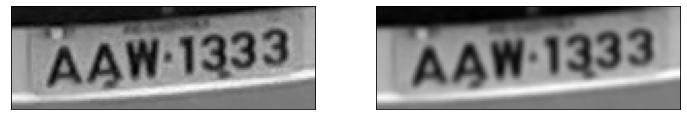

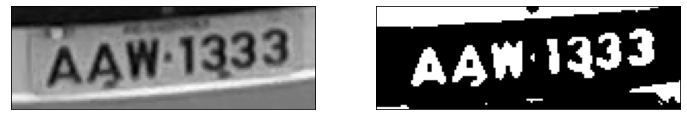

In [82]:
nameplate = "./Camera1/Set01/classes/aaw-1333/24161.png"
def convert_binary(image_path):
    img = cv.imread(image_path)
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    return gray
gray = convert_binary(nameplate)
blurred = cv.GaussianBlur(gray, (5, 5), 0)
plot_images(gray,blurred)
thresh = cv.adaptiveThreshold(blurred, 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY_INV, 45, 15)
plot_images(gray,thresh)

import functools

_, labels = cv.connectedComponents(thresh)
mask = np.zeros(thresh.shape, dtype="uint8")
total_pixels = image.shape[0] * image.shape[1]
print(image.shape)
# lower = total_pixels // 1000 # heuristic param, can be fine tuned if necessary
# upper = total_pixels // 1000 # heuristic param, can be fine tuned if necessary
lower = 70
upper = 500
print(lower,upper)
for (i, label) in enumerate(np.unique(labels)):
    # If this is the background label, ignore it
    if label == 0:
        continue
 
    # Otherwise, construct the label mask to display only connected component
    # for the current label
    labelMask = np.zeros(thresh.shape, dtype="uint8")
    labelMask[labels == label] = 255
    numPixels = cv.countNonZero(labelMask)
     # If the number of pixels in the component is between lower bound and upper bound, 
    # add it to our mask
    if numPixels > lower and numPixels < upper:
        mask = cv.add(mask, labelMask)
img_cnt,cnts,hierarchy = cv.findContours(mask.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

boundingBoxes = [cv.boundingRect(c) for c in cnts]
def compare(rect1, rect2):
    if abs(rect1[1] - rect2[1]) > 10:
        return rect1[1] - rect2[1]
    else:
        return rect1[0] - rect2[0]
boundingBoxes = sorted(boundingBoxes, key=functools.cmp_to_key(compare))
print(boundingBoxes)
overlayed_img = gray.copy()
for bb in boundingBoxes:
    x,y,w,h = bb
    cv.rectangle(overlayed_img, (x, y), (x + w, y + h), (0, 0, 255), 1)
plot_images(gray,overlayed_img)

In [186]:
def character_segmentation(img,binary_flag=cv.THRESH_BINARY_INV,gray_transform=False,):
    import functools
#     if gray_transform:
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
#     else:
#         gray = img.copy()
#     blurred = cv.GaussianBlur(gray, (5, 5), 0)
    blurred = gray.copy()
    
#     plot_images(gray,blurred)
    thresh = cv.adaptiveThreshold(blurred, 255, cv.ADAPTIVE_THRESH_MEAN_C, binary_flag, 5, 15)
#     cv2.threshold(img,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU,img)
#     plot_images(blurred,thresh)
    _, labels = cv.connectedComponents(thresh)
    mask = np.zeros(thresh.shape, dtype="uint8")
#     total_pixels = image.shape[0] * image.shape[1]
#     print(img.shape)

    lower = 7
    upper = 100
#     print(lower,upper)
    for (i, label) in enumerate(np.unique(labels)):
        # If this is the background label, ignore it
        if label == 0:
            continue

        # Otherwise, construct the label mask to display only connected component
        # for the current label
        labelMask = np.zeros(thresh.shape, dtype="uint8")
        labelMask[labels == label] = 255
        numPixels = cv.countNonZero(labelMask)
         # If the number of pixels in the component is between lower bound and upper bound, 
        # add it to our mask
        if numPixels > lower and numPixels < upper:
            mask = cv.add(mask, labelMask)
    img_cnt,cnts,hierarchy = cv.findContours(mask.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    
    boundingBoxes = [cv.boundingRect(c) for c in cnts]
    boundingBoxes = []
    for c in cnts:
        bb=cv.boundingRect(c) 
        x,y,w,h=bb
        if w <=8 and h >=4:
            boundingBoxes.append(bb)
    
    def compare(rect1, rect2):
        if abs(rect1[1] - rect2[1]) > 10:
            return rect1[1] - rect2[1]
        else:
            return rect1[0] - rect2[0]
    boundingBoxes = sorted(boundingBoxes, key=functools.cmp_to_key(compare))
#     print(boundingBoxes)
    return boundingBoxes

def overlay_characters_img(gray,bounding_boxes):
    overlayed_img = gray.copy()
    print("Overlaying characters on image with shape",overlayed_img.shape)
    for bb in bounding_boxes:
        x,y,w,h = bb
        print("Bounding box",x,y,w,h,"width: ",w, "height", h)
        cv.rectangle(overlayed_img, (x, y), (x + w, y + h), (0, 0, 255), 1)
    plot_images(gray,overlayed_img)
    


[104, 85, 64, 20]
BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aaw-1333/24159.png
(128, 256, 3)
Cropped image shape (20, 64, 3)
[(0, 9, 4, 8), (6, 7, 8, 11), (15, 7, 5, 9), (20, 6, 3, 9), (28, 6, 4, 10), (34, 5, 7, 10), (41, 5, 5, 8), (48, 4, 6, 8)]
Overlaying characters on image with shape (20, 64, 3)
Bounding box 0 9 4 8 width:  4 height 8
Bounding box 6 7 8 11 width:  8 height 11
Bounding box 15 7 5 9 width:  5 height 9
Bounding box 20 6 3 9 width:  3 height 9
Bounding box 28 6 4 10 width:  4 height 10
Bounding box 34 5 7 10 width:  7 height 10
Bounding box 41 5 5 8 width:  5 height 8
Bounding box 48 4 6 8 width:  6 height 8


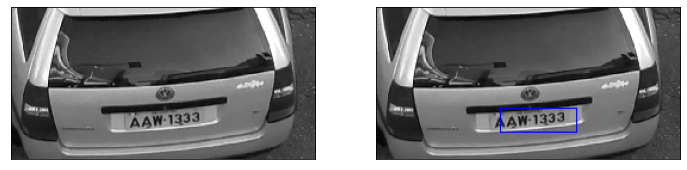

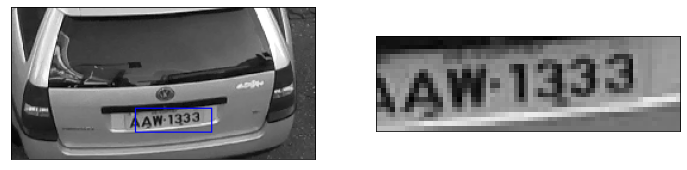

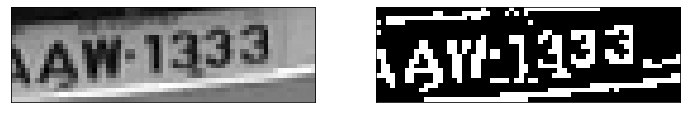

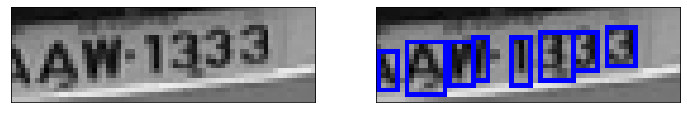

In [165]:
df = pd.read_csv('./nameplate_bounding_box.csv')
dataset = df.replace("ResizedNameplates","BinaryNamePlateBoxes",regex=True)
index=10
image_name = dataset['id'].iloc[index]
bounding_box = dataset['label'].iloc[index]
bb=bounding_box.replace("[","").replace("]","").replace("'","").replace(" ","")
bb_info = list(map(int,bb.split(",")))
print(bb_info)
print(image_name)
img = cv.imread(image_name)
print(img.shape)
overlayed_img =img.copy()
x,y,w,h=bb_info
cv.rectangle(overlayed_img, (x, y), (x + w, y + h), (0, 0, 255), 1)
plot_images(img,overlayed_img)
cropped_image = img[y:y+h, x:x+w]
plot_images(overlayed_img,cropped_image)
print("Cropped image shape",cropped_image.shape)
character_boxes = character_segmentation(cropped_image)
print(character_boxes)
overlay_characters_img(cropped_image,character_boxes)

In [27]:
import pickle
import pandas as pd
file_to_read = open("./models/nameplatebb/detection_results.pickle", "rb")
nameplate_detection_results = pickle.load(file_to_read)
nameplate_ground_truth_path_to_bb_mapping = {}
dataset = pd.read_csv('./nameplate_bounding_box.csv')
for datum in range(len(dataset)):
    image_name = dataset['id'].iloc[datum]
    bounding_box = dataset['label'].iloc[datum]
    binary_image_name = "./BinaryNamePlateBoxes/"+image_name[len("ResizedNameplates/"):]
    bb=bounding_box.replace("[","").replace("]","").replace("'","").replace(" ","")
    bb_info = list(map(int,bb.split(",")))
    binary_image_path = "/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/"+binary_image_name[2:]
    nameplate_ground_truth_path_to_bb_mapping[binary_image_path]=bb_info
    
# print(nameplate_ground_truth_path_to_bb_mapping)

In [188]:
def get_cropped_image(img_path,bb_info):
    img = cv.imread(img_path)
    x,y,w,h=bb_info
    cropped_image = img[y:y+h, x:x+w]
    return cropped_image
nameplate_character_results = {}
for camera in nameplate_detection_results:
    for setno in nameplate_detection_results[camera]:
        for nameplate in nameplate_detection_results[camera][setno]:
            framenos = list(nameplate_detection_results[camera][setno][nameplate].keys())
            framenos.sort()
            for frameno in framenos:
                output=nameplate_detection_results[camera][setno][nameplate][frameno]
                img_path,bb_info,iou = output
                detected_bb =list(map(int,[bb_info[0]*256.0,bb_info[1]*128.0,bb_info[2]*256.0,bb_info[3]*128.0]))
                gt_bb = nameplate_ground_truth_path_to_bb_mapping[img_path]
                detected_nameplate = get_cropped_image(img_path,detected_bb)
                ground_truth_nameplate = get_cropped_image(img_path,gt_bb)
#                 plot_images(detected_nameplate,ground_truth_nameplate)
                detected_characters = character_segmentation(detected_nameplate)
                gt_characters = character_segmentation(ground_truth_nameplate)
                if len(gt_characters)==0:
                    detected_characters = character_segmentation(detected_nameplate,binary_flag=cv.THRESH_BINARY)
                    gt_characters = character_segmentation(ground_truth_nameplate,binary_flag=cv.THRESH_BINARY)
                print(img_path,len(gt_characters),len(detected_characters))
                output_tuple = (gt_bb,detected_bb,gt_characters,detected_characters)
                if camera not in nameplate_character_results:
                    nameplate_character_results[camera]={}
                if setno not in nameplate_character_results[camera]:
                    nameplate_character_results[camera][setno]={}
                if nameplate not in nameplate_character_results[camera][setno]:
                    nameplate_character_results[camera][setno][nameplate]={}
#                 print(output_tuple)
                nameplate_character_results[camera][setno][nameplate][frameno]=output_tuple
            
                
            
        
    

                
    
    
    
    

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aub-6274/8149.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aub-6274/8150.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aub-6274/8151.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aub-6274/8152.png 7 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aub-6274/8153.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aub-6274/8154.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aub-6274/8155.

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aun-5679/773.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aun-5679/774.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aun-5679/775.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aun-5679/776.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aun-5679/777.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aun-5679/778.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aun-5679/779.png 0 0

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asu-9186/22455.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asu-9186/22456.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asu-9186/22458.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asu-9186/22459.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asu-9186/22460.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asu-9186/22461.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayk-6945

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awm-5157/25082.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awm-5157/25083.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awm-5157/25084.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awm-5157/25085.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awm-5157/25086.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axp-4236/33051.png 0 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axp-4236

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avn-9953/35691.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avn-9953/35692.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avn-9953/35693.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avn-9953/35694.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avn-9953/35695.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avn-9953/35697.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/avn-9953

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awp-6583/6237.png 5 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awp-6583/6238.png 4 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/auf-8339/27681.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/auf-8339/27682.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/auf-8339/27684.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/auf-8339/27685.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/auf-8339/2

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ask-9864/16918.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aue-9608/32754.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aue-9608/32755.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aue-9608/32757.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aue-9608/32758.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aue-9608/32759.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aue-9608

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asa-8356/35428.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asa-8356/35429.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asa-8356/35430.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/asa-8356/35431.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aup-9522/33243.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aup-9522/33244.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aup-9522

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axm-4905/35744.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axm-4905/35745.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axm-4905/35746.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axm-4905/35747.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axm-4905/35748.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axg-3492/2894.png 2 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axg-3492/

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayx-9658/13913.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayx-9658/13914.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayx-9658/13916.png 3 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayx-9658/13917.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayx-9658/13918.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/ayx-9658/13919.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azk-3521

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/arh-1452/11680.png 6 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axl-3584/5604.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axl-3584/5605.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axl-3584/5608.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axl-3584/5609.png 3 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axl-3584/5610.png 2 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axl-3584/5611

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aye-9948/19204.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awt-3652/13687.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awt-3652/13688.png 7 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awt-3652/13689.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awt-3652/13691.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awt-3652/13692.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awt-3652

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aov-7938/30243.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aov-7938/30244.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/aov-7938/30245.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bel-3114/24561.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bel-3114/24562.png 5 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bel-3114/24563.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/bel-3114

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azj-8996/29726.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azj-8996/29727.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azj-8996/29728.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azj-8996/29729.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azj-8996/29730.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azj-8996/29731.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/azj-8996

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/lcw-1636/27158.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/lcw-1636/27159.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/lcw-1636/27160.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/lcw-1636/27162.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/lcw-1636/27163.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/lcw-1636/27165.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/lcw-1636

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/arl-5515/8874.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/arl-5515/8875.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/arl-5515/8876.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/arl-5515/8877.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/arl-5515/8879.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/arl-5515/8880.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/mgj-3300/5484.

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axi-3262/27435.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/axi-3262/27436.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/dko-3197/22045.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/dko-3197/22046.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/dko-3197/22047.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/dko-3197/22048.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/dko-3197

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awe-3140/30008.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awe-3140/30009.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awe-3140/30010.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awe-3140/30011.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awe-3140/30012.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awe-3140/30013.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/awe-3140

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/jnw-6455/27198.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/jnw-6455/27199.png 6 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/jnw-6455/27200.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/jnw-6455/27201.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/jnw-6455/27202.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/jnw-6455/27204.png 0 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/jnw-6455

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ant-4111/19369.png 6 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ant-4111/19370.png 6 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ant-4111/19371.png 6 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ant-4111/19372.png 6 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ant-4111/19373.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ant-4111/19374.png 6 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ant-4111

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aym-8391/17052.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aym-8391/17054.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aym-8391/17055.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aym-8391/17056.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aym-8391/17057.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axy-7415/21855.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axy-7415

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aoi-0580/750.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aoi-0580/751.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aoi-0580/752.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axi-5838/3195.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axi-5838/3196.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axi-5838/3197.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axi-5838/3199.png

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ayv-4334/19101.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ayv-4334/19102.png 6 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ayv-4334/19104.png 5 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ayv-4334/19106.png 6 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/apy-7367/5527.png 2 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/apy-7367/5528.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/apy-7367/5

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/auo-3266/24428.png 9 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/auo-3266/24429.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/auo-3266/24430.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/auo-3266/24431.png 9 9
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/auo-3266/24432.png 9 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/auo-3266/24433.png 9 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/auo-3266

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/mlr-5782/19618.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/mlr-5782/19619.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/mlr-5782/19620.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/mlr-5782/19621.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/mlr-5782/19622.png 1 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/fde-8265/6023.png 2 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/fde-8265/

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/azm-0851/13881.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/azm-0851/13882.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/azm-0851/13883.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/azm-0851/13884.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/azm-0851/13885.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/azm-0851/13886.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/azm-0851

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aty-1811/27623.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aty-1811/27624.png 6 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aty-1811/27625.png 7 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aty-1811/27626.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awx-0205/30001.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awx-0205/30002.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awx-0205

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ayh-2847/8215.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ayh-2847/8216.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avv-1753/232.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avv-1753/233.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avv-1753/234.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avv-1753/235.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/avv-1753/238.png 6

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aws-1268/69.png 12 10
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aws-1268/70.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aws-1268/72.png 9 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aws-1268/73.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aws-1268/74.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aws-1268/75.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aws-1268/76.png 6 6
/hom

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/koi-6914/27247.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/koi-6914/27248.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/koi-6914/27249.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/koi-6914/27250.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/koi-6914/27251.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awn-1323/6101.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awn-1323/

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axb-8661/3117.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axb-8661/3118.png 2 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axb-8661/3119.png 4 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axb-8661/3120.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/axb-8661/3121.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ayg-2189/29871.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ayg-2189/2987

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/anz-7865/30327.png 2 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/anz-7865/30328.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/anz-7865/30329.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ccf-8007/27745.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ccf-8007/27746.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ccf-8007/27747.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/ccf-8007

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awu-2173/22163.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awu-2173/22167.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awu-2173/22168.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awu-2173/22169.png 3 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awu-2173/22170.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/awu-2173/22171.png 3 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/mhz-5309

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/lbe-3684/16475.png 8 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/lbe-3684/16476.png 3 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/lbe-3684/16477.png 7 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/lbe-3684/16478.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/lbe-3684/16479.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/lbe-3684/16480.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/lbe-3684

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aku-5843/32422.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aku-5843/32423.png 5 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aku-5843/32424.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aku-5843/32426.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aku-5843/32427.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aku-5843/32428.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/aku-5843

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/epw-8746/784.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/epw-8746/785.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/epw-8746/786.png 3 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/epw-8746/787.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/epw-8746/788.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/epw-8746/789.png 4 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set02/classes_carros/epw-8746/791.png 6 7

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ast-1190/23292.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ast-1190/23293.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ast-1190/23294.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ast-1190/23296.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ast-1190/23297.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ast-1190/23298.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ast-1190

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/kzs-3218/23285.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/kzs-3218/23286.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/kzs-3218/23287.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/kzs-3218/23288.png 3 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/kzs-3218/23289.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/kzs-3218/23290.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/kzs-3218

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atu-9776/1901.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atu-9776/1902.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atu-9776/1903.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atu-9776/1904.png 5 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atu-9776/1905.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atu-9776/1906.png 9 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/auz-9865/15454

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avt-8796/31751.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avt-8796/31753.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avt-8796/31754.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avt-8796/31755.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avt-8796/31756.png 2 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avt-8796/31757.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avt-8796

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aqw-3871/7018.png 3 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aqw-3871/7019.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aqw-3871/7020.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/aqw-3871/7021.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/fis-2884/18569.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/fis-2884/18570.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/fis-2884/185

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-2045/18467.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-2045/18468.png 4 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-2045/18469.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-2045/18470.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-2045/18471.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-2045/18472.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axc-2045

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awx-7287/20810.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awx-7287/20811.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayj-6473/15899.png 5 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayj-6473/15900.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayj-6473/15901.png 4 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayj-6473/15902.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayj-6473

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axu-3221/23350.png 6 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axu-3221/23351.png 7 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axu-3221/23352.png 7 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axu-3221/23353.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/fdh-4716/18010.png 3 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/fdh-4716/18011.png 4 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/fdh-4716

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayu-5996/31312.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayw-4212/21450.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayw-4212/21452.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayw-4212/21453.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayw-4212/21454.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayw-4212/21455.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayw-4212

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ays-3484/4782.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atl-6222/18325.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atl-6222/18327.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atl-6222/18328.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atl-6222/18329.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atl-6222/18330.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atl-6222/

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ant-4131/34593.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awn-2437/2132.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awn-2437/2133.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awn-2437/2134.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awn-2437/2135.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awn-2437/2136.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awn-2437/2137

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eij-4806/18626.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eij-4806/18627.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eij-4806/18628.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eij-4806/18629.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eij-4806/18630.png 3 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eij-4806/18631.png 2 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/eij-4806

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atb-9367/15582.png 4 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atb-9367/15583.png 4 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atb-9367/15584.png 4 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atb-9367/15585.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atb-9367/15586.png 6 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atb-9367/15587.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/atb-9367

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ayb-5933/23486.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/auy-8720/18123.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/auy-8720/18124.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/auy-8720/18125.png 7 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/auy-8720/18127.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/auy-8720/18128.png 6 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/auy-8720

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bcv-1103/4541.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bcv-1103/4543.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bcv-1103/4544.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bcv-1103/4545.png 7 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bcv-1103/4546.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bcv-1103/4547.png 6 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/bcv-1103/4548.

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/njz-3326/12719.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/njz-3326/12720.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/njz-3326/12721.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/njz-3326/12722.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/njz-3326/12723.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/njz-3326/12725.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/njz-3326

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/asv-1282/31378.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/asv-1282/31379.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/asv-1282/31380.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/auy-0793/18412.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/auy-0793/18413.png 6 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/auy-0793/18414.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/auy-0793

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awr-1588/23650.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awr-1588/23651.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awr-1588/23653.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awr-1588/23654.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/awr-1588/23655.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ark-4829/4503.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/ark-4829/

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/auy-3629/7171.png 6 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/auy-3629/7172.png 3 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/auy-3629/7173.png 2 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axo-1086/28787.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axo-1086/28788.png 7 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axo-1086/28789.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axo-1086/28

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avs-6171/34110.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avs-6171/34111.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avs-6171/34112.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avs-6171/34113.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/avs-6171/34114.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axs-7317/31535.png 8 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set01/classes_carros/axs-7317

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/amn-7114/24304.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/amn-7114/24306.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/amn-7114/24307.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/amn-7114/24308.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/amn-7114/24309.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/amn-7114/24310.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/amn-7114

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/hmr-9029/822.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/hmr-9029/823.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/hmr-9029/824.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/hmr-9029/825.png 3 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asl-9606/25.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asl-9606/26.png 4 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asl-9606/27.png 3 2
/h

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/awv-5010/24532.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/awv-5010/24533.png 7 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aul-6267/14177.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aul-6267/14179.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aul-6267/14180.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aul-6267/14181.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aul-6267

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ath-6498/35837.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ath-6498/35838.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ath-6498/35839.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ath-6498/35840.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ath-6498/35841.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/avo-2683/35774.png 9 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/avo-2683

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atm-2049/10976.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atm-2049/10977.png 6 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atm-2049/10978.png 5 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atm-2049/10979.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atm-2049/10980.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atm-2049/10981.png 6 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atm-2049

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayd-1477/19306.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayd-1477/19307.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayd-1477/19308.png 6 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayd-1477/19309.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayd-1477/19310.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayd-1477/19311.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ayd-1477

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ewh-2005/13898.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ewh-2005/13899.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ewh-2005/13900.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ewh-2005/13901.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ewh-2005/13902.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/ewh-2005/13903.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atk-0372

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auc-5830/19496.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auc-5830/19497.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auc-5830/19498.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auc-5830/19499.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/auc-5830/19500.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aue-0705/21740.png 1 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/aue-0705

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mih-8767/2986.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mih-8767/2987.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mih-8767/2989.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axy-2056/19657.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axy-2056/19659.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axy-2056/19661.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axy-2056/19

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/avn-4768/16251.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bby-1888/2917.png 7 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bby-1888/2918.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bby-1888/2919.png 9 9
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bby-1888/2920.png 9 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bby-1888/2921.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/bby-1888/2922

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dkg-8700/25079.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dkg-8700/25080.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dkg-8700/25081.png 6 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dkg-8700/25082.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dkg-8700/25083.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dkg-8700/25085.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/dkg-8700

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mcs-1314/24765.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mcs-1314/24766.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/hxx-0902/27061.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/hxx-0902/27062.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/hxx-0902/27063.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/hxx-0902/27065.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/hxx-0902

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atn-8301/22029.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atn-8301/22030.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atn-8301/22031.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atn-8301/22032.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/atn-8301/22033.png 7 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axo-9712/35292.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/axo-9712

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/avm-5718/8571.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/avm-5718/8572.png 3 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/avm-5718/8573.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/avm-5718/8574.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/avm-5718/8575.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/avm-5718/8576.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/mfd-8925/21707

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asw-2388/24829.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asw-2388/24830.png 7 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asw-2388/24832.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asw-2388/24833.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asw-2388/24834.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asw-2388/24835.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set05/classes_carros/asw-2388

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awb-8291/27928.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/cni-4301/2904.png 2 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/cni-4301/2905.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/cni-4301/2906.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/cni-4301/2907.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/cni-4301/2908.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/cni-4301/2909

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aes-7627/8677.png 7 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aes-7627/8679.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aes-7627/8680.png 6 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/adh-1338/3414.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/adh-1338/3415.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/adh-1338/3416.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/adh-1338/3417.

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axl-5267/198.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axl-5267/199.png 7 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axl-5267/200.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/olx-5486/11018.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/olx-5486/11019.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/olx-5486/11020.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/olx-5486/11021

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ajk-5467/6071.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ajk-5467/6072.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ajk-5467/6073.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ajk-5467/6074.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ajk-5467/6075.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awt-2125/29810.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awt-2125/2981

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avt-8972/11409.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avt-8972/11410.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avt-8972/11411.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/atv-8950/21785.png 8 11
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/atv-8950/21786.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/atv-8950/21787.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/atv-895

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axl-5299/35436.png 2 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axl-5299/35437.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/apq-5615/8327.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/apq-5615/8328.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/apq-5615/8329.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/apq-5615/8330.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/apq-5615/833

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avv-9383/29900.png 6 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avv-9383/29901.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avv-9383/29902.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avv-9383/29903.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avv-9383/29904.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avv-9383/29905.png 3 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/auj-3708

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awe-8560/737.png 4 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awe-8560/738.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awe-8560/739.png 7 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awe-8560/740.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awe-8560/741.png 4 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avw-4657/14248.png 10 10
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avw-4657/14249.p

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awi-6470/27241.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awi-6470/27242.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/atq-8647/32696.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/atq-8647/32697.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/atq-8647/32698.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/atq-8647/32699.png 0 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/atq-8647

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aye-6834/13940.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aye-6834/13941.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aye-6834/13942.png 3 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aye-6834/13943.png 2 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aye-6834/13944.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aye-6834/13945.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/aye-6834

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/amd-5693/8826.png 5 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/amd-5693/8827.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/amd-5693/8828.png 4 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/amd-5693/8829.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/amd-5693/8830.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/amd-5693/8831.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/amd-5693/8832.

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axx-1612/2763.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axx-1612/2764.png 4 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axx-1612/2765.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axx-1612/2766.png 7 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axx-1612/2768.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axx-1612/2769.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/axx-1612/2770.

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avz-8018/3405.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avz-8018/3406.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/avz-8018/3407.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/bcm-9188/25195.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/bcm-9188/25196.png 2 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/bcm-9188/25198.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/bcm-9188/25

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/hog-3484/13897.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/hog-3484/13898.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ava-3417/16717.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ava-3417/16718.png 2 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ava-3417/16719.png 7 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ava-3417/16720.png 6 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/ava-3417

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/baz-3099/24995.png 7 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awj-2021/24561.png 0 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awj-2021/24562.png 5 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awj-2021/24563.png 7 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awj-2021/24565.png 6 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awj-2021/24566.png 6 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set04/classes_carros/awj-2021

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/dug-1286/13377.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/dug-1286/13378.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/dug-1286/13380.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/dug-1286/13381.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/dug-1286/13382.png 6 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/atb-4406/35430.png 9 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/atb-4406

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/apl-5423/19070.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/apl-5423/19071.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/apl-5423/19072.png 3 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/apl-5423/19073.png 2 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asp-5788/35513.png 2 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asp-5788/35514.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asp-5788

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aln-2225/19659.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aln-2225/19660.png 2 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aln-2225/19661.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aln-2225/19662.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aln-2225/19663.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aln-2225/19664.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auu-4527

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aug-8898/16332.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aug-8898/16333.png 9 9
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aug-8898/16334.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aug-8898/16335.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aug-8898/16336.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axu-9778/699.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axu-9778/7

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axg-3492/645.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axg-3492/646.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axg-3492/647.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/maz-5230/8006.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/maz-5230/8007.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/maz-5230/8008.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/maz-5230/8009.png

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arl-5515/8431.png 7 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arl-5515/8432.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arl-5515/8433.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arl-5515/8434.png 6 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arl-5515/8435.png 6 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arl-5515/8436.png 7 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/arl-5515/8437.

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aol-3111/30049.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aol-3111/30050.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/meg-9371/34891.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/meg-9371/34892.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/meg-9371/34893.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/meg-9371/34894.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/meg-9371

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ajk-9991/32998.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anz-3510/6192.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anz-3510/6193.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anz-3510/6194.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anz-3510/6195.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anz-3510/6196.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anz-3510/6198

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awz-3665/741.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awz-3665/742.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bdr-2711/16564.png 5 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bdr-2711/16566.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bdr-2711/16568.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bdr-2711/16569.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bdr-2711/165

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aqy-2334/5310.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aqy-2334/5311.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bbe-1993/34954.png 7 9
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bbe-1993/34955.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bbe-1993/34956.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bbe-1993/34957.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/bbe-1993/3

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-3322/34591.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-3322/34592.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-3322/34593.png 0 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axi-1269/14255.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axi-1269/14256.png 7 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axi-1269/14257.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axi-1269

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aoh-0409/985.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aoh-0409/986.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aoh-0409/988.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ava-3159/13932.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ava-3159/13933.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ava-3159/13934.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ava-3159/13935

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awz-4480/11114.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awz-4480/11115.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awz-4480/11116.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awz-4480/11117.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awz-4480/11118.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azb-2905/22355.png 5 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/azb-2905

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/mdb-0841/22251.png 5 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axl-3584/3516.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axl-3584/3517.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axl-3584/3518.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axl-3584/3520.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axl-3584/3521.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axl-3584/3522

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anx-6627/16567.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anx-6627/16568.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/anx-6627/16569.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/abc-0064/19609.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/abc-0064/19610.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/abc-0064/19611.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/abc-0064

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-1592/5280.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-1592/5281.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-1592/5282.png 6 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-1592/5283.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-1592/5284.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/awj-1592/5286.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aus-1730/895.p

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aom-5113/26607.png 5 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aom-5113/26608.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aom-5113/26609.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aom-5113/26610.png 6 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aom-5113/26611.png 5 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aom-5113/26612.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aom-5113

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axh-3487/30103.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axh-3487/30104.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axh-3487/30105.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axh-3487/30107.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axh-3487/30108.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axh-3487/30109.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/aro-1192

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axa-6701/16107.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axa-6701/16108.png 3 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axa-6701/16109.png 3 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axa-6701/16111.png 4 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axa-6701/16112.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axa-6701/16113.png 9 9
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/axa-6701

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/atq-8872/10680.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/atq-8872/10681.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/atq-8872/10682.png 8 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/atq-8872/10684.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayk-2595/19462.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayk-2595/19463.png 4 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayk-2595

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asy-9436/24732.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/asy-9436/24733.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ars-4746/13302.png 7 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ars-4746/13303.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ars-4746/13304.png 6 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ars-4746/13305.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ars-4746

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/dvm-5309/14154.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/dvm-5309/14155.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/dvm-5309/14156.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/dvm-5309/14157.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/dvm-5309/14158.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/dvm-5309/14159.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/dvm-5309

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auj-6409/32530.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auj-6409/32531.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auj-6409/32532.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auj-6409/32533.png 3 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auj-6409/32534.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auj-6409/32536.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/auj-6409

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayk-3384/30153.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayk-3384/30154.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayk-3384/30155.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayk-3384/30157.png 3 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/ayk-3384/30158.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/kly-1212/27426.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set03/classes_carros/kly-1212

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atd-2740/18699.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atd-2740/18700.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atd-2740/18701.png 7 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atd-2740/18702.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atd-2740/18703.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atd-2740/18704.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axg-7623

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axe-5710/11758.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axe-5710/11759.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axe-5710/11760.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axe-5710/11761.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axe-5710/11762.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/acz-1215/802.png 6 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/acz-1215/8

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mst-4113/35145.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mst-4113/35147.png 4 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bdu-1210/27355.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bdu-1210/27356.png 7 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bdu-1210/27357.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bdu-1210/27358.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bdu-1210

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aza-1872/30038.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aza-1872/30039.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aza-1872/30040.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aza-1872/30041.png 6 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aza-1872/30042.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aza-1872/30043.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/akc-7359

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atk-0372/8459.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atk-0372/8460.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atk-0372/8461.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atk-0372/8462.png 7 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atk-0372/8463.png 7 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/atk-0372/8464.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aqs-4357/18617

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayo-5469/24161.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayo-5469/24162.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayo-5469/24163.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayo-5469/24164.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayo-5469/24165.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayo-5469/24166.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aup-4706

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aws-8073/32891.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aws-8073/32892.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aws-8073/32893.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aws-8073/32894.png 7 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aws-8073/32895.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aws-8073/32896.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aws-8073

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/fah-3138/16526.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/fah-3138/16527.png 3 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/fah-3138/16528.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/fah-3138/16529.png 2 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/fah-3138/16530.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/fah-3138/16531.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/azc-4590

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axu-7702/18593.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axu-7702/18594.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axu-7702/18595.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axu-7702/18596.png 4 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/axu-7702/18597.png 3 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auv-5091/3072.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auv-5091/

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/afk-7069/30242.png 7 9
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/afk-7069/30243.png 7 9
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/afk-7069/30244.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auq-6171/35310.png 6 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auq-6171/35311.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auq-6171/35312.png 10 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auq-617

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/azd-0849/35252.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/azd-0849/35253.png 4 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/azd-0849/35254.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/azd-0849/35255.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/azd-0849/35256.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/azd-0849/35258.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asn-0614

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mbl-1452/32544.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mbl-1452/32545.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mbl-1452/32546.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mbl-1452/32547.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mbl-1452/32548.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mbl-1452/32549.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mbl-1452

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bas-1279/803.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bas-1279/804.png 5 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bas-1279/805.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bas-1279/806.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bas-1279/807.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bas-1279/808.png 4 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bas-1279/809.png 3 3

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alg-1239/13830.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alg-1239/13831.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alg-1239/13832.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alg-1239/13833.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alg-1239/13834.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayy-8033/32244.png 2 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayy-8033

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aqc-1395/16717.png 5 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aqc-1395/16719.png 3 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aqc-1395/16720.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/aqc-1395/16721.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcm-0171/2682.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcm-0171/2683.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcm-0171/2

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayq-9328/17041.png 11 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayq-9328/17042.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayq-9328/17044.png 7 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayq-9328/17045.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayq-9328/17046.png 2 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayq-9328/17047.png 3 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayq-932

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcb-0603/16543.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcb-0603/16544.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcb-0603/16545.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/bcb-0603/16546.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avj-2656/11182.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avj-2656/11183.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avj-2656

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auu-2866/21754.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auu-2866/21755.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auu-2866/21756.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auu-2866/21757.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auu-2866/21758.png 2 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auu-2866/21759.png 4 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/auu-2866

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayb-1663/5829.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayb-1663/5830.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avh-8200/16914.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avh-8200/16915.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avh-8200/16916.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avh-8200/16917.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avh-8200/1

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/ayd-7150/11122.png 6 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asl-0042/24945.png 6 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asl-0042/24946.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asl-0042/24947.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asl-0042/24948.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asl-0042/24949.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asl-0042

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/asz-8747/30000.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mcs-1314/24072.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mcs-1314/24074.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mcs-1314/24075.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mcs-1314/24077.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mcs-1314/24078.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/mcs-1314

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/arv-4798/32774.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avz-2864/22320.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avz-2864/22321.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avz-2864/22322.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avz-2864/22323.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avz-2864/22324.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/avz-2864

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alc-9519/3093.png 7 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alc-9519/3094.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alc-9519/3095.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alc-9519/3096.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alc-9519/3097.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alc-9519/3098.png 3 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set05/classes_carros/alc-9519/3099.

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/miu-2380/16770.png 5 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/miu-2380/16771.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/miu-2380/16772.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ert-1230/13587.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ert-1230/13588.png 5 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ert-1230/13589.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ert-1230

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/arq-9461/11509.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/arq-9461/11510.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/arq-9461/11511.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/arq-9461/11513.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aqw-2155/5388.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aqw-2155/5389.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aqw-2155/5

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/dnu-9157/11429.png 7 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/dnu-9157/11430.png 5 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/dnu-9157/11432.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/dnu-9157/11433.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/dnu-9157/11434.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/dnu-9157/11435.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/dnu-9157

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/iqm-8664/29029.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/iqm-8664/29030.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/iqm-8664/29031.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/iqm-8664/29032.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/nql-5754/26921.png 9 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/nql-5754/26922.png 9 9
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/nql-5754

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/iwm-0090/21901.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/iwm-0090/21903.png 4 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/iwm-0090/21904.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/iwm-0090/21905.png 3 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/iwm-0090/21906.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/iwm-0090/21907.png 4 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/oxe-4952

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/mlr-5782/18935.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/mlr-5782/18936.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/pvd-0430/30063.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/pvd-0430/30064.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/pvd-0430/30065.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/pvd-0430/30066.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/pvd-0430

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-2917/32300.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-2917/32301.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-2917/32303.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-2917/32304.png 0 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-2917/32305.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-2917/32306.png 6 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awd-2917

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axb-0871/31412.png 3 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axb-0871/31413.png 6 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axb-0871/31414.png 3 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axb-0871/31415.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alb-6969/18875.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alb-6969/18876.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/alb-6969

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awj-6914/14282.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awj-6914/14283.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awj-6914/14284.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awj-6914/14285.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awj-6914/14286.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awj-6914/14287.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awj-6914

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axc-4245/13787.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axc-4245/13788.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axc-4245/13789.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axc-4245/13790.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axc-4245/13791.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axc-4245/13792.png 6 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/apa-2032

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayl-7404/24422.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayl-7404/24423.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayl-7404/24424.png 6 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayl-7404/24425.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayl-7404/24426.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayl-7404/24427.png 3 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/ayl-7404

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awa-2526/3205.png 3 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awa-2526/3206.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awa-2526/3207.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awa-2526/3208.png 4 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aet-1642/22194.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aet-1642/22196.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aet-1642/221

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aum-1017/3161.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aum-1017/3162.png 6 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aum-1017/3163.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aum-1017/3164.png 6 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aum-1017/3165.png 6 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aum-1017/3166.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aum-1017/3167.

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/agr-1631/32433.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/agr-1631/32434.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/agr-1631/32435.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aye-4224/34654.png 5 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aye-4224/34655.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aye-4224/34656.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aye-4224

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-6362/19296.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-6362/19297.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-6362/19298.png 3 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-6362/19299.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-6362/19300.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-6362/19301.png 5 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoi-6362

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/arg-1383/2984.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/arg-1383/2985.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/arg-1383/2987.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/arg-1383/2988.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/dgo-1525/21634.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/dgo-1525/21635.png 2 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/dgo-1525/216

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aqf-9510/16412.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aqf-9510/16413.png 4 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aul-7908/16367.png 0 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aul-7908/16368.png 7 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aul-7908/16369.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aul-7908/16370.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aul-7908

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awu-3240/14035.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awu-3240/14036.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awu-3240/14037.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awu-3240/14038.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awu-3240/14039.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awu-3240/14040.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/awu-3240

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aww-8208/368.png 12 12
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aww-8208/369.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aww-8208/370.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aww-8208/371.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aww-8208/372.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aww-8208/373.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aww-8208/374.png 1

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asj-1781/34512.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asj-1781/34513.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asj-1781/34514.png 1 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asj-1781/34515.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asj-1781/34516.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/duf-3034/34747.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/duf-3034

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avv-2698/809.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avv-2698/810.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avv-2698/811.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avv-2698/812.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/avv-2698/813.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axv-5168/26915.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/axv-5168/26916.png

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aat-9096/5615.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aat-9096/5616.png 2 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aat-9096/5617.png 2 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aat-9096/5618.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoa-8433/13863.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoa-8433/13864.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aoa-8433/138

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/epk-3750/29456.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/epk-3750/29457.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aka-4371/5828.png 7 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aka-4371/5829.png 6 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aka-4371/5831.png 3 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aka-4371/5832.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/aka-4371/583

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asi-8633/32630.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asi-8633/32631.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asi-8633/32632.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asi-8633/32633.png 6 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asi-8633/32634.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asi-8633/32635.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set02/classes_carros/asi-8633

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awx-7287/18939.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awx-7287/18940.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhv-3549/18376.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhv-3549/18377.png 2 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhv-3549/18379.png 7 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhv-3549/18380.png 7 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mhv-3549

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqe-3993/13728.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqe-3993/13729.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axz-9620/29469.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axz-9620/29470.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axz-9620/29471.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axz-9620/29472.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axz-9620

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/alk-7227/27466.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/alk-7227/27467.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/alk-7227/27468.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axj-2040/18972.png 6 9
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axj-2040/18973.png 7 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axj-2040/18974.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axj-2040

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mbw-8032/19030.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mbw-8032/19031.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mbw-8032/19032.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mbw-8032/19033.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mbw-8032/19034.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mbw-8032/19035.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/mbw-8032

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/akn-0076/3126.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/akn-0076/3127.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/akn-0076/3128.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/akn-0076/3129.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/akn-0076/3130.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/alf-7073/15766.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/alf-7073/1576

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/azj-7263/11544.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/azj-7263/11545.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/azj-7263/11546.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayf-3524/32262.png 3 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayf-3524/32263.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayf-3524/32264.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayf-3524

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axg-7934/26419.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axg-7934/26420.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axg-7934/26421.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axg-7934/26423.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axg-7934/26424.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aue-6478/27193.png 2 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aue-6478

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awd-4758/5987.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awd-4758/5988.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awd-4758/5989.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awd-4758/5990.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awd-4758/5991.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/alo-9716/29615.png 5 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/alo-9716/2961

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atz-2376/26991.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atz-2376/26993.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayp-9560/32837.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayp-9560/32838.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayp-9560/32839.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayp-9560/32840.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayp-9560

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/alj-8237/19579.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/alj-8237/19580.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/alj-8237/19582.png 3 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/alj-8237/19583.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/auj-4736/24696.png 7 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/auj-4736/24697.png 7 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/auj-4736

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/hst-2875/18273.png 3 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/hst-2875/18274.png 4 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awo-1054/29301.png 2 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awo-1054/29302.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awo-1054/29303.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awo-1054/29304.png 0 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awo-1054

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bad-8400/3578.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bad-8400/3579.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bad-8400/3580.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bad-8400/3581.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bad-8400/3583.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bad-8400/3584.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bad-8400/3585.

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arj-1497/5695.png 7 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arj-1497/5696.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arj-1497/5697.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arj-1497/5698.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arj-1497/5699.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayd-2258/24042.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayd-2258/2404

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aut-1457/18459.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aut-1457/18461.png 6 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aut-1457/18462.png 7 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awy-7326/26949.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awy-7326/26950.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awy-7326/26951.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awy-7326

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awq-0968/34409.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/apz-1461/8848.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/apz-1461/8849.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/apz-1461/8850.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/apz-1461/8851.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/apz-1461/8852.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/apz-1461/8853

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/jke-6468/29786.png 7 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/jke-6468/29787.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/jke-6468/29789.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/jke-6468/29790.png 6 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/jke-6468/29791.png 6 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aju-4377/10383.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aju-4377

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/gem-0025/14014.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/gem-0025/14015.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/gem-0025/14016.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/gem-0025/14017.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/gem-0025/14018.png 6 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/gem-0025/14019.png 4 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awn-2563

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ark-4829/2663.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ark-4829/2664.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ark-4829/2665.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ark-4829/2667.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axp-6595/6302.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axp-6595/6303.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axp-6595/6305.

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayh-9794/890.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayh-9794/891.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arb-3259/29743.png 7 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arb-3259/29744.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arb-3259/29745.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arb-3259/29746.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/arb-3259/297

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ava-1382/16154.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ava-1382/16156.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ava-1382/16157.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ava-1382/16158.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ava-1382/16159.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ava-1382/16160.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ava-1382

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asm-7213/13662.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asm-7213/13663.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asm-7213/13664.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asm-7213/13665.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asm-7213/13666.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asm-7213/13667.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/awn-6852

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ake-4178/319.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ake-4178/320.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aty-9697/34335.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aty-9697/34336.png 0 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aty-9697/34337.png 0 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aty-9697/34338.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aty-9697/343

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/eqv-6413/13524.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/eqv-6413/13525.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/eqv-6413/13526.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/eqv-6413/13528.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atc-1189/2595.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atc-1189/2596.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/atc-1189/2

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bel-6664/21565.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bel-6664/21566.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bel-6664/21567.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bel-6664/21570.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bel-6664/21572.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bel-6664/21573.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aex-8880

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqh-1586/19162.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqh-1586/19163.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asz-5718/8604.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asz-5718/8605.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asz-5718/8606.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asz-5718/8607.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/asz-5718/860

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axx-3149/19236.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axx-3149/19239.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axx-3149/19240.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/axx-3149/19241.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/alt-2747/32145.png 2 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/alt-2747/32146.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/alt-2747

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqb-0838/8984.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqb-0838/8986.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqb-0838/8988.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqb-0838/8989.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aqb-0838/8990.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/krn-1403/15836.png 9 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/krn-1403/1583

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aul-6039/32716.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aul-6039/32717.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aul-6039/32718.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aul-6039/32719.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aul-6039/32720.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aul-6039/32721.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aul-6039

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/fda-6093/2703.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ina-3242/24077.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ina-3242/24079.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ina-3242/24080.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ina-3242/24082.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ina-3242/24083.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ina-3242/

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayw-5070/10299.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayw-5070/10300.png 4 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayw-5070/10301.png 5 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayw-5070/10302.png 5 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayw-5070/10303.png 6 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ayw-5070/10304.png 4 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/ays-6350

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bdy-1002/32699.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bdy-1002/32700.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bdy-1002/32703.png 8 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bdy-1002/32704.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bdy-1002/32705.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/bdy-1002/32706.png 6 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set01/classes_carros/aul-6048

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayj-0528/27226.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayj-0528/27227.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayj-0528/27228.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayj-0528/27229.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayj-0528/27230.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayj-0528/27232.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayj-0528

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arj-1965/11046.png 7 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arj-1965/11047.png 7 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arj-1965/11048.png 4 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arj-1965/11049.png 4 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arj-1965/11050.png 6 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arj-1965/11051.png 4 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awx-8620

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axf-3400/32038.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axf-3400/32039.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bcv-0676/8461.png 7 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bcv-0676/8462.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bcv-0676/8464.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bcv-0676/8465.png 7 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/bcv-0676/846

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dqo-9278/396.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dqo-9278/397.png 8 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dqo-9278/398.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dqo-9278/399.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dqo-9278/400.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dqo-9278/401.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/dqo-9278/402.png 2 2

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afz-6384/22026.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afz-6384/22027.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afz-6384/22028.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afz-6384/22029.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afz-6384/22030.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afz-6384/22031.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/afz-6384

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/apv-2191/8555.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/acc-0017/3355.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/acc-0017/3356.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/acc-0017/3357.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/acc-0017/3358.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/acc-0017/3359.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/acc-0017/3360.

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avi-0684/16585.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avi-0684/16586.png 7 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avi-0684/16587.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avi-0684/16588.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avi-0684/16589.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avi-0684/16590.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avi-0684

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ans-8806/3216.png 2 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ans-8806/3217.png 2 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ans-8806/3218.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ans-8806/3219.png 4 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ans-8806/3220.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ans-8806/3221.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aro-6745/27260

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ase-5529/29799.png 8 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ase-5529/29800.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ase-5529/29801.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ase-5529/29802.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ase-5529/29803.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ase-5529/29804.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ash-5937

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aoa-9732/29939.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aoa-9732/29940.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aoa-9732/29942.png 2 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aoa-9732/29943.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aoa-9732/29944.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aoa-9732/29945.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aoa-9732

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/njr-4069/24645.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/njr-4069/24646.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/njr-4069/24648.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/njr-4069/24649.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/njr-4069/24650.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/njr-4069/24651.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/njr-4069

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/eij-5454/11317.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/eij-5454/11318.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/eij-5454/11319.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/eij-5454/11320.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/eij-5454/11321.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/eij-5454/11322.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/eij-5454

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/anr-5570/6013.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/anr-5570/6014.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/anr-5570/6015.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/hgk-3399/16477.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/hgk-3399/16478.png 8 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/hgk-3399/16479.png 9 9
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/hgk-3399/16

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mic-8902/35470.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mic-8902/35471.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mic-8902/35472.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mic-8902/35473.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mic-8902/35474.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mic-8902/35475.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/mic-8902

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/abt-8885/19257.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/abt-8885/19258.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/abt-8885/19259.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/abt-8885/19260.png 1 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/abt-8885/19261.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/abt-8885/19262.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/abt-8885

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avv-2847/5741.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avv-2847/5742.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/avv-2847/5743.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/duc-9755/35193.png 5 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/duc-9755/35194.png 6 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/duc-9755/35195.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/duc-9755/35

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axl-5299/32948.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axl-5299/32949.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axl-5299/32950.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axl-5299/32951.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axl-5299/32952.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axl-5299/32953.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axl-5299

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayi-9681/24740.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axw-9560/29854.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axw-9560/29855.png 1 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axw-9560/29856.png 2 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axw-9560/29857.png 3 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axw-9560/29858.png 4 4
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/axw-9560

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/arc-0208/30093.png 3 3
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayz-3397/5800.png 8 8
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayz-3397/5801.png 7 7
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayz-3397/5802.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayz-3397/5804.png 6 6
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayz-3397/5805.png 5 5
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/ayz-3397/5806

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aux-9851/3126.png 2 2
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aux-9851/3128.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aux-9851/3129.png 0 0
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aux-9851/3130.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aux-9851/3131.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/aux-9851/3132.png 1 1
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera1/Set04/classes_carros/awj-2847/29810

In [190]:
import pickle
# save dictionary to pickle file
with open('./models/nameplatebb/character_detection_results.pickle', 'wb') as file:
    pickle.dump(nameplate_character_results, file, protocol=pickle.HIGHEST_PROTOCOL)

In [189]:
def get_stats(nameplate_detection_results,nameplate_character_results):
    counter = 0
    gt_bb_count = {}
    detected_bb_count = {}
    frame_count = {}
    for camera in nameplate_detection_results:
        for setno in nameplate_detection_results[camera]:
            for nameplate in nameplate_detection_results[camera][setno]:
                framenos = list(nameplate_detection_results[camera][setno][nameplate].keys())
                framenos.sort()
                for frameno in framenos:

                    frame_count[frameno] = frame_count.get(frame_no,0)+1
                    img_path,bb_info,iou = nameplate_detection_results[camera][setno][nameplate][frameno]
                    gt_bb,detected_bb,gt_characters,detected_characters=nameplate_character_results[camera][setno][nameplate][frameno]
                    num_gt_characters = len(gt_characters)
#                     if num_gt_characters == 9:
#                         if counter == 5:
#                             print(img_path)
#                             return gt_bb_count,detected_bb_count,frame_count
#                         counter+=1
                    num_detected_characters = len(detected_characters)
                    if iou >=0.6:
                        gt_bb_count[num_gt_characters]=gt_bb_count.get(num_gt_characters,0)+1
                        detected_bb_count[num_detected_characters]=detected_bb_count.get(num_detected_characters,0)+1
    return gt_bb_count,detected_bb_count,frame_count
gt_bb_count,detected_bb_count,frame_count=get_stats(nameplate_detection_results,nameplate_character_results)
print(gt_bb_count)
print(detected_bb_count)
print(len(frame_count))

{5: 1410, 6: 1718, 7: 2444, 4: 1068, 3: 889, 8: 687, 0: 2055, 2: 912, 9: 171, 1: 1184, 10: 33, 11: 8, 12: 3}
{5: 1450, 6: 1843, 7: 2180, 3: 917, 4: 1153, 8: 640, 0: 2295, 2: 913, 10: 34, 1: 977, 9: 170, 11: 7, 14: 1, 12: 2}
14251


(20, 64)
[]
Overlaying characters on image with shape (20, 64, 3)


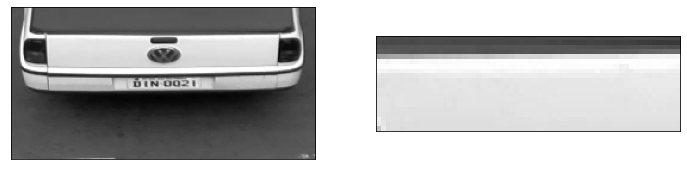

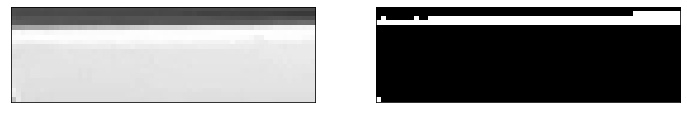

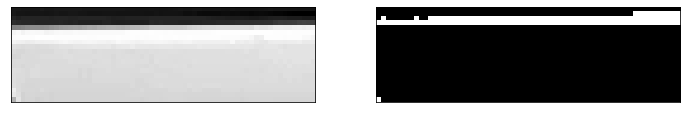

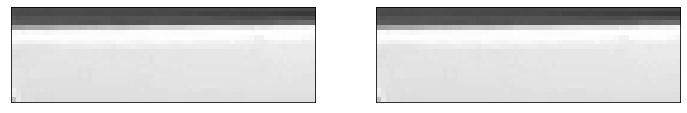

In [178]:
image_name = "/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/din-0021/2788.png"
img = cv.imread(image_name)
gt_bb = nameplate_ground_truth_path_to_bb_mapping[image_name]
ground_truth_nameplate = get_cropped_image(image_name,gt_bb)
plot_images(img,ground_truth_nameplate)
gray = cv.cvtColor(ground_truth_nameplate, cv.COLOR_BGR2GRAY)
print(gray.shape)
# blurred = gray.copy()

thresh = cv.adaptiveThreshold(gray, 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY_INV, 5, 15)
plot_images(ground_truth_nameplate,thresh)
character_boxes = character_segmentation(ground_truth_nameplate)
print(character_boxes)
overlay_characters_img(ground_truth_nameplate,character_boxes)

In [182]:
image_name = "/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/BinaryNamePlateBoxes/Camera2/Set03/classes_carros/din-0021/2788.png"
img = cv.imread(image_name)
